# Workflow for version 1: Training NGBoost for each time interval separately i.e. 96 different models for each time interval

## Step 1: Data Preparation
- Start with the ENTSO-E dataset at 15-minute intervals, containing: 
  - `power`,
  - `ws_10m_loc_1`, `ws_10m_loc_2`, ..., `ws_10m_loc_10`: wind speed at 10 biggest locations by installed capacity at 10m
  - `ws_100m_loc_1`, `ws_100m_loc_2`, ..., `ws_100m_loc_10` : wind speed at 10 biggest locations by installed capacity at 100m
  - `ws_10m_loc_mean`, `ws_100m_loc_mean` : Wind speed at the geographic center.


    | Date                   | Power  | ws_10m_loc_1 | ws_100m_loc_10 |
    |------------------------|--------|--------------|----------------|
    | 2016-01-01 00:00:00    | 1428.0 | 1.9000       | 5.0500         |
    | 2016-01-01 00:15:00    | 1379.0 | 1.9300       | 5.1675         |



## Step 2: Scaling Power
- Scale the power column to address log-normal distribution issues:  
  ```math
  \text{scaled\_power} = \frac{\text{power}}{\text{power\_max}} + \epsilon \quad (\epsilon \text{ to avoid zero values})

## Step 3: Convert Time Intervals
- Aggregate the 15-minute time intervals into daily intervals by:  
  - Creating one column for each 15-minute interval for all features in the dataset.
  e.g. the dataframe looks like this


    | Date       | power_00_00 | power_01_00 | ws_100m_loc_mean_21_30 | ws_100m_loc_mean_22_00 |
    |------------|-------------|-------------|------------------------|------------------------|
    | 2016-01-01 | 0.084000    | 0.089235    | 3.875                  | 4.19                   |
    | 2016-01-02 | 0.035000    | 0.043412    | 9.155                  | 8.76                   |
    | 2016-01-03 | 0.388235    | 0.390235    | ...                    | ...                    |


## Step 4: Workflow for Each 15-Minute Interval

1. **Filter Data**  
   - Isolate rows corresponding to the specific 15-minute interval of interest.  
   - Example: Filter rows for the `00:00` time interval.


        | Date       | Power  | ws_10m_loc_1 | ws_100m_loc_10 |
        |------------|--------|--------------|----------------|
        | 2016-01-01 | 1428.0 | 1.90         | 5.05           |
        | 2016-01-02 | 595.0  | 2.72         | 2.42           |


2. **Delay Power Column**  
   - Create a lagged feature by shifting the `power` column by one day:  
     ```
     P_t-1 = power.shift(1)
     ```

3. **Select Input Features**  
   - Choose input features for modeling based on the analysis needs:  
     - Wind speed at the 10 biggest locations for 10m, 100m  
       ```python
       ['power_t-1', 'ws_10m_loc_1', 'ws_10m_loc_2', ..., 'ws_10m_loc_10',
        'ws_100m_loc_1', 'ws_100m_loc_2', ..., 'ws_100m_loc_10']
       ```

4. **Dataset Splitting**  
   - Split the dataset into three subsets:  
     - **Train**: Data from 2016–2022.  
     - **Validation**: Data from 2023.  
     - **Test**: Data from 2024.  

   - Further split each subset into input (`X` not containing the variable to be predicted 'power') and output (`y` only 'power') components:  
     ```
     X_train, y_train
     X_validation, y_validation
     X_test, y_test
     ```

5. **Model Training**  
   - Train **NGBoost** to predict the power output distribution for the next day, for all 365 days of the validation dataset. (adheres to the scipy convention: log normal distribution is specified via `mu` and `sigma` i.e. the median of the variable and the standard deviation of the normal distribution is the exponent) 
   - Outputs:  
     - `model.predict`: This returns the point prediction i.e. the mean of the predicted distribution (`exp(mu + sigma^2/2)` for log-normal NGBoost).
     - `model.pred_dist`: Returns a distribution object
     - `model.pred_dist.params`: Returns the parameters (for a log normal is `s` = sigma and `scale`)
     - `model.pred_dist.scale`: Returns `s` = sigma even though the dictionary row is called `scale`
     - `model.pred_dist.loc`: Returns something we do not know
     - `model.pred_dist.params['scale']`: Returns the mean 
     cross check: y_train_dists.params['scale'][0] * np.exp(0.5*y_train_dists.params['s'][0]**2) = `model.predict[0]`


6. **Evaluation**  
   - Evaluate model performance on training and validation datasets:  
     - **CRPS Scores**:  
       - Measure how well the predicted distribution matches the actual values of `y`.  
     - **PIT Values**:  
       - Analyze the Probability Integral Transform values to assess model calibration.

- log normal distribution has 2 parameters: s (sigma) and scale (median)
- NGBoost returns
    - s --> model.pred_dist.scale
    - mean not the median which log normal expects: median -->  y_train_dists.params['scale'][0] * np.exp(0.5*y_train_dists.params['s'][0]**2)
NGBoost returns the mean and not the median

In [1]:
from analysis.datasets import load_entsoe
from analysis.transformations import minute_to_daily
from analysis.splits import to_train_validation_test_data
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from ngboost import NGBRegressor
from sklearn.metrics import mean_squared_error
from ngboost.scores import LogScore, CRPScore
from ngboost.distns import Normal
from ngboost.distns import LogNormal
from ngboost.distns.normal import NormalCRPScore

from scipy.stats import lognorm

from scipy.integrate import quad



### Helper methods to be moved into a package later

In [2]:
def get_all_intervals(df):
    # Generate all 96 intervals as strings in the format "HH_MM"
    intervals = [f"{str(h).zfill(2)}_{str(m).zfill(2)}" for h in range(24) for m in range(0, 60, 15)]
    
    return intervals

In [3]:
def get_columns_by_time(df, time: str):
    time = time.replace(':', '_')
    #columns = [c.removesuffix(f"_{time}") for c in df.columns if c.endswith(time)]
    columns = [c for c in df.columns if c.endswith(time)]

    selection = df.loc[:, columns]
    selection.columns = [c.removesuffix(f"_{time}") for c in selection.columns]
    return selection

def delay(df, delays: int | list[int], columns: None | str | list[str] = None):

    if columns is None:
        columns = df.columns
    elif isinstance(columns, str):
        columns = [columns]
        
    if isinstance(df, pd.Series):
        df = df.to_frame()

    dfs = [df]

    if isinstance(delays, int):
        delays = range(1, delays + 1)
    for t in delays:
        delayed_df = df.loc[:, columns].shift(t)
        delayed_df.columns = [f"{c}_t-{t}" for c in delayed_df.columns]
        dfs.append(delayed_df)
    vstacked_df = pd.concat(reversed(dfs), axis=1).dropna()
    return vstacked_df


import numpy as np

def prepare_and_select_features(time_interval, columns_to_include):

    df = load_entsoe()  # Load the dataframe containing aggregated power and wind speed at 10 locations and at geographic mean

    # Resample to daily data (each column represents a 15 minute time interval)
    df_daily = minute_to_daily(df)

    # Select by time interval
    df_daily_time = get_columns_by_time(df_daily, time_interval)

    # Delay the power column for lagged features
    df_daily_time_delay = delay(df_daily_time, delays=1, columns="power")  # delay the "power" column

    selected_columns = []


    if 'only_power' in columns_to_include:
        selected_columns = ['power_t-1']  # Always include power_t-1 as a baseline
    
    # Add additional columns based on the input argument 'columns_to_include'
    if 'all_wind_speeds' in columns_to_include:
        selected_columns = ['power_t-1']  # Always include power_t-1 as a baseline
        selected_columns.extend([col for col in df_daily_time_delay.columns if col.startswith('ws')])
        

    if 'only_sin_cos' in columns_to_include:
        selected_columns = ['power_t-1']  # Always include power_t-1 as a baseline
        # Add sine and cosine transformation for annual periodicity
        selected_columns.extend(['sin_day', 'cos_day'])
        
        df_daily_time_delay['day_of_year'] = df_daily_time_delay.index.dayofyear
        df_daily_time_delay['sin_day'] = np.sin(2 * np.pi * df_daily_time_delay['day_of_year'] / 365)
        df_daily_time_delay['cos_day'] = np.cos(2 * np.pi * df_daily_time_delay['day_of_year'] / 365)
        df_daily_time_delay = df_daily_time_delay.drop(columns="day_of_year")
    
    if 'only_mean_wind' in columns_to_include:
        selected_columns = ['power_t-1']  # Always include power_t-1 as a baseline
        # Add mean wind speed columns
        selected_columns.extend(['ws_100m_loc_mean', 'ws_10m_loc_mean'])

    # If no specific selection criteria are met, use the full dataframe (excluding 'power' column)


    if "max" in columns_to_include:

        selected_columns.extend([col for col in df_daily_time_delay.columns if col != "power"])
        #df_daily_time_delay = df_daily_time_delay.drop(columns=['power'])  # Exclude 'power' column
        df_daily_time_delay['day_of_year'] = df_daily_time_delay.index.dayofyear
        df_daily_time_delay['sin_day'] = np.sin(2 * np.pi * df_daily_time_delay['day_of_year'] / 365)
        df_daily_time_delay['cos_day'] = np.cos(2 * np.pi * df_daily_time_delay['day_of_year'] / 365)

        df_daily_time_delay = df_daily_time_delay.drop(columns="day_of_year")
        selected_columns.extend(['sin_day', 'cos_day'])



    
    # Ensure that only the columns that exist in the dataframe are included
    selected_columns = [col for col in selected_columns if col in df_daily_time_delay.columns]

    # Split the data into training and validation sets
    train, validation, test = to_train_validation_test_data(df_daily_time_delay, "2022-12-31", "2023-12-31")
    
    # Filter the training and validation sets to only the selected columns
    X_train = train[selected_columns]
    X_validation = validation[selected_columns]

    # Separate target variable 'power' for training and validation
    y_train = train['power']
    y_validation = validation['power']

    return X_train, y_train, X_validation, y_validation

def model_NGBoost(time, columns_to_include, epochs, lr, distribution, natural_gradient=True):

    random_seed = 42
    X_train, y_train, X_validation, y_validation = prepare_and_select_features(time, columns_to_include)
    
    model = NGBRegressor(Dist=distribution, Score=CRPScore, n_estimators=epochs, learning_rate=lr, verbose_eval=True, natural_gradient=natural_gradient, random_state=random_seed)

    model.fit(X_train, y_train, X_val=X_validation, Y_val=y_validation)

    # Predict on training data
    y_train_pred = model.predict(X_train)
    y_train_dists = model.pred_dist(X_train)


    y_val_pred = model.predict(X_validation)
    y_val_dists = model.pred_dist(X_validation)

    # Calculate Mean Squared Error (MSE) for training and validation
    train_mse = mean_squared_error(y_train, y_train_pred)
    val_mse = mean_squared_error(y_validation, y_val_pred)

    # Print the results
    print(f"Training features: {[c for c in X_train.columns]} -> {y_train.name}")
    print(f"Train MSE:\t {train_mse}")
    print(f"Validation MSE:\t {val_mse}")

    return y_train_pred, y_train_dists, y_val_pred, y_val_dists, X_train, y_train, X_validation, y_validation


def visualize_predictions_with_uncertainty(y_validation, y_val_pred, y_val_dists):
    start = 0
    end = 90
    x = y_validation.index[start:end]
    y = y_validation[start:end]
    mu = y_val_pred[start:end]
    print(mu)
    sigma = [y.scale for y in y_val_dists][start:end]  # Normal sigma
    lower_bound = mu - sigma  # Normal uncertainty band
    upper_bound = mu + sigma  # Normal uncertainty band

    # Plot
    plt.figure(figsize=(12, 8))
    plt.plot(x, y, label="True Values (y)", color="green", alpha=0.5)
    plt.plot(x, mu, label="Predicted Values (mu)", color="red", alpha=0.5)
    plt.fill_between(x, lower_bound, upper_bound, color="orange", alpha=0.3, label="Uncertainty Band (mu ± sigma)")

    # Customize the plot
    plt.xlabel("Index")
    plt.ylabel("Value")
    plt.title(f"True Values, Predictions, and Uncertainty Band")
    plt.legend()
    plt.grid(alpha=0.3)

    # Show the plot
    plt.show()


# Input wind speed at 10 locations for 10m, 100m CRPS loss

In [4]:
# Loading the entsoe data and scaling power to be in range 0-1
entsoe = load_entsoe()
max_power_value = entsoe['power'].max()
max_power_value_rounded = np.ceil(max_power_value / 1000) * 1000
epsilon = 1e-9 # Scaling power data to avoid problem of different time intervals having different minima power values
entsoe['power'] = entsoe['power'] / max_power_value_rounded + epsilon # scaling power values
daily = minute_to_daily(entsoe)

# Training
#selected_columns = ['power', 'power_t-1', 'ws_10m_loc_mean', 'ws_100m_loc_mean']
selected_columns = ['power', 'power_t-1', 'ws_10m_loc_1', 'ws_10m_loc_2', 'ws_10m_loc_3', 'ws_10m_loc_4', 'ws_10m_loc_5', 'ws_10m_loc_6', 'ws_10m_loc_7', 'ws_10m_loc_8', 'ws_10m_loc_9', 'ws_10m_loc_10', 'ws_100m_loc_1', 'ws_100m_loc_2', 'ws_100m_loc_3', 'ws_100m_loc_4', 'ws_100m_loc_5', 'ws_100m_loc_6', 'ws_100m_loc_7', 'ws_100m_loc_8', 'ws_100m_loc_9', 'ws_100m_loc_10']

all_columns = ['power', 
               'ws_10m_loc_1', 'ws_10m_loc_2', 'ws_10m_loc_3', 'ws_10m_loc_4', 'ws_10m_loc_5', 
               'ws_10m_loc_6', 'ws_10m_loc_7', 'ws_10m_loc_8', 'ws_10m_loc_9', 'ws_10m_loc_10',
               'ws_10m_loc_mean', 'ws_100m_loc_mean',
                'ws_100m_loc_1', 'ws_100m_loc_2', 'ws_100m_loc_3', 'ws_100m_loc_4', 'ws_100m_loc_5',
                'ws_100m_loc_6', 'ws_100m_loc_7', 'ws_100m_loc_8', 'ws_100m_loc_9', 'ws_100m_loc_10'
]
intervals = get_all_intervals(daily)
Dist = LogNormal
Score = CRPScore
#tol=1e-1
#Score = LogScore
n_estimators = 100
learning_rate = 0.03
verbose = True
verbose_eval = True
natural_gradient = True
random_state = 42


Data loaded and transformed successfully. Shape of DataFrame: (78912, 22)


### Algorithm

In [5]:
model_scores = [] # score that was used to train the model
model_scores_tr = [] # score that was used to train the model
all_interval_pit_values = {}
all_interval_pit_values_tr = {}
nll_log_scores = []
all_interval_nll_scores_tr = {}
all_interval_nll_scores = {}


for interval in intervals:

    filtered_df = get_columns_by_time(daily, interval)

    filtered_df = delay(filtered_df, delays=1, columns="power")

    filtered_df = filtered_df[selected_columns]

    train, validation, test = to_train_validation_test_data(filtered_df, "2022-12-31", "2023-12-31")

    X_train = train.drop('power', axis=1)
    y_train = train['power']

    X_validation = validation.drop('power', axis=1)
    y_validation = validation['power']

    model = NGBRegressor(Dist=Dist, Score=Score, n_estimators=n_estimators, learning_rate=learning_rate, verbose=verbose, verbose_eval=verbose_eval, natural_gradient=natural_gradient, random_state=random_state)
    model.fit(X_train, y_train, X_val=X_validation, Y_val=y_validation)
    
    y_train_pred = model.predict(X_train) # this returns the mean
    y_train_dists = model.pred_dist(X_train) # this returns a distribution object


    y_val_pred = model.predict(X_validation)
    y_val_dists = model.pred_dist(X_validation)

    train_mse = mean_squared_error(y_train, y_train_pred)
    val_mse = mean_squared_error(y_validation, y_val_pred)

    interval_pit_values = []
    interval_bin_values_tr = []

    model_scores.append(model.score(X_validation, y_validation))
    #log_scores.append(model.(X_validation, y_validation))

    model_scores_tr.append(model.score(X_train, y_train))


    print(f"Training features: {[c for c in X_train.columns]} -> {y_train.name}")
    print(f"Train MSE:\t {train_mse}")
    print(f"Validation MSE:\t {val_mse}")
    print("training nll:", -y_train_dists.logpdf(y_train).mean())


    #for i in range(len(y_train_pred)):
        #y = y_train[i]
        #mean = y_train_pred[i] #pred returns the mean not the median
        #median = mean * np.exp(-0.5 * y_train_dists[i].scale**2)
        #median = np.exp(y_train_dists[0:5].loc) # is another way to calculate the scale argument e^mu of the log normal distribution
        #sigma = y_train_dists[i].scale
        #print(f"Prediction: {y}, Median: {median}, Sigma: {sigma}")

        # Calculate the CDF (quantiles) for the true value
        #pit_value_tr = lognorm.cdf(y, s=sigma, scale=median)
        #nll_value_tr = lognorm.logpdf(y, s=sigma, scale=median)

        #interval_bin_values_tr.append(pit_value_tr)
        #nll_log_scores.append(nll_value_tr)
    
    
    # simpler way to get the nll log score:
    nll_log_scores_tr = - y_train_dists.logpdf(y_train).mean()

    interval_pit_values_tr = y_train_dists.dist.cdf(y_train)


    for i in range(len(y_val_pred)):
        y = y_validation[i]
        #crps_i = quad((y_val_dists.dist.cdf(y))**2, -np.inf, y)
        #mean = y_val_pred[i] #pred returns the mean not the median
        #median = mean * np.exp(-0.5 * y_val_dists[i].scale**2)
        #sigma = y_val_dists[i].scale


        # Calculate the CDF (quantiles) for the true value
        #pit_value = lognorm.cdf(y, s=sigma, scale=median)

        #interval_pit_values.append(pit_value)
    
    nll_log_scores = - y_val_dists.logpdf(y_validation).mean()
    interval_pit_values = y_val_dists.dist.cdf(y_validation)


    #values, bin_edges, patches = plt.hist(interval_pit_values, bins=10, range=(0, 1), density=True, alpha=0.7, color='blue', edgecolor='black')
    #plt.show()
    all_interval_pit_values[interval] = interval_pit_values
    all_interval_pit_values_tr[interval] = interval_pit_values_tr
    #all_interval_nll_scores_tr[interval] = - np.mean(nll_log_scores)
    all_interval_nll_scores_tr[interval] = nll_log_scores_tr
    all_interval_nll_scores[interval] = nll_log_scores

# of training observations: 2556 | 77.76%
# of validation observations: 365 | 11.10%
# of test observations: 366 | 11.13%
[iter 0] loss=0.5552 val_loss=0.5761 scale=1.0000 norm=1.1868
[iter 1] loss=0.5374 val_loss=0.5591 scale=1.0000 norm=1.1585
[iter 2] loss=0.5208 val_loss=0.5431 scale=1.0000 norm=1.1345
[iter 3] loss=0.5050 val_loss=0.5277 scale=1.0000 norm=1.1139
[iter 4] loss=0.4899 val_loss=0.5128 scale=1.0000 norm=1.0960
[iter 5] loss=0.4758 val_loss=0.4986 scale=1.0000 norm=1.0813
[iter 6] loss=0.4623 val_loss=0.4853 scale=1.0000 norm=1.0689
[iter 7] loss=0.4495 val_loss=0.4730 scale=1.0000 norm=1.0589
[iter 8] loss=0.4371 val_loss=0.4612 scale=1.0000 norm=1.0505
[iter 9] loss=0.4253 val_loss=0.4498 scale=1.0000 norm=1.0439
[iter 10] loss=0.4140 val_loss=0.4388 scale=1.0000 norm=1.0392
[iter 11] loss=0.4032 val_loss=0.4283 scale=1.0000 norm=1.0361
[iter 12] loss=0.3926 val_loss=0.4180 scale=1.0000 norm=1.0346
[iter 13] loss=0.3825 val_loss=0.4082 scale=1.0000 norm=1.0346
[iter 

C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=0.5213 val_loss=0.5448 scale=1.0000 norm=1.1347
[iter 3] loss=0.5053 val_loss=0.5293 scale=1.0000 norm=1.1137
[iter 4] loss=0.4902 val_loss=0.5145 scale=1.0000 norm=1.0960
[iter 5] loss=0.4757 val_loss=0.5009 scale=1.0000 norm=1.0805
[iter 6] loss=0.4621 val_loss=0.4876 scale=1.0000 norm=1.0680
[iter 7] loss=0.4491 val_loss=0.4748 scale=1.0000 norm=1.0576
[iter 8] loss=0.4366 val_loss=0.4630 scale=1.0000 norm=1.0490
[iter 9] loss=0.4247 val_loss=0.4517 scale=1.0000 norm=1.0425
[iter 10] loss=0.4132 val_loss=0.4404 scale=1.0000 norm=1.0376
[iter 11] loss=0.4021 val_loss=0.4298 scale=1.0000 norm=1.0345
[iter 12] loss=0.3915 val_loss=0.4194 scale=1.0000 norm=1.0331
[iter 13] loss=0.3812 val_loss=0.4093 scale=1.0000 norm=1.0331
[iter 14] loss=0.3714 val_loss=0.3997 scale=1.0000 norm=1.0345
[iter 15] loss=0.3618 val_loss=0.3909 scale=1.0000 norm=1.0374
[iter 16] loss=0.3527 val_loss=0.3820 scale=1.0000 norm=1.0415
[iter 17] loss=0.3437 val_loss=0.3735 scale=1.0000 norm=1.0469


C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=0.5249 val_loss=0.5492 scale=1.0000 norm=1.1325
[iter 3] loss=0.5088 val_loss=0.5333 scale=1.0000 norm=1.1116
[iter 4] loss=0.4936 val_loss=0.5187 scale=1.0000 norm=1.0937
[iter 5] loss=0.4792 val_loss=0.5045 scale=1.0000 norm=1.0784
[iter 6] loss=0.4654 val_loss=0.4911 scale=1.0000 norm=1.0656
[iter 7] loss=0.4523 val_loss=0.4783 scale=1.0000 norm=1.0549
[iter 8] loss=0.4397 val_loss=0.4660 scale=1.0000 norm=1.0464
[iter 9] loss=0.4276 val_loss=0.4544 scale=1.0000 norm=1.0396
[iter 10] loss=0.4161 val_loss=0.4435 scale=1.0000 norm=1.0348
[iter 11] loss=0.4049 val_loss=0.4327 scale=1.0000 norm=1.0315
[iter 12] loss=0.3943 val_loss=0.4223 scale=1.0000 norm=1.0298
[iter 13] loss=0.3840 val_loss=0.4122 scale=1.0000 norm=1.0296
[iter 14] loss=0.3742 val_loss=0.4026 scale=1.0000 norm=1.0307
[iter 15] loss=0.3646 val_loss=0.3934 scale=1.0000 norm=1.0333
[iter 16] loss=0.3553 val_loss=0.3844 scale=1.0000 norm=1.0373
[iter 17] loss=0.3462 val_loss=0.3758 scale=1.0000 norm=1.0428


C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=0.5291 val_loss=0.5561 scale=1.0000 norm=1.1289
[iter 3] loss=0.5131 val_loss=0.5403 scale=1.0000 norm=1.1084
[iter 4] loss=0.4979 val_loss=0.5258 scale=1.0000 norm=1.0906
[iter 5] loss=0.4835 val_loss=0.5116 scale=1.0000 norm=1.0758
[iter 6] loss=0.4697 val_loss=0.4983 scale=1.0000 norm=1.0630
[iter 7] loss=0.4567 val_loss=0.4856 scale=1.0000 norm=1.0527
[iter 8] loss=0.4441 val_loss=0.4733 scale=1.0000 norm=1.0441
[iter 9] loss=0.4320 val_loss=0.4617 scale=1.0000 norm=1.0373
[iter 10] loss=0.4205 val_loss=0.4507 scale=1.0000 norm=1.0323
[iter 11] loss=0.4095 val_loss=0.4398 scale=1.0000 norm=1.0291
[iter 12] loss=0.3987 val_loss=0.4294 scale=1.0000 norm=1.0271
[iter 13] loss=0.3885 val_loss=0.4193 scale=1.0000 norm=1.0266
[iter 14] loss=0.3785 val_loss=0.4094 scale=1.0000 norm=1.0277
[iter 15] loss=0.3688 val_loss=0.3999 scale=1.0000 norm=1.0301
[iter 16] loss=0.3594 val_loss=0.3910 scale=1.0000 norm=1.0338
[iter 17] loss=0.3504 val_loss=0.3821 scale=1.0000 norm=1.0387


C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=0.5169 val_loss=0.5452 scale=1.0000 norm=1.1049
[iter 4] loss=0.5019 val_loss=0.5301 scale=1.0000 norm=1.0876
[iter 5] loss=0.4874 val_loss=0.5158 scale=1.0000 norm=1.0727
[iter 6] loss=0.4737 val_loss=0.5021 scale=1.0000 norm=1.0603
[iter 7] loss=0.4606 val_loss=0.4895 scale=1.0000 norm=1.0498
[iter 8] loss=0.4481 val_loss=0.4773 scale=1.0000 norm=1.0413
[iter 9] loss=0.4362 val_loss=0.4655 scale=1.0000 norm=1.0346
[iter 10] loss=0.4246 val_loss=0.4542 scale=1.0000 norm=1.0294
[iter 11] loss=0.4135 val_loss=0.4434 scale=1.0000 norm=1.0258
[iter 12] loss=0.4029 val_loss=0.4333 scale=1.0000 norm=1.0238
[iter 13] loss=0.3927 val_loss=0.4235 scale=1.0000 norm=1.0232
[iter 14] loss=0.3828 val_loss=0.4138 scale=1.0000 norm=1.0239
[iter 15] loss=0.3732 val_loss=0.4043 scale=1.0000 norm=1.0260
[iter 16] loss=0.3638 val_loss=0.3953 scale=1.0000 norm=1.0293
[iter 17] loss=0.3548 val_loss=0.3868 scale=1.0000 norm=1.0340
[iter 18] loss=0.3460 val_loss=0.3786 scale=1.0000 norm=1.0397

C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 1] loss=0.5521 val_loss=0.5789 scale=1.0000 norm=1.1460
[iter 2] loss=0.5351 val_loss=0.5619 scale=1.0000 norm=1.1225
[iter 3] loss=0.5192 val_loss=0.5461 scale=1.0000 norm=1.1024
[iter 4] loss=0.5039 val_loss=0.5311 scale=1.0000 norm=1.0848
[iter 5] loss=0.4896 val_loss=0.5167 scale=1.0000 norm=1.0701
[iter 6] loss=0.4758 val_loss=0.5030 scale=1.0000 norm=1.0575
[iter 7] loss=0.4626 val_loss=0.4905 scale=1.0000 norm=1.0469
[iter 8] loss=0.4501 val_loss=0.4783 scale=1.0000 norm=1.0386
[iter 9] loss=0.4382 val_loss=0.4661 scale=1.0000 norm=1.0319
[iter 10] loss=0.4265 val_loss=0.4546 scale=1.0000 norm=1.0267
[iter 11] loss=0.4154 val_loss=0.4434 scale=1.0000 norm=1.0231
[iter 12] loss=0.4047 val_loss=0.4328 scale=1.0000 norm=1.0207
[iter 13] loss=0.3943 val_loss=0.4226 scale=1.0000 norm=1.0199
[iter 14] loss=0.3843 val_loss=0.4124 scale=1.0000 norm=1.0206
[iter 15] loss=0.3746 val_loss=0.4030 scale=1.0000 norm=1.0224
[iter 16] loss=0.3650 val_loss=0.3936 scale=1.0000 norm=1.0254
[

c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_di

[iter 93] loss=0.1318 val_loss=0.1848 scale=0.0039 norm=0.0161
[iter 94] loss=0.1318 val_loss=0.1848 scale=0.0078 norm=0.0311
[iter 95] loss=0.1318 val_loss=0.1848 scale=0.0156 norm=0.0596
[iter 96] loss=0.1318 val_loss=0.1848 scale=0.0312 norm=0.1154
[iter 97] loss=0.1318 val_loss=0.1848 scale=0.0078 norm=0.0285


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C


[iter 98] loss=0.1318 val_loss=0.1848 scale=0.0312 norm=0.1091
[iter 99] loss=0.1317 val_loss=0.1845 scale=0.5000 norm=1.7043
Training features: ['power_t-1', 'ws_10m_loc_1', 'ws_10m_loc_2', 'ws_10m_loc_3', 'ws_10m_loc_4', 'ws_10m_loc_5', 'ws_10m_loc_6', 'ws_10m_loc_7', 'ws_10m_loc_8', 'ws_10m_loc_9', 'ws_10m_loc_10', 'ws_100m_loc_1', 'ws_100m_loc_2', 'ws_100m_loc_3', 'ws_100m_loc_4', 'ws_100m_loc_5', 'ws_100m_loc_6', 'ws_100m_loc_7', 'ws_100m_loc_8', 'ws_100m_loc_9', 'ws_100m_loc_10'] -> power
Train MSE:	 0.0013213600048595224
Validation MSE:	 0.0032416450794757194
training nll: -2.088708980996606
# of training observations: 2556 | 77.76%
# of validation observations: 365 | 11.10%
# of test observations: 366 | 11.13%
[iter 0] loss=0.5726 val_loss=0.5999 scale=1.0000 norm=1.1715
[iter 1] loss=0.5546 val_loss=0.5820 scale=1.0000 norm=1.1441
[iter 2] loss=0.5376 val_loss=0.5653 scale=1.0000 norm=1.1205


C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=0.5215 val_loss=0.5494 scale=1.0000 norm=1.1003
[iter 4] loss=0.5062 val_loss=0.5342 scale=1.0000 norm=1.0827
[iter 5] loss=0.4918 val_loss=0.5198 scale=1.0000 norm=1.0680
[iter 6] loss=0.4781 val_loss=0.5061 scale=1.0000 norm=1.0553
[iter 7] loss=0.4649 val_loss=0.4933 scale=1.0000 norm=1.0447
[iter 8] loss=0.4523 val_loss=0.4811 scale=1.0000 norm=1.0363
[iter 9] loss=0.4403 val_loss=0.4692 scale=1.0000 norm=1.0294
[iter 10] loss=0.4286 val_loss=0.4577 scale=1.0000 norm=1.0241
[iter 11] loss=0.4174 val_loss=0.4466 scale=1.0000 norm=1.0202
[iter 12] loss=0.4065 val_loss=0.4359 scale=1.0000 norm=1.0180
[iter 13] loss=0.3962 val_loss=0.4257 scale=1.0000 norm=1.0171
[iter 14] loss=0.3861 val_loss=0.4158 scale=1.0000 norm=1.0175
[iter 15] loss=0.3764 val_loss=0.4063 scale=1.0000 norm=1.0194
[iter 16] loss=0.3670 val_loss=0.3971 scale=1.0000 norm=1.0224
[iter 17] loss=0.3580 val_loss=0.3879 scale=1.0000 norm=1.0267
[iter 18] loss=0.3491 val_loss=0.3789 scale=1.0000 norm=1.0323

C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=0.5236 val_loss=0.5530 scale=1.0000 norm=1.0996
[iter 4] loss=0.5084 val_loss=0.5378 scale=1.0000 norm=1.0822
[iter 5] loss=0.4938 val_loss=0.5234 scale=1.0000 norm=1.0671
[iter 6] loss=0.4800 val_loss=0.5097 scale=1.0000 norm=1.0544
[iter 7] loss=0.4668 val_loss=0.4966 scale=1.0000 norm=1.0438
[iter 8] loss=0.4542 val_loss=0.4838 scale=1.0000 norm=1.0353
[iter 9] loss=0.4419 val_loss=0.4719 scale=1.0000 norm=1.0283
[iter 10] loss=0.4303 val_loss=0.4605 scale=1.0000 norm=1.0230
[iter 11] loss=0.4192 val_loss=0.4492 scale=1.0000 norm=1.0193
[iter 12] loss=0.4084 val_loss=0.4387 scale=1.0000 norm=1.0171
[iter 13] loss=0.3979 val_loss=0.4285 scale=1.0000 norm=1.0160
[iter 14] loss=0.3880 val_loss=0.4187 scale=1.0000 norm=1.0166
[iter 15] loss=0.3783 val_loss=0.4090 scale=1.0000 norm=1.0183
[iter 16] loss=0.3689 val_loss=0.3999 scale=1.0000 norm=1.0212
[iter 17] loss=0.3598 val_loss=0.3910 scale=1.0000 norm=1.0254
[iter 18] loss=0.3509 val_loss=0.3823 scale=1.0000 norm=1.0309

C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=0.5248 val_loss=0.5542 scale=1.0000 norm=1.0992
[iter 4] loss=0.5095 val_loss=0.5394 scale=1.0000 norm=1.0818
[iter 5] loss=0.4951 val_loss=0.5251 scale=1.0000 norm=1.0670
[iter 6] loss=0.4813 val_loss=0.5116 scale=1.0000 norm=1.0545
[iter 7] loss=0.4681 val_loss=0.4984 scale=1.0000 norm=1.0439
[iter 8] loss=0.4555 val_loss=0.4860 scale=1.0000 norm=1.0353
[iter 9] loss=0.4435 val_loss=0.4739 scale=1.0000 norm=1.0285
[iter 10] loss=0.4319 val_loss=0.4628 scale=1.0000 norm=1.0230
[iter 11] loss=0.4208 val_loss=0.4518 scale=1.0000 norm=1.0192
[iter 12] loss=0.4100 val_loss=0.4413 scale=1.0000 norm=1.0167
[iter 13] loss=0.3997 val_loss=0.4312 scale=1.0000 norm=1.0158
[iter 14] loss=0.3898 val_loss=0.4214 scale=1.0000 norm=1.0163
[iter 15] loss=0.3801 val_loss=0.4118 scale=1.0000 norm=1.0180
[iter 16] loss=0.3708 val_loss=0.4027 scale=1.0000 norm=1.0208
[iter 17] loss=0.3616 val_loss=0.3937 scale=1.0000 norm=1.0250
[iter 18] loss=0.3529 val_loss=0.3851 scale=1.0000 norm=1.0304

C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=0.5421 val_loss=0.5713 scale=1.0000 norm=1.1177
[iter 3] loss=0.5258 val_loss=0.5550 scale=1.0000 norm=1.0971
[iter 4] loss=0.5104 val_loss=0.5398 scale=1.0000 norm=1.0795
[iter 5] loss=0.4958 val_loss=0.5254 scale=1.0000 norm=1.0646
[iter 6] loss=0.4819 val_loss=0.5118 scale=1.0000 norm=1.0519
[iter 7] loss=0.4686 val_loss=0.4988 scale=1.0000 norm=1.0412
[iter 8] loss=0.4559 val_loss=0.4865 scale=1.0000 norm=1.0324
[iter 9] loss=0.4438 val_loss=0.4744 scale=1.0000 norm=1.0256
[iter 10] loss=0.4320 val_loss=0.4629 scale=1.0000 norm=1.0201
[iter 11] loss=0.4208 val_loss=0.4516 scale=1.0000 norm=1.0163
[iter 12] loss=0.4099 val_loss=0.4410 scale=1.0000 norm=1.0139
[iter 13] loss=0.3995 val_loss=0.4309 scale=1.0000 norm=1.0131
[iter 14] loss=0.3894 val_loss=0.4209 scale=1.0000 norm=1.0136
[iter 15] loss=0.3797 val_loss=0.4112 scale=1.0000 norm=1.0154
[iter 16] loss=0.3702 val_loss=0.4018 scale=1.0000 norm=1.0184
[iter 17] loss=0.3609 val_loss=0.3931 scale=1.0000 norm=1.0226


C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=0.5433 val_loss=0.5738 scale=1.0000 norm=1.1173
[iter 3] loss=0.5271 val_loss=0.5578 scale=1.0000 norm=1.0970
[iter 4] loss=0.5117 val_loss=0.5424 scale=1.0000 norm=1.0796
[iter 5] loss=0.4970 val_loss=0.5280 scale=1.0000 norm=1.0643
[iter 6] loss=0.4829 val_loss=0.5141 scale=1.0000 norm=1.0513
[iter 7] loss=0.4696 val_loss=0.5009 scale=1.0000 norm=1.0407
[iter 8] loss=0.4568 val_loss=0.4882 scale=1.0000 norm=1.0317
[iter 9] loss=0.4446 val_loss=0.4759 scale=1.0000 norm=1.0246
[iter 10] loss=0.4329 val_loss=0.4643 scale=1.0000 norm=1.0192
[iter 11] loss=0.4215 val_loss=0.4531 scale=1.0000 norm=1.0152
[iter 12] loss=0.4105 val_loss=0.4424 scale=1.0000 norm=1.0124
[iter 13] loss=0.4000 val_loss=0.4318 scale=1.0000 norm=1.0114
[iter 14] loss=0.3898 val_loss=0.4218 scale=1.0000 norm=1.0115
[iter 15] loss=0.3800 val_loss=0.4118 scale=1.0000 norm=1.0131
[iter 16] loss=0.3705 val_loss=0.4026 scale=1.0000 norm=1.0159
[iter 17] loss=0.3613 val_loss=0.3938 scale=1.0000 norm=1.0200


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.p

[iter 94] loss=0.1335 val_loss=0.1842 scale=0.0039 norm=0.0156
[iter 95] loss=0.1335 val_loss=0.1842 scale=0.0039 norm=0.0147
[iter 96] loss=0.1335 val_loss=0.1842 scale=0.0078 norm=0.0284


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens


[iter 97] loss=0.1335 val_loss=0.1842 scale=0.0156 norm=0.0546
[iter 98] loss=0.1334 val_loss=0.1840 scale=0.1250 norm=0.4237
[iter 99] loss=0.1333 val_loss=0.1836 scale=0.5000 norm=1.7051
Training features: ['power_t-1', 'ws_10m_loc_1', 'ws_10m_loc_2', 'ws_10m_loc_3', 'ws_10m_loc_4', 'ws_10m_loc_5', 'ws_10m_loc_6', 'ws_10m_loc_7', 'ws_10m_loc_8', 'ws_10m_loc_9', 'ws_10m_loc_10', 'ws_100m_loc_1', 'ws_100m_loc_2', 'ws_100m_loc_3', 'ws_100m_loc_4', 'ws_100m_loc_5', 'ws_100m_loc_6', 'ws_100m_loc_7', 'ws_100m_loc_8', 'ws_100m_loc_9', 'ws_100m_loc_10'] -> power
Train MSE:	 0.0012961298916373206
Validation MSE:	 0.0031668972319859076
training nll: -2.1003549441821328
# of training observations: 2556 | 77.76%
# of validation observations: 365 | 11.10%
# of test observations: 366 | 11.13%
[iter 0] loss=0.5814 val_loss=0.6121 scale=1.0000 norm=1.1666
[iter 1] loss=0.5631 val_loss=0.5939 scale=1.0000 norm=1.1394


C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=0.5458 val_loss=0.5769 scale=1.0000 norm=1.1158
[iter 3] loss=0.5295 val_loss=0.5606 scale=1.0000 norm=1.0953
[iter 4] loss=0.5141 val_loss=0.5451 scale=1.0000 norm=1.0779
[iter 5] loss=0.4994 val_loss=0.5304 scale=1.0000 norm=1.0628
[iter 6] loss=0.4854 val_loss=0.5164 scale=1.0000 norm=1.0501
[iter 7] loss=0.4720 val_loss=0.5030 scale=1.0000 norm=1.0393
[iter 8] loss=0.4592 val_loss=0.4900 scale=1.0000 norm=1.0305
[iter 9] loss=0.4470 val_loss=0.4780 scale=1.0000 norm=1.0234
[iter 10] loss=0.4352 val_loss=0.4662 scale=1.0000 norm=1.0177
[iter 11] loss=0.4239 val_loss=0.4550 scale=1.0000 norm=1.0138
[iter 12] loss=0.4130 val_loss=0.4441 scale=1.0000 norm=1.0111
[iter 13] loss=0.4024 val_loss=0.4336 scale=1.0000 norm=1.0097
[iter 14] loss=0.3922 val_loss=0.4237 scale=1.0000 norm=1.0098
[iter 15] loss=0.3824 val_loss=0.4139 scale=1.0000 norm=1.0112
[iter 16] loss=0.3728 val_loss=0.4045 scale=1.0000 norm=1.0137
[iter 17] loss=0.3635 val_loss=0.3953 scale=1.0000 norm=1.0176


C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=0.5477 val_loss=0.5752 scale=1.0000 norm=1.1153
[iter 3] loss=0.5314 val_loss=0.5589 scale=1.0000 norm=1.0950
[iter 4] loss=0.5159 val_loss=0.5436 scale=1.0000 norm=1.0774
[iter 5] loss=0.5013 val_loss=0.5293 scale=1.0000 norm=1.0625
[iter 6] loss=0.4874 val_loss=0.5153 scale=1.0000 norm=1.0497
[iter 7] loss=0.4740 val_loss=0.5021 scale=1.0000 norm=1.0389
[iter 8] loss=0.4613 val_loss=0.4892 scale=1.0000 norm=1.0299
[iter 9] loss=0.4489 val_loss=0.4771 scale=1.0000 norm=1.0227
[iter 10] loss=0.4372 val_loss=0.4658 scale=1.0000 norm=1.0170
[iter 11] loss=0.4259 val_loss=0.4546 scale=1.0000 norm=1.0130
[iter 12] loss=0.4150 val_loss=0.4439 scale=1.0000 norm=1.0102
[iter 13] loss=0.4045 val_loss=0.4336 scale=1.0000 norm=1.0089
[iter 14] loss=0.3944 val_loss=0.4237 scale=1.0000 norm=1.0089
[iter 15] loss=0.3846 val_loss=0.4136 scale=1.0000 norm=1.0101
[iter 16] loss=0.3750 val_loss=0.4043 scale=1.0000 norm=1.0124
[iter 17] loss=0.3658 val_loss=0.3952 scale=1.0000 norm=1.0160


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.p

[iter 89] loss=0.1374 val_loss=0.1798 scale=0.0010 norm=0.0048
[iter 90] loss=0.1373 val_loss=0.1798 scale=0.0020 norm=0.0088
[iter 91] loss=0.1373 val_loss=0.1797 scale=0.0039 norm=0.0157


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.p

[iter 92] loss=0.1373 val_loss=0.1797 scale=0.0078 norm=0.0279
[iter 93] loss=0.1373 val_loss=0.1797 scale=0.0312 norm=0.1044
[iter 94] loss=0.1373 val_loss=0.1795 scale=0.2500 norm=0.8205


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.p

[iter 95] loss=0.1370 val_loss=0.1795 scale=0.0010 norm=0.0047
[iter 96] loss=0.1370 val_loss=0.1795 scale=0.0020 norm=0.0088
[iter 97] loss=0.1370 val_loss=0.1795 scale=0.0020 norm=0.0079


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.p

[iter 98] loss=0.1370 val_loss=0.1795 scale=0.0039 norm=0.0149
[iter 99] loss=0.1370 val_loss=0.1795 scale=0.0078 norm=0.0278
Training features: ['power_t-1', 'ws_10m_loc_1', 'ws_10m_loc_2', 'ws_10m_loc_3', 'ws_10m_loc_4', 'ws_10m_loc_5', 'ws_10m_loc_6', 'ws_10m_loc_7', 'ws_10m_loc_8', 'ws_10m_loc_9', 'ws_10m_loc_10', 'ws_100m_loc_1', 'ws_100m_loc_2', 'ws_100m_loc_3', 'ws_100m_loc_4', 'ws_100m_loc_5', 'ws_100m_loc_6', 'ws_100m_loc_7', 'ws_100m_loc_8', 'ws_100m_loc_9', 'ws_100m_loc_10'] -> power
Train MSE:	 0.0014110696676392347
Validation MSE:	 0.003133034373700236
training nll: -2.07813831598152
# of training observations: 2556 | 77.76%
# of validation observations: 365 | 11.10%
# of test observations: 366 | 11.13%
[iter 0] loss=0.5847 val_loss=0.6091 scale=1.0000 norm=1.1626
[iter 1] loss=0.5666 val_loss=0.5912 scale=1.0000 norm=1.1361


C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=0.5493 val_loss=0.5740 scale=1.0000 norm=1.1128
[iter 3] loss=0.5330 val_loss=0.5581 scale=1.0000 norm=1.0929
[iter 4] loss=0.5176 val_loss=0.5427 scale=1.0000 norm=1.0755
[iter 5] loss=0.5028 val_loss=0.5278 scale=1.0000 norm=1.0604
[iter 6] loss=0.4888 val_loss=0.5136 scale=1.0000 norm=1.0476
[iter 7] loss=0.4754 val_loss=0.5001 scale=1.0000 norm=1.0366
[iter 8] loss=0.4626 val_loss=0.4875 scale=1.0000 norm=1.0278
[iter 9] loss=0.4503 val_loss=0.4752 scale=1.0000 norm=1.0206
[iter 10] loss=0.4386 val_loss=0.4633 scale=1.0000 norm=1.0152
[iter 11] loss=0.4271 val_loss=0.4521 scale=1.0000 norm=1.0109
[iter 12] loss=0.4163 val_loss=0.4412 scale=1.0000 norm=1.0082
[iter 13] loss=0.4057 val_loss=0.4307 scale=1.0000 norm=1.0067
[iter 14] loss=0.3956 val_loss=0.4207 scale=1.0000 norm=1.0066
[iter 15] loss=0.3857 val_loss=0.4109 scale=1.0000 norm=1.0077
[iter 16] loss=0.3762 val_loss=0.4015 scale=1.0000 norm=1.0102
[iter 17] loss=0.3669 val_loss=0.3925 scale=1.0000 norm=1.0139


C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=0.5510 val_loss=0.5746 scale=1.0000 norm=1.1117
[iter 3] loss=0.5346 val_loss=0.5582 scale=1.0000 norm=1.0915
[iter 4] loss=0.5191 val_loss=0.5430 scale=1.0000 norm=1.0741
[iter 5] loss=0.5044 val_loss=0.5283 scale=1.0000 norm=1.0593
[iter 6] loss=0.4903 val_loss=0.5145 scale=1.0000 norm=1.0465
[iter 7] loss=0.4769 val_loss=0.5010 scale=1.0000 norm=1.0357
[iter 8] loss=0.4642 val_loss=0.4883 scale=1.0000 norm=1.0269
[iter 9] loss=0.4519 val_loss=0.4762 scale=1.0000 norm=1.0199
[iter 10] loss=0.4400 val_loss=0.4646 scale=1.0000 norm=1.0141
[iter 11] loss=0.4286 val_loss=0.4532 scale=1.0000 norm=1.0101
[iter 12] loss=0.4177 val_loss=0.4423 scale=1.0000 norm=1.0073
[iter 13] loss=0.4071 val_loss=0.4320 scale=1.0000 norm=1.0061
[iter 14] loss=0.3969 val_loss=0.4220 scale=1.0000 norm=1.0058
[iter 15] loss=0.3871 val_loss=0.4122 scale=1.0000 norm=1.0070
[iter 16] loss=0.3775 val_loss=0.4028 scale=1.0000 norm=1.0095
[iter 17] loss=0.3682 val_loss=0.3935 scale=1.0000 norm=1.0131


C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=0.5546 val_loss=0.5795 scale=1.0000 norm=1.1076
[iter 3] loss=0.5384 val_loss=0.5634 scale=1.0000 norm=1.0880
[iter 4] loss=0.5230 val_loss=0.5480 scale=1.0000 norm=1.0711
[iter 5] loss=0.5083 val_loss=0.5332 scale=1.0000 norm=1.0564
[iter 6] loss=0.4943 val_loss=0.5193 scale=1.0000 norm=1.0439
[iter 7] loss=0.4809 val_loss=0.5061 scale=1.0000 norm=1.0331
[iter 8] loss=0.4681 val_loss=0.4934 scale=1.0000 norm=1.0242
[iter 9] loss=0.4558 val_loss=0.4812 scale=1.0000 norm=1.0170
[iter 10] loss=0.4441 val_loss=0.4694 scale=1.0000 norm=1.0114
[iter 11] loss=0.4327 val_loss=0.4583 scale=1.0000 norm=1.0072
[iter 12] loss=0.4219 val_loss=0.4474 scale=1.0000 norm=1.0045
[iter 13] loss=0.4113 val_loss=0.4369 scale=1.0000 norm=1.0029
[iter 14] loss=0.4012 val_loss=0.4266 scale=1.0000 norm=1.0029
[iter 15] loss=0.3914 val_loss=0.4165 scale=1.0000 norm=1.0039
[iter 16] loss=0.3818 val_loss=0.4070 scale=1.0000 norm=1.0060
[iter 17] loss=0.3725 val_loss=0.3978 scale=1.0000 norm=1.0095


C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=0.5564 val_loss=0.5803 scale=1.0000 norm=1.1089
[iter 3] loss=0.5402 val_loss=0.5648 scale=1.0000 norm=1.0891
[iter 4] loss=0.5250 val_loss=0.5495 scale=1.0000 norm=1.0720
[iter 5] loss=0.5104 val_loss=0.5348 scale=1.0000 norm=1.0572
[iter 6] loss=0.4965 val_loss=0.5207 scale=1.0000 norm=1.0444
[iter 7] loss=0.4831 val_loss=0.5077 scale=1.0000 norm=1.0336
[iter 8] loss=0.4704 val_loss=0.4948 scale=1.0000 norm=1.0246
[iter 9] loss=0.4582 val_loss=0.4825 scale=1.0000 norm=1.0173
[iter 10] loss=0.4464 val_loss=0.4707 scale=1.0000 norm=1.0115
[iter 11] loss=0.4351 val_loss=0.4593 scale=1.0000 norm=1.0071
[iter 12] loss=0.4243 val_loss=0.4481 scale=1.0000 norm=1.0042
[iter 13] loss=0.4137 val_loss=0.4380 scale=1.0000 norm=1.0025
[iter 14] loss=0.4037 val_loss=0.4278 scale=1.0000 norm=1.0021
[iter 15] loss=0.3939 val_loss=0.4181 scale=1.0000 norm=1.0028
[iter 16] loss=0.3843 val_loss=0.4090 scale=1.0000 norm=1.0047
[iter 17] loss=0.3751 val_loss=0.3999 scale=1.0000 norm=1.0080


C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=0.5586 val_loss=0.5824 scale=1.0000 norm=1.1130
[iter 3] loss=0.5422 val_loss=0.5660 scale=1.0000 norm=1.0927
[iter 4] loss=0.5267 val_loss=0.5502 scale=1.0000 norm=1.0752
[iter 5] loss=0.5118 val_loss=0.5359 scale=1.0000 norm=1.0601
[iter 6] loss=0.4978 val_loss=0.5216 scale=1.0000 norm=1.0472
[iter 7] loss=0.4842 val_loss=0.5077 scale=1.0000 norm=1.0360
[iter 8] loss=0.4712 val_loss=0.4947 scale=1.0000 norm=1.0266
[iter 9] loss=0.4589 val_loss=0.4824 scale=1.0000 norm=1.0191
[iter 10] loss=0.4471 val_loss=0.4705 scale=1.0000 norm=1.0131
[iter 11] loss=0.4358 val_loss=0.4590 scale=1.0000 norm=1.0086
[iter 12] loss=0.4248 val_loss=0.4482 scale=1.0000 norm=1.0056
[iter 13] loss=0.4142 val_loss=0.4373 scale=1.0000 norm=1.0037
[iter 14] loss=0.4039 val_loss=0.4270 scale=1.0000 norm=1.0029
[iter 15] loss=0.3939 val_loss=0.4172 scale=1.0000 norm=1.0035
[iter 16] loss=0.3844 val_loss=0.4076 scale=1.0000 norm=1.0055
[iter 17] loss=0.3750 val_loss=0.3985 scale=1.0000 norm=1.0086


C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=0.5635 val_loss=0.5864 scale=1.0000 norm=1.1098
[iter 3] loss=0.5471 val_loss=0.5703 scale=1.0000 norm=1.0899
[iter 4] loss=0.5315 val_loss=0.5549 scale=1.0000 norm=1.0725
[iter 5] loss=0.5167 val_loss=0.5399 scale=1.0000 norm=1.0575
[iter 6] loss=0.5025 val_loss=0.5260 scale=1.0000 norm=1.0444
[iter 7] loss=0.4891 val_loss=0.5123 scale=1.0000 norm=1.0334
[iter 8] loss=0.4761 val_loss=0.4994 scale=1.0000 norm=1.0241
[iter 9] loss=0.4638 val_loss=0.4872 scale=1.0000 norm=1.0167
[iter 10] loss=0.4519 val_loss=0.4753 scale=1.0000 norm=1.0106
[iter 11] loss=0.4406 val_loss=0.4641 scale=1.0000 norm=1.0060
[iter 12] loss=0.4297 val_loss=0.4531 scale=1.0000 norm=1.0027
[iter 13] loss=0.4191 val_loss=0.4426 scale=1.0000 norm=1.0006
[iter 14] loss=0.4089 val_loss=0.4321 scale=1.0000 norm=0.9998
[iter 15] loss=0.3989 val_loss=0.4221 scale=1.0000 norm=1.0000
[iter 16] loss=0.3892 val_loss=0.4128 scale=1.0000 norm=1.0015
[iter 17] loss=0.3800 val_loss=0.4035 scale=1.0000 norm=1.0041


C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 0] loss=0.6081 val_loss=0.6293 scale=1.0000 norm=1.1547
[iter 1] loss=0.5896 val_loss=0.6114 scale=1.0000 norm=1.1286
[iter 2] loss=0.5723 val_loss=0.5946 scale=1.0000 norm=1.1061
[iter 3] loss=0.5559 val_loss=0.5782 scale=1.0000 norm=1.0865
[iter 4] loss=0.5403 val_loss=0.5627 scale=1.0000 norm=1.0693
[iter 5] loss=0.5254 val_loss=0.5480 scale=1.0000 norm=1.0542
[iter 6] loss=0.5112 val_loss=0.5340 scale=1.0000 norm=1.0413
[iter 7] loss=0.4977 val_loss=0.5207 scale=1.0000 norm=1.0301
[iter 8] loss=0.4846 val_loss=0.5077 scale=1.0000 norm=1.0203
[iter 9] loss=0.4722 val_loss=0.4954 scale=1.0000 norm=1.0125
[iter 10] loss=0.4603 val_loss=0.4834 scale=1.0000 norm=1.0061
[iter 11] loss=0.4487 val_loss=0.4719 scale=1.0000 norm=1.0009
[iter 12] loss=0.4376 val_loss=0.4609 scale=1.0000 norm=0.9971
[iter 13] loss=0.4269 val_loss=0.4501 scale=1.0000 norm=0.9947
[iter 14] loss=0.4165 val_loss=0.4397 scale=1.0000 norm=0.9932
[iter 15] loss=0.4064 val_loss=0.4296 scale=1.0000 norm=0.9930
[i

C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 1] loss=0.5991 val_loss=0.6217 scale=1.0000 norm=1.1258
[iter 2] loss=0.5818 val_loss=0.6049 scale=1.0000 norm=1.1037
[iter 3] loss=0.5655 val_loss=0.5887 scale=1.0000 norm=1.0841
[iter 4] loss=0.5499 val_loss=0.5734 scale=1.0000 norm=1.0670
[iter 5] loss=0.5352 val_loss=0.5586 scale=1.0000 norm=1.0522
[iter 6] loss=0.5209 val_loss=0.5449 scale=1.0000 norm=1.0390
[iter 7] loss=0.5074 val_loss=0.5311 scale=1.0000 norm=1.0277
[iter 8] loss=0.4943 val_loss=0.5182 scale=1.0000 norm=1.0179
[iter 9] loss=0.4817 val_loss=0.5060 scale=1.0000 norm=1.0097
[iter 10] loss=0.4697 val_loss=0.4941 scale=1.0000 norm=1.0029
[iter 11] loss=0.4582 val_loss=0.4827 scale=1.0000 norm=0.9976
[iter 12] loss=0.4470 val_loss=0.4718 scale=1.0000 norm=0.9934
[iter 13] loss=0.4362 val_loss=0.4610 scale=1.0000 norm=0.9904
[iter 14] loss=0.4257 val_loss=0.4506 scale=1.0000 norm=0.9885
[iter 15] loss=0.4157 val_loss=0.4405 scale=1.0000 norm=0.9878
[iter 16] loss=0.4059 val_loss=0.4305 scale=1.0000 norm=0.9882
[

C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=0.5957 val_loss=0.6188 scale=1.0000 norm=1.0962
[iter 3] loss=0.5791 val_loss=0.6025 scale=1.0000 norm=1.0770
[iter 4] loss=0.5633 val_loss=0.5868 scale=1.0000 norm=1.0601
[iter 5] loss=0.5481 val_loss=0.5718 scale=1.0000 norm=1.0449
[iter 6] loss=0.5336 val_loss=0.5579 scale=1.0000 norm=1.0316
[iter 7] loss=0.5199 val_loss=0.5441 scale=1.0000 norm=1.0203
[iter 8] loss=0.5067 val_loss=0.5311 scale=1.0000 norm=1.0106
[iter 9] loss=0.4941 val_loss=0.5186 scale=1.0000 norm=1.0022
[iter 10] loss=0.4819 val_loss=0.5066 scale=1.0000 norm=0.9952
[iter 11] loss=0.4702 val_loss=0.4951 scale=1.0000 norm=0.9895
[iter 12] loss=0.4589 val_loss=0.4838 scale=1.0000 norm=0.9849
[iter 13] loss=0.4480 val_loss=0.4731 scale=1.0000 norm=0.9815
[iter 14] loss=0.4373 val_loss=0.4623 scale=1.0000 norm=0.9792
[iter 15] loss=0.4271 val_loss=0.4520 scale=1.0000 norm=0.9781
[iter 16] loss=0.4172 val_loss=0.4419 scale=1.0000 norm=0.9780
[iter 17] loss=0.4075 val_loss=0.4322 scale=1.0000 norm=0.9787


C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 1] loss=0.6329 val_loss=0.6528 scale=1.0000 norm=1.1061
[iter 2] loss=0.6151 val_loss=0.6358 scale=1.0000 norm=1.0848
[iter 3] loss=0.5984 val_loss=0.6192 scale=1.0000 norm=1.0660
[iter 4] loss=0.5824 val_loss=0.6036 scale=1.0000 norm=1.0493
[iter 5] loss=0.5672 val_loss=0.5884 scale=1.0000 norm=1.0347
[iter 6] loss=0.5527 val_loss=0.5739 scale=1.0000 norm=1.0217
[iter 7] loss=0.5388 val_loss=0.5605 scale=1.0000 norm=1.0104
[iter 8] loss=0.5255 val_loss=0.5471 scale=1.0000 norm=1.0006
[iter 9] loss=0.5128 val_loss=0.5341 scale=1.0000 norm=0.9922
[iter 10] loss=0.5006 val_loss=0.5219 scale=1.0000 norm=0.9850
[iter 11] loss=0.4887 val_loss=0.5100 scale=1.0000 norm=0.9789
[iter 12] loss=0.4773 val_loss=0.4985 scale=1.0000 norm=0.9740
[iter 13] loss=0.4662 val_loss=0.4872 scale=1.0000 norm=0.9700
[iter 14] loss=0.4555 val_loss=0.4766 scale=1.0000 norm=0.9672
[iter 15] loss=0.4451 val_loss=0.4661 scale=1.0000 norm=0.9653
[iter 16] loss=0.4351 val_loss=0.4560 scale=1.0000 norm=0.9643
[

C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=0.6372 val_loss=0.6600 scale=1.0000 norm=1.0736
[iter 3] loss=0.6204 val_loss=0.6438 scale=1.0000 norm=1.0556
[iter 4] loss=0.6045 val_loss=0.6280 scale=1.0000 norm=1.0397
[iter 5] loss=0.5892 val_loss=0.6131 scale=1.0000 norm=1.0254
[iter 6] loss=0.5747 val_loss=0.5988 scale=1.0000 norm=1.0127
[iter 7] loss=0.5607 val_loss=0.5850 scale=1.0000 norm=1.0016
[iter 8] loss=0.5474 val_loss=0.5716 scale=1.0000 norm=0.9917
[iter 9] loss=0.5345 val_loss=0.5589 scale=1.0000 norm=0.9829
[iter 10] loss=0.5221 val_loss=0.5463 scale=1.0000 norm=0.9753
[iter 11] loss=0.5101 val_loss=0.5341 scale=1.0000 norm=0.9688
[iter 12] loss=0.4987 val_loss=0.5226 scale=1.0000 norm=0.9634
[iter 13] loss=0.4876 val_loss=0.5112 scale=1.0000 norm=0.9590
[iter 14] loss=0.4767 val_loss=0.5001 scale=1.0000 norm=0.9554
[iter 15] loss=0.4663 val_loss=0.4893 scale=1.0000 norm=0.9528
[iter 16] loss=0.4561 val_loss=0.4791 scale=1.0000 norm=0.9509
[iter 17] loss=0.4462 val_loss=0.4693 scale=1.0000 norm=0.9500


C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=0.6630 val_loss=0.6873 scale=1.0000 norm=1.0603
[iter 3] loss=0.6465 val_loss=0.6710 scale=1.0000 norm=1.0437
[iter 4] loss=0.6307 val_loss=0.6552 scale=1.0000 norm=1.0285
[iter 5] loss=0.6154 val_loss=0.6404 scale=1.0000 norm=1.0149
[iter 6] loss=0.6008 val_loss=0.6260 scale=1.0000 norm=1.0026
[iter 7] loss=0.5868 val_loss=0.6122 scale=1.0000 norm=0.9915
[iter 8] loss=0.5734 val_loss=0.5989 scale=1.0000 norm=0.9817
[iter 9] loss=0.5605 val_loss=0.5864 scale=1.0000 norm=0.9730
[iter 10] loss=0.5481 val_loss=0.5738 scale=1.0000 norm=0.9655
[iter 11] loss=0.5361 val_loss=0.5621 scale=1.0000 norm=0.9588
[iter 12] loss=0.5245 val_loss=0.5500 scale=1.0000 norm=0.9530
[iter 13] loss=0.5132 val_loss=0.5387 scale=1.0000 norm=0.9481
[iter 14] loss=0.5022 val_loss=0.5276 scale=1.0000 norm=0.9437
[iter 15] loss=0.4916 val_loss=0.5169 scale=1.0000 norm=0.9404
[iter 16] loss=0.4812 val_loss=0.5066 scale=1.0000 norm=0.9378
[iter 17] loss=0.4712 val_loss=0.4965 scale=1.0000 norm=0.9360


C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 1] loss=0.7014 val_loss=0.7266 scale=1.0000 norm=1.0683
[iter 2] loss=0.6839 val_loss=0.7094 scale=1.0000 norm=1.0503
[iter 3] loss=0.6670 val_loss=0.6769 scale=2.0000 norm=2.0681
[iter 4] loss=0.6357 val_loss=0.6473 scale=2.0000 norm=2.0108
[iter 5] loss=0.6065 val_loss=0.6192 scale=2.0000 norm=1.9632
[iter 6] loss=0.5796 val_loss=0.5930 scale=2.0000 norm=1.9245
[iter 7] loss=0.5545 val_loss=0.5695 scale=2.0000 norm=1.8939
[iter 8] loss=0.5313 val_loss=0.5474 scale=2.0000 norm=1.8711
[iter 9] loss=0.5094 val_loss=0.5366 scale=1.0000 norm=0.9273
[iter 10] loss=0.4990 val_loss=0.5260 scale=1.0000 norm=0.9246
[iter 11] loss=0.4889 val_loss=0.5156 scale=1.0000 norm=0.9225
[iter 12] loss=0.4791 val_loss=0.5055 scale=1.0000 norm=0.9212
[iter 13] loss=0.4694 val_loss=0.4962 scale=1.0000 norm=0.9205
[iter 14] loss=0.4601 val_loss=0.4868 scale=1.0000 norm=0.9207
[iter 15] loss=0.4511 val_loss=0.4774 scale=1.0000 norm=0.9215
[iter 16] loss=0.4422 val_loss=0.4686 scale=1.0000 norm=0.9229
[

C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 1] loss=0.7255 val_loss=0.7529 scale=1.0000 norm=1.0585
[iter 2] loss=0.7080 val_loss=0.7189 scale=2.0000 norm=2.0825
[iter 3] loss=0.6749 val_loss=0.6868 scale=2.0000 norm=2.0213
[iter 4] loss=0.6442 val_loss=0.6576 scale=2.0000 norm=1.9696
[iter 5] loss=0.6163 val_loss=0.6302 scale=2.0000 norm=1.9278
[iter 6] loss=0.5904 val_loss=0.6049 scale=2.0000 norm=1.8943
[iter 7] loss=0.5658 val_loss=0.5810 scale=2.0000 norm=1.8661
[iter 8] loss=0.5427 val_loss=0.5583 scale=2.0000 norm=1.8443
[iter 9] loss=0.5211 val_loss=0.5375 scale=2.0000 norm=1.8286
[iter 10] loss=0.5009 val_loss=0.5175 scale=2.0000 norm=1.8190
[iter 11] loss=0.4817 val_loss=0.5079 scale=1.0000 norm=0.9073
[iter 12] loss=0.4723 val_loss=0.4985 scale=1.0000 norm=0.9073
[iter 13] loss=0.4634 val_loss=0.4895 scale=1.0000 norm=0.9080
[iter 14] loss=0.4546 val_loss=0.4806 scale=1.0000 norm=0.9093
[iter 15] loss=0.4460 val_loss=0.4720 scale=1.0000 norm=0.9111
[iter 16] loss=0.4376 val_loss=0.4636 scale=1.0000 norm=0.9137
[

C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 1] loss=0.7314 val_loss=0.7419 scale=2.0000 norm=2.0203
[iter 2] loss=0.6994 val_loss=0.7114 scale=2.0000 norm=1.9657
[iter 3] loss=0.6697 val_loss=0.6825 scale=2.0000 norm=1.9195
[iter 4] loss=0.6420 val_loss=0.6558 scale=2.0000 norm=1.8802
[iter 5] loss=0.6165 val_loss=0.6309 scale=2.0000 norm=1.8487
[iter 6] loss=0.5922 val_loss=0.6070 scale=2.0000 norm=1.8219
[iter 7] loss=0.5693 val_loss=0.5853 scale=2.0000 norm=1.8009
[iter 8] loss=0.5477 val_loss=0.5632 scale=2.0000 norm=1.7852
[iter 9] loss=0.5273 val_loss=0.5430 scale=2.0000 norm=1.7742
[iter 10] loss=0.5079 val_loss=0.5235 scale=2.0000 norm=1.7680
[iter 11] loss=0.4894 val_loss=0.5052 scale=2.0000 norm=1.7662
[iter 12] loss=0.4717 val_loss=0.4967 scale=1.0000 norm=0.8843
[iter 13] loss=0.4633 val_loss=0.4880 scale=1.0000 norm=0.8860
[iter 14] loss=0.4551 val_loss=0.4796 scale=1.0000 norm=0.8883
[iter 15] loss=0.4470 val_loss=0.4633 scale=2.0000 norm=1.7822
[iter 16] loss=0.4312 val_loss=0.4554 scale=1.0000 norm=0.8980
[

c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.p

[iter 94] loss=0.1815 val_loss=0.2147 scale=0.0010 norm=0.0047


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.p

[iter 95] loss=0.1815 val_loss=0.2147 scale=0.0010 norm=0.0044
[iter 96] loss=0.1815 val_loss=0.2147 scale=0.0020 norm=0.0082


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.p

[iter 97] loss=0.1815 val_loss=0.2147 scale=0.0020 norm=0.0074
[iter 98] loss=0.1815 val_loss=0.2147 scale=0.0039 norm=0.0139


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.p

[iter 99] loss=0.1815 val_loss=0.2147 scale=0.0078 norm=0.0255
Training features: ['power_t-1', 'ws_10m_loc_1', 'ws_10m_loc_2', 'ws_10m_loc_3', 'ws_10m_loc_4', 'ws_10m_loc_5', 'ws_10m_loc_6', 'ws_10m_loc_7', 'ws_10m_loc_8', 'ws_10m_loc_9', 'ws_10m_loc_10', 'ws_100m_loc_1', 'ws_100m_loc_2', 'ws_100m_loc_3', 'ws_100m_loc_4', 'ws_100m_loc_5', 'ws_100m_loc_6', 'ws_100m_loc_7', 'ws_100m_loc_8', 'ws_100m_loc_9', 'ws_100m_loc_10'] -> power
Train MSE:	 0.0015822263197480385
Validation MSE:	 0.0030261048932430953
training nll: -2.2062019523500145
# of training observations: 2556 | 77.76%
# of validation observations: 365 | 11.10%
# of test observations: 366 | 11.13%


C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 0] loss=0.7885 val_loss=0.7878 scale=2.0000 norm=2.0250
[iter 1] loss=0.7551 val_loss=0.7546 scale=2.0000 norm=1.9680
[iter 2] loss=0.7241 val_loss=0.7243 scale=2.0000 norm=1.9187
[iter 3] loss=0.6950 val_loss=0.6959 scale=2.0000 norm=1.8759
[iter 4] loss=0.6682 val_loss=0.6705 scale=2.0000 norm=1.8401
[iter 5] loss=0.6431 val_loss=0.6462 scale=2.0000 norm=1.8099
[iter 6] loss=0.6191 val_loss=0.6227 scale=2.0000 norm=1.7841
[iter 7] loss=0.5966 val_loss=0.6010 scale=2.0000 norm=1.7634
[iter 8] loss=0.5753 val_loss=0.5792 scale=2.0000 norm=1.7470
[iter 9] loss=0.5549 val_loss=0.5594 scale=2.0000 norm=1.7349
[iter 10] loss=0.5356 val_loss=0.5399 scale=2.0000 norm=1.7270
[iter 11] loss=0.5170 val_loss=0.5215 scale=2.0000 norm=1.7228
[iter 12] loss=0.4994 val_loss=0.5043 scale=2.0000 norm=1.7228
[iter 13] loss=0.4825 val_loss=0.4871 scale=2.0000 norm=1.7271
[iter 14] loss=0.4661 val_loss=0.4713 scale=2.0000 norm=1.7349
[iter 15] loss=0.4506 val_loss=0.4560 scale=2.0000 norm=1.7471
[i

c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\

[iter 91] loss=0.1930 val_loss=0.2150 scale=0.5000 norm=1.5404


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngb

[iter 92] loss=0.1926 val_loss=0.2149 scale=0.0000 norm=0.0030


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.p

[iter 93] loss=0.1926 val_loss=0.2149 scale=0.0000 norm=0.0024


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.p

[iter 94] loss=0.1926 val_loss=0.2149 scale=0.0000 norm=0.0040


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.p

[iter 95] loss=0.1926 val_loss=0.2149 scale=0.0000 norm=0.0029


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.p

[iter 96] loss=0.1926 val_loss=0.2149 scale=0.0000 norm=0.0023


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.p

[iter 97] loss=0.1926 val_loss=0.2149 scale=0.0000 norm=0.0020


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.p

[iter 98] loss=0.1926 val_loss=0.2149 scale=0.0000 norm=0.0034


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.p

[iter 99] loss=0.1926 val_loss=0.2148 scale=0.0000 norm=0.0026
Training features: ['power_t-1', 'ws_10m_loc_1', 'ws_10m_loc_2', 'ws_10m_loc_3', 'ws_10m_loc_4', 'ws_10m_loc_5', 'ws_10m_loc_6', 'ws_10m_loc_7', 'ws_10m_loc_8', 'ws_10m_loc_9', 'ws_10m_loc_10', 'ws_100m_loc_1', 'ws_100m_loc_2', 'ws_100m_loc_3', 'ws_100m_loc_4', 'ws_100m_loc_5', 'ws_100m_loc_6', 'ws_100m_loc_7', 'ws_100m_loc_8', 'ws_100m_loc_9', 'ws_100m_loc_10'] -> power
Train MSE:	 0.001685183360340274
Validation MSE:	 0.003273438878130792
training nll: 737.2715434484187
# of training observations: 2556 | 77.76%
# of validation observations: 365 | 11.10%
# of test observations: 366 | 11.13%


C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 0] loss=0.7769 val_loss=0.7912 scale=2.0000 norm=2.1397
[iter 1] loss=0.7403 val_loss=0.7553 scale=2.0000 norm=2.0674
[iter 2] loss=0.7065 val_loss=0.7228 scale=2.0000 norm=2.0070
[iter 3] loss=0.6755 val_loss=0.6927 scale=2.0000 norm=1.9563
[iter 4] loss=0.6468 val_loss=0.6655 scale=2.0000 norm=1.9132
[iter 5] loss=0.6203 val_loss=0.6402 scale=2.0000 norm=1.8779
[iter 6] loss=0.5953 val_loss=0.6154 scale=2.0000 norm=1.8486
[iter 7] loss=0.5720 val_loss=0.5919 scale=2.0000 norm=1.8253
[iter 8] loss=0.5497 val_loss=0.5697 scale=2.0000 norm=1.8071
[iter 9] loss=0.5286 val_loss=0.5490 scale=2.0000 norm=1.7940
[iter 10] loss=0.5088 val_loss=0.5294 scale=2.0000 norm=1.7861
[iter 11] loss=0.4899 val_loss=0.5108 scale=2.0000 norm=1.7823
[iter 12] loss=0.4718 val_loss=0.4934 scale=2.0000 norm=1.7836
[iter 13] loss=0.4547 val_loss=0.4761 scale=2.0000 norm=1.7897
[iter 14] loss=0.4382 val_loss=0.4680 scale=1.0000 norm=0.9002
[iter 15] loss=0.4304 val_loss=0.4598 scale=1.0000 norm=0.9039
[i

c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens


[iter 80] loss=0.1831 val_loss=0.2197 scale=0.0078 norm=0.0234
[iter 81] loss=0.1831 val_loss=0.2197 scale=0.0156 norm=0.0439
[iter 82] loss=0.1830 val_loss=0.2196 scale=0.0312 norm=0.0841
[iter 83] loss=0.1830 val_loss=0.2195 scale=0.1250 norm=0.3303
[iter 84] loss=0.1829 val_loss=0.2190 scale=0.5000 norm=1.3419


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.p

[iter 85] loss=0.1823 val_loss=0.2190 scale=0.0010 norm=0.0054
[iter 86] loss=0.1823 val_loss=0.2190 scale=0.0010 norm=0.0049


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.p

[iter 87] loss=0.1823 val_loss=0.2190 scale=0.0010 norm=0.0045
[iter 88] loss=0.1823 val_loss=0.2190 scale=0.0010 norm=0.0042


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.p

[iter 89] loss=0.1823 val_loss=0.2190 scale=0.0010 norm=0.0040
[iter 90] loss=0.1823 val_loss=0.2190 scale=0.0020 norm=0.0077


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.p

[iter 91] loss=0.1823 val_loss=0.2190 scale=0.0020 norm=0.0072


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.p

[iter 92] loss=0.1823 val_loss=0.2190 scale=0.0020 norm=0.0067
[iter 93] loss=0.1823 val_loss=0.2190 scale=0.0039 norm=0.0128


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.p

[iter 94] loss=0.1823 val_loss=0.2190 scale=0.0039 norm=0.0119
[iter 95] loss=0.1823 val_loss=0.2190 scale=0.0078 norm=0.0229
[iter 96] loss=0.1823 val_loss=0.2190 scale=0.0156 norm=0.0438
[iter 97] loss=0.1823 val_loss=0.2189 scale=0.0312 norm=0.0847
[iter 98] loss=0.1822 val_loss=0.2183 scale=0.5000 norm=1.3249
[iter 99] loss=0.1816 val_loss=0.2183 scale=0.0078 norm=0.0226
Training features: ['power_t-1', 'ws_10m_loc_1', 'ws_10m_loc_2', 'ws_10m_loc_3', 'ws_10m_loc_4', 'ws_10m_loc_5', 'ws_10m_loc_6', 'ws_10m_loc_7', 'ws_10m_loc_8', 'ws_10m_loc_9', 'ws_10m_loc_10', 'ws_100m_loc_1', 'ws_100m_loc_2', 'ws_100m_loc_3', 'ws_100m_loc_4', 'ws_100m_loc_5', 'ws_100m_loc_6', 'ws_100m_loc_7', 'ws_100m_loc_8', 'ws_100m_loc_9', 'ws_100m_loc_10'] -> power
Train MSE:	 0.0015979313814754542
Validation MSE:	 0.0031178888918441416
training nll: -2.2151296579964272
# of training observations: 2556 | 77.76%
# of validation observations: 365 | 11.10%
# of test observations: 366 | 11.13%
[iter 0] loss=0.785

C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 1] loss=0.7494 val_loss=0.7648 scale=2.0000 norm=2.0247
[iter 2] loss=0.7166 val_loss=0.7327 scale=2.0000 norm=1.9689
[iter 3] loss=0.6863 val_loss=0.7034 scale=2.0000 norm=1.9209
[iter 4] loss=0.6582 val_loss=0.6754 scale=2.0000 norm=1.8803
[iter 5] loss=0.6318 val_loss=0.6500 scale=2.0000 norm=1.8462
[iter 6] loss=0.6074 val_loss=0.6256 scale=2.0000 norm=1.8185
[iter 7] loss=0.5842 val_loss=0.6035 scale=2.0000 norm=1.7956
[iter 8] loss=0.5626 val_loss=0.5823 scale=2.0000 norm=1.7784
[iter 9] loss=0.5421 val_loss=0.5614 scale=2.0000 norm=1.7658
[iter 10] loss=0.5223 val_loss=0.5419 scale=2.0000 norm=1.7568
[iter 11] loss=0.5035 val_loss=0.5228 scale=2.0000 norm=1.7526
[iter 12] loss=0.4855 val_loss=0.5045 scale=2.0000 norm=1.7528
[iter 13] loss=0.4684 val_loss=0.4869 scale=2.0000 norm=1.7573
[iter 14] loss=0.4520 val_loss=0.4699 scale=2.0000 norm=1.7659
[iter 15] loss=0.4362 val_loss=0.4620 scale=1.0000 norm=0.8896
[iter 16] loss=0.4286 val_loss=0.4542 scale=1.0000 norm=0.8939
[

C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=0.7194 val_loss=0.7387 scale=2.0000 norm=1.9697
[iter 3] loss=0.6891 val_loss=0.7092 scale=2.0000 norm=1.9220
[iter 4] loss=0.6612 val_loss=0.6816 scale=2.0000 norm=1.8820
[iter 5] loss=0.6349 val_loss=0.6552 scale=2.0000 norm=1.8474
[iter 6] loss=0.6104 val_loss=0.6311 scale=2.0000 norm=1.8188
[iter 7] loss=0.5873 val_loss=0.6084 scale=2.0000 norm=1.7958
[iter 8] loss=0.5654 val_loss=0.5871 scale=2.0000 norm=1.7779
[iter 9] loss=0.5448 val_loss=0.5663 scale=2.0000 norm=1.7649
[iter 10] loss=0.5252 val_loss=0.5462 scale=2.0000 norm=1.7560
[iter 11] loss=0.5061 val_loss=0.5279 scale=2.0000 norm=1.7508
[iter 12] loss=0.4881 val_loss=0.5097 scale=2.0000 norm=1.7506
[iter 13] loss=0.4708 val_loss=0.4925 scale=2.0000 norm=1.7540
[iter 14] loss=0.4543 val_loss=0.4756 scale=2.0000 norm=1.7622
[iter 15] loss=0.4383 val_loss=0.4676 scale=1.0000 norm=0.8873
[iter 16] loss=0.4308 val_loss=0.4595 scale=1.0000 norm=0.8914
[iter 17] loss=0.4233 val_loss=0.4518 scale=1.0000 norm=0.8960


C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 1] loss=0.7424 val_loss=0.7597 scale=2.0000 norm=2.0731
[iter 2] loss=0.7090 val_loss=0.7272 scale=2.0000 norm=2.0132
[iter 3] loss=0.6783 val_loss=0.6970 scale=2.0000 norm=1.9625
[iter 4] loss=0.6500 val_loss=0.6699 scale=2.0000 norm=1.9196
[iter 5] loss=0.6237 val_loss=0.6435 scale=2.0000 norm=1.8842
[iter 6] loss=0.5989 val_loss=0.6184 scale=2.0000 norm=1.8542
[iter 7] loss=0.5756 val_loss=0.5953 scale=2.0000 norm=1.8299
[iter 8] loss=0.5538 val_loss=0.5734 scale=2.0000 norm=1.8113
[iter 9] loss=0.5326 val_loss=0.5521 scale=2.0000 norm=1.7966
[iter 10] loss=0.5130 val_loss=0.5324 scale=2.0000 norm=1.7875
[iter 11] loss=0.4941 val_loss=0.5141 scale=2.0000 norm=1.7826
[iter 12] loss=0.4764 val_loss=0.4960 scale=2.0000 norm=1.7828
[iter 13] loss=0.4591 val_loss=0.4786 scale=2.0000 norm=1.7868
[iter 14] loss=0.4430 val_loss=0.4705 scale=1.0000 norm=0.8979
[iter 15] loss=0.4350 val_loss=0.4624 scale=1.0000 norm=0.9011
[iter 16] loss=0.4273 val_loss=0.4544 scale=1.0000 norm=0.9048
[

C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 0] loss=0.7734 val_loss=0.7913 scale=2.0000 norm=2.1520
[iter 1] loss=0.7362 val_loss=0.7555 scale=2.0000 norm=2.0780
[iter 2] loss=0.7025 val_loss=0.7225 scale=2.0000 norm=2.0165
[iter 3] loss=0.6714 val_loss=0.6931 scale=2.0000 norm=1.9645
[iter 4] loss=0.6428 val_loss=0.6652 scale=2.0000 norm=1.9211
[iter 5] loss=0.6165 val_loss=0.6397 scale=2.0000 norm=1.8861
[iter 6] loss=0.5915 val_loss=0.6147 scale=2.0000 norm=1.8561
[iter 7] loss=0.5678 val_loss=0.5913 scale=2.0000 norm=1.8314
[iter 8] loss=0.5459 val_loss=0.5692 scale=2.0000 norm=1.8129
[iter 9] loss=0.5248 val_loss=0.5482 scale=2.0000 norm=1.7991
[iter 10] loss=0.5051 val_loss=0.5278 scale=2.0000 norm=1.7906
[iter 11] loss=0.4862 val_loss=0.5092 scale=2.0000 norm=1.7872
[iter 12] loss=0.4685 val_loss=0.5002 scale=1.0000 norm=0.8942
[iter 13] loss=0.4599 val_loss=0.4915 scale=1.0000 norm=0.8955
[iter 14] loss=0.4515 val_loss=0.4828 scale=1.0000 norm=0.8975
[iter 15] loss=0.4433 val_loss=0.4746 scale=1.0000 norm=0.9000
[i

C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 0] loss=0.7687 val_loss=0.7889 scale=2.0000 norm=2.1553
[iter 1] loss=0.7318 val_loss=0.7528 scale=2.0000 norm=2.0812
[iter 2] loss=0.6981 val_loss=0.7196 scale=2.0000 norm=2.0189
[iter 3] loss=0.6670 val_loss=0.6895 scale=2.0000 norm=1.9668
[iter 4] loss=0.6384 val_loss=0.6608 scale=2.0000 norm=1.9232
[iter 5] loss=0.6117 val_loss=0.6348 scale=2.0000 norm=1.8865
[iter 6] loss=0.5870 val_loss=0.6105 scale=2.0000 norm=1.8573
[iter 7] loss=0.5639 val_loss=0.5873 scale=2.0000 norm=1.8344
[iter 8] loss=0.5421 val_loss=0.5654 scale=2.0000 norm=1.8163
[iter 9] loss=0.5214 val_loss=0.5441 scale=2.0000 norm=1.8034
[iter 10] loss=0.5015 val_loss=0.5242 scale=2.0000 norm=1.7948
[iter 11] loss=0.4829 val_loss=0.5148 scale=1.0000 norm=0.8961
[iter 12] loss=0.4738 val_loss=0.5057 scale=1.0000 norm=0.8963
[iter 13] loss=0.4650 val_loss=0.4968 scale=1.0000 norm=0.8971
[iter 14] loss=0.4564 val_loss=0.4883 scale=1.0000 norm=0.8986
[iter 15] loss=0.4480 val_loss=0.4800 scale=1.0000 norm=0.9006
[i

C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 0] loss=0.7627 val_loss=0.7823 scale=2.0000 norm=2.1617
[iter 1] loss=0.7257 val_loss=0.7467 scale=2.0000 norm=2.0867
[iter 2] loss=0.6921 val_loss=0.7134 scale=2.0000 norm=2.0241
[iter 3] loss=0.6612 val_loss=0.6829 scale=2.0000 norm=1.9721
[iter 4] loss=0.6327 val_loss=0.6550 scale=2.0000 norm=1.9284
[iter 5] loss=0.6064 val_loss=0.6288 scale=2.0000 norm=1.8928
[iter 6] loss=0.5817 val_loss=0.6039 scale=2.0000 norm=1.8636
[iter 7] loss=0.5586 val_loss=0.5815 scale=2.0000 norm=1.8403
[iter 8] loss=0.5370 val_loss=0.5596 scale=2.0000 norm=1.8230
[iter 9] loss=0.5164 val_loss=0.5391 scale=2.0000 norm=1.8105
[iter 10] loss=0.4970 val_loss=0.5192 scale=2.0000 norm=1.8029
[iter 11] loss=0.4781 val_loss=0.5096 scale=1.0000 norm=0.8998
[iter 12] loss=0.4692 val_loss=0.5007 scale=1.0000 norm=0.9001
[iter 13] loss=0.4605 val_loss=0.4832 scale=2.0000 norm=1.8023
[iter 14] loss=0.4437 val_loss=0.4745 scale=1.0000 norm=0.9047
[iter 15] loss=0.4355 val_loss=0.4661 scale=1.0000 norm=0.9074
[i

C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 1] loss=0.7372 val_loss=0.7525 scale=2.0000 norm=2.1261
[iter 2] loss=0.7025 val_loss=0.7189 scale=2.0000 norm=2.0587
[iter 3] loss=0.6705 val_loss=0.6877 scale=2.0000 norm=2.0014
[iter 4] loss=0.6412 val_loss=0.6585 scale=2.0000 norm=1.9540
[iter 5] loss=0.6139 val_loss=0.6326 scale=2.0000 norm=1.9147
[iter 6] loss=0.5887 val_loss=0.6079 scale=2.0000 norm=1.8827
[iter 7] loss=0.5653 val_loss=0.5842 scale=2.0000 norm=1.8572
[iter 8] loss=0.5429 val_loss=0.5626 scale=2.0000 norm=1.8370
[iter 9] loss=0.5220 val_loss=0.5414 scale=2.0000 norm=1.8222
[iter 10] loss=0.5020 val_loss=0.5221 scale=2.0000 norm=1.8124
[iter 11] loss=0.4833 val_loss=0.5033 scale=2.0000 norm=1.8081
[iter 12] loss=0.4655 val_loss=0.4943 scale=1.0000 norm=0.9042
[iter 13] loss=0.4570 val_loss=0.4857 scale=1.0000 norm=0.9054
[iter 14] loss=0.4486 val_loss=0.4770 scale=1.0000 norm=0.9070
[iter 15] loss=0.4404 val_loss=0.4688 scale=1.0000 norm=0.9094
[iter 16] loss=0.4325 val_loss=0.4608 scale=1.0000 norm=0.9124
[

C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 0] loss=0.7478 val_loss=0.7846 scale=1.0000 norm=1.0827
[iter 1] loss=0.7293 val_loss=0.7465 scale=2.0000 norm=2.1271
[iter 2] loss=0.6944 val_loss=0.7115 scale=2.0000 norm=2.0583
[iter 3] loss=0.6623 val_loss=0.6803 scale=2.0000 norm=2.0004
[iter 4] loss=0.6329 val_loss=0.6512 scale=2.0000 norm=1.9528
[iter 5] loss=0.6057 val_loss=0.6242 scale=2.0000 norm=1.9135
[iter 6] loss=0.5803 val_loss=0.5998 scale=2.0000 norm=1.8815
[iter 7] loss=0.5568 val_loss=0.5764 scale=2.0000 norm=1.8561
[iter 8] loss=0.5346 val_loss=0.5542 scale=2.0000 norm=1.8365
[iter 9] loss=0.5137 val_loss=0.5330 scale=2.0000 norm=1.8231
[iter 10] loss=0.4937 val_loss=0.5134 scale=2.0000 norm=1.8139
[iter 11] loss=0.4748 val_loss=0.5038 scale=1.0000 norm=0.9051
[iter 12] loss=0.4658 val_loss=0.4946 scale=1.0000 norm=0.9053
[iter 13] loss=0.4570 val_loss=0.4857 scale=1.0000 norm=0.9060
[iter 14] loss=0.4484 val_loss=0.4769 scale=1.0000 norm=0.9076
[iter 15] loss=0.4400 val_loss=0.4684 scale=1.0000 norm=0.9096
[i

C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 1] loss=0.7238 val_loss=0.7297 scale=2.0000 norm=2.1326
[iter 2] loss=0.6889 val_loss=0.6947 scale=2.0000 norm=2.0629
[iter 3] loss=0.6568 val_loss=0.6631 scale=2.0000 norm=2.0045
[iter 4] loss=0.6274 val_loss=0.6343 scale=2.0000 norm=1.9566
[iter 5] loss=0.6000 val_loss=0.6075 scale=2.0000 norm=1.9166
[iter 6] loss=0.5746 val_loss=0.5827 scale=2.0000 norm=1.8841
[iter 7] loss=0.5509 val_loss=0.5593 scale=2.0000 norm=1.8585
[iter 8] loss=0.5286 val_loss=0.5374 scale=2.0000 norm=1.8393
[iter 9] loss=0.5078 val_loss=0.5167 scale=2.0000 norm=1.8261
[iter 10] loss=0.4882 val_loss=0.5066 scale=1.0000 norm=0.9092
[iter 11] loss=0.4786 val_loss=0.4970 scale=1.0000 norm=0.9083
[iter 12] loss=0.4694 val_loss=0.4876 scale=1.0000 norm=0.9080
[iter 13] loss=0.4604 val_loss=0.4785 scale=1.0000 norm=0.9084
[iter 14] loss=0.4516 val_loss=0.4695 scale=1.0000 norm=0.9096
[iter 15] loss=0.4430 val_loss=0.4608 scale=1.0000 norm=0.9113
[iter 16] loss=0.4346 val_loss=0.4525 scale=1.0000 norm=0.9135
[

C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 0] loss=0.7391 val_loss=0.7627 scale=1.0000 norm=1.0861
[iter 1] loss=0.7206 val_loss=0.7240 scale=2.0000 norm=2.1334
[iter 2] loss=0.6856 val_loss=0.6901 scale=2.0000 norm=2.0626
[iter 3] loss=0.6539 val_loss=0.6584 scale=2.0000 norm=2.0051
[iter 4] loss=0.6246 val_loss=0.6295 scale=2.0000 norm=1.9570
[iter 5] loss=0.5978 val_loss=0.6021 scale=2.0000 norm=1.9182
[iter 6] loss=0.5726 val_loss=0.5772 scale=2.0000 norm=1.8863
[iter 7] loss=0.5492 val_loss=0.5547 scale=2.0000 norm=1.8616
[iter 8] loss=0.5271 val_loss=0.5326 scale=2.0000 norm=1.8428
[iter 9] loss=0.5063 val_loss=0.5114 scale=2.0000 norm=1.8294
[iter 10] loss=0.4867 val_loss=0.5016 scale=1.0000 norm=0.9108
[iter 11] loss=0.4772 val_loss=0.4919 scale=1.0000 norm=0.9100
[iter 12] loss=0.4681 val_loss=0.4827 scale=1.0000 norm=0.9100
[iter 13] loss=0.4591 val_loss=0.4736 scale=1.0000 norm=0.9105
[iter 14] loss=0.4504 val_loss=0.4648 scale=1.0000 norm=0.9116
[iter 15] loss=0.4418 val_loss=0.4562 scale=1.0000 norm=0.9134
[i

C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 1] loss=0.7143 val_loss=0.7363 scale=1.0000 norm=1.0694
[iter 2] loss=0.6969 val_loss=0.7005 scale=2.0000 norm=2.1032
[iter 3] loss=0.6642 val_loss=0.6672 scale=2.0000 norm=2.0399
[iter 4] loss=0.6337 val_loss=0.6370 scale=2.0000 norm=1.9860
[iter 5] loss=0.6059 val_loss=0.6099 scale=2.0000 norm=1.9424
[iter 6] loss=0.5805 val_loss=0.5844 scale=2.0000 norm=1.9080
[iter 7] loss=0.5564 val_loss=0.5603 scale=2.0000 norm=1.8797
[iter 8] loss=0.5340 val_loss=0.5381 scale=2.0000 norm=1.8581
[iter 9] loss=0.5130 val_loss=0.5175 scale=2.0000 norm=1.8428
[iter 10] loss=0.4928 val_loss=0.5074 scale=1.0000 norm=0.9161
[iter 11] loss=0.4833 val_loss=0.4978 scale=1.0000 norm=0.9149
[iter 12] loss=0.4740 val_loss=0.4883 scale=1.0000 norm=0.9142
[iter 13] loss=0.4650 val_loss=0.4793 scale=1.0000 norm=0.9142
[iter 14] loss=0.4562 val_loss=0.4705 scale=1.0000 norm=0.9148
[iter 15] loss=0.4477 val_loss=0.4618 scale=1.0000 norm=0.9161
[iter 16] loss=0.4393 val_loss=0.4533 scale=1.0000 norm=0.9180
[

C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 0] loss=0.7341 val_loss=0.7286 scale=2.0000 norm=2.1157
[iter 1] loss=0.6994 val_loss=0.6935 scale=2.0000 norm=2.0460
[iter 2] loss=0.6676 val_loss=0.6618 scale=2.0000 norm=1.9879
[iter 3] loss=0.6384 val_loss=0.6330 scale=2.0000 norm=1.9395
[iter 4] loss=0.6114 val_loss=0.6059 scale=2.0000 norm=1.9000
[iter 5] loss=0.5861 val_loss=0.5806 scale=2.0000 norm=1.8673
[iter 6] loss=0.5627 val_loss=0.5574 scale=2.0000 norm=1.8418
[iter 7] loss=0.5407 val_loss=0.5361 scale=2.0000 norm=1.8220
[iter 8] loss=0.5200 val_loss=0.5155 scale=2.0000 norm=1.8078
[iter 9] loss=0.5002 val_loss=0.4954 scale=2.0000 norm=1.7985
[iter 10] loss=0.4815 val_loss=0.4767 scale=2.0000 norm=1.7947
[iter 11] loss=0.4637 val_loss=0.4677 scale=1.0000 norm=0.8977
[iter 12] loss=0.4551 val_loss=0.4590 scale=1.0000 norm=0.8990
[iter 13] loss=0.4468 val_loss=0.4507 scale=1.0000 norm=0.9010
[iter 14] loss=0.4385 val_loss=0.4424 scale=1.0000 norm=0.9034
[iter 15] loss=0.4306 val_loss=0.4344 scale=1.0000 norm=0.9065
[i

C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 1] loss=0.7055 val_loss=0.7210 scale=1.0000 norm=1.0742
[iter 2] loss=0.6879 val_loss=0.7026 scale=1.0000 norm=1.0558
[iter 3] loss=0.6710 val_loss=0.6681 scale=2.0000 norm=2.0782
[iter 4] loss=0.6392 val_loss=0.6367 scale=2.0000 norm=2.0184
[iter 5] loss=0.6099 val_loss=0.6075 scale=2.0000 norm=1.9690
[iter 6] loss=0.5829 val_loss=0.5811 scale=2.0000 norm=1.9289
[iter 7] loss=0.5580 val_loss=0.5571 scale=2.0000 norm=1.8979
[iter 8] loss=0.5348 val_loss=0.5337 scale=2.0000 norm=1.8734
[iter 9] loss=0.5128 val_loss=0.5229 scale=1.0000 norm=0.9278
[iter 10] loss=0.5024 val_loss=0.5123 scale=1.0000 norm=0.9248
[iter 11] loss=0.4924 val_loss=0.5019 scale=1.0000 norm=0.9224
[iter 12] loss=0.4826 val_loss=0.4921 scale=1.0000 norm=0.9208
[iter 13] loss=0.4730 val_loss=0.4824 scale=1.0000 norm=0.9198
[iter 14] loss=0.4637 val_loss=0.4729 scale=1.0000 norm=0.9195
[iter 15] loss=0.4546 val_loss=0.4637 scale=1.0000 norm=0.9200
[iter 16] loss=0.4458 val_loss=0.4547 scale=1.0000 norm=0.9211
[

C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 0] loss=0.7212 val_loss=0.7404 scale=1.0000 norm=1.0962
[iter 1] loss=0.7027 val_loss=0.7209 scale=1.0000 norm=1.0759
[iter 2] loss=0.6851 val_loss=0.7025 scale=1.0000 norm=1.0573
[iter 3] loss=0.6682 val_loss=0.6675 scale=2.0000 norm=2.0809
[iter 4] loss=0.6363 val_loss=0.6365 scale=2.0000 norm=2.0206
[iter 5] loss=0.6072 val_loss=0.6078 scale=2.0000 norm=1.9716
[iter 6] loss=0.5805 val_loss=0.5810 scale=2.0000 norm=1.9322
[iter 7] loss=0.5555 val_loss=0.5561 scale=2.0000 norm=1.9003
[iter 8] loss=0.5320 val_loss=0.5329 scale=2.0000 norm=1.8754
[iter 9] loss=0.5100 val_loss=0.5221 scale=1.0000 norm=0.9285
[iter 10] loss=0.4997 val_loss=0.5118 scale=1.0000 norm=0.9254
[iter 11] loss=0.4897 val_loss=0.5018 scale=1.0000 norm=0.9232
[iter 12] loss=0.4799 val_loss=0.4919 scale=1.0000 norm=0.9216
[iter 13] loss=0.4703 val_loss=0.4822 scale=1.0000 norm=0.9207
[iter 14] loss=0.4611 val_loss=0.4728 scale=1.0000 norm=0.9205
[iter 15] loss=0.4521 val_loss=0.4637 scale=1.0000 norm=0.9210
[i

C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 1] loss=0.6896 val_loss=0.6888 scale=2.0000 norm=2.0580
[iter 2] loss=0.6579 val_loss=0.6567 scale=2.0000 norm=1.9989
[iter 3] loss=0.6286 val_loss=0.6280 scale=2.0000 norm=1.9495
[iter 4] loss=0.6016 val_loss=0.6007 scale=2.0000 norm=1.9092
[iter 5] loss=0.5765 val_loss=0.5756 scale=2.0000 norm=1.8767
[iter 6] loss=0.5530 val_loss=0.5520 scale=2.0000 norm=1.8507
[iter 7] loss=0.5312 val_loss=0.5305 scale=2.0000 norm=1.8317
[iter 8] loss=0.5106 val_loss=0.5096 scale=2.0000 norm=1.8178
[iter 9] loss=0.4909 val_loss=0.5001 scale=1.0000 norm=0.9046
[iter 10] loss=0.4816 val_loss=0.4906 scale=1.0000 norm=0.9037
[iter 11] loss=0.4725 val_loss=0.4812 scale=1.0000 norm=0.9034
[iter 12] loss=0.4635 val_loss=0.4723 scale=1.0000 norm=0.9037
[iter 13] loss=0.4549 val_loss=0.4635 scale=1.0000 norm=0.9048
[iter 14] loss=0.4463 val_loss=0.4551 scale=1.0000 norm=0.9064
[iter 15] loss=0.4381 val_loss=0.4466 scale=1.0000 norm=0.9087
[iter 16] loss=0.4301 val_loss=0.4386 scale=1.0000 norm=0.9115
[

C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 1] loss=0.6988 val_loss=0.7162 scale=1.0000 norm=1.0752
[iter 2] loss=0.6812 val_loss=0.6979 scale=1.0000 norm=1.0567
[iter 3] loss=0.6644 val_loss=0.6628 scale=2.0000 norm=2.0798
[iter 4] loss=0.6324 val_loss=0.6319 scale=2.0000 norm=2.0193
[iter 5] loss=0.6032 val_loss=0.6025 scale=2.0000 norm=1.9697
[iter 6] loss=0.5762 val_loss=0.5762 scale=2.0000 norm=1.9292
[iter 7] loss=0.5514 val_loss=0.5509 scale=2.0000 norm=1.8981
[iter 8] loss=0.5279 val_loss=0.5393 scale=1.0000 norm=0.9367
[iter 9] loss=0.5169 val_loss=0.5280 scale=1.0000 norm=0.9321
[iter 10] loss=0.5062 val_loss=0.5170 scale=1.0000 norm=0.9283
[iter 11] loss=0.4956 val_loss=0.5067 scale=1.0000 norm=0.9252
[iter 12] loss=0.4856 val_loss=0.4964 scale=1.0000 norm=0.9230
[iter 13] loss=0.4758 val_loss=0.4866 scale=1.0000 norm=0.9214
[iter 14] loss=0.4662 val_loss=0.4769 scale=1.0000 norm=0.9207
[iter 15] loss=0.4569 val_loss=0.4674 scale=1.0000 norm=0.9207
[iter 16] loss=0.4478 val_loss=0.4584 scale=1.0000 norm=0.9213
[

c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.p

[iter 90] loss=0.1760 val_loss=0.1985 scale=0.0039 norm=0.0127
[iter 91] loss=0.1760 val_loss=0.1985 scale=0.0039 norm=0.0122


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens


[iter 92] loss=0.1760 val_loss=0.1985 scale=0.0078 norm=0.0236
[iter 93] loss=0.1760 val_loss=0.1985 scale=0.0156 norm=0.0455
[iter 94] loss=0.1760 val_loss=0.1985 scale=0.0312 norm=0.0880
[iter 95] loss=0.1760 val_loss=0.1984 scale=0.1250 norm=0.3452
[iter 96] loss=0.1759 val_loss=0.1983 scale=0.5000 norm=1.4164


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:52: RuntimeWarning: divide by zero encountered in divide
  Z = (lT - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:54: RuntimeWarning: invalid value encountered in multiply
  crps_uncens = self.scale * (
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:60: RuntimeWarning: invalid value encountered in multiply
  Z * sp.stats.norm.cdf(Z) ** 2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:52: RuntimeWarning: divide by zero encountered in divide
  Z = (lT - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:54: RuntimeWarning: invalid value encountered in multiply
  crps_uncens = self.scale * (
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:60

[iter 97] loss=0.1755 val_loss=0.1982 scale=0.0625 norm=0.3282


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngb

[iter 98] loss=0.1754 val_loss=0.1982 scale=0.0000 norm=0.0036


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.p

[iter 99] loss=0.1754 val_loss=0.1982 scale=0.0000 norm=0.0028
Training features: ['power_t-1', 'ws_10m_loc_1', 'ws_10m_loc_2', 'ws_10m_loc_3', 'ws_10m_loc_4', 'ws_10m_loc_5', 'ws_10m_loc_6', 'ws_10m_loc_7', 'ws_10m_loc_8', 'ws_10m_loc_9', 'ws_10m_loc_10', 'ws_100m_loc_1', 'ws_100m_loc_2', 'ws_100m_loc_3', 'ws_100m_loc_4', 'ws_100m_loc_5', 'ws_100m_loc_6', 'ws_100m_loc_7', 'ws_100m_loc_8', 'ws_100m_loc_9', 'ws_100m_loc_10'] -> power
Train MSE:	 0.001778987509385751
Validation MSE:	 0.00393781194519082
training nll: 62353.70941152904
# of training observations: 2556 | 77.76%
# of validation observations: 365 | 11.10%
# of test observations: 366 | 11.13%


C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 0] loss=0.7132 val_loss=0.7300 scale=1.0000 norm=1.0988
[iter 1] loss=0.6947 val_loss=0.7102 scale=1.0000 norm=1.0782
[iter 2] loss=0.6770 val_loss=0.6919 scale=1.0000 norm=1.0593
[iter 3] loss=0.6602 val_loss=0.6740 scale=1.0000 norm=1.0424
[iter 4] loss=0.6439 val_loss=0.6403 scale=2.0000 norm=2.0538
[iter 5] loss=0.6133 val_loss=0.6251 scale=1.0000 norm=0.9992
[iter 6] loss=0.5991 val_loss=0.5958 scale=2.0000 norm=1.9757
[iter 7] loss=0.5720 val_loss=0.5824 scale=1.0000 norm=0.9678
[iter 8] loss=0.5593 val_loss=0.5694 scale=1.0000 norm=0.9597
[iter 9] loss=0.5469 val_loss=0.5572 scale=1.0000 norm=0.9524
[iter 10] loss=0.5352 val_loss=0.5448 scale=1.0000 norm=0.9463
[iter 11] loss=0.5236 val_loss=0.5332 scale=1.0000 norm=0.9408
[iter 12] loss=0.5124 val_loss=0.5219 scale=1.0000 norm=0.9363
[iter 13] loss=0.5016 val_loss=0.5110 scale=1.0000 norm=0.9325
[iter 14] loss=0.4911 val_loss=0.5004 scale=1.0000 norm=0.9295
[iter 15] loss=0.4809 val_loss=0.4904 scale=1.0000 norm=0.9273
[i

C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=0.6717 val_loss=0.6881 scale=1.0000 norm=1.0622
[iter 3] loss=0.6549 val_loss=0.6708 scale=1.0000 norm=1.0451
[iter 4] loss=0.6389 val_loss=0.6540 scale=1.0000 norm=1.0296
[iter 5] loss=0.6236 val_loss=0.6379 scale=1.0000 norm=1.0157
[iter 6] loss=0.6088 val_loss=0.6228 scale=1.0000 norm=1.0030
[iter 7] loss=0.5947 val_loss=0.6085 scale=1.0000 norm=0.9917
[iter 8] loss=0.5812 val_loss=0.5806 scale=2.0000 norm=1.9631
[iter 9] loss=0.5552 val_loss=0.5678 scale=1.0000 norm=0.9637
[iter 10] loss=0.5430 val_loss=0.5555 scale=1.0000 norm=0.9565
[iter 11] loss=0.5312 val_loss=0.5432 scale=1.0000 norm=0.9501
[iter 12] loss=0.5197 val_loss=0.5317 scale=1.0000 norm=0.9447
[iter 13] loss=0.5088 val_loss=0.5204 scale=1.0000 norm=0.9403
[iter 14] loss=0.4979 val_loss=0.5094 scale=1.0000 norm=0.9364
[iter 15] loss=0.4876 val_loss=0.4989 scale=1.0000 norm=0.9336
[iter 16] loss=0.4774 val_loss=0.4888 scale=1.0000 norm=0.9314
[iter 17] loss=0.4676 val_loss=0.4790 scale=1.0000 norm=0.9300


C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=0.6665 val_loss=0.6826 scale=1.0000 norm=1.0675
[iter 3] loss=0.6499 val_loss=0.6656 scale=1.0000 norm=1.0503
[iter 4] loss=0.6342 val_loss=0.6493 scale=1.0000 norm=1.0351
[iter 5] loss=0.6190 val_loss=0.6335 scale=1.0000 norm=1.0210
[iter 6] loss=0.6045 val_loss=0.6185 scale=1.0000 norm=1.0082
[iter 7] loss=0.5906 val_loss=0.6043 scale=1.0000 norm=0.9968
[iter 8] loss=0.5772 val_loss=0.5903 scale=1.0000 norm=0.9865
[iter 9] loss=0.5643 val_loss=0.5771 scale=1.0000 norm=0.9773
[iter 10] loss=0.5518 val_loss=0.5642 scale=1.0000 norm=0.9691
[iter 11] loss=0.5398 val_loss=0.5520 scale=1.0000 norm=0.9619
[iter 12] loss=0.5281 val_loss=0.5403 scale=1.0000 norm=0.9555
[iter 13] loss=0.5169 val_loss=0.5289 scale=1.0000 norm=0.9502
[iter 14] loss=0.5061 val_loss=0.5178 scale=1.0000 norm=0.9456
[iter 15] loss=0.4955 val_loss=0.5070 scale=1.0000 norm=0.9418
[iter 16] loss=0.4853 val_loss=0.4969 scale=1.0000 norm=0.9388
[iter 17] loss=0.4754 val_loss=0.4868 scale=1.0000 norm=0.9367


C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 1] loss=0.6794 val_loss=0.7018 scale=1.0000 norm=1.0888
[iter 2] loss=0.6619 val_loss=0.6833 scale=1.0000 norm=1.0695
[iter 3] loss=0.6451 val_loss=0.6659 scale=1.0000 norm=1.0519
[iter 4] loss=0.6292 val_loss=0.6494 scale=1.0000 norm=1.0363
[iter 5] loss=0.6139 val_loss=0.6334 scale=1.0000 norm=1.0220
[iter 6] loss=0.5992 val_loss=0.6180 scale=1.0000 norm=1.0091
[iter 7] loss=0.5851 val_loss=0.6034 scale=1.0000 norm=0.9975
[iter 8] loss=0.5716 val_loss=0.5894 scale=1.0000 norm=0.9870
[iter 9] loss=0.5586 val_loss=0.5760 scale=1.0000 norm=0.9778
[iter 10] loss=0.5460 val_loss=0.5632 scale=1.0000 norm=0.9696
[iter 11] loss=0.5340 val_loss=0.5506 scale=1.0000 norm=0.9623
[iter 12] loss=0.5222 val_loss=0.5387 scale=1.0000 norm=0.9560
[iter 13] loss=0.5110 val_loss=0.5271 scale=1.0000 norm=0.9506
[iter 14] loss=0.5000 val_loss=0.5162 scale=1.0000 norm=0.9462
[iter 15] loss=0.4895 val_loss=0.5052 scale=1.0000 norm=0.9425
[iter 16] loss=0.4790 val_loss=0.4947 scale=1.0000 norm=0.9395
[

C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=0.6455 val_loss=0.6732 scale=1.0000 norm=1.0477
[iter 4] loss=0.6294 val_loss=0.6564 scale=1.0000 norm=1.0320
[iter 5] loss=0.6141 val_loss=0.6402 scale=1.0000 norm=1.0180
[iter 6] loss=0.5994 val_loss=0.6249 scale=1.0000 norm=1.0053
[iter 7] loss=0.5853 val_loss=0.6099 scale=1.0000 norm=0.9939
[iter 8] loss=0.5718 val_loss=0.5957 scale=1.0000 norm=0.9838
[iter 9] loss=0.5588 val_loss=0.5821 scale=1.0000 norm=0.9747
[iter 10] loss=0.5463 val_loss=0.5690 scale=1.0000 norm=0.9668
[iter 11] loss=0.5342 val_loss=0.5565 scale=1.0000 norm=0.9598
[iter 12] loss=0.5225 val_loss=0.5444 scale=1.0000 norm=0.9537
[iter 13] loss=0.5112 val_loss=0.5326 scale=1.0000 norm=0.9485
[iter 14] loss=0.5003 val_loss=0.5216 scale=1.0000 norm=0.9443
[iter 15] loss=0.4898 val_loss=0.5106 scale=1.0000 norm=0.9409
[iter 16] loss=0.4795 val_loss=0.5000 scale=1.0000 norm=0.9384
[iter 17] loss=0.4695 val_loss=0.4899 scale=1.0000 norm=0.9365
[iter 18] loss=0.4599 val_loss=0.4797 scale=1.0000 norm=0.9355

C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=0.6594 val_loss=0.6850 scale=1.0000 norm=1.0628
[iter 3] loss=0.6428 val_loss=0.6674 scale=1.0000 norm=1.0457
[iter 4] loss=0.6269 val_loss=0.6507 scale=1.0000 norm=1.0303
[iter 5] loss=0.6117 val_loss=0.6347 scale=1.0000 norm=1.0164
[iter 6] loss=0.5972 val_loss=0.6194 scale=1.0000 norm=1.0040
[iter 7] loss=0.5833 val_loss=0.6046 scale=1.0000 norm=0.9928
[iter 8] loss=0.5699 val_loss=0.5909 scale=1.0000 norm=0.9828
[iter 9] loss=0.5569 val_loss=0.5774 scale=1.0000 norm=0.9738
[iter 10] loss=0.5445 val_loss=0.5644 scale=1.0000 norm=0.9660
[iter 11] loss=0.5325 val_loss=0.5519 scale=1.0000 norm=0.9592
[iter 12] loss=0.5209 val_loss=0.5402 scale=1.0000 norm=0.9533
[iter 13] loss=0.5097 val_loss=0.5286 scale=1.0000 norm=0.9482
[iter 14] loss=0.4989 val_loss=0.5174 scale=1.0000 norm=0.9441
[iter 15] loss=0.4884 val_loss=0.5065 scale=1.0000 norm=0.9408
[iter 16] loss=0.4782 val_loss=0.4961 scale=1.0000 norm=0.9383
[iter 17] loss=0.4683 val_loss=0.4859 scale=1.0000 norm=0.9366


C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=0.6634 val_loss=0.6812 scale=1.0000 norm=1.0318
[iter 3] loss=0.6477 val_loss=0.6485 scale=2.0000 norm=2.0336
[iter 4] loss=0.6180 val_loss=0.6184 scale=2.0000 norm=1.9800
[iter 5] loss=0.5903 val_loss=0.5912 scale=2.0000 norm=1.9361
[iter 6] loss=0.5650 val_loss=0.5650 scale=2.0000 norm=1.9012
[iter 7] loss=0.5411 val_loss=0.5415 scale=2.0000 norm=1.8735
[iter 8] loss=0.5189 val_loss=0.5302 scale=1.0000 norm=0.9266
[iter 9] loss=0.5084 val_loss=0.5193 scale=1.0000 norm=0.9231
[iter 10] loss=0.4982 val_loss=0.5085 scale=1.0000 norm=0.9203
[iter 11] loss=0.4882 val_loss=0.4983 scale=1.0000 norm=0.9181
[iter 12] loss=0.4784 val_loss=0.4883 scale=1.0000 norm=0.9165
[iter 13] loss=0.4689 val_loss=0.4786 scale=1.0000 norm=0.9158
[iter 14] loss=0.4596 val_loss=0.4692 scale=1.0000 norm=0.9156
[iter 15] loss=0.4506 val_loss=0.4599 scale=1.0000 norm=0.9162
[iter 16] loss=0.4419 val_loss=0.4508 scale=1.0000 norm=0.9177
[iter 17] loss=0.4333 val_loss=0.4420 scale=1.0000 norm=0.9196


C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=0.6497 val_loss=0.6729 scale=1.0000 norm=1.0660
[iter 3] loss=0.6331 val_loss=0.6553 scale=1.0000 norm=1.0485
[iter 4] loss=0.6174 val_loss=0.6388 scale=1.0000 norm=1.0332
[iter 5] loss=0.6022 val_loss=0.6227 scale=1.0000 norm=1.0191
[iter 6] loss=0.5877 val_loss=0.6073 scale=1.0000 norm=1.0065
[iter 7] loss=0.5737 val_loss=0.5928 scale=1.0000 norm=0.9951
[iter 8] loss=0.5604 val_loss=0.5787 scale=1.0000 norm=0.9850
[iter 9] loss=0.5476 val_loss=0.5652 scale=1.0000 norm=0.9764
[iter 10] loss=0.5352 val_loss=0.5525 scale=1.0000 norm=0.9688
[iter 11] loss=0.5232 val_loss=0.5400 scale=1.0000 norm=0.9620
[iter 12] loss=0.5117 val_loss=0.5280 scale=1.0000 norm=0.9562
[iter 13] loss=0.5005 val_loss=0.5166 scale=1.0000 norm=0.9514
[iter 14] loss=0.4897 val_loss=0.5052 scale=1.0000 norm=0.9475
[iter 15] loss=0.4790 val_loss=0.4942 scale=1.0000 norm=0.9444
[iter 16] loss=0.4689 val_loss=0.4836 scale=1.0000 norm=0.9424
[iter 17] loss=0.4590 val_loss=0.4732 scale=1.0000 norm=0.9411


C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=0.6436 val_loss=0.6710 scale=1.0000 norm=1.0727
[iter 3] loss=0.6268 val_loss=0.6533 scale=1.0000 norm=1.0547
[iter 4] loss=0.6108 val_loss=0.6366 scale=1.0000 norm=1.0386
[iter 5] loss=0.5955 val_loss=0.6204 scale=1.0000 norm=1.0242
[iter 6] loss=0.5810 val_loss=0.6051 scale=1.0000 norm=1.0114
[iter 7] loss=0.5670 val_loss=0.5905 scale=1.0000 norm=0.9999
[iter 8] loss=0.5536 val_loss=0.5764 scale=1.0000 norm=0.9898
[iter 9] loss=0.5404 val_loss=0.5629 scale=1.0000 norm=0.9805
[iter 10] loss=0.5280 val_loss=0.5499 scale=1.0000 norm=0.9727
[iter 11] loss=0.5158 val_loss=0.5372 scale=1.0000 norm=0.9659
[iter 12] loss=0.5042 val_loss=0.5253 scale=1.0000 norm=0.9604
[iter 13] loss=0.4929 val_loss=0.5136 scale=1.0000 norm=0.9556
[iter 14] loss=0.4820 val_loss=0.5022 scale=1.0000 norm=0.9518
[iter 15] loss=0.4715 val_loss=0.4912 scale=1.0000 norm=0.9489
[iter 16] loss=0.4612 val_loss=0.4807 scale=1.0000 norm=0.9469
[iter 17] loss=0.4513 val_loss=0.4705 scale=1.0000 norm=0.9459


C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=0.6412 val_loss=0.6696 scale=1.0000 norm=1.0704
[iter 3] loss=0.6246 val_loss=0.6519 scale=1.0000 norm=1.0525
[iter 4] loss=0.6085 val_loss=0.6354 scale=1.0000 norm=1.0363
[iter 5] loss=0.5932 val_loss=0.6195 scale=1.0000 norm=1.0219
[iter 6] loss=0.5786 val_loss=0.6040 scale=1.0000 norm=1.0090
[iter 7] loss=0.5647 val_loss=0.5895 scale=1.0000 norm=0.9977
[iter 8] loss=0.5513 val_loss=0.5752 scale=1.0000 norm=0.9875
[iter 9] loss=0.5383 val_loss=0.5616 scale=1.0000 norm=0.9787
[iter 10] loss=0.5259 val_loss=0.5487 scale=1.0000 norm=0.9710
[iter 11] loss=0.5139 val_loss=0.5361 scale=1.0000 norm=0.9645
[iter 12] loss=0.5023 val_loss=0.5239 scale=1.0000 norm=0.9589
[iter 13] loss=0.4910 val_loss=0.5121 scale=1.0000 norm=0.9543
[iter 14] loss=0.4802 val_loss=0.5010 scale=1.0000 norm=0.9506
[iter 15] loss=0.4697 val_loss=0.4900 scale=1.0000 norm=0.9479
[iter 16] loss=0.4596 val_loss=0.4794 scale=1.0000 norm=0.9461
[iter 17] loss=0.4496 val_loss=0.4691 scale=1.0000 norm=0.9451


C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=0.6190 val_loss=0.6455 scale=1.0000 norm=1.0567
[iter 4] loss=0.6034 val_loss=0.6288 scale=1.0000 norm=1.0408
[iter 5] loss=0.5883 val_loss=0.6131 scale=1.0000 norm=1.0263
[iter 6] loss=0.5739 val_loss=0.5978 scale=1.0000 norm=1.0135
[iter 7] loss=0.5600 val_loss=0.5835 scale=1.0000 norm=1.0021
[iter 8] loss=0.5466 val_loss=0.5695 scale=1.0000 norm=0.9919
[iter 9] loss=0.5338 val_loss=0.5563 scale=1.0000 norm=0.9829
[iter 10] loss=0.5214 val_loss=0.5434 scale=1.0000 norm=0.9752
[iter 11] loss=0.5096 val_loss=0.5310 scale=1.0000 norm=0.9685
[iter 12] loss=0.4982 val_loss=0.5192 scale=1.0000 norm=0.9629
[iter 13] loss=0.4871 val_loss=0.5078 scale=1.0000 norm=0.9583
[iter 14] loss=0.4763 val_loss=0.4966 scale=1.0000 norm=0.9545
[iter 15] loss=0.4657 val_loss=0.4860 scale=1.0000 norm=0.9516
[iter 16] loss=0.4557 val_loss=0.4756 scale=1.0000 norm=0.9497
[iter 17] loss=0.4459 val_loss=0.4656 scale=1.0000 norm=0.9488
[iter 18] loss=0.4365 val_loss=0.4558 scale=1.0000 norm=0.9487

C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=0.6133 val_loss=0.6437 scale=1.0000 norm=1.0568
[iter 4] loss=0.5975 val_loss=0.6267 scale=1.0000 norm=1.0406
[iter 5] loss=0.5823 val_loss=0.6106 scale=1.0000 norm=1.0261
[iter 6] loss=0.5679 val_loss=0.5952 scale=1.0000 norm=1.0134
[iter 7] loss=0.5540 val_loss=0.5807 scale=1.0000 norm=1.0019
[iter 8] loss=0.5406 val_loss=0.5667 scale=1.0000 norm=0.9917
[iter 9] loss=0.5277 val_loss=0.5532 scale=1.0000 norm=0.9828
[iter 10] loss=0.5153 val_loss=0.5403 scale=1.0000 norm=0.9752
[iter 11] loss=0.5034 val_loss=0.5280 scale=1.0000 norm=0.9685
[iter 12] loss=0.4919 val_loss=0.5162 scale=1.0000 norm=0.9630
[iter 13] loss=0.4808 val_loss=0.5045 scale=1.0000 norm=0.9586
[iter 14] loss=0.4700 val_loss=0.4933 scale=1.0000 norm=0.9551
[iter 15] loss=0.4595 val_loss=0.4826 scale=1.0000 norm=0.9526
[iter 16] loss=0.4495 val_loss=0.4719 scale=1.0000 norm=0.9511
[iter 17] loss=0.4396 val_loss=0.4620 scale=1.0000 norm=0.9503
[iter 18] loss=0.4301 val_loss=0.4521 scale=1.0000 norm=0.9505

C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=0.6104 val_loss=0.6470 scale=1.0000 norm=1.0590
[iter 4] loss=0.5946 val_loss=0.6304 scale=1.0000 norm=1.0427
[iter 5] loss=0.5794 val_loss=0.6144 scale=1.0000 norm=1.0281
[iter 6] loss=0.5649 val_loss=0.5994 scale=1.0000 norm=1.0151
[iter 7] loss=0.5510 val_loss=0.5847 scale=1.0000 norm=1.0035
[iter 8] loss=0.5376 val_loss=0.5708 scale=1.0000 norm=0.9932
[iter 9] loss=0.5249 val_loss=0.5571 scale=1.0000 norm=0.9846
[iter 10] loss=0.5125 val_loss=0.5441 scale=1.0000 norm=0.9769
[iter 11] loss=0.5006 val_loss=0.5315 scale=1.0000 norm=0.9706
[iter 12] loss=0.4891 val_loss=0.5197 scale=1.0000 norm=0.9651
[iter 13] loss=0.4780 val_loss=0.5080 scale=1.0000 norm=0.9608
[iter 14] loss=0.4672 val_loss=0.4968 scale=1.0000 norm=0.9573
[iter 15] loss=0.4568 val_loss=0.4862 scale=1.0000 norm=0.9549
[iter 16] loss=0.4466 val_loss=0.4758 scale=1.0000 norm=0.9533
[iter 17] loss=0.4368 val_loss=0.4658 scale=1.0000 norm=0.9528
[iter 18] loss=0.4272 val_loss=0.4563 scale=1.0000 norm=0.9530

c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:52: RuntimeWarning: divide by zero encountered in divide
  Z = (lT - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:54: RuntimeWarning: invalid value encountered in multiply
  crps_uncens = self.scale * (
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:60: RuntimeWarning: invalid value encountered in multiply
  Z * sp.stats.norm.cdf(Z) ** 2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:52: RuntimeWarning: divide by zero encountered in divide
  Z = (lT - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:54: RuntimeWarning: invalid value encountered in multiply
  crps_uncens = self.scale * (
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:60

[iter 98] loss=0.1570 val_loss=0.1899 scale=0.0000 norm=0.0045
[iter 99] loss=0.1570 val_loss=0.1899 scale=0.0000 norm=0.0064
Training features: ['power_t-1', 'ws_10m_loc_1', 'ws_10m_loc_2', 'ws_10m_loc_3', 'ws_10m_loc_4', 'ws_10m_loc_5', 'ws_10m_loc_6', 'ws_10m_loc_7', 'ws_10m_loc_8', 'ws_10m_loc_9', 'ws_10m_loc_10', 'ws_100m_loc_1', 'ws_100m_loc_2', 'ws_100m_loc_3', 'ws_100m_loc_4', 'ws_100m_loc_5', 'ws_100m_loc_6', 'ws_100m_loc_7', 'ws_100m_loc_8', 'ws_100m_loc_9', 'ws_100m_loc_10'] -> power
Train MSE:	 0.0014906672649473418
Validation MSE:	 0.003592886834128208
training nll: 11569687213326.53
# of training observations: 2556 | 77.76%
# of validation observations: 365 | 11.10%
# of test observations: 366 | 11.13%
[iter 0] loss=0.6584 val_loss=0.6980 scale=1.0000 norm=1.1245
[iter 1] loss=0.6401 val_loss=0.6786 scale=1.0000 norm=1.1014


C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=0.6227 val_loss=0.6605 scale=1.0000 norm=1.0806
[iter 3] loss=0.6062 val_loss=0.6429 scale=1.0000 norm=1.0624
[iter 4] loss=0.5903 val_loss=0.6264 scale=1.0000 norm=1.0458
[iter 5] loss=0.5753 val_loss=0.6106 scale=1.0000 norm=1.0312
[iter 6] loss=0.5608 val_loss=0.5956 scale=1.0000 norm=1.0182
[iter 7] loss=0.5470 val_loss=0.5813 scale=1.0000 norm=1.0070
[iter 8] loss=0.5337 val_loss=0.5677 scale=1.0000 norm=0.9969
[iter 9] loss=0.5210 val_loss=0.5544 scale=1.0000 norm=0.9881
[iter 10] loss=0.5087 val_loss=0.5418 scale=1.0000 norm=0.9805
[iter 11] loss=0.4969 val_loss=0.5298 scale=1.0000 norm=0.9742
[iter 12] loss=0.4855 val_loss=0.5178 scale=1.0000 norm=0.9689
[iter 13] loss=0.4744 val_loss=0.5064 scale=1.0000 norm=0.9645
[iter 14] loss=0.4637 val_loss=0.4952 scale=1.0000 norm=0.9612
[iter 15] loss=0.4534 val_loss=0.4846 scale=1.0000 norm=0.9588
[iter 16] loss=0.4433 val_loss=0.4742 scale=1.0000 norm=0.9575
[iter 17] loss=0.4335 val_loss=0.4640 scale=1.0000 norm=0.9571


C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=0.5992 val_loss=0.6266 scale=1.0000 norm=1.0670
[iter 4] loss=0.5836 val_loss=0.6109 scale=1.0000 norm=1.0506
[iter 5] loss=0.5688 val_loss=0.5954 scale=1.0000 norm=1.0362
[iter 6] loss=0.5546 val_loss=0.5804 scale=1.0000 norm=1.0233
[iter 7] loss=0.5409 val_loss=0.5666 scale=1.0000 norm=1.0118
[iter 8] loss=0.5277 val_loss=0.5533 scale=1.0000 norm=1.0017
[iter 9] loss=0.5152 val_loss=0.5404 scale=1.0000 norm=0.9930
[iter 10] loss=0.5029 val_loss=0.5279 scale=1.0000 norm=0.9854
[iter 11] loss=0.4911 val_loss=0.5157 scale=1.0000 norm=0.9789
[iter 12] loss=0.4797 val_loss=0.5039 scale=1.0000 norm=0.9735
[iter 13] loss=0.4688 val_loss=0.4928 scale=1.0000 norm=0.9694
[iter 14] loss=0.4582 val_loss=0.4820 scale=1.0000 norm=0.9661
[iter 15] loss=0.4480 val_loss=0.4713 scale=1.0000 norm=0.9641
[iter 16] loss=0.4381 val_loss=0.4612 scale=1.0000 norm=0.9628
[iter 17] loss=0.4284 val_loss=0.4515 scale=1.0000 norm=0.9626
[iter 18] loss=0.4191 val_loss=0.4418 scale=1.0000 norm=0.9634

C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=0.6066 val_loss=0.6409 scale=1.0000 norm=1.0904
[iter 3] loss=0.5903 val_loss=0.6236 scale=1.0000 norm=1.0716
[iter 4] loss=0.5745 val_loss=0.6070 scale=1.0000 norm=1.0547
[iter 5] loss=0.5596 val_loss=0.5915 scale=1.0000 norm=1.0399
[iter 6] loss=0.5453 val_loss=0.5768 scale=1.0000 norm=1.0269
[iter 7] loss=0.5317 val_loss=0.5625 scale=1.0000 norm=1.0155
[iter 8] loss=0.5185 val_loss=0.5490 scale=1.0000 norm=1.0054
[iter 9] loss=0.5059 val_loss=0.5359 scale=1.0000 norm=0.9969
[iter 10] loss=0.4937 val_loss=0.5235 scale=1.0000 norm=0.9895
[iter 11] loss=0.4821 val_loss=0.5116 scale=1.0000 norm=0.9836
[iter 12] loss=0.4708 val_loss=0.5001 scale=1.0000 norm=0.9786
[iter 13] loss=0.4600 val_loss=0.4884 scale=1.0000 norm=0.9747
[iter 14] loss=0.4494 val_loss=0.4776 scale=1.0000 norm=0.9719
[iter 15] loss=0.4392 val_loss=0.4672 scale=1.0000 norm=0.9702
[iter 16] loss=0.4293 val_loss=0.4572 scale=1.0000 norm=0.9693
[iter 17] loss=0.4198 val_loss=0.4472 scale=1.0000 norm=0.9695


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.p

[iter 95] loss=0.1562 val_loss=0.1903 scale=0.0001 norm=0.0016
[iter 96] loss=0.1562 val_loss=0.1903 scale=0.0001 norm=0.0029
[iter 97] loss=0.1562 val_loss=0.1903 scale=0.0001 norm=0.0025


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngb

[iter 98] loss=0.1562 val_loss=0.1903 scale=0.0001 norm=0.0022
[iter 99] loss=0.1562 val_loss=0.1903 scale=0.0001 norm=0.0019


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.p

Training features: ['power_t-1', 'ws_10m_loc_1', 'ws_10m_loc_2', 'ws_10m_loc_3', 'ws_10m_loc_4', 'ws_10m_loc_5', 'ws_10m_loc_6', 'ws_10m_loc_7', 'ws_10m_loc_8', 'ws_10m_loc_9', 'ws_10m_loc_10', 'ws_100m_loc_1', 'ws_100m_loc_2', 'ws_100m_loc_3', 'ws_100m_loc_4', 'ws_100m_loc_5', 'ws_100m_loc_6', 'ws_100m_loc_7', 'ws_100m_loc_8', 'ws_100m_loc_9', 'ws_100m_loc_10'] -> power
Train MSE:	 0.0014758893378743396
Validation MSE:	 0.003254562004426198
training nll: -2.0851622289371923
# of training observations: 2556 | 77.76%
# of validation observations: 365 | 11.10%
# of test observations: 366 | 11.13%
[iter 0] loss=0.6372 val_loss=0.6768 scale=1.0000 norm=1.1406
[iter 1] loss=0.6189 val_loss=0.6575 scale=1.0000 norm=1.1161


C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=0.6016 val_loss=0.6390 scale=1.0000 norm=1.0946
[iter 3] loss=0.5851 val_loss=0.6218 scale=1.0000 norm=1.0754
[iter 4] loss=0.5693 val_loss=0.6054 scale=1.0000 norm=1.0581
[iter 5] loss=0.5544 val_loss=0.5894 scale=1.0000 norm=1.0432
[iter 6] loss=0.5401 val_loss=0.5745 scale=1.0000 norm=1.0300
[iter 7] loss=0.5264 val_loss=0.5603 scale=1.0000 norm=1.0185
[iter 8] loss=0.5133 val_loss=0.5465 scale=1.0000 norm=1.0083
[iter 9] loss=0.5007 val_loss=0.5333 scale=1.0000 norm=0.9999
[iter 10] loss=0.4887 val_loss=0.5209 scale=1.0000 norm=0.9926
[iter 11] loss=0.4770 val_loss=0.5085 scale=1.0000 norm=0.9865
[iter 12] loss=0.4657 val_loss=0.4970 scale=1.0000 norm=0.9816
[iter 13] loss=0.4549 val_loss=0.4859 scale=1.0000 norm=0.9778
[iter 14] loss=0.4444 val_loss=0.4752 scale=1.0000 norm=0.9751
[iter 15] loss=0.4343 val_loss=0.4647 scale=1.0000 norm=0.9734
[iter 16] loss=0.4244 val_loss=0.4548 scale=1.0000 norm=0.9728
[iter 17] loss=0.4148 val_loss=0.4448 scale=1.0000 norm=0.9731


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.p

[iter 92] loss=0.1579 val_loss=0.1904 scale=0.0020 norm=0.0084
[iter 93] loss=0.1579 val_loss=0.1903 scale=0.0039 norm=0.0145
[iter 94] loss=0.1579 val_loss=0.1903 scale=0.0078 norm=0.0257
[iter 95] loss=0.1579 val_loss=0.1901 scale=0.2500 norm=0.7746
[iter 96] loss=0.1577 val_loss=0.1895 scale=0.5000 norm=1.6174
[iter 97] loss=0.1573 val_loss=0.1895 scale=0.0000 norm=0.0022


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\

[iter 98] loss=0.1573 val_loss=0.1895 scale=0.0000 norm=0.0019
[iter 99] loss=0.1573 val_loss=0.1895 scale=0.0000 norm=0.0016
Training features: ['power_t-1', 'ws_10m_loc_1', 'ws_10m_loc_2', 'ws_10m_loc_3', 'ws_10m_loc_4', 'ws_10m_loc_5', 'ws_10m_loc_6', 'ws_10m_loc_7', 'ws_10m_loc_8', 'ws_10m_loc_9', 'ws_10m_loc_10', 'ws_100m_loc_1', 'ws_100m_loc_2', 'ws_100m_loc_3', 'ws_100m_loc_4', 'ws_100m_loc_5', 'ws_100m_loc_6', 'ws_100m_loc_7', 'ws_100m_loc_8', 'ws_100m_loc_9', 'ws_100m_loc_10'] -> power
Train MSE:	 0.0014956215509206664
Validation MSE:	 0.0031161509488870703
training nll: -2.052015540454541
# of training observations: 2556 | 77.76%
# of validation observations: 365 | 11.10%
# of test observations: 366 | 11.13%
[iter 0] loss=0.6343 val_loss=0.6749 scale=1.0000 norm=1.1422
[iter 1] loss=0.6163 val_loss=0.6554 scale=1.0000 norm=1.1180
[iter 2] loss=0.5991 val_loss=0.6372 scale=1.0000 norm=1.0962


C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=0.5827 val_loss=0.6201 scale=1.0000 norm=1.0773
[iter 4] loss=0.5672 val_loss=0.6038 scale=1.0000 norm=1.0603
[iter 5] loss=0.5523 val_loss=0.5882 scale=1.0000 norm=1.0453
[iter 6] loss=0.5381 val_loss=0.5731 scale=1.0000 norm=1.0323
[iter 7] loss=0.5245 val_loss=0.5586 scale=1.0000 norm=1.0208
[iter 8] loss=0.5114 val_loss=0.5450 scale=1.0000 norm=1.0107
[iter 9] loss=0.4988 val_loss=0.5318 scale=1.0000 norm=1.0021
[iter 10] loss=0.4868 val_loss=0.5197 scale=1.0000 norm=0.9948
[iter 11] loss=0.4753 val_loss=0.5076 scale=1.0000 norm=0.9889
[iter 12] loss=0.4641 val_loss=0.4964 scale=1.0000 norm=0.9840
[iter 13] loss=0.4533 val_loss=0.4855 scale=1.0000 norm=0.9802
[iter 14] loss=0.4429 val_loss=0.4748 scale=1.0000 norm=0.9776
[iter 15] loss=0.4329 val_loss=0.4643 scale=1.0000 norm=0.9762
[iter 16] loss=0.4231 val_loss=0.4544 scale=1.0000 norm=0.9756
[iter 17] loss=0.4137 val_loss=0.4446 scale=1.0000 norm=0.9760
[iter 18] loss=0.4044 val_loss=0.4350 scale=1.0000 norm=0.9774

c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.p

[iter 97] loss=0.1589 val_loss=0.1918 scale=0.0005 norm=0.0041
[iter 98] loss=0.1589 val_loss=0.1918 scale=0.0010 norm=0.0051


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.p

[iter 99] loss=0.1589 val_loss=0.1918 scale=0.0039 norm=0.0144
Training features: ['power_t-1', 'ws_10m_loc_1', 'ws_10m_loc_2', 'ws_10m_loc_3', 'ws_10m_loc_4', 'ws_10m_loc_5', 'ws_10m_loc_6', 'ws_10m_loc_7', 'ws_10m_loc_8', 'ws_10m_loc_9', 'ws_10m_loc_10', 'ws_100m_loc_1', 'ws_100m_loc_2', 'ws_100m_loc_3', 'ws_100m_loc_4', 'ws_100m_loc_5', 'ws_100m_loc_6', 'ws_100m_loc_7', 'ws_100m_loc_8', 'ws_100m_loc_9', 'ws_100m_loc_10'] -> power
Train MSE:	 0.0015277351898024046
Validation MSE:	 0.003097775335157974
training nll: -2.0763557506781165
# of training observations: 2556 | 77.76%
# of validation observations: 365 | 11.10%
# of test observations: 366 | 11.13%
[iter 0] loss=0.6293 val_loss=0.6680 scale=1.0000 norm=1.1433
[iter 1] loss=0.6114 val_loss=0.6489 scale=1.0000 norm=1.1192
[iter 2] loss=0.5946 val_loss=0.6313 scale=1.0000 norm=1.0981


C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=0.5786 val_loss=0.6140 scale=1.0000 norm=1.0793
[iter 4] loss=0.5632 val_loss=0.5979 scale=1.0000 norm=1.0626
[iter 5] loss=0.5487 val_loss=0.5826 scale=1.0000 norm=1.0480
[iter 6] loss=0.5348 val_loss=0.5681 scale=1.0000 norm=1.0350
[iter 7] loss=0.5214 val_loss=0.5538 scale=1.0000 norm=1.0237
[iter 8] loss=0.5085 val_loss=0.5407 scale=1.0000 norm=1.0137
[iter 9] loss=0.4961 val_loss=0.5276 scale=1.0000 norm=1.0053
[iter 10] loss=0.4843 val_loss=0.5153 scale=1.0000 norm=0.9982
[iter 11] loss=0.4731 val_loss=0.5033 scale=1.0000 norm=0.9925
[iter 12] loss=0.4622 val_loss=0.4918 scale=1.0000 norm=0.9878
[iter 13] loss=0.4516 val_loss=0.4808 scale=1.0000 norm=0.9842
[iter 14] loss=0.4413 val_loss=0.4703 scale=1.0000 norm=0.9815
[iter 15] loss=0.4314 val_loss=0.4602 scale=1.0000 norm=0.9799
[iter 16] loss=0.4219 val_loss=0.4503 scale=1.0000 norm=0.9794
[iter 17] loss=0.4126 val_loss=0.4406 scale=1.0000 norm=0.9799
[iter 18] loss=0.4035 val_loss=0.4313 scale=1.0000 norm=0.9811

C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=0.5886 val_loss=0.6289 scale=1.0000 norm=1.1013
[iter 3] loss=0.5725 val_loss=0.6118 scale=1.0000 norm=1.0819
[iter 4] loss=0.5570 val_loss=0.5960 scale=1.0000 norm=1.0648
[iter 5] loss=0.5422 val_loss=0.5808 scale=1.0000 norm=1.0498
[iter 6] loss=0.5282 val_loss=0.5662 scale=1.0000 norm=1.0367
[iter 7] loss=0.5148 val_loss=0.5521 scale=1.0000 norm=1.0254
[iter 8] loss=0.5019 val_loss=0.5389 scale=1.0000 norm=1.0155
[iter 9] loss=0.4896 val_loss=0.5260 scale=1.0000 norm=1.0070
[iter 10] loss=0.4777 val_loss=0.5135 scale=1.0000 norm=1.0000
[iter 11] loss=0.4663 val_loss=0.5018 scale=1.0000 norm=0.9943
[iter 12] loss=0.4552 val_loss=0.4907 scale=1.0000 norm=0.9897
[iter 13] loss=0.4447 val_loss=0.4797 scale=1.0000 norm=0.9864
[iter 14] loss=0.4344 val_loss=0.4691 scale=1.0000 norm=0.9841
[iter 15] loss=0.4245 val_loss=0.4588 scale=1.0000 norm=0.9829
[iter 16] loss=0.4148 val_loss=0.4487 scale=1.0000 norm=0.9828
[iter 17] loss=0.4055 val_loss=0.4391 scale=1.0000 norm=0.9837


C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=0.5845 val_loss=0.6268 scale=1.0000 norm=1.1038
[iter 3] loss=0.5683 val_loss=0.6099 scale=1.0000 norm=1.0844
[iter 4] loss=0.5528 val_loss=0.5941 scale=1.0000 norm=1.0671
[iter 5] loss=0.5383 val_loss=0.5789 scale=1.0000 norm=1.0522
[iter 6] loss=0.5242 val_loss=0.5644 scale=1.0000 norm=1.0390
[iter 7] loss=0.5107 val_loss=0.5505 scale=1.0000 norm=1.0276
[iter 8] loss=0.4980 val_loss=0.5374 scale=1.0000 norm=1.0179
[iter 9] loss=0.4856 val_loss=0.5247 scale=1.0000 norm=1.0095
[iter 10] loss=0.4739 val_loss=0.5126 scale=1.0000 norm=1.0026
[iter 11] loss=0.4625 val_loss=0.5008 scale=1.0000 norm=0.9971
[iter 12] loss=0.4515 val_loss=0.4895 scale=1.0000 norm=0.9927
[iter 13] loss=0.4410 val_loss=0.4789 scale=1.0000 norm=0.9895
[iter 14] loss=0.4308 val_loss=0.4684 scale=1.0000 norm=0.9875
[iter 15] loss=0.4209 val_loss=0.4583 scale=1.0000 norm=0.9864
[iter 16] loss=0.4114 val_loss=0.4486 scale=1.0000 norm=0.9865
[iter 17] loss=0.4021 val_loss=0.4392 scale=1.0000 norm=0.9875


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.p

[iter 93] loss=0.1587 val_loss=0.1972 scale=0.0002 norm=0.0029
[iter 94] loss=0.1587 val_loss=0.1972 scale=0.0002 norm=0.0026


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngb

[iter 95] loss=0.1587 val_loss=0.1973 scale=0.0002 norm=0.0023
[iter 96] loss=0.1587 val_loss=0.1973 scale=0.0002 norm=0.0022
[iter 97] loss=0.1587 val_loss=0.1973 scale=0.0005 norm=0.0040


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.p

[iter 98] loss=0.1587 val_loss=0.1973 scale=0.0005 norm=0.0036
[iter 99] loss=0.1587 val_loss=0.1974 scale=0.0005 norm=0.0033
Training features: ['power_t-1', 'ws_10m_loc_1', 'ws_10m_loc_2', 'ws_10m_loc_3', 'ws_10m_loc_4', 'ws_10m_loc_5', 'ws_10m_loc_6', 'ws_10m_loc_7', 'ws_10m_loc_8', 'ws_10m_loc_9', 'ws_10m_loc_10', 'ws_100m_loc_1', 'ws_100m_loc_2', 'ws_100m_loc_3', 'ws_100m_loc_4', 'ws_100m_loc_5', 'ws_100m_loc_6', 'ws_100m_loc_7', 'ws_100m_loc_8', 'ws_100m_loc_9', 'ws_100m_loc_10'] -> power
Train MSE:	 0.0015333704433961968
Validation MSE:	 0.00295468918676394
training nll: -2.045249978497314
# of training observations: 2556 | 77.76%
# of validation observations: 365 | 11.10%
# of test observations: 366 | 11.13%
[iter 0] loss=0.6189 val_loss=0.6613 scale=1.0000 norm=1.1487
[iter 1] loss=0.6010 val_loss=0.6432 scale=1.0000 norm=1.1240


C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=0.5840 val_loss=0.6255 scale=1.0000 norm=1.1022
[iter 3] loss=0.5679 val_loss=0.6092 scale=1.0000 norm=1.0830
[iter 4] loss=0.5526 val_loss=0.5932 scale=1.0000 norm=1.0661
[iter 5] loss=0.5380 val_loss=0.5785 scale=1.0000 norm=1.0514
[iter 6] loss=0.5241 val_loss=0.5641 scale=1.0000 norm=1.0385
[iter 7] loss=0.5108 val_loss=0.5503 scale=1.0000 norm=1.0273
[iter 8] loss=0.4981 val_loss=0.5375 scale=1.0000 norm=1.0178
[iter 9] loss=0.4859 val_loss=0.5250 scale=1.0000 norm=1.0096
[iter 10] loss=0.4742 val_loss=0.5131 scale=1.0000 norm=1.0029
[iter 11] loss=0.4630 val_loss=0.5013 scale=1.0000 norm=0.9975
[iter 12] loss=0.4521 val_loss=0.4904 scale=1.0000 norm=0.9932
[iter 13] loss=0.4417 val_loss=0.4796 scale=1.0000 norm=0.9902
[iter 14] loss=0.4316 val_loss=0.4694 scale=1.0000 norm=0.9882
[iter 15] loss=0.4218 val_loss=0.4595 scale=1.0000 norm=0.9874
[iter 16] loss=0.4124 val_loss=0.4502 scale=1.0000 norm=0.9876
[iter 17] loss=0.4033 val_loss=0.4408 scale=1.0000 norm=0.9887


C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=0.5681 val_loss=0.6019 scale=1.0000 norm=1.0809
[iter 4] loss=0.5531 val_loss=0.5864 scale=1.0000 norm=1.0647
[iter 5] loss=0.5388 val_loss=0.5717 scale=1.0000 norm=1.0504
[iter 6] loss=0.5251 val_loss=0.5577 scale=1.0000 norm=1.0376
[iter 7] loss=0.5121 val_loss=0.5445 scale=1.0000 norm=1.0269
[iter 8] loss=0.4996 val_loss=0.5321 scale=1.0000 norm=1.0176
[iter 9] loss=0.4877 val_loss=0.5197 scale=1.0000 norm=1.0098
[iter 10] loss=0.4761 val_loss=0.5080 scale=1.0000 norm=1.0032
[iter 11] loss=0.4650 val_loss=0.4969 scale=1.0000 norm=0.9978
[iter 12] loss=0.4543 val_loss=0.4859 scale=1.0000 norm=0.9937
[iter 13] loss=0.4440 val_loss=0.4753 scale=1.0000 norm=0.9907
[iter 14] loss=0.4340 val_loss=0.4649 scale=1.0000 norm=0.9887
[iter 15] loss=0.4242 val_loss=0.4548 scale=1.0000 norm=0.9878
[iter 16] loss=0.4149 val_loss=0.4453 scale=1.0000 norm=0.9879
[iter 17] loss=0.4059 val_loss=0.4363 scale=1.0000 norm=0.9890
[iter 18] loss=0.3972 val_loss=0.4273 scale=1.0000 norm=0.9912

C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=0.5781 val_loss=0.6126 scale=1.0000 norm=1.1038
[iter 3] loss=0.5621 val_loss=0.5962 scale=1.0000 norm=1.0847
[iter 4] loss=0.5470 val_loss=0.5803 scale=1.0000 norm=1.0680
[iter 5] loss=0.5325 val_loss=0.5658 scale=1.0000 norm=1.0533
[iter 6] loss=0.5188 val_loss=0.5517 scale=1.0000 norm=1.0406
[iter 7] loss=0.5056 val_loss=0.5383 scale=1.0000 norm=1.0295
[iter 8] loss=0.4930 val_loss=0.5255 scale=1.0000 norm=1.0201
[iter 9] loss=0.4809 val_loss=0.5135 scale=1.0000 norm=1.0121
[iter 10] loss=0.4692 val_loss=0.5017 scale=1.0000 norm=1.0055
[iter 11] loss=0.4581 val_loss=0.4906 scale=1.0000 norm=1.0002
[iter 12] loss=0.4474 val_loss=0.4796 scale=1.0000 norm=0.9963
[iter 13] loss=0.4369 val_loss=0.4692 scale=1.0000 norm=0.9935
[iter 14] loss=0.4270 val_loss=0.4594 scale=1.0000 norm=0.9917
[iter 15] loss=0.4174 val_loss=0.4494 scale=1.0000 norm=0.9911
[iter 16] loss=0.4079 val_loss=0.4399 scale=1.0000 norm=0.9915
[iter 17] loss=0.3989 val_loss=0.4306 scale=1.0000 norm=0.9929


C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=0.5766 val_loss=0.6108 scale=1.0000 norm=1.1072
[iter 3] loss=0.5606 val_loss=0.5947 scale=1.0000 norm=1.0879
[iter 4] loss=0.5454 val_loss=0.5793 scale=1.0000 norm=1.0709
[iter 5] loss=0.5309 val_loss=0.5648 scale=1.0000 norm=1.0561
[iter 6] loss=0.5170 val_loss=0.5508 scale=1.0000 norm=1.0433
[iter 7] loss=0.5039 val_loss=0.5376 scale=1.0000 norm=1.0322
[iter 8] loss=0.4913 val_loss=0.5247 scale=1.0000 norm=1.0229
[iter 9] loss=0.4792 val_loss=0.5130 scale=1.0000 norm=1.0150
[iter 10] loss=0.4676 val_loss=0.5011 scale=1.0000 norm=1.0085
[iter 11] loss=0.4564 val_loss=0.4901 scale=1.0000 norm=1.0030
[iter 12] loss=0.4455 val_loss=0.4795 scale=1.0000 norm=0.9988
[iter 13] loss=0.4352 val_loss=0.4691 scale=1.0000 norm=0.9961
[iter 14] loss=0.4249 val_loss=0.4592 scale=1.0000 norm=0.9942
[iter 15] loss=0.4153 val_loss=0.4494 scale=1.0000 norm=0.9937
[iter 16] loss=0.4059 val_loss=0.4401 scale=1.0000 norm=0.9940
[iter 17] loss=0.3968 val_loss=0.4307 scale=1.0000 norm=0.9955


C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=0.5745 val_loss=0.6088 scale=1.0000 norm=1.1088
[iter 3] loss=0.5585 val_loss=0.5926 scale=1.0000 norm=1.0895
[iter 4] loss=0.5433 val_loss=0.5771 scale=1.0000 norm=1.0724
[iter 5] loss=0.5288 val_loss=0.5623 scale=1.0000 norm=1.0577
[iter 6] loss=0.5151 val_loss=0.5486 scale=1.0000 norm=1.0449
[iter 7] loss=0.5020 val_loss=0.5351 scale=1.0000 norm=1.0339
[iter 8] loss=0.4893 val_loss=0.5227 scale=1.0000 norm=1.0242
[iter 9] loss=0.4772 val_loss=0.5105 scale=1.0000 norm=1.0163
[iter 10] loss=0.4656 val_loss=0.4985 scale=1.0000 norm=1.0098
[iter 11] loss=0.4543 val_loss=0.4876 scale=1.0000 norm=1.0045
[iter 12] loss=0.4435 val_loss=0.4767 scale=1.0000 norm=1.0003
[iter 13] loss=0.4331 val_loss=0.4662 scale=1.0000 norm=0.9974
[iter 14] loss=0.4229 val_loss=0.4560 scale=1.0000 norm=0.9955
[iter 15] loss=0.4131 val_loss=0.4462 scale=1.0000 norm=0.9949
[iter 16] loss=0.4037 val_loss=0.4367 scale=1.0000 norm=0.9953
[iter 17] loss=0.3945 val_loss=0.4276 scale=1.0000 norm=0.9968


C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=0.5539 val_loss=0.5830 scale=1.0000 norm=1.0937
[iter 4] loss=0.5390 val_loss=0.5682 scale=1.0000 norm=1.0768
[iter 5] loss=0.5247 val_loss=0.5539 scale=1.0000 norm=1.0619
[iter 6] loss=0.5110 val_loss=0.5404 scale=1.0000 norm=1.0488
[iter 7] loss=0.4980 val_loss=0.5276 scale=1.0000 norm=1.0378
[iter 8] loss=0.4855 val_loss=0.5152 scale=1.0000 norm=1.0283
[iter 9] loss=0.4736 val_loss=0.5031 scale=1.0000 norm=1.0203
[iter 10] loss=0.4620 val_loss=0.4918 scale=1.0000 norm=1.0137
[iter 11] loss=0.4510 val_loss=0.4806 scale=1.0000 norm=1.0086
[iter 12] loss=0.4404 val_loss=0.4700 scale=1.0000 norm=1.0046
[iter 13] loss=0.4301 val_loss=0.4597 scale=1.0000 norm=1.0018
[iter 14] loss=0.4200 val_loss=0.4494 scale=1.0000 norm=1.0001
[iter 15] loss=0.4103 val_loss=0.4399 scale=1.0000 norm=0.9996
[iter 16] loss=0.4011 val_loss=0.4305 scale=1.0000 norm=1.0003
[iter 17] loss=0.3919 val_loss=0.4212 scale=1.0000 norm=1.0018
[iter 18] loss=0.3831 val_loss=0.4126 scale=1.0000 norm=1.0044

C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=0.5616 val_loss=0.5865 scale=1.0000 norm=1.1158
[iter 3] loss=0.5457 val_loss=0.5703 scale=1.0000 norm=1.0958
[iter 4] loss=0.5306 val_loss=0.5555 scale=1.0000 norm=1.0786
[iter 5] loss=0.5162 val_loss=0.5409 scale=1.0000 norm=1.0635
[iter 6] loss=0.5025 val_loss=0.5269 scale=1.0000 norm=1.0504
[iter 7] loss=0.4893 val_loss=0.5140 scale=1.0000 norm=1.0392
[iter 8] loss=0.4767 val_loss=0.5015 scale=1.0000 norm=1.0298
[iter 9] loss=0.4646 val_loss=0.4894 scale=1.0000 norm=1.0218
[iter 10] loss=0.4529 val_loss=0.4780 scale=1.0000 norm=1.0153
[iter 11] loss=0.4419 val_loss=0.4669 scale=1.0000 norm=1.0103
[iter 12] loss=0.4312 val_loss=0.4566 scale=1.0000 norm=1.0066
[iter 13] loss=0.4210 val_loss=0.4462 scale=1.0000 norm=1.0043
[iter 14] loss=0.4110 val_loss=0.4363 scale=1.0000 norm=1.0031
[iter 15] loss=0.4015 val_loss=0.4267 scale=1.0000 norm=1.0030
[iter 16] loss=0.3921 val_loss=0.4176 scale=1.0000 norm=1.0040
[iter 17] loss=0.3831 val_loss=0.4087 scale=1.0000 norm=1.0062


C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 1] loss=0.5735 val_loss=0.5962 scale=1.0000 norm=1.1416
[iter 2] loss=0.5566 val_loss=0.5793 scale=1.0000 norm=1.1185
[iter 3] loss=0.5406 val_loss=0.5634 scale=1.0000 norm=1.0981
[iter 4] loss=0.5256 val_loss=0.5479 scale=1.0000 norm=1.0807
[iter 5] loss=0.5111 val_loss=0.5331 scale=1.0000 norm=1.0656
[iter 6] loss=0.4974 val_loss=0.5195 scale=1.0000 norm=1.0526
[iter 7] loss=0.4842 val_loss=0.5068 scale=1.0000 norm=1.0414
[iter 8] loss=0.4717 val_loss=0.4941 scale=1.0000 norm=1.0320
[iter 9] loss=0.4596 val_loss=0.4818 scale=1.0000 norm=1.0241
[iter 10] loss=0.4479 val_loss=0.4702 scale=1.0000 norm=1.0178
[iter 11] loss=0.4369 val_loss=0.4592 scale=1.0000 norm=1.0131
[iter 12] loss=0.4262 val_loss=0.4488 scale=1.0000 norm=1.0095
[iter 13] loss=0.4158 val_loss=0.4387 scale=1.0000 norm=1.0073
[iter 14] loss=0.4057 val_loss=0.4286 scale=1.0000 norm=1.0062
[iter 15] loss=0.3961 val_loss=0.4190 scale=1.0000 norm=1.0065
[iter 16] loss=0.3867 val_loss=0.4095 scale=1.0000 norm=1.0078
[

c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:52: RuntimeWarning: divide by zero encountered in divide
  Z = (lT - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:54: RuntimeWarning: invalid value encountered in multiply
  crps_uncens = self.scale * (
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:59: RuntimeWarning: invalid value encountered in multiply
  crps_cens = self.scale * (
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:52: RuntimeWarning: divide by zero encountered in divide
  Z = (lT - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:54: RuntimeWarning: invalid value encountered in multiply
  crps_uncens = self.scale * (
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:59: R

[iter 99] loss=0.1493 val_loss=0.1822 scale=0.2500 norm=1.0488
Training features: ['power_t-1', 'ws_10m_loc_1', 'ws_10m_loc_2', 'ws_10m_loc_3', 'ws_10m_loc_4', 'ws_10m_loc_5', 'ws_10m_loc_6', 'ws_10m_loc_7', 'ws_10m_loc_8', 'ws_10m_loc_9', 'ws_10m_loc_10', 'ws_100m_loc_1', 'ws_100m_loc_2', 'ws_100m_loc_3', 'ws_100m_loc_4', 'ws_100m_loc_5', 'ws_100m_loc_6', 'ws_100m_loc_7', 'ws_100m_loc_8', 'ws_100m_loc_9', 'ws_100m_loc_10'] -> power
Train MSE:	 0.0015062200549084007
Validation MSE:	 0.0030329020335206603
training nll: 1712855759.5894415
# of training observations: 2556 | 77.76%
# of validation observations: 365 | 11.10%
# of test observations: 366 | 11.13%
[iter 0] loss=0.5864 val_loss=0.6064 scale=1.0000 norm=1.1701


C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 1] loss=0.5687 val_loss=0.5886 scale=1.0000 norm=1.1435
[iter 2] loss=0.5519 val_loss=0.5715 scale=1.0000 norm=1.1202
[iter 3] loss=0.5360 val_loss=0.5557 scale=1.0000 norm=1.1001
[iter 4] loss=0.5210 val_loss=0.5406 scale=1.0000 norm=1.0826
[iter 5] loss=0.5067 val_loss=0.5264 scale=1.0000 norm=1.0677
[iter 6] loss=0.4931 val_loss=0.5130 scale=1.0000 norm=1.0547
[iter 7] loss=0.4800 val_loss=0.4997 scale=1.0000 norm=1.0435
[iter 8] loss=0.4673 val_loss=0.4876 scale=1.0000 norm=1.0339
[iter 9] loss=0.4553 val_loss=0.4753 scale=1.0000 norm=1.0262
[iter 10] loss=0.4436 val_loss=0.4640 scale=1.0000 norm=1.0202
[iter 11] loss=0.4326 val_loss=0.4529 scale=1.0000 norm=1.0156
[iter 12] loss=0.4220 val_loss=0.4420 scale=1.0000 norm=1.0125
[iter 13] loss=0.4116 val_loss=0.4316 scale=1.0000 norm=1.0104
[iter 14] loss=0.4017 val_loss=0.4219 scale=1.0000 norm=1.0096
[iter 15] loss=0.3921 val_loss=0.4128 scale=1.0000 norm=1.0100
[iter 16] loss=0.3829 val_loss=0.4035 scale=1.0000 norm=1.0117
[

C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=0.5462 val_loss=0.5597 scale=1.0000 norm=1.1237
[iter 3] loss=0.5304 val_loss=0.5439 scale=1.0000 norm=1.1035
[iter 4] loss=0.5155 val_loss=0.5290 scale=1.0000 norm=1.0860
[iter 5] loss=0.5014 val_loss=0.5147 scale=1.0000 norm=1.0709
[iter 6] loss=0.4878 val_loss=0.5014 scale=1.0000 norm=1.0578
[iter 7] loss=0.4749 val_loss=0.4887 scale=1.0000 norm=1.0470
[iter 8] loss=0.4624 val_loss=0.4768 scale=1.0000 norm=1.0376
[iter 9] loss=0.4506 val_loss=0.4656 scale=1.0000 norm=1.0303
[iter 10] loss=0.4392 val_loss=0.4542 scale=1.0000 norm=1.0243
[iter 11] loss=0.4282 val_loss=0.4435 scale=1.0000 norm=1.0197
[iter 12] loss=0.4175 val_loss=0.4330 scale=1.0000 norm=1.0164
[iter 13] loss=0.4073 val_loss=0.4230 scale=1.0000 norm=1.0146
[iter 14] loss=0.3974 val_loss=0.4134 scale=1.0000 norm=1.0139
[iter 15] loss=0.3879 val_loss=0.4045 scale=1.0000 norm=1.0146
[iter 16] loss=0.3787 val_loss=0.3957 scale=1.0000 norm=1.0164
[iter 17] loss=0.3699 val_loss=0.3873 scale=1.0000 norm=1.0192


C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=0.5396 val_loss=0.5493 scale=1.0000 norm=1.1250
[iter 3] loss=0.5238 val_loss=0.5340 scale=1.0000 norm=1.1044
[iter 4] loss=0.5089 val_loss=0.5193 scale=1.0000 norm=1.0869
[iter 5] loss=0.4947 val_loss=0.5049 scale=1.0000 norm=1.0717
[iter 6] loss=0.4810 val_loss=0.4916 scale=1.0000 norm=1.0587
[iter 7] loss=0.4680 val_loss=0.4787 scale=1.0000 norm=1.0479
[iter 8] loss=0.4554 val_loss=0.4664 scale=1.0000 norm=1.0387
[iter 9] loss=0.4434 val_loss=0.4548 scale=1.0000 norm=1.0313
[iter 10] loss=0.4320 val_loss=0.4436 scale=1.0000 norm=1.0256
[iter 11] loss=0.4210 val_loss=0.4330 scale=1.0000 norm=1.0215
[iter 12] loss=0.4104 val_loss=0.4227 scale=1.0000 norm=1.0187
[iter 13] loss=0.4001 val_loss=0.4125 scale=1.0000 norm=1.0172
[iter 14] loss=0.3901 val_loss=0.4032 scale=1.0000 norm=1.0171
[iter 15] loss=0.3806 val_loss=0.3939 scale=1.0000 norm=1.0181
[iter 16] loss=0.3714 val_loss=0.3849 scale=1.0000 norm=1.0205
[iter 17] loss=0.3624 val_loss=0.3763 scale=1.0000 norm=1.0241


C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=0.5188 val_loss=0.5280 scale=1.0000 norm=1.1050
[iter 4] loss=0.5036 val_loss=0.5131 scale=1.0000 norm=1.0869
[iter 5] loss=0.4893 val_loss=0.4991 scale=1.0000 norm=1.0717
[iter 6] loss=0.4757 val_loss=0.4854 scale=1.0000 norm=1.0588
[iter 7] loss=0.4626 val_loss=0.4725 scale=1.0000 norm=1.0480
[iter 8] loss=0.4501 val_loss=0.4604 scale=1.0000 norm=1.0392
[iter 9] loss=0.4382 val_loss=0.4486 scale=1.0000 norm=1.0321
[iter 10] loss=0.4268 val_loss=0.4375 scale=1.0000 norm=1.0268
[iter 11] loss=0.4158 val_loss=0.4267 scale=1.0000 norm=1.0227
[iter 12] loss=0.4052 val_loss=0.4163 scale=1.0000 norm=1.0201
[iter 13] loss=0.3950 val_loss=0.4061 scale=1.0000 norm=1.0189
[iter 14] loss=0.3850 val_loss=0.3965 scale=1.0000 norm=1.0192
[iter 15] loss=0.3755 val_loss=0.3873 scale=1.0000 norm=1.0206
[iter 16] loss=0.3664 val_loss=0.3781 scale=1.0000 norm=1.0233
[iter 17] loss=0.3575 val_loss=0.3693 scale=1.0000 norm=1.0275
[iter 18] loss=0.3488 val_loss=0.3612 scale=1.0000 norm=1.0327

C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=0.5311 val_loss=0.5388 scale=1.0000 norm=1.1231
[iter 3] loss=0.5153 val_loss=0.5232 scale=1.0000 norm=1.1028
[iter 4] loss=0.5005 val_loss=0.5086 scale=1.0000 norm=1.0854
[iter 5] loss=0.4863 val_loss=0.4944 scale=1.0000 norm=1.0704
[iter 6] loss=0.4728 val_loss=0.4813 scale=1.0000 norm=1.0579
[iter 7] loss=0.4599 val_loss=0.4686 scale=1.0000 norm=1.0473
[iter 8] loss=0.4477 val_loss=0.4568 scale=1.0000 norm=1.0389
[iter 9] loss=0.4359 val_loss=0.4453 scale=1.0000 norm=1.0317
[iter 10] loss=0.4246 val_loss=0.4342 scale=1.0000 norm=1.0265
[iter 11] loss=0.4136 val_loss=0.4236 scale=1.0000 norm=1.0228
[iter 12] loss=0.4032 val_loss=0.4136 scale=1.0000 norm=1.0207
[iter 13] loss=0.3931 val_loss=0.4037 scale=1.0000 norm=1.0197
[iter 14] loss=0.3833 val_loss=0.3945 scale=1.0000 norm=1.0202
[iter 15] loss=0.3740 val_loss=0.3855 scale=1.0000 norm=1.0222
[iter 16] loss=0.3649 val_loss=0.3762 scale=1.0000 norm=1.0253
[iter 17] loss=0.3559 val_loss=0.3680 scale=1.0000 norm=1.0294


C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=0.5124 val_loss=0.5199 scale=1.0000 norm=1.1084
[iter 4] loss=0.4977 val_loss=0.5055 scale=1.0000 norm=1.0910
[iter 5] loss=0.4837 val_loss=0.4915 scale=1.0000 norm=1.0760
[iter 6] loss=0.4705 val_loss=0.4786 scale=1.0000 norm=1.0635
[iter 7] loss=0.4577 val_loss=0.4660 scale=1.0000 norm=1.0529
[iter 8] loss=0.4455 val_loss=0.4538 scale=1.0000 norm=1.0443
[iter 9] loss=0.4338 val_loss=0.4423 scale=1.0000 norm=1.0376
[iter 10] loss=0.4226 val_loss=0.4315 scale=1.0000 norm=1.0324
[iter 11] loss=0.4118 val_loss=0.4209 scale=1.0000 norm=1.0287
[iter 12] loss=0.4014 val_loss=0.4107 scale=1.0000 norm=1.0266
[iter 13] loss=0.3913 val_loss=0.4010 scale=1.0000 norm=1.0258
[iter 14] loss=0.3817 val_loss=0.3917 scale=1.0000 norm=1.0264
[iter 15] loss=0.3723 val_loss=0.3825 scale=1.0000 norm=1.0282
[iter 16] loss=0.3632 val_loss=0.3736 scale=1.0000 norm=1.0312
[iter 17] loss=0.3544 val_loss=0.3650 scale=1.0000 norm=1.0355
[iter 18] loss=0.3460 val_loss=0.3566 scale=1.0000 norm=1.0410

C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=0.5236 val_loss=0.5307 scale=1.0000 norm=1.1307
[iter 3] loss=0.5081 val_loss=0.5152 scale=1.0000 norm=1.1103
[iter 4] loss=0.4933 val_loss=0.5006 scale=1.0000 norm=1.0925
[iter 5] loss=0.4792 val_loss=0.4867 scale=1.0000 norm=1.0776
[iter 6] loss=0.4659 val_loss=0.4737 scale=1.0000 norm=1.0653
[iter 7] loss=0.4531 val_loss=0.4609 scale=1.0000 norm=1.0548
[iter 8] loss=0.4407 val_loss=0.4491 scale=1.0000 norm=1.0462
[iter 9] loss=0.4292 val_loss=0.4377 scale=1.0000 norm=1.0397
[iter 10] loss=0.4179 val_loss=0.4266 scale=1.0000 norm=1.0350
[iter 11] loss=0.4070 val_loss=0.4160 scale=1.0000 norm=1.0314
[iter 12] loss=0.3966 val_loss=0.4057 scale=1.0000 norm=1.0296
[iter 13] loss=0.3866 val_loss=0.3960 scale=1.0000 norm=1.0291
[iter 14] loss=0.3770 val_loss=0.3866 scale=1.0000 norm=1.0302
[iter 15] loss=0.3675 val_loss=0.3771 scale=1.0000 norm=1.0323
[iter 16] loss=0.3583 val_loss=0.3685 scale=1.0000 norm=1.0359
[iter 17] loss=0.3496 val_loss=0.3598 scale=1.0000 norm=1.0410


C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=0.5046 val_loss=0.5137 scale=1.0000 norm=1.1129
[iter 4] loss=0.4897 val_loss=0.4993 scale=1.0000 norm=1.0951
[iter 5] loss=0.4756 val_loss=0.4854 scale=1.0000 norm=1.0802
[iter 6] loss=0.4621 val_loss=0.4726 scale=1.0000 norm=1.0676
[iter 7] loss=0.4495 val_loss=0.4600 scale=1.0000 norm=1.0575
[iter 8] loss=0.4372 val_loss=0.4479 scale=1.0000 norm=1.0491
[iter 9] loss=0.4254 val_loss=0.4366 scale=1.0000 norm=1.0423
[iter 10] loss=0.4141 val_loss=0.4256 scale=1.0000 norm=1.0377
[iter 11] loss=0.4033 val_loss=0.4151 scale=1.0000 norm=1.0346
[iter 12] loss=0.3927 val_loss=0.4051 scale=1.0000 norm=1.0326
[iter 13] loss=0.3826 val_loss=0.3956 scale=1.0000 norm=1.0325
[iter 14] loss=0.3729 val_loss=0.3861 scale=1.0000 norm=1.0336
[iter 15] loss=0.3635 val_loss=0.3769 scale=1.0000 norm=1.0362
[iter 16] loss=0.3544 val_loss=0.3682 scale=1.0000 norm=1.0401
[iter 17] loss=0.3456 val_loss=0.3596 scale=1.0000 norm=1.0456
[iter 18] loss=0.3371 val_loss=0.3516 scale=1.0000 norm=1.0523

C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 1] loss=0.5341 val_loss=0.5453 scale=1.0000 norm=1.1590
[iter 2] loss=0.5175 val_loss=0.5292 scale=1.0000 norm=1.1349
[iter 3] loss=0.5020 val_loss=0.5138 scale=1.0000 norm=1.1143
[iter 4] loss=0.4871 val_loss=0.4992 scale=1.0000 norm=1.0966
[iter 5] loss=0.4732 val_loss=0.4854 scale=1.0000 norm=1.0818
[iter 6] loss=0.4598 val_loss=0.4723 scale=1.0000 norm=1.0690
[iter 7] loss=0.4470 val_loss=0.4601 scale=1.0000 norm=1.0589
[iter 8] loss=0.4347 val_loss=0.4482 scale=1.0000 norm=1.0502
[iter 9] loss=0.4230 val_loss=0.4370 scale=1.0000 norm=1.0438
[iter 10] loss=0.4118 val_loss=0.4261 scale=1.0000 norm=1.0390
[iter 11] loss=0.4011 val_loss=0.4157 scale=1.0000 norm=1.0359
[iter 12] loss=0.3905 val_loss=0.4056 scale=1.0000 norm=1.0342
[iter 13] loss=0.3805 val_loss=0.3960 scale=1.0000 norm=1.0342
[iter 14] loss=0.3709 val_loss=0.3866 scale=1.0000 norm=1.0357
[iter 15] loss=0.3614 val_loss=0.3774 scale=1.0000 norm=1.0383
[iter 16] loss=0.3523 val_loss=0.3688 scale=1.0000 norm=1.0421
[

C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=0.5158 val_loss=0.5263 scale=1.0000 norm=1.1356
[iter 3] loss=0.5003 val_loss=0.5116 scale=1.0000 norm=1.1149
[iter 4] loss=0.4856 val_loss=0.4974 scale=1.0000 norm=1.0974
[iter 5] loss=0.4717 val_loss=0.4839 scale=1.0000 norm=1.0826
[iter 6] loss=0.4584 val_loss=0.4711 scale=1.0000 norm=1.0700
[iter 7] loss=0.4458 val_loss=0.4590 scale=1.0000 norm=1.0600
[iter 8] loss=0.4338 val_loss=0.4470 scale=1.0000 norm=1.0517
[iter 9] loss=0.4221 val_loss=0.4357 scale=1.0000 norm=1.0454
[iter 10] loss=0.4111 val_loss=0.4252 scale=1.0000 norm=1.0407
[iter 11] loss=0.4005 val_loss=0.4149 scale=1.0000 norm=1.0379
[iter 12] loss=0.3900 val_loss=0.4049 scale=1.0000 norm=1.0361
[iter 13] loss=0.3800 val_loss=0.3954 scale=1.0000 norm=1.0359
[iter 14] loss=0.3703 val_loss=0.3861 scale=1.0000 norm=1.0373
[iter 15] loss=0.3610 val_loss=0.3772 scale=1.0000 norm=1.0398
[iter 16] loss=0.3521 val_loss=0.3685 scale=1.0000 norm=1.0440
[iter 17] loss=0.3434 val_loss=0.3599 scale=1.0000 norm=1.0494


C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=0.5118 val_loss=0.5250 scale=1.0000 norm=1.1384
[iter 3] loss=0.4960 val_loss=0.5098 scale=1.0000 norm=1.1172
[iter 4] loss=0.4813 val_loss=0.4956 scale=1.0000 norm=1.0996
[iter 5] loss=0.4672 val_loss=0.4816 scale=1.0000 norm=1.0845
[iter 6] loss=0.4538 val_loss=0.4690 scale=1.0000 norm=1.0721
[iter 7] loss=0.4410 val_loss=0.4564 scale=1.0000 norm=1.0620
[iter 8] loss=0.4287 val_loss=0.4444 scale=1.0000 norm=1.0537
[iter 9] loss=0.4171 val_loss=0.4331 scale=1.0000 norm=1.0477
[iter 10] loss=0.4059 val_loss=0.4220 scale=1.0000 norm=1.0431
[iter 11] loss=0.3950 val_loss=0.4117 scale=1.0000 norm=1.0403
[iter 12] loss=0.3847 val_loss=0.4014 scale=1.0000 norm=1.0393
[iter 13] loss=0.3747 val_loss=0.3916 scale=1.0000 norm=1.0396
[iter 14] loss=0.3650 val_loss=0.3823 scale=1.0000 norm=1.0415
[iter 15] loss=0.3557 val_loss=0.3734 scale=1.0000 norm=1.0448
[iter 16] loss=0.3467 val_loss=0.3648 scale=1.0000 norm=1.0494
[iter 17] loss=0.3380 val_loss=0.3564 scale=1.0000 norm=1.0555


C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=0.5113 val_loss=0.5272 scale=1.0000 norm=1.1383
[iter 3] loss=0.4955 val_loss=0.5118 scale=1.0000 norm=1.1170
[iter 4] loss=0.4804 val_loss=0.4977 scale=1.0000 norm=1.0991
[iter 5] loss=0.4665 val_loss=0.4842 scale=1.0000 norm=1.0845
[iter 6] loss=0.4530 val_loss=0.4711 scale=1.0000 norm=1.0720
[iter 7] loss=0.4402 val_loss=0.4588 scale=1.0000 norm=1.0620
[iter 8] loss=0.4280 val_loss=0.4466 scale=1.0000 norm=1.0541
[iter 9] loss=0.4161 val_loss=0.4351 scale=1.0000 norm=1.0479
[iter 10] loss=0.4050 val_loss=0.4247 scale=1.0000 norm=1.0437
[iter 11] loss=0.3943 val_loss=0.4142 scale=1.0000 norm=1.0412
[iter 12] loss=0.3839 val_loss=0.4042 scale=1.0000 norm=1.0402
[iter 13] loss=0.3738 val_loss=0.3943 scale=1.0000 norm=1.0405
[iter 14] loss=0.3640 val_loss=0.3847 scale=1.0000 norm=1.0421
[iter 15] loss=0.3547 val_loss=0.3758 scale=1.0000 norm=1.0454
[iter 16] loss=0.3457 val_loss=0.3671 scale=1.0000 norm=1.0501
[iter 17] loss=0.3370 val_loss=0.3586 scale=1.0000 norm=1.0560


C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=0.5110 val_loss=0.5244 scale=1.0000 norm=1.1377
[iter 3] loss=0.4953 val_loss=0.5094 scale=1.0000 norm=1.1169
[iter 4] loss=0.4804 val_loss=0.4949 scale=1.0000 norm=1.0991
[iter 5] loss=0.4664 val_loss=0.4813 scale=1.0000 norm=1.0845
[iter 6] loss=0.4530 val_loss=0.4684 scale=1.0000 norm=1.0720
[iter 7] loss=0.4402 val_loss=0.4557 scale=1.0000 norm=1.0620
[iter 8] loss=0.4280 val_loss=0.4436 scale=1.0000 norm=1.0541
[iter 9] loss=0.4162 val_loss=0.4325 scale=1.0000 norm=1.0483
[iter 10] loss=0.4050 val_loss=0.4215 scale=1.0000 norm=1.0441
[iter 11] loss=0.3942 val_loss=0.4111 scale=1.0000 norm=1.0418
[iter 12] loss=0.3837 val_loss=0.4009 scale=1.0000 norm=1.0409
[iter 13] loss=0.3737 val_loss=0.3912 scale=1.0000 norm=1.0416
[iter 14] loss=0.3640 val_loss=0.3817 scale=1.0000 norm=1.0439
[iter 15] loss=0.3548 val_loss=0.3726 scale=1.0000 norm=1.0474
[iter 16] loss=0.3458 val_loss=0.3639 scale=1.0000 norm=1.0525
[iter 17] loss=0.3370 val_loss=0.3558 scale=1.0000 norm=1.0590


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.p

[iter 95] loss=0.1368 val_loss=0.1749 scale=0.0039 norm=0.0146
[iter 96] loss=0.1368 val_loss=0.1749 scale=0.0078 norm=0.0281
[iter 97] loss=0.1368 val_loss=0.1749 scale=0.0156 norm=0.0541
[iter 98] loss=0.1368 val_loss=0.1749 scale=0.0625 norm=0.2108
[iter 99] loss=0.1367 val_loss=0.1746 scale=0.5000 norm=1.6779
Training features: ['power_t-1', 'ws_10m_loc_1', 'ws_10m_loc_2', 'ws_10m_loc_3', 'ws_10m_loc_4', 'ws_10m_loc_5', 'ws_10m_loc_6', 'ws_10m_loc_7', 'ws_10m_loc_8', 'ws_10m_loc_9', 'ws_10m_loc_10', 'ws_100m_loc_1', 'ws_100m_loc_2', 'ws_100m_loc_3', 'ws_100m_loc_4', 'ws_100m_loc_5', 'ws_100m_loc_6', 'ws_100m_loc_7', 'ws_100m_loc_8', 'ws_100m_loc_9', 'ws_100m_loc_10'] -> power
Train MSE:	 0.0014661302592562588
Validation MSE:	 0.0034278252140127006
training nll: -1.9921215368568466
# of training observations: 2556 | 77.76%
# of validation observations: 365 | 11.10%
# of test observations: 366 | 11.13%
[iter 0] loss=0.5451 val_loss=0.5597 scale=1.0000 norm=1.1895
[iter 1] loss=0.5274

C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=0.4953 val_loss=0.5110 scale=1.0000 norm=1.1162
[iter 4] loss=0.4805 val_loss=0.4966 scale=1.0000 norm=1.0985
[iter 5] loss=0.4666 val_loss=0.4834 scale=1.0000 norm=1.0840
[iter 6] loss=0.4533 val_loss=0.4706 scale=1.0000 norm=1.0719
[iter 7] loss=0.4407 val_loss=0.4582 scale=1.0000 norm=1.0622
[iter 8] loss=0.4285 val_loss=0.4470 scale=1.0000 norm=1.0545
[iter 9] loss=0.4170 val_loss=0.4355 scale=1.0000 norm=1.0485
[iter 10] loss=0.4060 val_loss=0.4249 scale=1.0000 norm=1.0446
[iter 11] loss=0.3952 val_loss=0.4142 scale=1.0000 norm=1.0418
[iter 12] loss=0.3849 val_loss=0.4046 scale=1.0000 norm=1.0407
[iter 13] loss=0.3751 val_loss=0.3950 scale=1.0000 norm=1.0414
[iter 14] loss=0.3656 val_loss=0.3856 scale=1.0000 norm=1.0435
[iter 15] loss=0.3562 val_loss=0.3764 scale=1.0000 norm=1.0467
[iter 16] loss=0.3473 val_loss=0.3676 scale=1.0000 norm=1.0513
[iter 17] loss=0.3387 val_loss=0.3593 scale=1.0000 norm=1.0572
[iter 18] loss=0.3303 val_loss=0.3511 scale=1.0000 norm=1.0643

C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=0.5100 val_loss=0.5270 scale=1.0000 norm=1.1383
[iter 3] loss=0.4943 val_loss=0.5117 scale=1.0000 norm=1.1176
[iter 4] loss=0.4794 val_loss=0.4972 scale=1.0000 norm=1.1002
[iter 5] loss=0.4653 val_loss=0.4834 scale=1.0000 norm=1.0854
[iter 6] loss=0.4519 val_loss=0.4705 scale=1.0000 norm=1.0732
[iter 7] loss=0.4391 val_loss=0.4583 scale=1.0000 norm=1.0631
[iter 8] loss=0.4268 val_loss=0.4463 scale=1.0000 norm=1.0552
[iter 9] loss=0.4152 val_loss=0.4351 scale=1.0000 norm=1.0495
[iter 10] loss=0.4040 val_loss=0.4244 scale=1.0000 norm=1.0452
[iter 11] loss=0.3931 val_loss=0.4142 scale=1.0000 norm=1.0424
[iter 12] loss=0.3828 val_loss=0.4042 scale=1.0000 norm=1.0417
[iter 13] loss=0.3728 val_loss=0.3945 scale=1.0000 norm=1.0423
[iter 14] loss=0.3633 val_loss=0.3849 scale=1.0000 norm=1.0447
[iter 15] loss=0.3539 val_loss=0.3759 scale=1.0000 norm=1.0482
[iter 16] loss=0.3449 val_loss=0.3673 scale=1.0000 norm=1.0532
[iter 17] loss=0.3361 val_loss=0.3588 scale=1.0000 norm=1.0597


C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=0.5098 val_loss=0.5296 scale=1.0000 norm=1.1383
[iter 3] loss=0.4941 val_loss=0.5140 scale=1.0000 norm=1.1176
[iter 4] loss=0.4791 val_loss=0.4999 scale=1.0000 norm=1.0997
[iter 5] loss=0.4650 val_loss=0.4861 scale=1.0000 norm=1.0850
[iter 6] loss=0.4516 val_loss=0.4730 scale=1.0000 norm=1.0731
[iter 7] loss=0.4387 val_loss=0.4606 scale=1.0000 norm=1.0627
[iter 8] loss=0.4265 val_loss=0.4487 scale=1.0000 norm=1.0550
[iter 9] loss=0.4147 val_loss=0.4373 scale=1.0000 norm=1.0489
[iter 10] loss=0.4036 val_loss=0.4265 scale=1.0000 norm=1.0448
[iter 11] loss=0.3928 val_loss=0.4162 scale=1.0000 norm=1.0425
[iter 12] loss=0.3825 val_loss=0.4064 scale=1.0000 norm=1.0416
[iter 13] loss=0.3725 val_loss=0.3966 scale=1.0000 norm=1.0424
[iter 14] loss=0.3627 val_loss=0.3874 scale=1.0000 norm=1.0442
[iter 15] loss=0.3534 val_loss=0.3783 scale=1.0000 norm=1.0478
[iter 16] loss=0.3443 val_loss=0.3697 scale=1.0000 norm=1.0528
[iter 17] loss=0.3356 val_loss=0.3611 scale=1.0000 norm=1.0594


C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=0.4944 val_loss=0.5155 scale=1.0000 norm=1.1178
[iter 4] loss=0.4794 val_loss=0.5010 scale=1.0000 norm=1.0998
[iter 5] loss=0.4652 val_loss=0.4870 scale=1.0000 norm=1.0851
[iter 6] loss=0.4517 val_loss=0.4738 scale=1.0000 norm=1.0726
[iter 7] loss=0.4389 val_loss=0.4613 scale=1.0000 norm=1.0627
[iter 8] loss=0.4267 val_loss=0.4493 scale=1.0000 norm=1.0549
[iter 9] loss=0.4150 val_loss=0.4381 scale=1.0000 norm=1.0488
[iter 10] loss=0.4038 val_loss=0.4276 scale=1.0000 norm=1.0447
[iter 11] loss=0.3931 val_loss=0.4172 scale=1.0000 norm=1.0422
[iter 12] loss=0.3826 val_loss=0.4073 scale=1.0000 norm=1.0411
[iter 13] loss=0.3727 val_loss=0.3976 scale=1.0000 norm=1.0418
[iter 14] loss=0.3630 val_loss=0.3884 scale=1.0000 norm=1.0436
[iter 15] loss=0.3537 val_loss=0.3792 scale=1.0000 norm=1.0472
[iter 16] loss=0.3446 val_loss=0.3705 scale=1.0000 norm=1.0520
[iter 17] loss=0.3358 val_loss=0.3620 scale=1.0000 norm=1.0583
[iter 18] loss=0.3272 val_loss=0.3540 scale=1.0000 norm=1.0658

C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=0.4963 val_loss=0.5176 scale=1.0000 norm=1.1170
[iter 4] loss=0.4815 val_loss=0.5029 scale=1.0000 norm=1.0994
[iter 5] loss=0.4673 val_loss=0.4895 scale=1.0000 norm=1.0844
[iter 6] loss=0.4539 val_loss=0.4764 scale=1.0000 norm=1.0720
[iter 7] loss=0.4413 val_loss=0.4642 scale=1.0000 norm=1.0621
[iter 8] loss=0.4291 val_loss=0.4524 scale=1.0000 norm=1.0543
[iter 9] loss=0.4175 val_loss=0.4411 scale=1.0000 norm=1.0482
[iter 10] loss=0.4063 val_loss=0.4303 scale=1.0000 norm=1.0439
[iter 11] loss=0.3956 val_loss=0.4199 scale=1.0000 norm=1.0412
[iter 12] loss=0.3853 val_loss=0.4100 scale=1.0000 norm=1.0402
[iter 13] loss=0.3753 val_loss=0.4006 scale=1.0000 norm=1.0406
[iter 14] loss=0.3658 val_loss=0.3911 scale=1.0000 norm=1.0426
[iter 15] loss=0.3564 val_loss=0.3822 scale=1.0000 norm=1.0456
[iter 16] loss=0.3473 val_loss=0.3734 scale=1.0000 norm=1.0505
[iter 17] loss=0.3387 val_loss=0.3652 scale=1.0000 norm=1.0567
[iter 18] loss=0.3303 val_loss=0.3571 scale=1.0000 norm=1.0642

c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.p

[iter 97] loss=0.1373 val_loss=0.1864 scale=0.0039 norm=0.0156
[iter 98] loss=0.1372 val_loss=0.1864 scale=0.0078 norm=0.0291
[iter 99] loss=0.1372 val_loss=0.1863 scale=0.0156 norm=0.0549


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens


Training features: ['power_t-1', 'ws_10m_loc_1', 'ws_10m_loc_2', 'ws_10m_loc_3', 'ws_10m_loc_4', 'ws_10m_loc_5', 'ws_10m_loc_6', 'ws_10m_loc_7', 'ws_10m_loc_8', 'ws_10m_loc_9', 'ws_10m_loc_10', 'ws_100m_loc_1', 'ws_100m_loc_2', 'ws_100m_loc_3', 'ws_100m_loc_4', 'ws_100m_loc_5', 'ws_100m_loc_6', 'ws_100m_loc_7', 'ws_100m_loc_8', 'ws_100m_loc_9', 'ws_100m_loc_10'] -> power
Train MSE:	 0.0014833075432620173
Validation MSE:	 0.003684998492257436
training nll: -1.99793130110327
# of training observations: 2556 | 77.78%
# of validation observations: 365 | 11.11%
# of test observations: 365 | 11.11%
[iter 0] loss=0.5485 val_loss=0.5692 scale=1.0000 norm=1.1905
[iter 1] loss=0.5305 val_loss=0.5514 scale=1.0000 norm=1.1615


C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=0.5136 val_loss=0.5347 scale=1.0000 norm=1.1367
[iter 3] loss=0.4977 val_loss=0.5190 scale=1.0000 norm=1.1155
[iter 4] loss=0.4826 val_loss=0.5040 scale=1.0000 norm=1.0977
[iter 5] loss=0.4682 val_loss=0.4901 scale=1.0000 norm=1.0824
[iter 6] loss=0.4546 val_loss=0.4769 scale=1.0000 norm=1.0698
[iter 7] loss=0.4416 val_loss=0.4645 scale=1.0000 norm=1.0595
[iter 8] loss=0.4293 val_loss=0.4526 scale=1.0000 norm=1.0515
[iter 9] loss=0.4174 val_loss=0.4412 scale=1.0000 norm=1.0452
[iter 10] loss=0.4060 val_loss=0.4305 scale=1.0000 norm=1.0408
[iter 11] loss=0.3952 val_loss=0.4201 scale=1.0000 norm=1.0384
[iter 12] loss=0.3847 val_loss=0.4100 scale=1.0000 norm=1.0375
[iter 13] loss=0.3746 val_loss=0.4001 scale=1.0000 norm=1.0380
[iter 14] loss=0.3648 val_loss=0.3907 scale=1.0000 norm=1.0400
[iter 15] loss=0.3553 val_loss=0.3819 scale=1.0000 norm=1.0434
[iter 16] loss=0.3461 val_loss=0.3733 scale=1.0000 norm=1.0483
[iter 17] loss=0.3373 val_loss=0.3654 scale=1.0000 norm=1.0547


C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=0.5162 val_loss=0.5378 scale=1.0000 norm=1.1337
[iter 3] loss=0.5002 val_loss=0.5221 scale=1.0000 norm=1.1126
[iter 4] loss=0.4851 val_loss=0.5072 scale=1.0000 norm=1.0946
[iter 5] loss=0.4708 val_loss=0.4931 scale=1.0000 norm=1.0796
[iter 6] loss=0.4571 val_loss=0.4797 scale=1.0000 norm=1.0672
[iter 7] loss=0.4441 val_loss=0.4672 scale=1.0000 norm=1.0570
[iter 8] loss=0.4317 val_loss=0.4552 scale=1.0000 norm=1.0489
[iter 9] loss=0.4197 val_loss=0.4434 scale=1.0000 norm=1.0427
[iter 10] loss=0.4083 val_loss=0.4324 scale=1.0000 norm=1.0384
[iter 11] loss=0.3974 val_loss=0.4218 scale=1.0000 norm=1.0356
[iter 12] loss=0.3869 val_loss=0.4116 scale=1.0000 norm=1.0346
[iter 13] loss=0.3766 val_loss=0.4020 scale=1.0000 norm=1.0350
[iter 14] loss=0.3668 val_loss=0.3926 scale=1.0000 norm=1.0370
[iter 15] loss=0.3573 val_loss=0.3836 scale=1.0000 norm=1.0403
[iter 16] loss=0.3480 val_loss=0.3746 scale=1.0000 norm=1.0451
[iter 17] loss=0.3392 val_loss=0.3661 scale=1.0000 norm=1.0512


C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=0.5183 val_loss=0.5393 scale=1.0000 norm=1.1336
[iter 3] loss=0.5023 val_loss=0.5236 scale=1.0000 norm=1.1126
[iter 4] loss=0.4872 val_loss=0.5089 scale=1.0000 norm=1.0949
[iter 5] loss=0.4728 val_loss=0.4950 scale=1.0000 norm=1.0798
[iter 6] loss=0.4592 val_loss=0.4818 scale=1.0000 norm=1.0673
[iter 7] loss=0.4461 val_loss=0.4691 scale=1.0000 norm=1.0570
[iter 8] loss=0.4338 val_loss=0.4567 scale=1.0000 norm=1.0489
[iter 9] loss=0.4218 val_loss=0.4452 scale=1.0000 norm=1.0425
[iter 10] loss=0.4104 val_loss=0.4345 scale=1.0000 norm=1.0380
[iter 11] loss=0.3993 val_loss=0.4235 scale=1.0000 norm=1.0351
[iter 12] loss=0.3887 val_loss=0.4135 scale=1.0000 norm=1.0336
[iter 13] loss=0.3784 val_loss=0.4040 scale=1.0000 norm=1.0337
[iter 14] loss=0.3686 val_loss=0.3946 scale=1.0000 norm=1.0355
[iter 15] loss=0.3591 val_loss=0.3855 scale=1.0000 norm=1.0385
[iter 16] loss=0.3499 val_loss=0.3770 scale=1.0000 norm=1.0430
[iter 17] loss=0.3411 val_loss=0.3686 scale=1.0000 norm=1.0490


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens


[iter 97] loss=0.1308 val_loss=0.1892 scale=0.0078 norm=0.0300
[iter 98] loss=0.1308 val_loss=0.1891 scale=0.0312 norm=0.1151
[iter 99] loss=0.1308 val_loss=0.1891 scale=0.0625 norm=0.2255
Training features: ['power_t-1', 'ws_10m_loc_1', 'ws_10m_loc_2', 'ws_10m_loc_3', 'ws_10m_loc_4', 'ws_10m_loc_5', 'ws_10m_loc_6', 'ws_10m_loc_7', 'ws_10m_loc_8', 'ws_10m_loc_9', 'ws_10m_loc_10', 'ws_100m_loc_1', 'ws_100m_loc_2', 'ws_100m_loc_3', 'ws_100m_loc_4', 'ws_100m_loc_5', 'ws_100m_loc_6', 'ws_100m_loc_7', 'ws_100m_loc_8', 'ws_100m_loc_9', 'ws_100m_loc_10'] -> power
Train MSE:	 0.0013865402754019791
Validation MSE:	 0.0035061437456593925
training nll: -2.0554659622918336


C:\Users\Manuel\AppData\Local\Temp\ipykernel_14244\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


### Visualize the PIT-Histograms

In [6]:
pit_plots_per_interval_val_ws_10_loc = []
pit_plots_per_interval_train_ws_10_loc = []


time_intervals = get_all_intervals(daily)
selection = time_intervals

# Create and store plots for each time interval
for time in selection:
    # Create the figure and axis objects for validation plot
    fig, ax = plt.subplots()
    ax.hist(all_interval_pit_values[time], bins=10, density=True, alpha=0.7, color='blue', edgecolor='black', label='Validation')
    ax.axhline(1, color='green', linestyle='--', label="Uniformity")
    ax.set_title(f"PIT for Wind Speeds at the 10 locations for 10m, 100, at {time} (Validation)")
    ax.set_xlabel("PIT Value")
    ax.set_ylabel("Density")
    ax.legend()

    # Store the figure object for validation
    pit_plots_per_interval_val_ws_10_loc.append(fig)

     # Create the second figure for training data
    fig2, ax2 = plt.subplots()
    ax2.hist(all_interval_pit_values_tr[time], bins=10, density=True, alpha=0.7, color='red', edgecolor='black', label='Training')
    ax2.axhline(1, color='green', linestyle='--', label="Uniformity")
    ax2.set_title(f"PIT for Wind Speeds at the 10 locations for 10m, 100, at {time} (Training)")
    ax2.set_xlabel("PIT Value")
    ax2.set_ylabel("Density")
    ax2.legend()


    pit_plots_per_interval_train_ws_10_loc.append(fig2)
    
    # Close the figure so it doesn't display during loop
    plt.close(fig)
    plt.close(fig2)

### Visualize for each bin all 96 different values as separate scatter plots

<Figure size 1000x600 with 0 Axes>

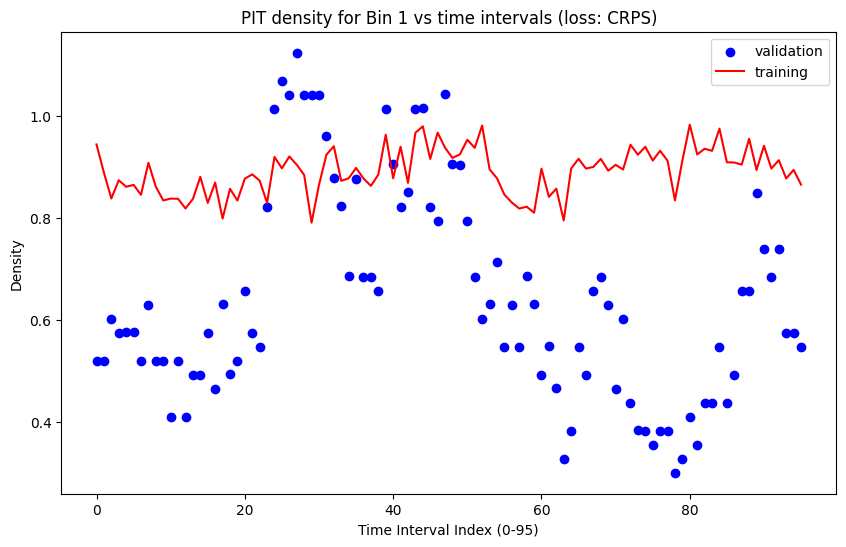

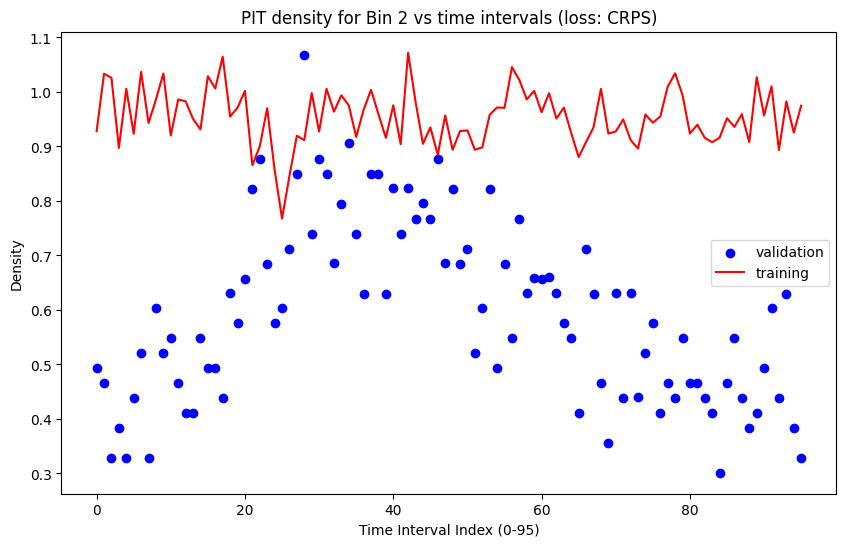

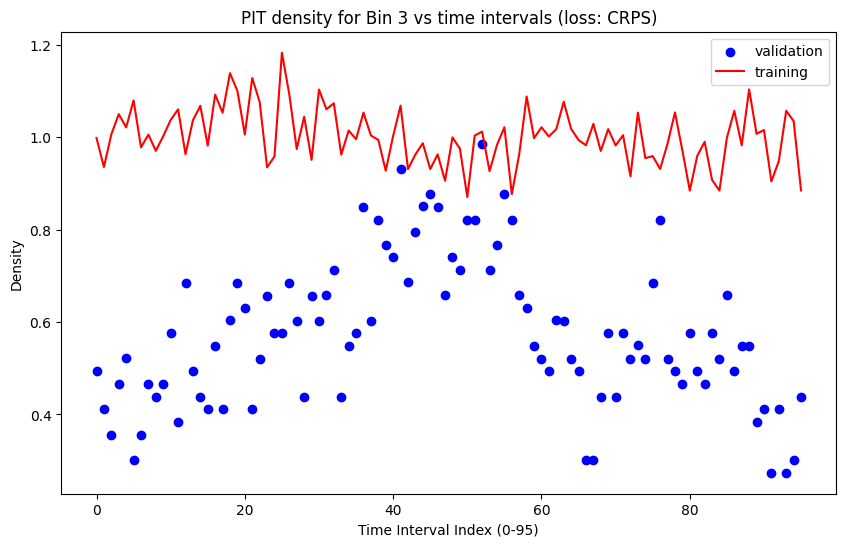

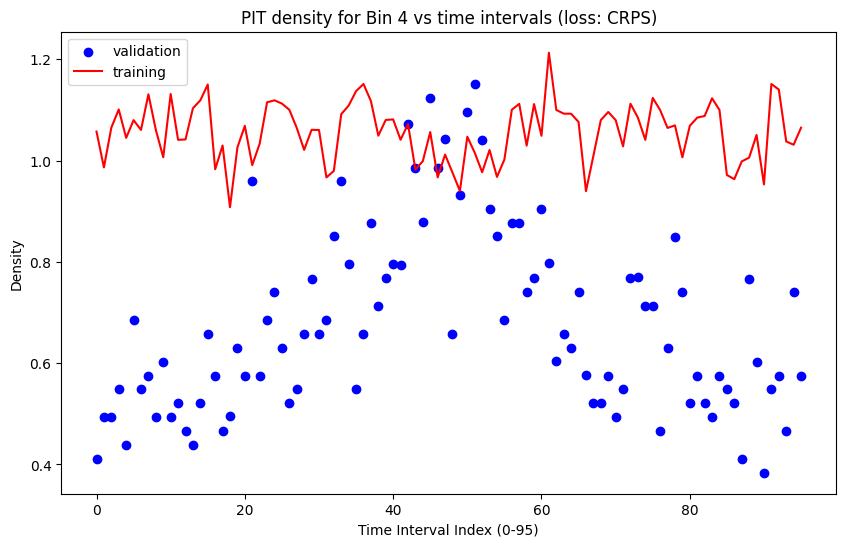

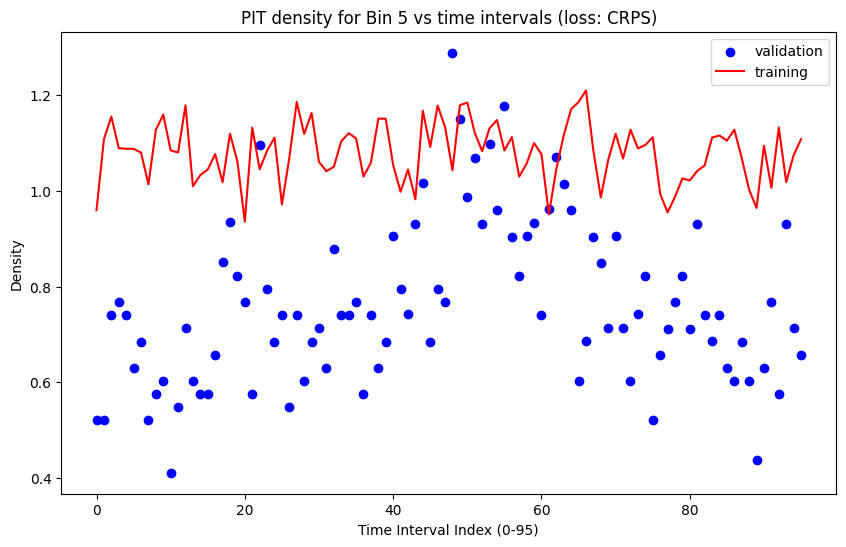

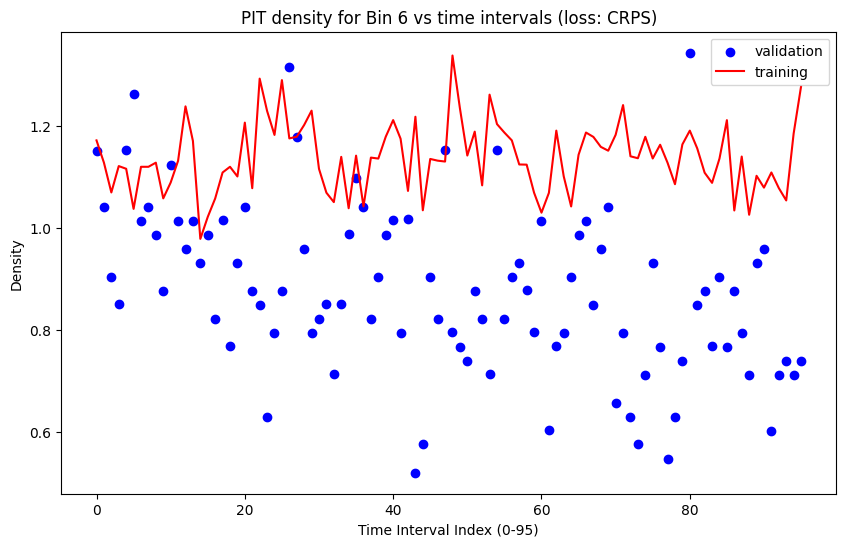

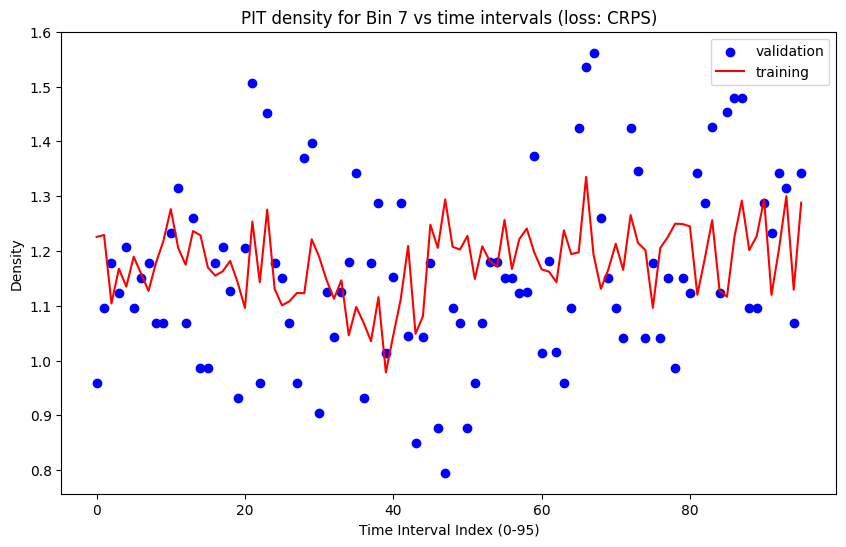

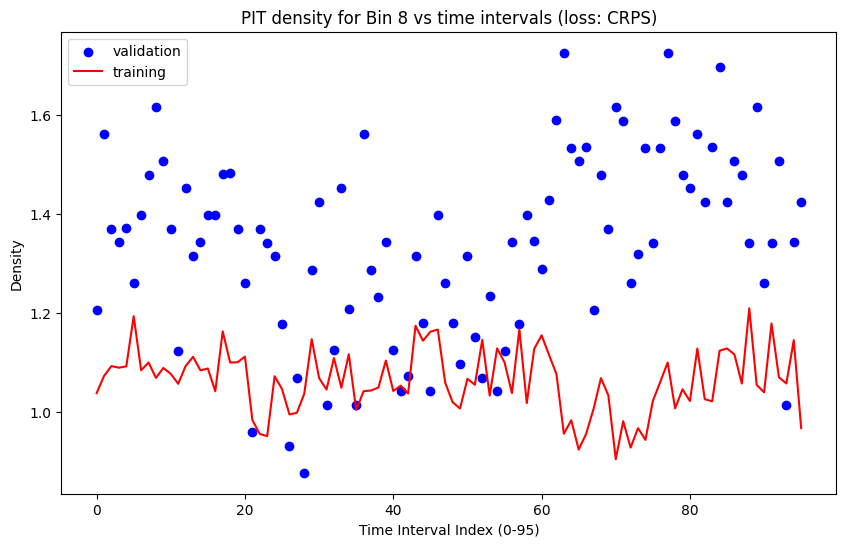

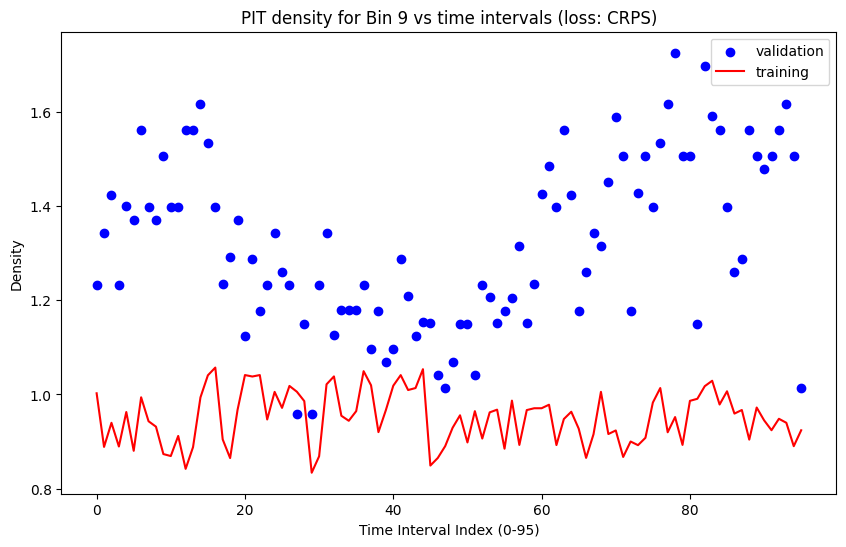

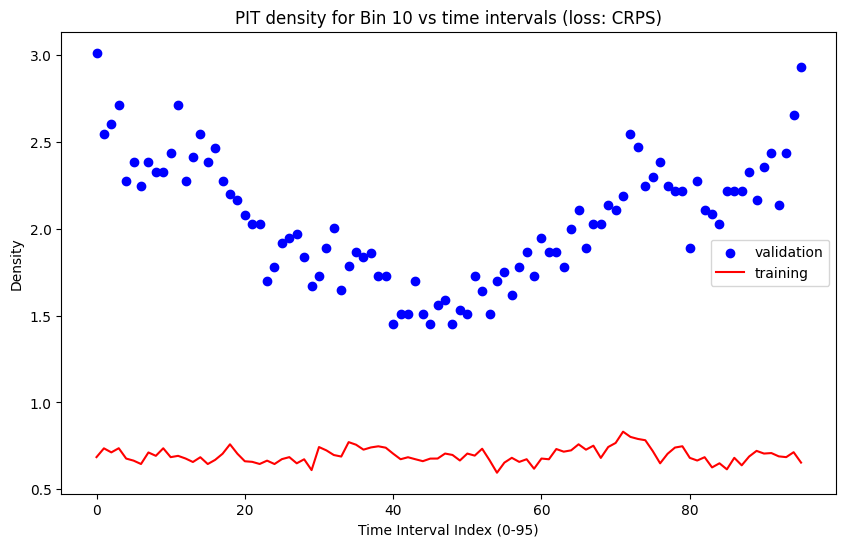

In [7]:
time_intervals = get_all_intervals(daily)
selection = time_intervals

deciles_val = []


pit_scores_per_decile_ws_10_loc = []


# Go over each time interval and save the decile values for all 10 bins

for time in selection:
    deciles, bin_edges = np.histogram(all_interval_pit_values[time], bins=10, density=True)
    deciles_val.append(deciles)


deciles_tr = []

for time in selection:
    deciles, bin_edges = np.histogram(all_interval_pit_values_tr[time], bins=10, density=True)
    deciles_tr.append(deciles)


# Convert list of arrays into a NumPy array of shape (96, 10)

deciles_array_val = np.array(deciles_val)

# Transpose to get shape (10, 96), so each row corresponds to a bin
bins_over_time_val = deciles_array_val.T  # Shape: (10, 96)


# Convert list of arrays into a NumPy array of shape (96, 10)
deciles_array_train = np.array(deciles_tr)

# Transpose to get shape (10, 96), so each row corresponds to a bin
bins_over_time_train = deciles_array_train.T  # Shape: (10, 96)


time_indices = np.arange(0, bins_over_time_val.shape[1])  # 0 to 95

plt.figure(figsize=(10, 6))

# Plot each bin separately
for bin_idx in range(bins_over_time_val.shape[0]):  # Iterate over bins (0 to 9)
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.scatter(time_indices, bins_over_time_val[bin_idx], label="validation", color='blue')
    ax.plot(time_indices, bins_over_time_train[bin_idx], label="training", color='red')

    ax.set_xlabel("Time Interval Index (0-95)")
    ax.set_ylabel("Density")
    ax.set_title(f"PIT density for Bin {bin_idx+1} vs time intervals (loss: CRPS)")  # Updated title
    ax.legend()

    # Store the plot in the array
    pit_scores_per_decile_ws_10_loc.append(fig)

    # Optionally, you can display the plot immediately
    plt.show()


### CRPS-Scores

In [ ]:
#pd.set_option('display.max_rows', 500)

time_intervals = get_all_intervals(daily)
crps_results = pd.DataFrame({"time interval": time_intervals, "crps": model_scores})
crps_results

ValueError: All arrays must be of the same length

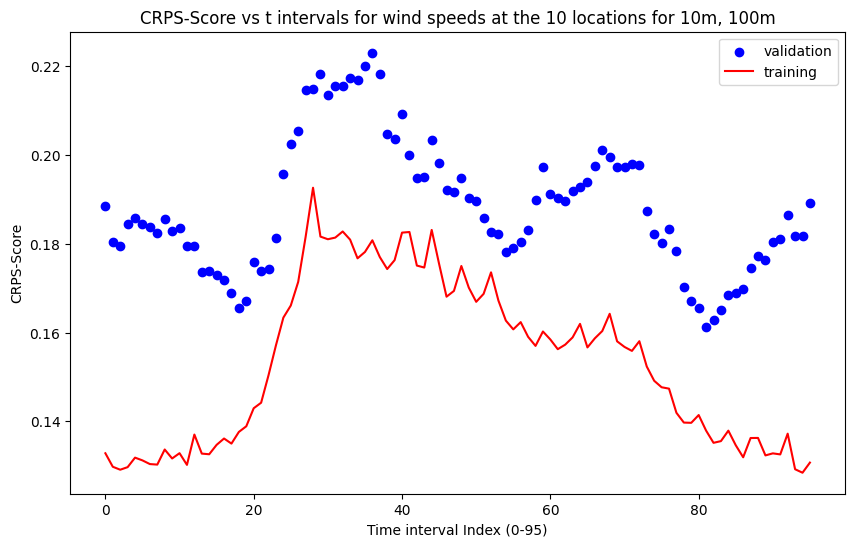

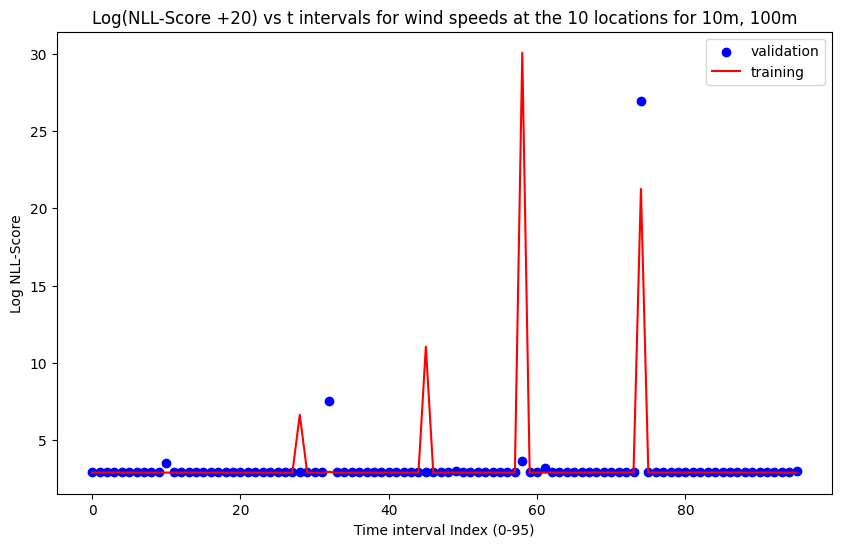

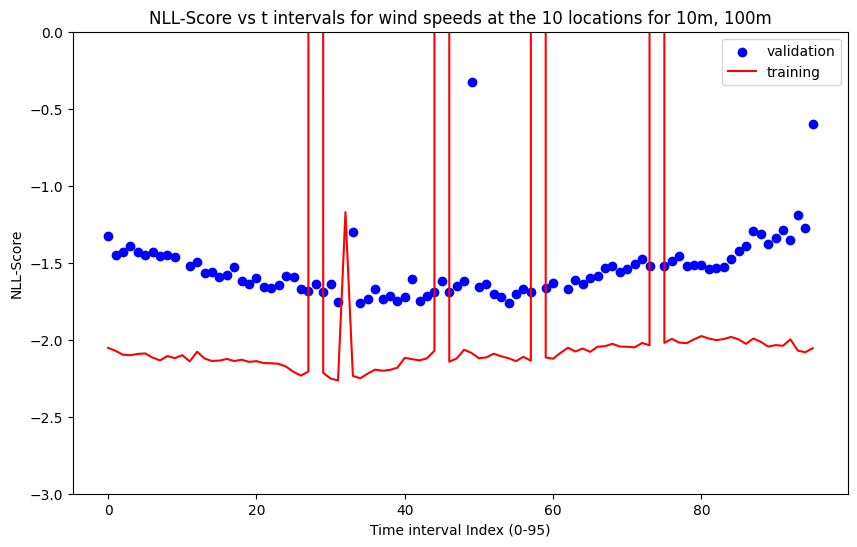

In [21]:
crps_nll_for_time_intervals_ws_10_loc = []

# Plot CRPS-Score vs time intervals
fig1, ax1 = plt.subplots(figsize=(10, 6))
ax1.scatter(np.arange(0, 96), model_scores, marker='o', color='b', label='validation')
ax1.plot(np.arange(0, 96), model_scores_tr, color='r', label='training')
ax1.legend()
ax1.set_title("CRPS-Score vs t intervals for wind speeds at the 10 locations for 10m, 100m")
ax1.set_xlabel("Time interval Index (0-95)")
ax1.set_ylabel("CRPS-Score")


# Plot Log(NLL-Score + 2) vs time intervals
fig2, ax2 = plt.subplots(figsize=(10, 6))
ax2.scatter(np.arange(0, 96), [ np.log(all_interval_nll_scores[interval] + 20) for interval in all_interval_nll_scores ], marker='o', color='b', label='validation')# + 2 because of negative NLL values, log because some NLL values are large
ax2.plot(np.arange(0, 96), [ np.log(all_interval_nll_scores_tr[interval] + 20) for interval in all_interval_nll_scores_tr ], color='r', label='training') # + 2 because of negative NLL values, log because some NLL values are large
ax2.legend()
ax2.set_title("Log(NLL-Score +20) vs t intervals for wind speeds at the 10 locations for 10m, 100m")
ax2.set_xlabel("Time interval Index (0-95)")
ax2.set_ylabel("Log NLL-Score")

# Plot Log(NLL-Score + 2) vs time intervals
plt.subplots(figsize=(10, 6))
plt.scatter(np.arange(0, 96), [ all_interval_nll_scores[interval] for interval in all_interval_nll_scores ], marker='o', color='b', label='validation')# + 2 because of negative NLL values, log because some NLL values are large
plt.plot(np.arange(0, 96), [ all_interval_nll_scores_tr[interval] for interval in all_interval_nll_scores_tr ], color='r', label='training') # + 2 because of negative NLL values, log because some NLL values are large
plt.legend()
plt.title("NLL-Score vs t intervals for wind speeds at the 10 locations for 10m, 100m")
plt.xlabel("Time interval Index (0-95)")
plt.ylabel("NLL-Score")
plt.ylim([-3, 0])


crps_nll_for_time_intervals_ws_10_loc.append(fig1)
crps_nll_for_time_intervals_ws_10_loc.append(fig2)


### Results scaled power, input: p_t-1, ws at 10 locations for 10m, 100m
- Dataframe: "results_mean_wind_speeds" stores for each time interval:
    - 'deciles_train',
    - 'deciles_val',
    - 'model_score_train',
    - 'model_score_val',
    - 'nll_score_train',
    - 'nll_score_val'

- plots:
    - pit_plots_per_interval_val_ws_10_loc: PIT-Histograms per time interval of validation dataset. Accessed via [0] - [95]
    - pit_plots_per_interval_train_ws_10_loc: PIT-Histograms per time interval of training dataset. Accessed via [0] - [95]
    - pit_scores_per_decile_ws_10_loc: PIT-scores across time intervals per bin for validation, training. Each bin accessed via [0] - [9]
    - crps_nll_for_time_intervals_ws_10_loc: CRPS-Score and Negative log likelihood across time intervals. CRPS accessed via [0], NLL via [1]
    

#### Dataframe: "results_mean_wind_speeds" stores for each time interval

In [30]:
results = {
    'time_interval': [],
    'deciles_train': [],
    'deciles_val': [],
    'model_score_train': [],
    'model_score_val': [],
    'nll_score_train': [],
    'nll_score_val': [],
}


# Loop over intervals and save results to the dictionary
for i, time in enumerate(selection):
    results['time_interval'].append(time)
    
    # Append the specific row (deciles for the current time interval) instead of the entire array
    results['deciles_train'].append(deciles_array_train[i])  # Use 'i' to index the correct row
    results['deciles_val'].append(deciles_array_val[i])      # Same for validation deciles
    
    # Append model scores for the specific time interval
    results['model_score_train'].append(model_scores_tr[i])
    results['model_score_val'].append(model_scores[i])
    
    # Append NLL scores for the specific time interval
    results['nll_score_train'].append(all_interval_nll_scores_tr[time])
    results['nll_score_val'].append(all_interval_nll_scores[time])


# Convert the dictionary into a pandas DataFrame
results_mean_wind_speeds = pd.DataFrame(results)


# Display the DataFrame
results_mean_wind_speeds


,time_interval,deciles_train,deciles_val,model_score_train,model_score_val,nll_score_train,nll_score_val
0,00_00,"[0.9437987191022725, 0.9281340100715294, 0.998...","[0.5206716214848641, 0.49326785193302924, 0.49...",0.132817,0.188517,-2.052764,-1.323518
1,00_15,"[0.8886139709788627, 1.0334541336494263, 0.935...","[0.5205737526827483, 0.46577651555824845, 0.41...",0.129775,0.180455,-2.072002,-1.449978
2,00_30,"[0.8379934072290024, 1.0259545452990593, 1.006...","[0.6027738121674325, 0.32878571572769044, 0.35...",0.129112,0.179458,-2.097284,-1.430379
3,00_45,"[0.8737802786649269, 0.8972900619473915, 1.050...","[0.5757061434335764, 0.3838040956223843, 0.466...",0.129689,0.184392,-2.100747,-1.393307
4,01_00,"[0.8609931849812681, 1.005796584273572, 1.0214...","[0.5762621220015274, 0.3292926411437299, 0.521...",0.131832,0.185779,-2.092462,-1.429963
...,...,...,...,...,...,...,...
91,22_45,"[0.8966909601498708, 1.0102457105618632, 0.904...","[0.6849792352564991, 0.6027817270257192, 0.273...",0.132557,0.181067,-2.038853,-1.280898
92,23_00,"[0.913068279850689, 0.8934745399397298, 0.9483...","[0.7398154234170489, 0.43840913980269564, 0.41...",0.137228,0.186319,-1.997931,-1.356107
93,23_15,"[0.877183311887024, 0.9829152289448347, 1.0573...","[0.5753497264118655, 0.6301449384510908, 0.273...",0.129220,0.181709,-2.070626,-1.189024
94,23_30,"[0.8940552699170218, 0.9254256302649875, 1.035...","[0.5754041982008881, 0.38360279880059217, 0.30...",0.128435,0.181695,-2.081273,-1.231717


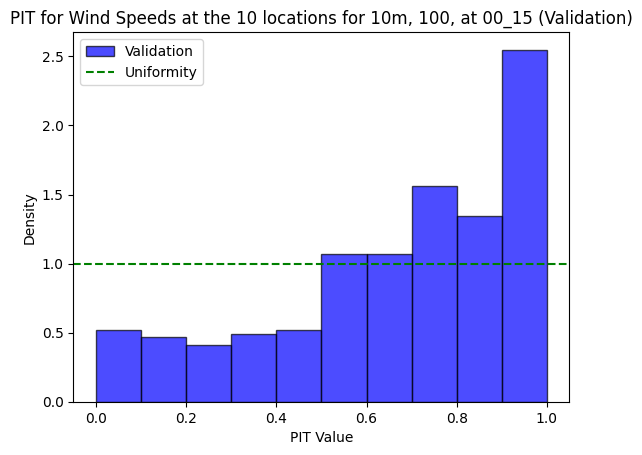

In [31]:
pit_plots_per_interval_val_ws_10_loc[1] #PIT-Histograms per time interval of validation dataset. Accessed via [0] - [95]

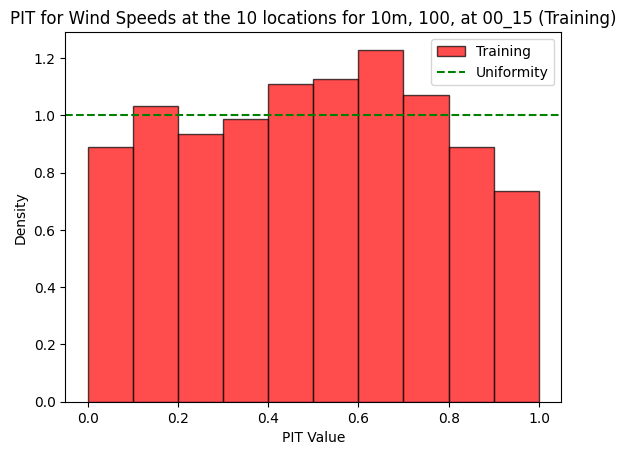

In [33]:
pit_plots_per_interval_train_ws_10_loc[1] #PIT-Histograms per time interval of training dataset. Accessed via [0] - [95]


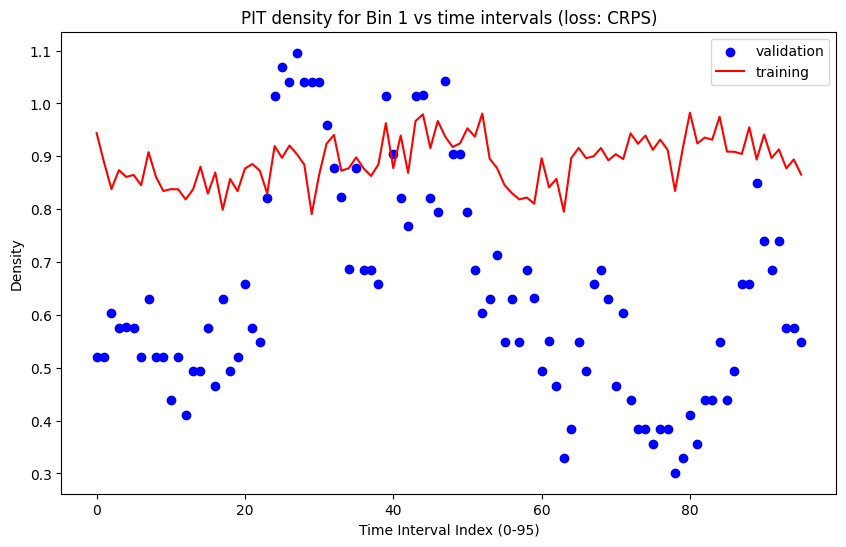

In [32]:
pit_scores_per_decile_ws_10_loc[0] #PIT-scores across time intervals per bin for validation, training. Each bin accessed via [0] - [9]


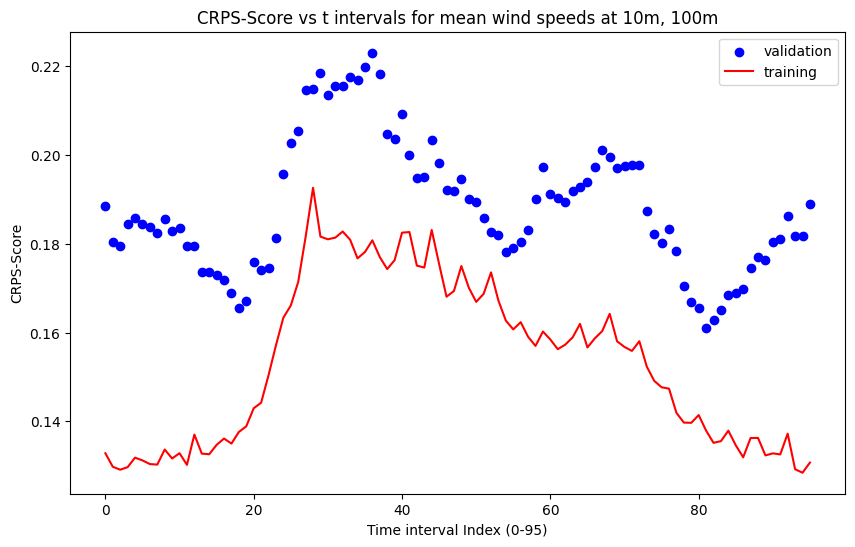

In [13]:
crps_nll_for_time_intervals_ws_10_loc[0] #CRPS-Score and Negative log likelihood across time intervals. CRPS accessed via [0], NLL via [1]

In [1]:
print("training done for 10 loc crps loss")

training done for 10 loc crps loss


# Input wind speed at 10 locations for 10m, 100m for Loss NLL

In [4]:
# Loading the entsoe data and scaling power to be in range 0-1
entsoe = load_entsoe()
max_power_value = entsoe['power'].max()
max_power_value_rounded = np.ceil(max_power_value / 1000) * 1000
epsilon = 1e-9 # Scaling power data to avoid problem of different time intervals having different minima power values
entsoe['power'] = entsoe['power'] / max_power_value_rounded + epsilon # scaling power values
daily = minute_to_daily(entsoe)

# Training
#selected_columns = ['power', 'power_t-1', 'ws_10m_loc_mean', 'ws_100m_loc_mean']
selected_columns = ['power', 'power_t-1', 'ws_10m_loc_1', 'ws_10m_loc_2', 'ws_10m_loc_3', 'ws_10m_loc_4', 'ws_10m_loc_5', 'ws_10m_loc_6', 'ws_10m_loc_7', 'ws_10m_loc_8', 'ws_10m_loc_9', 'ws_10m_loc_10', 'ws_100m_loc_1', 'ws_100m_loc_2', 'ws_100m_loc_3', 'ws_100m_loc_4', 'ws_100m_loc_5', 'ws_100m_loc_6', 'ws_100m_loc_7', 'ws_100m_loc_8', 'ws_100m_loc_9', 'ws_100m_loc_10']

all_columns = ['power', 
               'ws_10m_loc_1', 'ws_10m_loc_2', 'ws_10m_loc_3', 'ws_10m_loc_4', 'ws_10m_loc_5', 
               'ws_10m_loc_6', 'ws_10m_loc_7', 'ws_10m_loc_8', 'ws_10m_loc_9', 'ws_10m_loc_10',
               'ws_10m_loc_mean', 'ws_100m_loc_mean',
                'ws_100m_loc_1', 'ws_100m_loc_2', 'ws_100m_loc_3', 'ws_100m_loc_4', 'ws_100m_loc_5',
                'ws_100m_loc_6', 'ws_100m_loc_7', 'ws_100m_loc_8', 'ws_100m_loc_9', 'ws_100m_loc_10'
]
intervals = get_all_intervals(daily)
Dist = LogNormal
#Score = CRPScore
#tol=1e-1
Score = LogScore
n_estimators = 100
learning_rate = 0.03
verbose = True
verbose_eval = True
natural_gradient = True
random_state = 42


Data loaded and transformed successfully. Shape of DataFrame: (78912, 22)


### Algorithm

In [5]:
model_scores = [] # score that was used to train the model
model_scores_tr = [] # score that was used to train the model
all_interval_pit_values = {}
all_interval_pit_values_tr = {}
nll_log_scores = []
all_interval_nll_scores_tr = {}
all_interval_nll_scores = {}


for interval in intervals:

    filtered_df = get_columns_by_time(daily, interval)

    filtered_df = delay(filtered_df, delays=1, columns="power")

    filtered_df = filtered_df[selected_columns]

    train, validation, test = to_train_validation_test_data(filtered_df, "2022-12-31", "2023-12-31")

    X_train = train.drop('power', axis=1)
    y_train = train['power']

    X_validation = validation.drop('power', axis=1)
    y_validation = validation['power']

    model = NGBRegressor(Dist=Dist, Score=Score, n_estimators=n_estimators, learning_rate=learning_rate, verbose=verbose, verbose_eval=verbose_eval, natural_gradient=natural_gradient, random_state=random_state)
    model.fit(X_train, y_train, X_val=X_validation, Y_val=y_validation)
    
    y_train_pred = model.predict(X_train) # this returns the mean
    y_train_dists = model.pred_dist(X_train) # this returns a distribution object


    y_val_pred = model.predict(X_validation)
    y_val_dists = model.pred_dist(X_validation)

    train_mse = mean_squared_error(y_train, y_train_pred)
    val_mse = mean_squared_error(y_validation, y_val_pred)

    interval_pit_values = []
    interval_bin_values_tr = []

    model_scores.append(model.score(X_validation, y_validation))
    #log_scores.append(model.(X_validation, y_validation))

    model_scores_tr.append(model.score(X_train, y_train))


    print(f"Training features: {[c for c in X_train.columns]} -> {y_train.name}")
    print(f"Train MSE:\t {train_mse}")
    print(f"Validation MSE:\t {val_mse}")
    print("training nll:", -y_train_dists.logpdf(y_train).mean())


    #for i in range(len(y_train_pred)):
        #y = y_train[i]
        #mean = y_train_pred[i] #pred returns the mean not the median
        #median = mean * np.exp(-0.5 * y_train_dists[i].scale**2)
        #median = np.exp(y_train_dists[0:5].loc) # is another way to calculate the scale argument e^mu of the log normal distribution
        #sigma = y_train_dists[i].scale
        #print(f"Prediction: {y}, Median: {median}, Sigma: {sigma}")

        # Calculate the CDF (quantiles) for the true value
        #pit_value_tr = lognorm.cdf(y, s=sigma, scale=median)
        #nll_value_tr = lognorm.logpdf(y, s=sigma, scale=median)

        #interval_bin_values_tr.append(pit_value_tr)
        #nll_log_scores.append(nll_value_tr)
    
    
    # simpler way to get the nll log score:
    nll_log_scores_tr = - y_train_dists.logpdf(y_train).mean()

    interval_pit_values_tr = y_train_dists.dist.cdf(y_train)


    for i in range(len(y_val_pred)):
        y = y_validation[i]
        #crps_i = quad((y_val_dists.dist.cdf(y))**2, -np.inf, y)
        #mean = y_val_pred[i] #pred returns the mean not the median
        #median = mean * np.exp(-0.5 * y_val_dists[i].scale**2)
        #sigma = y_val_dists[i].scale


        # Calculate the CDF (quantiles) for the true value
        #pit_value = lognorm.cdf(y, s=sigma, scale=median)

        #interval_pit_values.append(pit_value)
    
    nll_log_scores = - y_val_dists.logpdf(y_validation).mean()
    interval_pit_values = y_val_dists.dist.cdf(y_validation)


    #values, bin_edges, patches = plt.hist(interval_pit_values, bins=10, range=(0, 1), density=True, alpha=0.7, color='blue', edgecolor='black')
    #plt.show()
    all_interval_pit_values[interval] = interval_pit_values
    all_interval_pit_values_tr[interval] = interval_pit_values_tr
    #all_interval_nll_scores_tr[interval] = - np.mean(nll_log_scores)
    all_interval_nll_scores_tr[interval] = nll_log_scores_tr
    all_interval_nll_scores[interval] = nll_log_scores

# of training observations: 2556 | 77.76%
# of validation observations: 365 | 11.10%
# of test observations: 366 | 11.13%
[iter 0] loss=-0.4752 val_loss=-0.2574 scale=1.0000 norm=0.9921
[iter 1] loss=-0.5155 val_loss=-0.2958 scale=1.0000 norm=0.9573
[iter 2] loss=-0.5508 val_loss=-0.3283 scale=1.0000 norm=0.9273
[iter 3] loss=-0.5812 val_loss=-0.3568 scale=1.0000 norm=0.9018
[iter 4] loss=-0.6090 val_loss=-0.3827 scale=1.0000 norm=0.8788
[iter 5] loss=-0.6343 val_loss=-0.4069 scale=1.0000 norm=0.8585
[iter 6] loss=-0.6575 val_loss=-0.4294 scale=1.0000 norm=0.8399
[iter 7] loss=-0.6797 val_loss=-0.4512 scale=1.0000 norm=0.8225
[iter 8] loss=-0.7002 val_loss=-0.4717 scale=1.0000 norm=0.8067
[iter 9] loss=-0.7201 val_loss=-0.4903 scale=1.0000 norm=0.7916
[iter 10] loss=-0.7389 val_loss=-0.5088 scale=1.0000 norm=0.7777
[iter 11] loss=-0.7573 val_loss=-0.5261 scale=1.0000 norm=0.7644
[iter 12] loss=-0.7749 val_loss=-0.5432 scale=1.0000 norm=0.7519
[iter 13] loss=-0.7918 val_loss=-0.5598 sca

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.5872 val_loss=-0.3559 scale=1.0000 norm=0.9017
[iter 4] loss=-0.6150 val_loss=-0.3815 scale=1.0000 norm=0.8790
[iter 5] loss=-0.6400 val_loss=-0.4066 scale=1.0000 norm=0.8586
[iter 6] loss=-0.6634 val_loss=-0.4288 scale=1.0000 norm=0.8400
[iter 7] loss=-0.6855 val_loss=-0.4504 scale=1.0000 norm=0.8227
[iter 8] loss=-0.7065 val_loss=-0.4709 scale=1.0000 norm=0.8065
[iter 9] loss=-0.7262 val_loss=-0.4905 scale=1.0000 norm=0.7916
[iter 10] loss=-0.7453 val_loss=-0.5091 scale=1.0000 norm=0.7774
[iter 11] loss=-0.7637 val_loss=-0.5270 scale=1.0000 norm=0.7641
[iter 12] loss=-0.7817 val_loss=-0.5444 scale=1.0000 norm=0.7514
[iter 13] loss=-0.7990 val_loss=-0.5607 scale=1.0000 norm=0.7395
[iter 14] loss=-0.8158 val_loss=-0.5767 scale=1.0000 norm=0.7283
[iter 15] loss=-0.8324 val_loss=-0.5918 scale=1.0000 norm=0.7175
[iter 16] loss=-0.8486 val_loss=-0.6074 scale=1.0000 norm=0.7072
[iter 17] loss=-0.8643 val_loss=-0.6223 scale=1.0000 norm=0.6976
[iter 18] loss=-0.8801 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=-0.5571 val_loss=-0.3278 scale=1.0000 norm=0.9319
[iter 3] loss=-0.5876 val_loss=-0.3567 scale=1.0000 norm=0.9063
[iter 4] loss=-0.6157 val_loss=-0.3832 scale=1.0000 norm=0.8830
[iter 5] loss=-0.6410 val_loss=-0.4072 scale=1.0000 norm=0.8624
[iter 6] loss=-0.6646 val_loss=-0.4299 scale=1.0000 norm=0.8434
[iter 7] loss=-0.6870 val_loss=-0.4508 scale=1.0000 norm=0.8258
[iter 8] loss=-0.7083 val_loss=-0.4705 scale=1.0000 norm=0.8093
[iter 9] loss=-0.7286 val_loss=-0.4898 scale=1.0000 norm=0.7939
[iter 10] loss=-0.7478 val_loss=-0.5082 scale=1.0000 norm=0.7797
[iter 11] loss=-0.7664 val_loss=-0.5259 scale=1.0000 norm=0.7663
[iter 12] loss=-0.7842 val_loss=-0.5433 scale=1.0000 norm=0.7537
[iter 13] loss=-0.8017 val_loss=-0.5604 scale=1.0000 norm=0.7416
[iter 14] loss=-0.8186 val_loss=-0.5765 scale=1.0000 norm=0.7303
[iter 15] loss=-0.8352 val_loss=-0.5928 scale=1.0000 norm=0.7193
[iter 16] loss=-0.8515 val_loss=-0.6236 scale=2.0000 norm=1.4178
[iter 17] loss=-0.8830 val_loss=-

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.5883 val_loss=-0.3541 scale=1.0000 norm=0.9110
[iter 4] loss=-0.6162 val_loss=-0.3818 scale=1.0000 norm=0.8879
[iter 5] loss=-0.6417 val_loss=-0.4057 scale=1.0000 norm=0.8671
[iter 6] loss=-0.6652 val_loss=-0.4281 scale=1.0000 norm=0.8480
[iter 7] loss=-0.6873 val_loss=-0.4496 scale=1.0000 norm=0.8304
[iter 8] loss=-0.7086 val_loss=-0.4699 scale=1.0000 norm=0.8137
[iter 9] loss=-0.7288 val_loss=-0.4895 scale=1.0000 norm=0.7983
[iter 10] loss=-0.7480 val_loss=-0.5084 scale=1.0000 norm=0.7839
[iter 11] loss=-0.7662 val_loss=-0.5262 scale=1.0000 norm=0.7706
[iter 12] loss=-0.7841 val_loss=-0.5433 scale=1.0000 norm=0.7577
[iter 13] loss=-0.8016 val_loss=-0.5599 scale=1.0000 norm=0.7455
[iter 14] loss=-0.8185 val_loss=-0.5759 scale=1.0000 norm=0.7340
[iter 15] loss=-0.8351 val_loss=-0.5915 scale=1.0000 norm=0.7231
[iter 16] loss=-0.8511 val_loss=-0.6223 scale=2.0000 norm=1.4255
[iter 17] loss=-0.8826 val_loss=-0.6375 scale=1.0000 norm=0.6932
[iter 18] loss=-0.8981 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 4] loss=-0.6164 val_loss=-0.3779 scale=1.0000 norm=0.8928
[iter 5] loss=-0.6416 val_loss=-0.4038 scale=1.0000 norm=0.8721
[iter 6] loss=-0.6653 val_loss=-0.4266 scale=1.0000 norm=0.8529
[iter 7] loss=-0.6876 val_loss=-0.4490 scale=1.0000 norm=0.8351
[iter 8] loss=-0.7085 val_loss=-0.4687 scale=1.0000 norm=0.8187
[iter 9] loss=-0.7286 val_loss=-0.4883 scale=1.0000 norm=0.8033
[iter 10] loss=-0.7479 val_loss=-0.5068 scale=1.0000 norm=0.7887
[iter 11] loss=-0.7661 val_loss=-0.5246 scale=1.0000 norm=0.7751
[iter 12] loss=-0.7842 val_loss=-0.5426 scale=1.0000 norm=0.7620
[iter 13] loss=-0.8015 val_loss=-0.5592 scale=1.0000 norm=0.7498
[iter 14] loss=-0.8182 val_loss=-0.5916 scale=2.0000 norm=1.4766
[iter 15] loss=-0.8511 val_loss=-0.6074 scale=1.0000 norm=0.7163
[iter 16] loss=-0.8667 val_loss=-0.6223 scale=1.0000 norm=0.7065
[iter 17] loss=-0.8819 val_loss=-0.6373 scale=1.0000 norm=0.6972
[iter 18] loss=-0.8972 val_loss=-0.6671 scale=2.0000 norm=1.3763
[iter 19] loss=-0.9272 val_loss

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=-0.5616 val_loss=-0.3264 scale=1.0000 norm=0.9441
[iter 3] loss=-0.5927 val_loss=-0.3549 scale=1.0000 norm=0.9179
[iter 4] loss=-0.6201 val_loss=-0.3816 scale=1.0000 norm=0.8949
[iter 5] loss=-0.6460 val_loss=-0.4063 scale=1.0000 norm=0.8736
[iter 6] loss=-0.6696 val_loss=-0.4297 scale=1.0000 norm=0.8543
[iter 7] loss=-0.6919 val_loss=-0.4516 scale=1.0000 norm=0.8366
[iter 8] loss=-0.7131 val_loss=-0.4716 scale=1.0000 norm=0.8198
[iter 9] loss=-0.7329 val_loss=-0.4914 scale=1.0000 norm=0.8046
[iter 10] loss=-0.7519 val_loss=-0.5104 scale=1.0000 norm=0.7902
[iter 11] loss=-0.7705 val_loss=-0.5466 scale=2.0000 norm=1.5527
[iter 12] loss=-0.8062 val_loss=-0.5793 scale=2.0000 norm=1.5010
[iter 13] loss=-0.8394 val_loss=-0.5948 scale=1.0000 norm=0.7277
[iter 14] loss=-0.8557 val_loss=-0.6105 scale=1.0000 norm=0.7170
[iter 15] loss=-0.8715 val_loss=-0.6256 scale=1.0000 norm=0.7069
[iter 16] loss=-0.8874 val_loss=-0.6405 scale=1.0000 norm=0.6971
[iter 17] loss=-0.9027 val_loss=-

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.5953 val_loss=-0.3557 scale=1.0000 norm=0.9205
[iter 4] loss=-0.6233 val_loss=-0.3808 scale=1.0000 norm=0.8971
[iter 5] loss=-0.6485 val_loss=-0.4049 scale=1.0000 norm=0.8761
[iter 6] loss=-0.6724 val_loss=-0.4276 scale=1.0000 norm=0.8566
[iter 7] loss=-0.6947 val_loss=-0.4491 scale=1.0000 norm=0.8388
[iter 8] loss=-0.7156 val_loss=-0.4699 scale=1.0000 norm=0.8223
[iter 9] loss=-0.7358 val_loss=-0.4890 scale=1.0000 norm=0.8067
[iter 10] loss=-0.7550 val_loss=-0.5076 scale=1.0000 norm=0.7921
[iter 11] loss=-0.7734 val_loss=-0.5248 scale=1.0000 norm=0.7783
[iter 12] loss=-0.7909 val_loss=-0.5602 scale=2.0000 norm=1.5310
[iter 13] loss=-0.8251 val_loss=-0.5768 scale=1.0000 norm=0.7412
[iter 14] loss=-0.8415 val_loss=-0.5930 scale=1.0000 norm=0.7300
[iter 15] loss=-0.8576 val_loss=-0.6088 scale=1.0000 norm=0.7194
[iter 16] loss=-0.8733 val_loss=-0.6394 scale=2.0000 norm=1.4188
[iter 17] loss=-0.9046 val_loss=-0.6701 scale=2.0000 norm=1.3796
[iter 18] loss=-0.9350 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=-0.5660 val_loss=-0.3265 scale=1.0000 norm=0.9497
[iter 3] loss=-0.5970 val_loss=-0.3571 scale=1.0000 norm=0.9233
[iter 4] loss=-0.6251 val_loss=-0.3831 scale=1.0000 norm=0.8996
[iter 5] loss=-0.6509 val_loss=-0.4076 scale=1.0000 norm=0.8781
[iter 6] loss=-0.6746 val_loss=-0.4312 scale=1.0000 norm=0.8588
[iter 7] loss=-0.6969 val_loss=-0.4535 scale=1.0000 norm=0.8408
[iter 8] loss=-0.7180 val_loss=-0.4737 scale=1.0000 norm=0.8241
[iter 9] loss=-0.7379 val_loss=-0.4933 scale=1.0000 norm=0.8086
[iter 10] loss=-0.7570 val_loss=-0.5114 scale=1.0000 norm=0.7941
[iter 11] loss=-0.7754 val_loss=-0.5478 scale=2.0000 norm=1.5607
[iter 12] loss=-0.8106 val_loss=-0.5649 scale=1.0000 norm=0.7546
[iter 13] loss=-0.8275 val_loss=-0.5968 scale=2.0000 norm=1.4857
[iter 14] loss=-0.8603 val_loss=-0.6123 scale=1.0000 norm=0.7206
[iter 15] loss=-0.8761 val_loss=-0.6278 scale=1.0000 norm=0.7105
[iter 16] loss=-0.8917 val_loss=-0.6582 scale=2.0000 norm=1.4014
[iter 17] loss=-0.9225 val_loss=-

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 4] loss=-0.6274 val_loss=-0.3862 scale=1.0000 norm=0.9007
[iter 5] loss=-0.6530 val_loss=-0.4113 scale=1.0000 norm=0.8795
[iter 6] loss=-0.6766 val_loss=-0.4342 scale=1.0000 norm=0.8603
[iter 7] loss=-0.6987 val_loss=-0.4559 scale=1.0000 norm=0.8425
[iter 8] loss=-0.7193 val_loss=-0.4765 scale=1.0000 norm=0.8261
[iter 9] loss=-0.7392 val_loss=-0.4965 scale=1.0000 norm=0.8105
[iter 10] loss=-0.7582 val_loss=-0.5161 scale=1.0000 norm=0.7959
[iter 11] loss=-0.7767 val_loss=-0.5347 scale=1.0000 norm=0.7820
[iter 12] loss=-0.7946 val_loss=-0.5521 scale=1.0000 norm=0.7689
[iter 13] loss=-0.8120 val_loss=-0.5862 scale=2.0000 norm=1.5128
[iter 14] loss=-0.8451 val_loss=-0.6020 scale=1.0000 norm=0.7333
[iter 15] loss=-0.8611 val_loss=-0.6180 scale=1.0000 norm=0.7227
[iter 16] loss=-0.8767 val_loss=-0.6489 scale=2.0000 norm=1.4253
[iter 17] loss=-0.9076 val_loss=-0.6793 scale=2.0000 norm=1.3866
[iter 18] loss=-0.9377 val_loss=-0.7083 scale=2.0000 norm=1.3515
[iter 19] loss=-0.9672 val_loss

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=-0.5712 val_loss=-0.3331 scale=1.0000 norm=0.9521
[iter 3] loss=-0.6028 val_loss=-0.3625 scale=1.0000 norm=0.9252
[iter 4] loss=-0.6306 val_loss=-0.3890 scale=1.0000 norm=0.9017
[iter 5] loss=-0.6558 val_loss=-0.4139 scale=1.0000 norm=0.8806
[iter 6] loss=-0.6797 val_loss=-0.4375 scale=1.0000 norm=0.8612
[iter 7] loss=-0.7022 val_loss=-0.4596 scale=1.0000 norm=0.8429
[iter 8] loss=-0.7234 val_loss=-0.4797 scale=1.0000 norm=0.8261
[iter 9] loss=-0.7435 val_loss=-0.4990 scale=1.0000 norm=0.8104
[iter 10] loss=-0.7624 val_loss=-0.5179 scale=1.0000 norm=0.7958
[iter 11] loss=-0.7810 val_loss=-0.5356 scale=1.0000 norm=0.7818
[iter 12] loss=-0.7987 val_loss=-0.5536 scale=1.0000 norm=0.7688
[iter 13] loss=-0.8160 val_loss=-0.5703 scale=1.0000 norm=0.7562
[iter 14] loss=-0.8327 val_loss=-0.6036 scale=2.0000 norm=1.4890
[iter 15] loss=-0.8654 val_loss=-0.6348 scale=2.0000 norm=1.4444
[iter 16] loss=-0.8967 val_loss=-0.6647 scale=2.0000 norm=1.4040
[iter 17] loss=-0.9275 val_loss=-

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.6066 val_loss=-0.3665 scale=1.0000 norm=0.9252
[iter 4] loss=-0.6347 val_loss=-0.3932 scale=1.0000 norm=0.9015
[iter 5] loss=-0.6602 val_loss=-0.4187 scale=1.0000 norm=0.8802
[iter 6] loss=-0.6843 val_loss=-0.4417 scale=1.0000 norm=0.8604
[iter 7] loss=-0.7066 val_loss=-0.4630 scale=1.0000 norm=0.8424
[iter 8] loss=-0.7277 val_loss=-0.4842 scale=1.0000 norm=0.8256
[iter 9] loss=-0.7480 val_loss=-0.5039 scale=1.0000 norm=0.8098
[iter 10] loss=-0.7672 val_loss=-0.5227 scale=1.0000 norm=0.7950
[iter 11] loss=-0.7858 val_loss=-0.5407 scale=1.0000 norm=0.7810
[iter 12] loss=-0.8034 val_loss=-0.5585 scale=1.0000 norm=0.7680
[iter 13] loss=-0.8210 val_loss=-0.5923 scale=2.0000 norm=1.5109
[iter 14] loss=-0.8550 val_loss=-0.6249 scale=2.0000 norm=1.4636
[iter 15] loss=-0.8871 val_loss=-0.6553 scale=2.0000 norm=1.4213
[iter 16] loss=-0.9177 val_loss=-0.6847 scale=2.0000 norm=1.3833
[iter 17] loss=-0.9477 val_loss=-0.7139 scale=2.0000 norm=1.3484
[iter 18] loss=-0.9774 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.6078 val_loss=-0.3656 scale=1.0000 norm=0.9285
[iter 4] loss=-0.6359 val_loss=-0.3922 scale=1.0000 norm=0.9048
[iter 5] loss=-0.6617 val_loss=-0.4174 scale=1.0000 norm=0.8833
[iter 6] loss=-0.6852 val_loss=-0.4410 scale=1.0000 norm=0.8639
[iter 7] loss=-0.7077 val_loss=-0.4629 scale=1.0000 norm=0.8457
[iter 8] loss=-0.7287 val_loss=-0.4841 scale=1.0000 norm=0.8289
[iter 9] loss=-0.7489 val_loss=-0.5040 scale=1.0000 norm=0.8130
[iter 10] loss=-0.7683 val_loss=-0.5231 scale=1.0000 norm=0.7981
[iter 11] loss=-0.7867 val_loss=-0.5415 scale=1.0000 norm=0.7842
[iter 12] loss=-0.8047 val_loss=-0.5768 scale=2.0000 norm=1.5418
[iter 13] loss=-0.8389 val_loss=-0.5940 scale=1.0000 norm=0.7465
[iter 14] loss=-0.8554 val_loss=-0.6262 scale=2.0000 norm=1.4703
[iter 15] loss=-0.8874 val_loss=-0.6419 scale=1.0000 norm=0.7138
[iter 16] loss=-0.9029 val_loss=-0.6573 scale=1.0000 norm=0.7040
[iter 17] loss=-0.9183 val_loss=-0.6876 scale=2.0000 norm=1.3892
[iter 18] loss=-0.9485 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.6088 val_loss=-0.3696 scale=1.0000 norm=0.9305
[iter 4] loss=-0.6368 val_loss=-0.3964 scale=1.0000 norm=0.9068
[iter 5] loss=-0.6626 val_loss=-0.4212 scale=1.0000 norm=0.8854
[iter 6] loss=-0.6865 val_loss=-0.4431 scale=1.0000 norm=0.8656
[iter 7] loss=-0.7084 val_loss=-0.4648 scale=1.0000 norm=0.8477
[iter 8] loss=-0.7294 val_loss=-0.4860 scale=1.0000 norm=0.8309
[iter 9] loss=-0.7493 val_loss=-0.5055 scale=1.0000 norm=0.8151
[iter 10] loss=-0.7685 val_loss=-0.5249 scale=1.0000 norm=0.8003
[iter 11] loss=-0.7868 val_loss=-0.5428 scale=1.0000 norm=0.7864
[iter 12] loss=-0.8045 val_loss=-0.5604 scale=1.0000 norm=0.7732
[iter 13] loss=-0.8216 val_loss=-0.5779 scale=1.0000 norm=0.7607
[iter 14] loss=-0.8385 val_loss=-0.5943 scale=1.0000 norm=0.7488
[iter 15] loss=-0.8552 val_loss=-0.6265 scale=2.0000 norm=1.4745
[iter 16] loss=-0.8874 val_loss=-0.6419 scale=1.0000 norm=0.7158
[iter 17] loss=-0.9027 val_loss=-0.6570 scale=1.0000 norm=0.7061
[iter 18] loss=-0.9181 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.6099 val_loss=-0.3705 scale=1.0000 norm=0.9324
[iter 4] loss=-0.6384 val_loss=-0.3984 scale=1.0000 norm=0.9083
[iter 5] loss=-0.6644 val_loss=-0.4228 scale=1.0000 norm=0.8867
[iter 6] loss=-0.6881 val_loss=-0.4460 scale=1.0000 norm=0.8670
[iter 7] loss=-0.7107 val_loss=-0.4672 scale=1.0000 norm=0.8485
[iter 8] loss=-0.7314 val_loss=-0.4884 scale=1.0000 norm=0.8318
[iter 9] loss=-0.7516 val_loss=-0.5085 scale=1.0000 norm=0.8159
[iter 10] loss=-0.7708 val_loss=-0.5276 scale=1.0000 norm=0.8009
[iter 11] loss=-0.7895 val_loss=-0.5465 scale=1.0000 norm=0.7868
[iter 12] loss=-0.8074 val_loss=-0.5645 scale=1.0000 norm=0.7734
[iter 13] loss=-0.8247 val_loss=-0.5818 scale=1.0000 norm=0.7608
[iter 14] loss=-0.8415 val_loss=-0.6139 scale=2.0000 norm=1.4977
[iter 15] loss=-0.8741 val_loss=-0.6467 scale=2.0000 norm=1.4529
[iter 16] loss=-0.9062 val_loss=-0.6624 scale=1.0000 norm=0.7056
[iter 17] loss=-0.9215 val_loss=-0.6923 scale=2.0000 norm=1.3923
[iter 18] loss=-0.9519 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.6111 val_loss=-0.3698 scale=1.0000 norm=0.9348
[iter 4] loss=-0.6396 val_loss=-0.3961 scale=1.0000 norm=0.9107
[iter 5] loss=-0.6657 val_loss=-0.4227 scale=1.0000 norm=0.8889
[iter 6] loss=-0.6899 val_loss=-0.4460 scale=1.0000 norm=0.8689
[iter 7] loss=-0.7123 val_loss=-0.4682 scale=1.0000 norm=0.8505
[iter 8] loss=-0.7333 val_loss=-0.4895 scale=1.0000 norm=0.8336
[iter 9] loss=-0.7536 val_loss=-0.5100 scale=1.0000 norm=0.8175
[iter 10] loss=-0.7729 val_loss=-0.5296 scale=1.0000 norm=0.8025
[iter 11] loss=-0.7916 val_loss=-0.5482 scale=1.0000 norm=0.7883
[iter 12] loss=-0.8094 val_loss=-0.5662 scale=1.0000 norm=0.7750
[iter 13] loss=-0.8267 val_loss=-0.5836 scale=1.0000 norm=0.7624
[iter 14] loss=-0.8437 val_loss=-0.6007 scale=1.0000 norm=0.7504
[iter 15] loss=-0.8604 val_loss=-0.6170 scale=1.0000 norm=0.7388
[iter 16] loss=-0.8767 val_loss=-0.6329 scale=1.0000 norm=0.7278
[iter 17] loss=-0.8924 val_loss=-0.6487 scale=1.0000 norm=0.7175
[iter 18] loss=-0.9082 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.6102 val_loss=-0.3707 scale=1.0000 norm=0.9379
[iter 4] loss=-0.6383 val_loss=-0.3989 scale=1.0000 norm=0.9141
[iter 5] loss=-0.6644 val_loss=-0.4238 scale=1.0000 norm=0.8922
[iter 6] loss=-0.6882 val_loss=-0.4473 scale=1.0000 norm=0.8723
[iter 7] loss=-0.7105 val_loss=-0.4690 scale=1.0000 norm=0.8541
[iter 8] loss=-0.7314 val_loss=-0.4906 scale=1.0000 norm=0.8372
[iter 9] loss=-0.7515 val_loss=-0.5103 scale=1.0000 norm=0.8211
[iter 10] loss=-0.7707 val_loss=-0.5292 scale=1.0000 norm=0.8062
[iter 11] loss=-0.7892 val_loss=-0.5474 scale=1.0000 norm=0.7920
[iter 12] loss=-0.8069 val_loss=-0.5649 scale=1.0000 norm=0.7787
[iter 13] loss=-0.8241 val_loss=-0.5820 scale=1.0000 norm=0.7661
[iter 14] loss=-0.8412 val_loss=-0.5987 scale=1.0000 norm=0.7539
[iter 15] loss=-0.8578 val_loss=-0.6153 scale=1.0000 norm=0.7423
[iter 16] loss=-0.8742 val_loss=-0.6470 scale=2.0000 norm=1.4625
[iter 17] loss=-0.9058 val_loss=-0.6777 scale=2.0000 norm=1.4212
[iter 18] loss=-0.9362 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.6121 val_loss=-0.3730 scale=1.0000 norm=0.9408
[iter 4] loss=-0.6403 val_loss=-0.3995 scale=1.0000 norm=0.9168
[iter 5] loss=-0.6657 val_loss=-0.4236 scale=1.0000 norm=0.8954
[iter 6] loss=-0.6895 val_loss=-0.4471 scale=1.0000 norm=0.8756
[iter 7] loss=-0.7118 val_loss=-0.4692 scale=1.0000 norm=0.8572
[iter 8] loss=-0.7328 val_loss=-0.4894 scale=1.0000 norm=0.8400
[iter 9] loss=-0.7527 val_loss=-0.5085 scale=1.0000 norm=0.8241
[iter 10] loss=-0.7716 val_loss=-0.5275 scale=1.0000 norm=0.8092
[iter 11] loss=-0.7899 val_loss=-0.5458 scale=1.0000 norm=0.7950
[iter 12] loss=-0.8080 val_loss=-0.5631 scale=1.0000 norm=0.7813
[iter 13] loss=-0.8256 val_loss=-0.5961 scale=2.0000 norm=1.5367
[iter 14] loss=-0.8591 val_loss=-0.6120 scale=1.0000 norm=0.7442
[iter 15] loss=-0.8755 val_loss=-0.6433 scale=2.0000 norm=1.4662
[iter 16] loss=-0.9069 val_loss=-0.6737 scale=2.0000 norm=1.4247
[iter 17] loss=-0.9373 val_loss=-0.7037 scale=2.0000 norm=1.3870
[iter 18] loss=-0.9668 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=-0.5872 val_loss=-0.3491 scale=1.0000 norm=0.9705
[iter 3] loss=-0.6180 val_loss=-0.3794 scale=1.0000 norm=0.9440
[iter 4] loss=-0.6467 val_loss=-0.4061 scale=1.0000 norm=0.9195
[iter 5] loss=-0.6723 val_loss=-0.4304 scale=1.0000 norm=0.8978
[iter 6] loss=-0.6958 val_loss=-0.4540 scale=1.0000 norm=0.8780
[iter 7] loss=-0.7185 val_loss=-0.4755 scale=1.0000 norm=0.8594
[iter 8] loss=-0.7396 val_loss=-0.4965 scale=1.0000 norm=0.8420
[iter 9] loss=-0.7595 val_loss=-0.5166 scale=1.0000 norm=0.8260
[iter 10] loss=-0.7786 val_loss=-0.5361 scale=1.0000 norm=0.8108
[iter 11] loss=-0.7971 val_loss=-0.5541 scale=1.0000 norm=0.7964
[iter 12] loss=-0.8150 val_loss=-0.5886 scale=2.0000 norm=1.5659
[iter 13] loss=-0.8491 val_loss=-0.6057 scale=1.0000 norm=0.7576
[iter 14] loss=-0.8656 val_loss=-0.6222 scale=1.0000 norm=0.7460
[iter 15] loss=-0.8820 val_loss=-0.6380 scale=1.0000 norm=0.7347
[iter 16] loss=-0.8979 val_loss=-0.6689 scale=2.0000 norm=1.4482
[iter 17] loss=-0.9287 val_loss=-

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.6215 val_loss=-0.3888 scale=1.0000 norm=0.9498
[iter 4] loss=-0.6495 val_loss=-0.4157 scale=1.0000 norm=0.9257
[iter 5] loss=-0.6754 val_loss=-0.4402 scale=1.0000 norm=0.9036
[iter 6] loss=-0.6991 val_loss=-0.4636 scale=1.0000 norm=0.8836
[iter 7] loss=-0.7214 val_loss=-0.4849 scale=1.0000 norm=0.8649
[iter 8] loss=-0.7421 val_loss=-0.5054 scale=1.0000 norm=0.8477
[iter 9] loss=-0.7623 val_loss=-0.5252 scale=1.0000 norm=0.8313
[iter 10] loss=-0.7817 val_loss=-0.5625 scale=2.0000 norm=1.6316
[iter 11] loss=-0.8183 val_loss=-0.5807 scale=1.0000 norm=0.7872
[iter 12] loss=-0.8358 val_loss=-0.6151 scale=2.0000 norm=1.5481
[iter 13] loss=-0.8694 val_loss=-0.6310 scale=1.0000 norm=0.7496
[iter 14] loss=-0.8856 val_loss=-0.6468 scale=1.0000 norm=0.7383
[iter 15] loss=-0.9016 val_loss=-0.6624 scale=1.0000 norm=0.7275
[iter 16] loss=-0.9173 val_loss=-0.6777 scale=1.0000 norm=0.7173
[iter 17] loss=-0.9327 val_loss=-0.7075 scale=2.0000 norm=1.4152
[iter 18] loss=-0.9629 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.6239 val_loss=-0.3871 scale=1.0000 norm=0.9603
[iter 4] loss=-0.6517 val_loss=-0.4141 scale=1.0000 norm=0.9361
[iter 5] loss=-0.6776 val_loss=-0.4385 scale=1.0000 norm=0.9139
[iter 6] loss=-0.7016 val_loss=-0.4615 scale=1.0000 norm=0.8934
[iter 7] loss=-0.7238 val_loss=-0.4827 scale=1.0000 norm=0.8745
[iter 8] loss=-0.7449 val_loss=-0.5036 scale=1.0000 norm=0.8567
[iter 9] loss=-0.7650 val_loss=-0.5238 scale=1.0000 norm=0.8402
[iter 10] loss=-0.7843 val_loss=-0.5430 scale=1.0000 norm=0.8245
[iter 11] loss=-0.8029 val_loss=-0.5786 scale=2.0000 norm=1.6193
[iter 12] loss=-0.8383 val_loss=-0.5960 scale=1.0000 norm=0.7822
[iter 13] loss=-0.8554 val_loss=-0.6127 scale=1.0000 norm=0.7694
[iter 14] loss=-0.8720 val_loss=-0.6458 scale=2.0000 norm=1.5147
[iter 15] loss=-0.9041 val_loss=-0.6614 scale=1.0000 norm=0.7347
[iter 16] loss=-0.9196 val_loss=-0.6921 scale=2.0000 norm=1.4486
[iter 17] loss=-0.9503 val_loss=-0.7207 scale=2.0000 norm=1.4093
[iter 18] loss=-0.9801 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.6318 val_loss=-0.3963 scale=1.0000 norm=0.9716
[iter 4] loss=-0.6598 val_loss=-0.4230 scale=1.0000 norm=0.9469
[iter 5] loss=-0.6853 val_loss=-0.4468 scale=1.0000 norm=0.9246
[iter 6] loss=-0.7087 val_loss=-0.4691 scale=1.0000 norm=0.9043
[iter 7] loss=-0.7312 val_loss=-0.4911 scale=1.0000 norm=0.8849
[iter 8] loss=-0.7523 val_loss=-0.5114 scale=1.0000 norm=0.8669
[iter 9] loss=-0.7725 val_loss=-0.5305 scale=1.0000 norm=0.8500
[iter 10] loss=-0.7918 val_loss=-0.5498 scale=1.0000 norm=0.8340
[iter 11] loss=-0.8102 val_loss=-0.5681 scale=1.0000 norm=0.8190
[iter 12] loss=-0.8281 val_loss=-0.6031 scale=2.0000 norm=1.6096
[iter 13] loss=-0.8628 val_loss=-0.6196 scale=1.0000 norm=0.7780
[iter 14] loss=-0.8793 val_loss=-0.6361 scale=1.0000 norm=0.7657
[iter 15] loss=-0.8954 val_loss=-0.6516 scale=1.0000 norm=0.7541
[iter 16] loss=-0.9114 val_loss=-0.6831 scale=2.0000 norm=1.4857
[iter 17] loss=-0.9424 val_loss=-0.6977 scale=1.0000 norm=0.7216
[iter 18] loss=-0.9576 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.6431 val_loss=-0.4116 scale=1.0000 norm=0.9877
[iter 4] loss=-0.6708 val_loss=-0.4384 scale=1.0000 norm=0.9628
[iter 5] loss=-0.6970 val_loss=-0.4629 scale=1.0000 norm=0.9397
[iter 6] loss=-0.7209 val_loss=-0.4859 scale=1.0000 norm=0.9185
[iter 7] loss=-0.7434 val_loss=-0.5077 scale=1.0000 norm=0.8987
[iter 8] loss=-0.7645 val_loss=-0.5285 scale=1.0000 norm=0.8804
[iter 9] loss=-0.7849 val_loss=-0.5665 scale=2.0000 norm=1.7256
[iter 10] loss=-0.8229 val_loss=-0.5848 scale=1.0000 norm=0.8308
[iter 11] loss=-0.8409 val_loss=-0.6028 scale=1.0000 norm=0.8161
[iter 12] loss=-0.8585 val_loss=-0.6197 scale=1.0000 norm=0.8020
[iter 13] loss=-0.8752 val_loss=-0.6364 scale=1.0000 norm=0.7890
[iter 14] loss=-0.8918 val_loss=-0.6525 scale=1.0000 norm=0.7762
[iter 15] loss=-0.9080 val_loss=-0.6846 scale=2.0000 norm=1.5284
[iter 16] loss=-0.9400 val_loss=-0.7153 scale=2.0000 norm=1.4828
[iter 17] loss=-0.9704 val_loss=-0.7446 scale=2.0000 norm=1.4413
[iter 18] loss=-1.0000 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.6498 val_loss=-0.4279 scale=1.0000 norm=1.0112
[iter 4] loss=-0.6782 val_loss=-0.4535 scale=1.0000 norm=0.9854
[iter 5] loss=-0.7038 val_loss=-0.4771 scale=1.0000 norm=0.9621
[iter 6] loss=-0.7278 val_loss=-0.4994 scale=1.0000 norm=0.9403
[iter 7] loss=-0.7501 val_loss=-0.5418 scale=2.0000 norm=1.8403
[iter 8] loss=-0.7919 val_loss=-0.5615 scale=1.0000 norm=0.8829
[iter 9] loss=-0.8112 val_loss=-0.5799 scale=1.0000 norm=0.8660
[iter 10] loss=-0.8295 val_loss=-0.5979 scale=1.0000 norm=0.8503
[iter 11] loss=-0.8475 val_loss=-0.6159 scale=1.0000 norm=0.8350
[iter 12] loss=-0.8649 val_loss=-0.6502 scale=2.0000 norm=1.6412
[iter 13] loss=-0.8988 val_loss=-0.6663 scale=1.0000 norm=0.7931
[iter 14] loss=-0.9147 val_loss=-0.6978 scale=2.0000 norm=1.5616
[iter 15] loss=-0.9463 val_loss=-0.7288 scale=2.0000 norm=1.5143
[iter 16] loss=-0.9766 val_loss=-0.7596 scale=2.0000 norm=1.4713
[iter 17] loss=-1.0066 val_loss=-0.7893 scale=2.0000 norm=1.4313
[iter 18] loss=-1.0354 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=-0.6270 val_loss=-0.4183 scale=1.0000 norm=1.0669
[iter 3] loss=-0.6582 val_loss=-0.4450 scale=1.0000 norm=1.0378
[iter 4] loss=-0.6866 val_loss=-0.4934 scale=2.0000 norm=2.0224
[iter 5] loss=-0.7365 val_loss=-0.5155 scale=1.0000 norm=0.9643
[iter 6] loss=-0.7588 val_loss=-0.5371 scale=1.0000 norm=0.9436
[iter 7] loss=-0.7797 val_loss=-0.5566 scale=1.0000 norm=0.9240
[iter 8] loss=-0.7994 val_loss=-0.5755 scale=1.0000 norm=0.9059
[iter 9] loss=-0.8187 val_loss=-0.5942 scale=1.0000 norm=0.8883
[iter 10] loss=-0.8374 val_loss=-0.6120 scale=1.0000 norm=0.8716
[iter 11] loss=-0.8551 val_loss=-0.6292 scale=1.0000 norm=0.8559
[iter 12] loss=-0.8724 val_loss=-0.6634 scale=2.0000 norm=1.6818
[iter 13] loss=-0.9060 val_loss=-0.6957 scale=2.0000 norm=1.6251
[iter 14] loss=-0.9386 val_loss=-0.7267 scale=2.0000 norm=1.5725
[iter 15] loss=-0.9697 val_loss=-0.7569 scale=2.0000 norm=1.5253
[iter 16] loss=-0.9999 val_loss=-0.7856 scale=2.0000 norm=1.4813
[iter 17] loss=-1.0290 val_loss=-

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.6634 val_loss=-0.4509 scale=1.0000 norm=1.0690
[iter 4] loss=-0.6916 val_loss=-0.4757 scale=1.0000 norm=1.0420
[iter 5] loss=-0.7170 val_loss=-0.4990 scale=1.0000 norm=1.0174
[iter 6] loss=-0.7408 val_loss=-0.5204 scale=1.0000 norm=0.9944
[iter 7] loss=-0.7630 val_loss=-0.5417 scale=1.0000 norm=0.9731
[iter 8] loss=-0.7843 val_loss=-0.5616 scale=1.0000 norm=0.9528
[iter 9] loss=-0.8046 val_loss=-0.5803 scale=1.0000 norm=0.9335
[iter 10] loss=-0.8238 val_loss=-0.5988 scale=1.0000 norm=0.9153
[iter 11] loss=-0.8423 val_loss=-0.6170 scale=1.0000 norm=0.8980
[iter 12] loss=-0.8602 val_loss=-0.6339 scale=1.0000 norm=0.8816
[iter 13] loss=-0.8776 val_loss=-0.6685 scale=2.0000 norm=1.7317
[iter 14] loss=-0.9110 val_loss=-0.7004 scale=2.0000 norm=1.6727
[iter 15] loss=-0.9430 val_loss=-0.7159 scale=1.0000 norm=0.8093
[iter 16] loss=-0.9585 val_loss=-0.7313 scale=1.0000 norm=0.7968
[iter 17] loss=-0.9738 val_loss=-0.7615 scale=2.0000 norm=1.5697
[iter 18] loss=-1.0037 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.6739 val_loss=-0.4617 scale=1.0000 norm=1.0924
[iter 4] loss=-0.7022 val_loss=-0.4867 scale=1.0000 norm=1.0647
[iter 5] loss=-0.7278 val_loss=-0.5106 scale=1.0000 norm=1.0394
[iter 6] loss=-0.7514 val_loss=-0.5329 scale=1.0000 norm=1.0158
[iter 7] loss=-0.7736 val_loss=-0.5538 scale=1.0000 norm=0.9939
[iter 8] loss=-0.7946 val_loss=-0.5739 scale=1.0000 norm=0.9731
[iter 9] loss=-0.8145 val_loss=-0.5928 scale=1.0000 norm=0.9535
[iter 10] loss=-0.8334 val_loss=-0.6112 scale=1.0000 norm=0.9349
[iter 11] loss=-0.8518 val_loss=-0.6286 scale=1.0000 norm=0.9170
[iter 12] loss=-0.8698 val_loss=-0.6463 scale=1.0000 norm=0.8999
[iter 13] loss=-0.8870 val_loss=-0.6632 scale=1.0000 norm=0.8838
[iter 14] loss=-0.9040 val_loss=-0.6965 scale=2.0000 norm=1.7365
[iter 15] loss=-0.9372 val_loss=-0.7275 scale=2.0000 norm=1.6772
[iter 16] loss=-0.9686 val_loss=-0.7586 scale=2.0000 norm=1.6236
[iter 17] loss=-0.9996 val_loss=-0.7873 scale=2.0000 norm=1.5733
[iter 18] loss=-1.0293 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=-0.6489 val_loss=-0.4402 scale=1.0000 norm=1.1537
[iter 3] loss=-0.6811 val_loss=-0.4686 scale=1.0000 norm=1.1218
[iter 4] loss=-0.7095 val_loss=-0.4933 scale=1.0000 norm=1.0933
[iter 5] loss=-0.7353 val_loss=-0.5175 scale=1.0000 norm=1.0669
[iter 6] loss=-0.7590 val_loss=-0.5399 scale=1.0000 norm=1.0427
[iter 7] loss=-0.7813 val_loss=-0.5610 scale=1.0000 norm=1.0199
[iter 8] loss=-0.8022 val_loss=-0.5807 scale=1.0000 norm=0.9984
[iter 9] loss=-0.8223 val_loss=-0.5998 scale=1.0000 norm=0.9781
[iter 10] loss=-0.8416 val_loss=-0.6183 scale=1.0000 norm=0.9586
[iter 11] loss=-0.8603 val_loss=-0.6360 scale=1.0000 norm=0.9400
[iter 12] loss=-0.8782 val_loss=-0.6533 scale=1.0000 norm=0.9224
[iter 13] loss=-0.8956 val_loss=-0.6874 scale=2.0000 norm=1.8110
[iter 14] loss=-0.9292 val_loss=-0.7193 scale=2.0000 norm=1.7473
[iter 15] loss=-0.9614 val_loss=-0.7347 scale=1.0000 norm=0.8445
[iter 16] loss=-0.9771 val_loss=-0.7650 scale=2.0000 norm=1.6616
[iter 17] loss=-1.0075 val_loss=-

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


# of training observations: 2556 | 77.76%
# of validation observations: 365 | 11.10%
# of test observations: 366 | 11.13%
[iter 0] loss=-0.5469 val_loss=-0.3766 scale=1.0000 norm=1.2792
[iter 1] loss=-0.6198 val_loss=-0.4119 scale=1.0000 norm=1.2113
[iter 2] loss=-0.6548 val_loss=-0.4429 scale=1.0000 norm=1.1761
[iter 3] loss=-0.6851 val_loss=-0.4702 scale=1.0000 norm=1.1449
[iter 4] loss=-0.7119 val_loss=-0.4952 scale=1.0000 norm=1.1167
[iter 5] loss=-0.7372 val_loss=-0.5186 scale=1.0000 norm=1.0900
[iter 6] loss=-0.7603 val_loss=-0.5408 scale=1.0000 norm=1.0655
[iter 7] loss=-0.7819 val_loss=-0.5618 scale=1.0000 norm=1.0425
[iter 8] loss=-0.8023 val_loss=-0.6013 scale=2.0000 norm=2.0413
[iter 9] loss=-0.8411 val_loss=-0.6370 scale=2.0000 norm=1.9585
[iter 10] loss=-0.8765 val_loss=-0.6716 scale=2.0000 norm=1.8849
[iter 11] loss=-0.9104 val_loss=-0.7050 scale=2.0000 norm=1.8170
[iter 12] loss=-0.9428 val_loss=-0.7372 scale=2.0000 norm=1.7541
[iter 13] loss=-0.9743 val_loss=-0.7676 sca

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.6878 val_loss=-0.4697 scale=1.0000 norm=1.1698
[iter 4] loss=-0.7140 val_loss=-0.4942 scale=1.0000 norm=1.1412
[iter 5] loss=-0.7383 val_loss=-0.5166 scale=1.0000 norm=1.1145
[iter 6] loss=-0.7607 val_loss=-0.5380 scale=1.0000 norm=1.0898
[iter 7] loss=-0.7816 val_loss=-0.5590 scale=1.0000 norm=1.0663
[iter 8] loss=-0.8016 val_loss=-0.5785 scale=1.0000 norm=1.0442
[iter 9] loss=-0.8208 val_loss=-0.6150 scale=2.0000 norm=2.0458
[iter 10] loss=-0.8574 val_loss=-0.6327 scale=1.0000 norm=0.9832
[iter 11] loss=-0.8746 val_loss=-0.6660 scale=2.0000 norm=1.9295
[iter 12] loss=-0.9080 val_loss=-0.6985 scale=2.0000 norm=1.8598
[iter 13] loss=-0.9403 val_loss=-0.7296 scale=2.0000 norm=1.7953
[iter 14] loss=-0.9719 val_loss=-0.7596 scale=2.0000 norm=1.7344
[iter 15] loss=-1.0018 val_loss=-0.7893 scale=2.0000 norm=1.6806
[iter 16] loss=-1.0316 val_loss=-0.8179 scale=2.0000 norm=1.6296
[iter 17] loss=-1.0604 val_loss=-0.8461 scale=2.0000 norm=1.5834
[iter 18] loss=-1.0886 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.7076 val_loss=-0.5002 scale=1.0000 norm=1.1616
[iter 4] loss=-0.7356 val_loss=-0.5267 scale=1.0000 norm=1.1322
[iter 5] loss=-0.7616 val_loss=-0.5510 scale=1.0000 norm=1.1048
[iter 6] loss=-0.7855 val_loss=-0.5743 scale=1.0000 norm=1.0792
[iter 7] loss=-0.8079 val_loss=-0.6171 scale=2.0000 norm=2.1106
[iter 8] loss=-0.8496 val_loss=-0.6547 scale=2.0000 norm=2.0208
[iter 9] loss=-0.8873 val_loss=-0.6725 scale=1.0000 norm=0.9703
[iter 10] loss=-0.9051 val_loss=-0.7072 scale=2.0000 norm=1.9036
[iter 11] loss=-0.9393 val_loss=-0.7397 scale=2.0000 norm=1.8333
[iter 12] loss=-0.9718 val_loss=-0.7718 scale=2.0000 norm=1.7697
[iter 13] loss=-1.0037 val_loss=-0.8023 scale=2.0000 norm=1.7092
[iter 14] loss=-1.0339 val_loss=-0.8319 scale=2.0000 norm=1.6554
[iter 15] loss=-1.0643 val_loss=-0.8606 scale=2.0000 norm=1.6038
[iter 16] loss=-1.0934 val_loss=-0.8892 scale=2.0000 norm=1.5577
[iter 17] loss=-1.1221 val_loss=-0.9176 scale=2.0000 norm=1.5150
[iter 18] loss=-1.1501 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.7059 val_loss=-0.5007 scale=1.0000 norm=1.1709
[iter 4] loss=-0.7331 val_loss=-0.5266 scale=1.0000 norm=1.1418
[iter 5] loss=-0.7581 val_loss=-0.5502 scale=1.0000 norm=1.1149
[iter 6] loss=-0.7810 val_loss=-0.5734 scale=1.0000 norm=1.0899
[iter 7] loss=-0.8029 val_loss=-0.5947 scale=1.0000 norm=1.0661
[iter 8] loss=-0.8234 val_loss=-0.6146 scale=1.0000 norm=1.0434
[iter 9] loss=-0.8429 val_loss=-0.6342 scale=1.0000 norm=1.0222
[iter 10] loss=-0.8616 val_loss=-0.6530 scale=1.0000 norm=1.0019
[iter 11] loss=-0.8798 val_loss=-0.6710 scale=1.0000 norm=0.9824
[iter 12] loss=-0.8974 val_loss=-0.6886 scale=1.0000 norm=0.9639
[iter 13] loss=-0.9144 val_loss=-0.7058 scale=1.0000 norm=0.9462
[iter 14] loss=-0.9312 val_loss=-0.7219 scale=1.0000 norm=0.9292
[iter 15] loss=-0.9474 val_loss=-0.7558 scale=2.0000 norm=1.8259
[iter 16] loss=-0.9801 val_loss=-0.7871 scale=2.0000 norm=1.7617
[iter 17] loss=-1.0106 val_loss=-0.8027 scale=1.0000 norm=0.8526
[iter 18] loss=-1.0259 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=-0.6797 val_loss=-0.4788 scale=1.0000 norm=1.2063
[iter 3] loss=-0.7098 val_loss=-0.5060 scale=1.0000 norm=1.1743
[iter 4] loss=-0.7365 val_loss=-0.5320 scale=1.0000 norm=1.1456
[iter 5] loss=-0.7612 val_loss=-0.5561 scale=1.0000 norm=1.1186
[iter 6] loss=-0.7842 val_loss=-0.5786 scale=1.0000 norm=1.0934
[iter 7] loss=-0.8057 val_loss=-0.5999 scale=1.0000 norm=1.0698
[iter 8] loss=-0.8262 val_loss=-0.6203 scale=1.0000 norm=1.0472
[iter 9] loss=-0.8457 val_loss=-0.6398 scale=1.0000 norm=1.0258
[iter 10] loss=-0.8644 val_loss=-0.6590 scale=1.0000 norm=1.0055
[iter 11] loss=-0.8825 val_loss=-0.6774 scale=1.0000 norm=0.9861
[iter 12] loss=-0.9002 val_loss=-0.6952 scale=1.0000 norm=0.9673
[iter 13] loss=-0.9172 val_loss=-0.7126 scale=1.0000 norm=0.9495
[iter 14] loss=-0.9341 val_loss=-0.7294 scale=1.0000 norm=0.9322
[iter 15] loss=-0.9504 val_loss=-0.7463 scale=1.0000 norm=0.9159
[iter 16] loss=-0.9667 val_loss=-0.7779 scale=2.0000 norm=1.7994
[iter 17] loss=-0.9977 val_loss=-

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.7165 val_loss=-0.5130 scale=1.0000 norm=1.1655
[iter 4] loss=-0.7445 val_loss=-0.5391 scale=1.0000 norm=1.1361
[iter 5] loss=-0.7702 val_loss=-0.5631 scale=1.0000 norm=1.1089
[iter 6] loss=-0.7937 val_loss=-0.5863 scale=1.0000 norm=1.0836
[iter 7] loss=-0.8159 val_loss=-0.6077 scale=1.0000 norm=1.0597
[iter 8] loss=-0.8369 val_loss=-0.6477 scale=2.0000 norm=2.0742
[iter 9] loss=-0.8762 val_loss=-0.6661 scale=1.0000 norm=0.9949
[iter 10] loss=-0.8946 val_loss=-0.7023 scale=2.0000 norm=1.9508
[iter 11] loss=-0.9297 val_loss=-0.7356 scale=2.0000 norm=1.8777
[iter 12] loss=-0.9630 val_loss=-0.7521 scale=1.0000 norm=0.9052
[iter 13] loss=-0.9791 val_loss=-0.7684 scale=1.0000 norm=0.8895
[iter 14] loss=-0.9950 val_loss=-0.7839 scale=1.0000 norm=0.8743
[iter 15] loss=-1.0105 val_loss=-0.8142 scale=2.0000 norm=1.7199
[iter 16] loss=-1.0405 val_loss=-0.8439 scale=2.0000 norm=1.6659
[iter 17] loss=-1.0706 val_loss=-0.8727 scale=2.0000 norm=1.6147
[iter 18] loss=-1.0993 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=-0.6846 val_loss=-0.4807 scale=1.0000 norm=1.1903
[iter 3] loss=-0.7160 val_loss=-0.5093 scale=1.0000 norm=1.1582
[iter 4] loss=-0.7442 val_loss=-0.5356 scale=1.0000 norm=1.1288
[iter 5] loss=-0.7698 val_loss=-0.5602 scale=1.0000 norm=1.1019
[iter 6] loss=-0.7935 val_loss=-0.5829 scale=1.0000 norm=1.0765
[iter 7] loss=-0.8157 val_loss=-0.6046 scale=1.0000 norm=1.0528
[iter 8] loss=-0.8369 val_loss=-0.6251 scale=1.0000 norm=1.0303
[iter 9] loss=-0.8570 val_loss=-0.6449 scale=1.0000 norm=1.0090
[iter 10] loss=-0.8763 val_loss=-0.6640 scale=1.0000 norm=0.9886
[iter 11] loss=-0.8948 val_loss=-0.6823 scale=1.0000 norm=0.9692
[iter 12] loss=-0.9128 val_loss=-0.7180 scale=2.0000 norm=1.9012
[iter 13] loss=-0.9472 val_loss=-0.7509 scale=2.0000 norm=1.8315
[iter 14] loss=-0.9803 val_loss=-0.7815 scale=2.0000 norm=1.7663
[iter 15] loss=-1.0116 val_loss=-0.8126 scale=2.0000 norm=1.7075
[iter 16] loss=-1.0422 val_loss=-0.8426 scale=2.0000 norm=1.6528
[iter 17] loss=-1.0721 val_loss=-

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.7127 val_loss=-0.5077 scale=1.0000 norm=1.1535
[iter 4] loss=-0.7412 val_loss=-0.5343 scale=1.0000 norm=1.1240
[iter 5] loss=-0.7671 val_loss=-0.5581 scale=1.0000 norm=1.0970
[iter 6] loss=-0.7910 val_loss=-0.5816 scale=1.0000 norm=1.0717
[iter 7] loss=-0.8134 val_loss=-0.6036 scale=1.0000 norm=1.0478
[iter 8] loss=-0.8346 val_loss=-0.6239 scale=1.0000 norm=1.0253
[iter 9] loss=-0.8547 val_loss=-0.6443 scale=1.0000 norm=1.0040
[iter 10] loss=-0.8740 val_loss=-0.6639 scale=1.0000 norm=0.9837
[iter 11] loss=-0.8924 val_loss=-0.6821 scale=1.0000 norm=0.9645
[iter 12] loss=-0.9102 val_loss=-0.6995 scale=1.0000 norm=0.9463
[iter 13] loss=-0.9274 val_loss=-0.7343 scale=2.0000 norm=1.8575
[iter 14] loss=-0.9608 val_loss=-0.7662 scale=2.0000 norm=1.7911
[iter 15] loss=-0.9935 val_loss=-0.7967 scale=2.0000 norm=1.7288
[iter 16] loss=-1.0245 val_loss=-0.8263 scale=2.0000 norm=1.6723
[iter 17] loss=-1.0542 val_loss=-0.8563 scale=2.0000 norm=1.6210
[iter 18] loss=-1.0837 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.7094 val_loss=-0.5035 scale=1.0000 norm=1.1458
[iter 4] loss=-0.7373 val_loss=-0.5311 scale=1.0000 norm=1.1170
[iter 5] loss=-0.7632 val_loss=-0.5569 scale=1.0000 norm=1.0901
[iter 6] loss=-0.7871 val_loss=-0.5795 scale=1.0000 norm=1.0650
[iter 7] loss=-0.8093 val_loss=-0.6009 scale=1.0000 norm=1.0416
[iter 8] loss=-0.8303 val_loss=-0.6217 scale=1.0000 norm=1.0193
[iter 9] loss=-0.8502 val_loss=-0.6604 scale=2.0000 norm=1.9971
[iter 10] loss=-0.8878 val_loss=-0.6791 scale=1.0000 norm=0.9592
[iter 11] loss=-0.9057 val_loss=-0.6975 scale=1.0000 norm=0.9410
[iter 12] loss=-0.9233 val_loss=-0.7310 scale=2.0000 norm=1.8467
[iter 13] loss=-0.9565 val_loss=-0.7638 scale=2.0000 norm=1.7814
[iter 14] loss=-0.9883 val_loss=-0.7796 scale=1.0000 norm=0.8608
[iter 15] loss=-1.0038 val_loss=-0.8109 scale=2.0000 norm=1.6932
[iter 16] loss=-1.0345 val_loss=-0.8413 scale=2.0000 norm=1.6389
[iter 17] loss=-1.0646 val_loss=-0.8697 scale=2.0000 norm=1.5891
[iter 18] loss=-1.0933 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.7029 val_loss=-0.4993 scale=1.0000 norm=1.1372
[iter 4] loss=-0.7306 val_loss=-0.5260 scale=1.0000 norm=1.1086
[iter 5] loss=-0.7561 val_loss=-0.5492 scale=1.0000 norm=1.0823
[iter 6] loss=-0.7793 val_loss=-0.5710 scale=1.0000 norm=1.0578
[iter 7] loss=-0.8014 val_loss=-0.5929 scale=1.0000 norm=1.0348
[iter 8] loss=-0.8224 val_loss=-0.6131 scale=1.0000 norm=1.0128
[iter 9] loss=-0.8423 val_loss=-0.6324 scale=1.0000 norm=0.9920
[iter 10] loss=-0.8611 val_loss=-0.6512 scale=1.0000 norm=0.9726
[iter 11] loss=-0.8797 val_loss=-0.6873 scale=2.0000 norm=1.9071
[iter 12] loss=-0.9149 val_loss=-0.7217 scale=2.0000 norm=1.8361
[iter 13] loss=-0.9485 val_loss=-0.7381 scale=1.0000 norm=0.8855
[iter 14] loss=-0.9644 val_loss=-0.7693 scale=2.0000 norm=1.7409
[iter 15] loss=-0.9957 val_loss=-0.7999 scale=2.0000 norm=1.6839
[iter 16] loss=-1.0261 val_loss=-0.8291 scale=2.0000 norm=1.6312
[iter 17] loss=-1.0558 val_loss=-0.8576 scale=2.0000 norm=1.5822
[iter 18] loss=-1.0842 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.6950 val_loss=-0.4787 scale=1.0000 norm=1.1280
[iter 4] loss=-0.7240 val_loss=-0.5058 scale=1.0000 norm=1.0986
[iter 5] loss=-0.7497 val_loss=-0.5316 scale=1.0000 norm=1.0724
[iter 6] loss=-0.7734 val_loss=-0.5537 scale=1.0000 norm=1.0477
[iter 7] loss=-0.7956 val_loss=-0.5969 scale=2.0000 norm=2.0491
[iter 8] loss=-0.8368 val_loss=-0.6167 scale=1.0000 norm=0.9820
[iter 9] loss=-0.8558 val_loss=-0.6562 scale=2.0000 norm=1.9252
[iter 10] loss=-0.8922 val_loss=-0.6920 scale=2.0000 norm=1.8515
[iter 11] loss=-0.9267 val_loss=-0.7259 scale=2.0000 norm=1.7837
[iter 12] loss=-0.9592 val_loss=-0.7583 scale=2.0000 norm=1.7225
[iter 13] loss=-0.9911 val_loss=-0.7897 scale=2.0000 norm=1.6659
[iter 14] loss=-1.0220 val_loss=-0.8190 scale=2.0000 norm=1.6136
[iter 15] loss=-1.0516 val_loss=-0.8477 scale=2.0000 norm=1.5656
[iter 16] loss=-1.0803 val_loss=-0.8755 scale=2.0000 norm=1.5220
[iter 17] loss=-1.1086 val_loss=-0.9028 scale=2.0000 norm=1.4819
[iter 18] loss=-1.1364 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 4] loss=-0.7172 val_loss=-0.5157 scale=1.0000 norm=1.0930
[iter 5] loss=-0.7427 val_loss=-0.5398 scale=1.0000 norm=1.0668
[iter 6] loss=-0.7668 val_loss=-0.5622 scale=1.0000 norm=1.0421
[iter 7] loss=-0.7891 val_loss=-0.5838 scale=1.0000 norm=1.0192
[iter 8] loss=-0.8100 val_loss=-0.6048 scale=1.0000 norm=0.9977
[iter 9] loss=-0.8301 val_loss=-0.6236 scale=1.0000 norm=0.9772
[iter 10] loss=-0.8491 val_loss=-0.6610 scale=2.0000 norm=1.9155
[iter 11] loss=-0.8856 val_loss=-0.6959 scale=2.0000 norm=1.8422
[iter 12] loss=-0.9201 val_loss=-0.7126 scale=1.0000 norm=0.8875
[iter 13] loss=-0.9366 val_loss=-0.7449 scale=2.0000 norm=1.7439
[iter 14] loss=-0.9685 val_loss=-0.7755 scale=2.0000 norm=1.6854
[iter 15] loss=-0.9996 val_loss=-0.8067 scale=2.0000 norm=1.6311
[iter 16] loss=-1.0300 val_loss=-0.8360 scale=2.0000 norm=1.5813
[iter 17] loss=-1.0592 val_loss=-0.8641 scale=2.0000 norm=1.5358
[iter 18] loss=-1.0877 val_loss=-0.8918 scale=2.0000 norm=1.4948
[iter 19] loss=-1.1159 val_loss

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=-0.6500 val_loss=-0.4578 scale=1.0000 norm=1.1505
[iter 3] loss=-0.6814 val_loss=-0.4850 scale=1.0000 norm=1.1190
[iter 4] loss=-0.7092 val_loss=-0.5103 scale=1.0000 norm=1.0907
[iter 5] loss=-0.7346 val_loss=-0.5344 scale=1.0000 norm=1.0645
[iter 6] loss=-0.7584 val_loss=-0.5563 scale=1.0000 norm=1.0402
[iter 7] loss=-0.7805 val_loss=-0.5774 scale=1.0000 norm=1.0174
[iter 8] loss=-0.8015 val_loss=-0.5980 scale=1.0000 norm=0.9959
[iter 9] loss=-0.8214 val_loss=-0.6173 scale=1.0000 norm=0.9755
[iter 10] loss=-0.8406 val_loss=-0.6358 scale=1.0000 norm=0.9559
[iter 11] loss=-0.8589 val_loss=-0.6535 scale=1.0000 norm=0.9376
[iter 12] loss=-0.8766 val_loss=-0.6716 scale=1.0000 norm=0.9201
[iter 13] loss=-0.8940 val_loss=-0.7060 scale=2.0000 norm=1.8063
[iter 14] loss=-0.9278 val_loss=-0.7383 scale=2.0000 norm=1.7419
[iter 15] loss=-0.9599 val_loss=-0.7694 scale=2.0000 norm=1.6831
[iter 16] loss=-0.9906 val_loss=-0.7993 scale=2.0000 norm=1.6304
[iter 17] loss=-1.0205 val_loss=-

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 4] loss=-0.7013 val_loss=-0.5020 scale=1.0000 norm=1.0835
[iter 5] loss=-0.7266 val_loss=-0.5259 scale=1.0000 norm=1.0578
[iter 6] loss=-0.7499 val_loss=-0.5482 scale=1.0000 norm=1.0339
[iter 7] loss=-0.7718 val_loss=-0.5690 scale=1.0000 norm=1.0115
[iter 8] loss=-0.7926 val_loss=-0.5893 scale=1.0000 norm=0.9902
[iter 9] loss=-0.8123 val_loss=-0.6084 scale=1.0000 norm=0.9702
[iter 10] loss=-0.8312 val_loss=-0.6267 scale=1.0000 norm=0.9512
[iter 11] loss=-0.8494 val_loss=-0.6453 scale=1.0000 norm=0.9331
[iter 12] loss=-0.8671 val_loss=-0.6622 scale=1.0000 norm=0.9159
[iter 13] loss=-0.8841 val_loss=-0.6794 scale=1.0000 norm=0.8994
[iter 14] loss=-0.9008 val_loss=-0.6961 scale=1.0000 norm=0.8837
[iter 15] loss=-0.9170 val_loss=-0.7287 scale=2.0000 norm=1.7375
[iter 16] loss=-0.9486 val_loss=-0.7600 scale=2.0000 norm=1.6804
[iter 17] loss=-0.9793 val_loss=-0.7890 scale=2.0000 norm=1.6277
[iter 18] loss=-1.0087 val_loss=-0.8191 scale=2.0000 norm=1.5800
[iter 19] loss=-1.0378 val_loss

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.6617 val_loss=-0.4604 scale=1.0000 norm=1.1093
[iter 4] loss=-0.6884 val_loss=-0.4849 scale=1.0000 norm=1.0818
[iter 5] loss=-0.7129 val_loss=-0.5077 scale=1.0000 norm=1.0567
[iter 6] loss=-0.7358 val_loss=-0.5290 scale=1.0000 norm=1.0330
[iter 7] loss=-0.7571 val_loss=-0.5494 scale=1.0000 norm=1.0108
[iter 8] loss=-0.7774 val_loss=-0.5693 scale=1.0000 norm=0.9899
[iter 9] loss=-0.7968 val_loss=-0.6060 scale=2.0000 norm=1.9399
[iter 10] loss=-0.8334 val_loss=-0.6231 scale=1.0000 norm=0.9327
[iter 11] loss=-0.8509 val_loss=-0.6408 scale=1.0000 norm=0.9155
[iter 12] loss=-0.8677 val_loss=-0.6744 scale=2.0000 norm=1.7985
[iter 13] loss=-0.9005 val_loss=-0.6903 scale=1.0000 norm=0.8684
[iter 14] loss=-0.9164 val_loss=-0.7219 scale=2.0000 norm=1.7079
[iter 15] loss=-0.9475 val_loss=-0.7517 scale=2.0000 norm=1.6535
[iter 16] loss=-0.9777 val_loss=-0.7807 scale=2.0000 norm=1.6032
[iter 17] loss=-1.0068 val_loss=-0.8097 scale=2.0000 norm=1.5577
[iter 18] loss=-1.0353 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=-0.6320 val_loss=-0.4398 scale=1.0000 norm=1.1307
[iter 3] loss=-0.6630 val_loss=-0.4691 scale=1.0000 norm=1.0999
[iter 4] loss=-0.6913 val_loss=-0.4952 scale=1.0000 norm=1.0719
[iter 5] loss=-0.7169 val_loss=-0.5198 scale=1.0000 norm=1.0463
[iter 6] loss=-0.7406 val_loss=-0.5425 scale=1.0000 norm=1.0224
[iter 7] loss=-0.7629 val_loss=-0.5644 scale=1.0000 norm=0.9999
[iter 8] loss=-0.7838 val_loss=-0.5850 scale=1.0000 norm=0.9789
[iter 9] loss=-0.8038 val_loss=-0.6046 scale=1.0000 norm=0.9590
[iter 10] loss=-0.8230 val_loss=-0.6417 scale=2.0000 norm=1.8799
[iter 11] loss=-0.8595 val_loss=-0.6593 scale=1.0000 norm=0.9043
[iter 12] loss=-0.8768 val_loss=-0.6933 scale=2.0000 norm=1.7758
[iter 13] loss=-0.9099 val_loss=-0.7259 scale=2.0000 norm=1.7141
[iter 14] loss=-0.9416 val_loss=-0.7573 scale=2.0000 norm=1.6580
[iter 15] loss=-0.9719 val_loss=-0.7878 scale=2.0000 norm=1.6071
[iter 16] loss=-1.0017 val_loss=-0.8172 scale=2.0000 norm=1.5594
[iter 17] loss=-1.0311 val_loss=-

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=-0.6285 val_loss=-0.4330 scale=1.0000 norm=1.1264
[iter 3] loss=-0.6590 val_loss=-0.4621 scale=1.0000 norm=1.0962
[iter 4] loss=-0.6870 val_loss=-0.4891 scale=1.0000 norm=1.0685
[iter 5] loss=-0.7124 val_loss=-0.5139 scale=1.0000 norm=1.0430
[iter 6] loss=-0.7360 val_loss=-0.5370 scale=1.0000 norm=1.0194
[iter 7] loss=-0.7581 val_loss=-0.5590 scale=1.0000 norm=0.9971
[iter 8] loss=-0.7791 val_loss=-0.5793 scale=1.0000 norm=0.9762
[iter 9] loss=-0.7990 val_loss=-0.5993 scale=1.0000 norm=0.9563
[iter 10] loss=-0.8184 val_loss=-0.6369 scale=2.0000 norm=1.8744
[iter 11] loss=-0.8543 val_loss=-0.6548 scale=1.0000 norm=0.9023
[iter 12] loss=-0.8717 val_loss=-0.6892 scale=2.0000 norm=1.7718
[iter 13] loss=-0.9049 val_loss=-0.7225 scale=2.0000 norm=1.7108
[iter 14] loss=-0.9369 val_loss=-0.7530 scale=2.0000 norm=1.6541
[iter 15] loss=-0.9674 val_loss=-0.7835 scale=2.0000 norm=1.6030
[iter 16] loss=-0.9975 val_loss=-0.8129 scale=2.0000 norm=1.5555
[iter 17] loss=-1.0266 val_loss=-

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.6730 val_loss=-0.4696 scale=1.0000 norm=1.0701
[iter 4] loss=-0.6971 val_loss=-0.4911 scale=1.0000 norm=1.0453
[iter 5] loss=-0.7192 val_loss=-0.5142 scale=1.0000 norm=1.0223
[iter 6] loss=-0.7404 val_loss=-0.5347 scale=1.0000 norm=1.0006
[iter 7] loss=-0.7609 val_loss=-0.5550 scale=1.0000 norm=0.9799
[iter 8] loss=-0.7805 val_loss=-0.5747 scale=1.0000 norm=0.9601
[iter 9] loss=-0.7990 val_loss=-0.5938 scale=1.0000 norm=0.9416
[iter 10] loss=-0.8171 val_loss=-0.6117 scale=1.0000 norm=0.9236
[iter 11] loss=-0.8345 val_loss=-0.6459 scale=2.0000 norm=1.8137
[iter 12] loss=-0.8680 val_loss=-0.6622 scale=1.0000 norm=0.8751
[iter 13] loss=-0.8842 val_loss=-0.6949 scale=2.0000 norm=1.7206
[iter 14] loss=-0.9156 val_loss=-0.7270 scale=2.0000 norm=1.6646
[iter 15] loss=-0.9466 val_loss=-0.7562 scale=2.0000 norm=1.6124
[iter 16] loss=-0.9757 val_loss=-0.7851 scale=2.0000 norm=1.5665
[iter 17] loss=-1.0048 val_loss=-0.8135 scale=2.0000 norm=1.5230
[iter 18] loss=-1.0329 val_loss=

c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\numpy\lib\polynomial.py:780: RuntimeWarning: overflow encountered in multiply
  y = y * x + pv
C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


Training features: ['power_t-1', 'ws_10m_loc_1', 'ws_10m_loc_2', 'ws_10m_loc_3', 'ws_10m_loc_4', 'ws_10m_loc_5', 'ws_10m_loc_6', 'ws_10m_loc_7', 'ws_10m_loc_8', 'ws_10m_loc_9', 'ws_10m_loc_10', 'ws_100m_loc_1', 'ws_100m_loc_2', 'ws_100m_loc_3', 'ws_100m_loc_4', 'ws_100m_loc_5', 'ws_100m_loc_6', 'ws_100m_loc_7', 'ws_100m_loc_8', 'ws_100m_loc_9', 'ws_100m_loc_10'] -> power
Train MSE:	 2.5243811935727124e+58
Validation MSE:	 37428.73425272942
training nll: -2.1027650792450556
# of training observations: 2556 | 77.76%
# of validation observations: 365 | 11.10%
# of test observations: 366 | 11.13%
[iter 0] loss=-0.5370 val_loss=-0.3608 scale=1.0000 norm=1.1993
[iter 1] loss=-0.5805 val_loss=-0.3944 scale=1.0000 norm=1.1575
[iter 2] loss=-0.6165 val_loss=-0.4244 scale=1.0000 norm=1.1226
[iter 3] loss=-0.6474 val_loss=-0.4547 scale=1.0000 norm=1.0920
[iter 4] loss=-0.6758 val_loss=-0.4816 scale=1.0000 norm=1.0640
[iter 5] loss=-0.7013 val_loss=-0.5072 scale=1.0000 norm=1.0385
[iter 6] loss=-0

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.6449 val_loss=-0.4566 scale=1.0000 norm=1.0863
[iter 4] loss=-0.6726 val_loss=-0.4818 scale=1.0000 norm=1.0589
[iter 5] loss=-0.6981 val_loss=-0.5068 scale=1.0000 norm=1.0335
[iter 6] loss=-0.7217 val_loss=-0.5303 scale=1.0000 norm=1.0098
[iter 7] loss=-0.7440 val_loss=-0.5524 scale=1.0000 norm=0.9874
[iter 8] loss=-0.7648 val_loss=-0.5738 scale=1.0000 norm=0.9668
[iter 9] loss=-0.7850 val_loss=-0.5941 scale=1.0000 norm=0.9470
[iter 10] loss=-0.8045 val_loss=-0.6316 scale=2.0000 norm=1.8561
[iter 11] loss=-0.8411 val_loss=-0.6493 scale=1.0000 norm=0.8928
[iter 12] loss=-0.8583 val_loss=-0.6666 scale=1.0000 norm=0.8768
[iter 13] loss=-0.8754 val_loss=-0.6832 scale=1.0000 norm=0.8611
[iter 14] loss=-0.8917 val_loss=-0.7000 scale=1.0000 norm=0.8466
[iter 15] loss=-0.9081 val_loss=-0.7317 scale=2.0000 norm=1.6646
[iter 16] loss=-0.9401 val_loss=-0.7621 scale=2.0000 norm=1.6103
[iter 17] loss=-0.9707 val_loss=-0.7922 scale=2.0000 norm=1.5612
[iter 18] loss=-1.0004 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=-0.6110 val_loss=-0.4329 scale=1.0000 norm=1.1109
[iter 3] loss=-0.6421 val_loss=-0.4620 scale=1.0000 norm=1.0805
[iter 4] loss=-0.6700 val_loss=-0.4887 scale=1.0000 norm=1.0533
[iter 5] loss=-0.6956 val_loss=-0.5133 scale=1.0000 norm=1.0279
[iter 6] loss=-0.7191 val_loss=-0.5370 scale=1.0000 norm=1.0047
[iter 7] loss=-0.7415 val_loss=-0.5579 scale=1.0000 norm=0.9825
[iter 8] loss=-0.7625 val_loss=-0.5981 scale=2.0000 norm=1.9236
[iter 9] loss=-0.8013 val_loss=-0.6170 scale=1.0000 norm=0.9240
[iter 10] loss=-0.8197 val_loss=-0.6352 scale=1.0000 norm=0.9063
[iter 11] loss=-0.8373 val_loss=-0.6527 scale=1.0000 norm=0.8896
[iter 12] loss=-0.8548 val_loss=-0.6703 scale=1.0000 norm=0.8735
[iter 13] loss=-0.8716 val_loss=-0.7038 scale=2.0000 norm=1.7165
[iter 14] loss=-0.9046 val_loss=-0.7200 scale=1.0000 norm=0.8291
[iter 15] loss=-0.9204 val_loss=-0.7516 scale=2.0000 norm=1.6314
[iter 16] loss=-0.9516 val_loss=-0.7819 scale=2.0000 norm=1.5799
[iter 17] loss=-0.9815 val_loss=-

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.6396 val_loss=-0.4646 scale=1.0000 norm=1.0759
[iter 4] loss=-0.6676 val_loss=-0.4905 scale=1.0000 norm=1.0486
[iter 5] loss=-0.6926 val_loss=-0.5143 scale=1.0000 norm=1.0240
[iter 6] loss=-0.7161 val_loss=-0.5371 scale=1.0000 norm=1.0008
[iter 7] loss=-0.7381 val_loss=-0.5587 scale=1.0000 norm=0.9791
[iter 8] loss=-0.7587 val_loss=-0.5795 scale=1.0000 norm=0.9590
[iter 9] loss=-0.7787 val_loss=-0.5987 scale=1.0000 norm=0.9396
[iter 10] loss=-0.7975 val_loss=-0.6171 scale=1.0000 norm=0.9215
[iter 11] loss=-0.8155 val_loss=-0.6537 scale=2.0000 norm=1.8088
[iter 12] loss=-0.8505 val_loss=-0.6879 scale=2.0000 norm=1.7433
[iter 13] loss=-0.8845 val_loss=-0.7190 scale=2.0000 norm=1.6820
[iter 14] loss=-0.9159 val_loss=-0.7492 scale=2.0000 norm=1.6283
[iter 15] loss=-0.9468 val_loss=-0.7787 scale=2.0000 norm=1.5777
[iter 16] loss=-0.9764 val_loss=-0.8070 scale=2.0000 norm=1.5319
[iter 17] loss=-1.0048 val_loss=-0.8355 scale=2.0000 norm=1.4910
[iter 18] loss=-1.0332 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.6423 val_loss=-0.4666 scale=1.0000 norm=1.0685
[iter 4] loss=-0.6700 val_loss=-0.4932 scale=1.0000 norm=1.0414
[iter 5] loss=-0.6949 val_loss=-0.5177 scale=1.0000 norm=1.0171
[iter 6] loss=-0.7185 val_loss=-0.5405 scale=1.0000 norm=0.9939
[iter 7] loss=-0.7406 val_loss=-0.5622 scale=1.0000 norm=0.9723
[iter 8] loss=-0.7611 val_loss=-0.5829 scale=1.0000 norm=0.9524
[iter 9] loss=-0.7811 val_loss=-0.6027 scale=1.0000 norm=0.9330
[iter 10] loss=-0.8001 val_loss=-0.6219 scale=1.0000 norm=0.9148
[iter 11] loss=-0.8186 val_loss=-0.6578 scale=2.0000 norm=1.7944
[iter 12] loss=-0.8536 val_loss=-0.6750 scale=1.0000 norm=0.8646
[iter 13] loss=-0.8708 val_loss=-0.6915 scale=1.0000 norm=0.8493
[iter 14] loss=-0.8870 val_loss=-0.7238 scale=2.0000 norm=1.6706
[iter 15] loss=-0.9194 val_loss=-0.7549 scale=2.0000 norm=1.6155
[iter 16] loss=-0.9499 val_loss=-0.7853 scale=2.0000 norm=1.5662
[iter 17] loss=-0.9800 val_loss=-0.8149 scale=2.0000 norm=1.5202
[iter 18] loss=-1.0088 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.6385 val_loss=-0.4574 scale=1.0000 norm=1.0681
[iter 4] loss=-0.6663 val_loss=-0.4855 scale=1.0000 norm=1.0412
[iter 5] loss=-0.6919 val_loss=-0.5114 scale=1.0000 norm=1.0162
[iter 6] loss=-0.7155 val_loss=-0.5343 scale=1.0000 norm=0.9933
[iter 7] loss=-0.7376 val_loss=-0.5571 scale=1.0000 norm=0.9717
[iter 8] loss=-0.7583 val_loss=-0.5782 scale=1.0000 norm=0.9516
[iter 9] loss=-0.7782 val_loss=-0.5978 scale=1.0000 norm=0.9324
[iter 10] loss=-0.7976 val_loss=-0.6170 scale=1.0000 norm=0.9138
[iter 11] loss=-0.8160 val_loss=-0.6350 scale=1.0000 norm=0.8964
[iter 12] loss=-0.8338 val_loss=-0.6693 scale=2.0000 norm=1.7597
[iter 13] loss=-0.8674 val_loss=-0.6866 scale=1.0000 norm=0.8494
[iter 14] loss=-0.8842 val_loss=-0.7200 scale=2.0000 norm=1.6696
[iter 15] loss=-0.9166 val_loss=-0.7512 scale=2.0000 norm=1.6146
[iter 16] loss=-0.9473 val_loss=-0.7809 scale=2.0000 norm=1.5655
[iter 17] loss=-0.9770 val_loss=-0.8102 scale=2.0000 norm=1.5203
[iter 18] loss=-1.0062 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=-0.6038 val_loss=-0.4279 scale=1.0000 norm=1.0954
[iter 3] loss=-0.6351 val_loss=-0.4573 scale=1.0000 norm=1.0653
[iter 4] loss=-0.6630 val_loss=-0.4843 scale=1.0000 norm=1.0383
[iter 5] loss=-0.6889 val_loss=-0.5090 scale=1.0000 norm=1.0133
[iter 6] loss=-0.7126 val_loss=-0.5316 scale=1.0000 norm=0.9904
[iter 7] loss=-0.7349 val_loss=-0.5536 scale=1.0000 norm=0.9685
[iter 8] loss=-0.7560 val_loss=-0.5924 scale=2.0000 norm=1.8964
[iter 9] loss=-0.7954 val_loss=-0.6120 scale=1.0000 norm=0.9104
[iter 10] loss=-0.8138 val_loss=-0.6475 scale=2.0000 norm=1.7864
[iter 11] loss=-0.8484 val_loss=-0.6644 scale=1.0000 norm=0.8614
[iter 12] loss=-0.8652 val_loss=-0.6972 scale=2.0000 norm=1.6931
[iter 13] loss=-0.8976 val_loss=-0.7294 scale=2.0000 norm=1.6373
[iter 14] loss=-0.9296 val_loss=-0.7607 scale=2.0000 norm=1.5849
[iter 15] loss=-0.9598 val_loss=-0.7906 scale=2.0000 norm=1.5384
[iter 16] loss=-0.9895 val_loss=-0.8195 scale=2.0000 norm=1.4952
[iter 17] loss=-1.0180 val_loss=-

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.6254 val_loss=-0.4495 scale=1.0000 norm=1.0643
[iter 4] loss=-0.6517 val_loss=-0.4745 scale=1.0000 norm=1.0383
[iter 5] loss=-0.6756 val_loss=-0.4979 scale=1.0000 norm=1.0146
[iter 6] loss=-0.6981 val_loss=-0.5200 scale=1.0000 norm=0.9923
[iter 7] loss=-0.7194 val_loss=-0.5404 scale=1.0000 norm=0.9711
[iter 8] loss=-0.7393 val_loss=-0.5602 scale=1.0000 norm=0.9516
[iter 9] loss=-0.7584 val_loss=-0.5789 scale=1.0000 norm=0.9329
[iter 10] loss=-0.7770 val_loss=-0.6146 scale=2.0000 norm=1.8299
[iter 11] loss=-0.8121 val_loss=-0.6490 scale=2.0000 norm=1.7636
[iter 12] loss=-0.8454 val_loss=-0.6806 scale=2.0000 norm=1.7026
[iter 13] loss=-0.8773 val_loss=-0.7110 scale=2.0000 norm=1.6474
[iter 14] loss=-0.9079 val_loss=-0.7418 scale=2.0000 norm=1.5970
[iter 15] loss=-0.9380 val_loss=-0.7715 scale=2.0000 norm=1.5500
[iter 16] loss=-0.9671 val_loss=-0.8000 scale=2.0000 norm=1.5072
[iter 17] loss=-0.9952 val_loss=-0.8280 scale=2.0000 norm=1.4690
[iter 18] loss=-1.0232 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=-0.6002 val_loss=-0.4312 scale=1.0000 norm=1.0843
[iter 3] loss=-0.6332 val_loss=-0.4613 scale=1.0000 norm=1.0531
[iter 4] loss=-0.6610 val_loss=-0.4883 scale=1.0000 norm=1.0263
[iter 5] loss=-0.6863 val_loss=-0.5121 scale=1.0000 norm=1.0022
[iter 6] loss=-0.7100 val_loss=-0.5349 scale=1.0000 norm=0.9792
[iter 7] loss=-0.7321 val_loss=-0.5568 scale=1.0000 norm=0.9580
[iter 8] loss=-0.7529 val_loss=-0.5780 scale=1.0000 norm=0.9380
[iter 9] loss=-0.7726 val_loss=-0.5979 scale=1.0000 norm=0.9192
[iter 10] loss=-0.7917 val_loss=-0.6166 scale=1.0000 norm=0.9014
[iter 11] loss=-0.8099 val_loss=-0.6346 scale=1.0000 norm=0.8845
[iter 12] loss=-0.8276 val_loss=-0.6526 scale=1.0000 norm=0.8685
[iter 13] loss=-0.8450 val_loss=-0.6861 scale=2.0000 norm=1.7061
[iter 14] loss=-0.8785 val_loss=-0.7024 scale=1.0000 norm=0.8242
[iter 15] loss=-0.8945 val_loss=-0.7179 scale=1.0000 norm=0.8109
[iter 16] loss=-0.9103 val_loss=-0.7486 scale=2.0000 norm=1.5963
[iter 17] loss=-0.9410 val_loss=-

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.6317 val_loss=-0.4544 scale=1.0000 norm=1.0471
[iter 4] loss=-0.6598 val_loss=-0.4817 scale=1.0000 norm=1.0203
[iter 5] loss=-0.6852 val_loss=-0.5072 scale=1.0000 norm=0.9959
[iter 6] loss=-0.7088 val_loss=-0.5299 scale=1.0000 norm=0.9733
[iter 7] loss=-0.7309 val_loss=-0.5520 scale=1.0000 norm=0.9522
[iter 8] loss=-0.7518 val_loss=-0.5729 scale=1.0000 norm=0.9325
[iter 9] loss=-0.7719 val_loss=-0.5932 scale=1.0000 norm=0.9136
[iter 10] loss=-0.7913 val_loss=-0.6129 scale=1.0000 norm=0.8956
[iter 11] loss=-0.8100 val_loss=-0.6315 scale=1.0000 norm=0.8786
[iter 12] loss=-0.8281 val_loss=-0.6668 scale=2.0000 norm=1.7249
[iter 13] loss=-0.8625 val_loss=-0.7009 scale=2.0000 norm=1.6641
[iter 14] loss=-0.8959 val_loss=-0.7323 scale=2.0000 norm=1.6083
[iter 15] loss=-0.9269 val_loss=-0.7633 scale=2.0000 norm=1.5589
[iter 16] loss=-0.9572 val_loss=-0.7937 scale=2.0000 norm=1.5131
[iter 17] loss=-0.9872 val_loss=-0.8225 scale=2.0000 norm=1.4705
[iter 18] loss=-1.0159 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.6295 val_loss=-0.4464 scale=1.0000 norm=1.0447
[iter 4] loss=-0.6575 val_loss=-0.4736 scale=1.0000 norm=1.0179
[iter 5] loss=-0.6830 val_loss=-0.4991 scale=1.0000 norm=0.9935
[iter 6] loss=-0.7068 val_loss=-0.5232 scale=1.0000 norm=0.9708
[iter 7] loss=-0.7294 val_loss=-0.5454 scale=1.0000 norm=0.9495
[iter 8] loss=-0.7507 val_loss=-0.5663 scale=1.0000 norm=0.9295
[iter 9] loss=-0.7710 val_loss=-0.5867 scale=1.0000 norm=0.9106
[iter 10] loss=-0.7903 val_loss=-0.6062 scale=1.0000 norm=0.8928
[iter 11] loss=-0.8088 val_loss=-0.6245 scale=1.0000 norm=0.8760
[iter 12] loss=-0.8268 val_loss=-0.6424 scale=1.0000 norm=0.8599
[iter 13] loss=-0.8441 val_loss=-0.6766 scale=2.0000 norm=1.6892
[iter 14] loss=-0.8778 val_loss=-0.6927 scale=1.0000 norm=0.8159
[iter 15] loss=-0.8941 val_loss=-0.7248 scale=2.0000 norm=1.6053
[iter 16] loss=-0.9256 val_loss=-0.7559 scale=2.0000 norm=1.5556
[iter 17] loss=-0.9563 val_loss=-0.7865 scale=2.0000 norm=1.5098
[iter 18] loss=-0.9862 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.6282 val_loss=-0.4480 scale=1.0000 norm=1.0382
[iter 4] loss=-0.6558 val_loss=-0.4755 scale=1.0000 norm=1.0121
[iter 5] loss=-0.6812 val_loss=-0.5009 scale=1.0000 norm=0.9881
[iter 6] loss=-0.7048 val_loss=-0.5233 scale=1.0000 norm=0.9659
[iter 7] loss=-0.7280 val_loss=-0.5450 scale=1.0000 norm=0.9440
[iter 8] loss=-0.7489 val_loss=-0.5663 scale=1.0000 norm=0.9244
[iter 9] loss=-0.7688 val_loss=-0.5862 scale=1.0000 norm=0.9061
[iter 10] loss=-0.7878 val_loss=-0.6249 scale=2.0000 norm=1.7774
[iter 11] loss=-0.8247 val_loss=-0.6429 scale=1.0000 norm=0.8556
[iter 12] loss=-0.8421 val_loss=-0.6599 scale=1.0000 norm=0.8405
[iter 13] loss=-0.8591 val_loss=-0.6767 scale=1.0000 norm=0.8261
[iter 14] loss=-0.8755 val_loss=-0.6930 scale=1.0000 norm=0.8127
[iter 15] loss=-0.8919 val_loss=-0.7087 scale=1.0000 norm=0.7993
[iter 16] loss=-0.9076 val_loss=-0.7399 scale=2.0000 norm=1.5740
[iter 17] loss=-0.9387 val_loss=-0.7695 scale=2.0000 norm=1.5268
[iter 18] loss=-0.9683 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=-0.5991 val_loss=-0.4256 scale=1.0000 norm=1.0597
[iter 3] loss=-0.6302 val_loss=-0.4557 scale=1.0000 norm=1.0306
[iter 4] loss=-0.6579 val_loss=-0.4825 scale=1.0000 norm=1.0043
[iter 5] loss=-0.6838 val_loss=-0.5084 scale=1.0000 norm=0.9800
[iter 6] loss=-0.7073 val_loss=-0.5305 scale=1.0000 norm=0.9580
[iter 7] loss=-0.7296 val_loss=-0.5526 scale=1.0000 norm=0.9371
[iter 8] loss=-0.7508 val_loss=-0.5743 scale=1.0000 norm=0.9174
[iter 9] loss=-0.7711 val_loss=-0.5944 scale=1.0000 norm=0.8988
[iter 10] loss=-0.7904 val_loss=-0.6139 scale=1.0000 norm=0.8814
[iter 11] loss=-0.8091 val_loss=-0.6326 scale=1.0000 norm=0.8647
[iter 12] loss=-0.8269 val_loss=-0.6508 scale=1.0000 norm=0.8492
[iter 13] loss=-0.8444 val_loss=-0.6685 scale=1.0000 norm=0.8342
[iter 14] loss=-0.8616 val_loss=-0.7016 scale=2.0000 norm=1.6398
[iter 15] loss=-0.8947 val_loss=-0.7177 scale=1.0000 norm=0.7928
[iter 16] loss=-0.9106 val_loss=-0.7487 scale=2.0000 norm=1.5609
[iter 17] loss=-0.9418 val_loss=-

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.6280 val_loss=-0.4475 scale=1.0000 norm=1.0273
[iter 4] loss=-0.6566 val_loss=-0.4758 scale=1.0000 norm=1.0007
[iter 5] loss=-0.6822 val_loss=-0.5016 scale=1.0000 norm=0.9767
[iter 6] loss=-0.7059 val_loss=-0.5258 scale=1.0000 norm=0.9547
[iter 7] loss=-0.7284 val_loss=-0.5490 scale=1.0000 norm=0.9339
[iter 8] loss=-0.7494 val_loss=-0.5703 scale=1.0000 norm=0.9145
[iter 9] loss=-0.7695 val_loss=-0.5907 scale=1.0000 norm=0.8962
[iter 10] loss=-0.7888 val_loss=-0.6100 scale=1.0000 norm=0.8788
[iter 11] loss=-0.8076 val_loss=-0.6470 scale=2.0000 norm=1.7241
[iter 12] loss=-0.8435 val_loss=-0.6642 scale=1.0000 norm=0.8310
[iter 13] loss=-0.8603 val_loss=-0.6811 scale=1.0000 norm=0.8170
[iter 14] loss=-0.8770 val_loss=-0.7152 scale=2.0000 norm=1.6067
[iter 15] loss=-0.9092 val_loss=-0.7461 scale=2.0000 norm=1.5564
[iter 16] loss=-0.9404 val_loss=-0.7764 scale=2.0000 norm=1.5097
[iter 17] loss=-0.9706 val_loss=-0.8058 scale=2.0000 norm=1.4673
[iter 18] loss=-1.0001 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.6262 val_loss=-0.4436 scale=1.0000 norm=1.0221
[iter 4] loss=-0.6537 val_loss=-0.4719 scale=1.0000 norm=0.9964
[iter 5] loss=-0.6794 val_loss=-0.4976 scale=1.0000 norm=0.9724
[iter 6] loss=-0.7031 val_loss=-0.5217 scale=1.0000 norm=0.9504
[iter 7] loss=-0.7255 val_loss=-0.5441 scale=1.0000 norm=0.9299
[iter 8] loss=-0.7468 val_loss=-0.5653 scale=1.0000 norm=0.9104
[iter 9] loss=-0.7666 val_loss=-0.5855 scale=1.0000 norm=0.8925
[iter 10] loss=-0.7861 val_loss=-0.6044 scale=1.0000 norm=0.8752
[iter 11] loss=-0.8047 val_loss=-0.6230 scale=1.0000 norm=0.8588
[iter 12] loss=-0.8226 val_loss=-0.6409 scale=1.0000 norm=0.8434
[iter 13] loss=-0.8400 val_loss=-0.6586 scale=1.0000 norm=0.8287
[iter 14] loss=-0.8569 val_loss=-0.6756 scale=1.0000 norm=0.8147
[iter 15] loss=-0.8734 val_loss=-0.6925 scale=1.0000 norm=0.8014
[iter 16] loss=-0.8897 val_loss=-0.7249 scale=2.0000 norm=1.5771
[iter 17] loss=-0.9212 val_loss=-0.7545 scale=2.0000 norm=1.5293
[iter 18] loss=-0.9519 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 4] loss=-0.6539 val_loss=-0.4759 scale=1.0000 norm=0.9886
[iter 5] loss=-0.6791 val_loss=-0.5007 scale=1.0000 norm=0.9652
[iter 6] loss=-0.7026 val_loss=-0.5237 scale=1.0000 norm=0.9436
[iter 7] loss=-0.7245 val_loss=-0.5449 scale=1.0000 norm=0.9236
[iter 8] loss=-0.7453 val_loss=-0.5649 scale=1.0000 norm=0.9047
[iter 9] loss=-0.7656 val_loss=-0.5840 scale=1.0000 norm=0.8867
[iter 10] loss=-0.7849 val_loss=-0.6022 scale=1.0000 norm=0.8698
[iter 11] loss=-0.8034 val_loss=-0.6204 scale=1.0000 norm=0.8537
[iter 12] loss=-0.8212 val_loss=-0.6380 scale=1.0000 norm=0.8386
[iter 13] loss=-0.8385 val_loss=-0.6554 scale=1.0000 norm=0.8242
[iter 14] loss=-0.8553 val_loss=-0.6718 scale=1.0000 norm=0.8104
[iter 15] loss=-0.8716 val_loss=-0.6885 scale=1.0000 norm=0.7973
[iter 16] loss=-0.8877 val_loss=-0.7042 scale=1.0000 norm=0.7848
[iter 17] loss=-0.9035 val_loss=-0.7355 scale=2.0000 norm=1.5457
[iter 18] loss=-0.9343 val_loss=-0.7652 scale=2.0000 norm=1.5005
[iter 19] loss=-0.9641 val_loss

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=-0.5980 val_loss=-0.4275 scale=1.0000 norm=1.0298
[iter 3] loss=-0.6288 val_loss=-0.4548 scale=1.0000 norm=1.0016
[iter 4] loss=-0.6560 val_loss=-0.4822 scale=1.0000 norm=0.9766
[iter 5] loss=-0.6812 val_loss=-0.5064 scale=1.0000 norm=0.9536
[iter 6] loss=-0.7047 val_loss=-0.5290 scale=1.0000 norm=0.9323
[iter 7] loss=-0.7267 val_loss=-0.5502 scale=1.0000 norm=0.9125
[iter 8] loss=-0.7472 val_loss=-0.5702 scale=1.0000 norm=0.8941
[iter 9] loss=-0.7673 val_loss=-0.5902 scale=1.0000 norm=0.8765
[iter 10] loss=-0.7865 val_loss=-0.6093 scale=1.0000 norm=0.8599
[iter 11] loss=-0.8047 val_loss=-0.6279 scale=1.0000 norm=0.8444
[iter 12] loss=-0.8226 val_loss=-0.6458 scale=1.0000 norm=0.8293
[iter 13] loss=-0.8399 val_loss=-0.6626 scale=1.0000 norm=0.8151
[iter 14] loss=-0.8568 val_loss=-0.6796 scale=1.0000 norm=0.8016
[iter 15] loss=-0.8733 val_loss=-0.6960 scale=1.0000 norm=0.7887
[iter 16] loss=-0.8894 val_loss=-0.7272 scale=2.0000 norm=1.5529
[iter 17] loss=-0.9208 val_loss=-

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.6279 val_loss=-0.4525 scale=1.0000 norm=0.9951
[iter 4] loss=-0.6552 val_loss=-0.4802 scale=1.0000 norm=0.9702
[iter 5] loss=-0.6804 val_loss=-0.5050 scale=1.0000 norm=0.9474
[iter 6] loss=-0.7042 val_loss=-0.5289 scale=1.0000 norm=0.9260
[iter 7] loss=-0.7262 val_loss=-0.5509 scale=1.0000 norm=0.9063
[iter 8] loss=-0.7471 val_loss=-0.5714 scale=1.0000 norm=0.8879
[iter 9] loss=-0.7669 val_loss=-0.5914 scale=1.0000 norm=0.8706
[iter 10] loss=-0.7860 val_loss=-0.6104 scale=1.0000 norm=0.8542
[iter 11] loss=-0.8042 val_loss=-0.6293 scale=1.0000 norm=0.8389
[iter 12] loss=-0.8222 val_loss=-0.6469 scale=1.0000 norm=0.8241
[iter 13] loss=-0.8395 val_loss=-0.6640 scale=1.0000 norm=0.8101
[iter 14] loss=-0.8563 val_loss=-0.6810 scale=1.0000 norm=0.7968
[iter 15] loss=-0.8727 val_loss=-0.7137 scale=2.0000 norm=1.5680
[iter 16] loss=-0.9045 val_loss=-0.7453 scale=2.0000 norm=1.5204
[iter 17] loss=-0.9353 val_loss=-0.7748 scale=2.0000 norm=1.4767
[iter 18] loss=-0.9648 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.6234 val_loss=-0.4535 scale=1.0000 norm=0.9940
[iter 4] loss=-0.6508 val_loss=-0.4816 scale=1.0000 norm=0.9692
[iter 5] loss=-0.6760 val_loss=-0.5072 scale=1.0000 norm=0.9465
[iter 6] loss=-0.6995 val_loss=-0.5308 scale=1.0000 norm=0.9253
[iter 7] loss=-0.7216 val_loss=-0.5527 scale=1.0000 norm=0.9057
[iter 8] loss=-0.7424 val_loss=-0.5741 scale=1.0000 norm=0.8876
[iter 9] loss=-0.7623 val_loss=-0.5947 scale=1.0000 norm=0.8703
[iter 10] loss=-0.7812 val_loss=-0.6134 scale=1.0000 norm=0.8541
[iter 11] loss=-0.7995 val_loss=-0.6315 scale=1.0000 norm=0.8387
[iter 12] loss=-0.8174 val_loss=-0.6498 scale=1.0000 norm=0.8241
[iter 13] loss=-0.8346 val_loss=-0.6841 scale=2.0000 norm=1.6203
[iter 14] loss=-0.8678 val_loss=-0.7005 scale=1.0000 norm=0.7840
[iter 15] loss=-0.8838 val_loss=-0.7324 scale=2.0000 norm=1.5442
[iter 16] loss=-0.9148 val_loss=-0.7623 scale=2.0000 norm=1.4992
[iter 17] loss=-0.9446 val_loss=-0.7924 scale=2.0000 norm=1.4583
[iter 18] loss=-0.9739 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.6206 val_loss=-0.4529 scale=1.0000 norm=0.9894
[iter 4] loss=-0.6478 val_loss=-0.4799 scale=1.0000 norm=0.9649
[iter 5] loss=-0.6729 val_loss=-0.5051 scale=1.0000 norm=0.9424
[iter 6] loss=-0.6961 val_loss=-0.5279 scale=1.0000 norm=0.9218
[iter 7] loss=-0.7176 val_loss=-0.5502 scale=1.0000 norm=0.9028
[iter 8] loss=-0.7385 val_loss=-0.5710 scale=1.0000 norm=0.8848
[iter 9] loss=-0.7583 val_loss=-0.5905 scale=1.0000 norm=0.8677
[iter 10] loss=-0.7772 val_loss=-0.6085 scale=1.0000 norm=0.8518
[iter 11] loss=-0.7953 val_loss=-0.6268 scale=1.0000 norm=0.8367
[iter 12] loss=-0.8128 val_loss=-0.6441 scale=1.0000 norm=0.8224
[iter 13] loss=-0.8298 val_loss=-0.6613 scale=1.0000 norm=0.8087
[iter 14] loss=-0.8465 val_loss=-0.6774 scale=1.0000 norm=0.7957
[iter 15] loss=-0.8625 val_loss=-0.6936 scale=1.0000 norm=0.7834
[iter 16] loss=-0.8787 val_loss=-0.7091 scale=1.0000 norm=0.7714
[iter 17] loss=-0.8941 val_loss=-0.7394 scale=2.0000 norm=1.5204
[iter 18] loss=-0.9241 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.6216 val_loss=-0.4555 scale=1.0000 norm=0.9818
[iter 4] loss=-0.6491 val_loss=-0.4815 scale=1.0000 norm=0.9573
[iter 5] loss=-0.6741 val_loss=-0.5071 scale=1.0000 norm=0.9352
[iter 6] loss=-0.6975 val_loss=-0.5296 scale=1.0000 norm=0.9146
[iter 7] loss=-0.7192 val_loss=-0.5521 scale=1.0000 norm=0.8957
[iter 8] loss=-0.7402 val_loss=-0.5725 scale=1.0000 norm=0.8775
[iter 9] loss=-0.7599 val_loss=-0.5929 scale=1.0000 norm=0.8607
[iter 10] loss=-0.7791 val_loss=-0.6120 scale=1.0000 norm=0.8446
[iter 11] loss=-0.7974 val_loss=-0.6303 scale=1.0000 norm=0.8296
[iter 12] loss=-0.8151 val_loss=-0.6482 scale=1.0000 norm=0.8153
[iter 13] loss=-0.8323 val_loss=-0.6658 scale=1.0000 norm=0.8016
[iter 14] loss=-0.8490 val_loss=-0.6820 scale=1.0000 norm=0.7887
[iter 15] loss=-0.8653 val_loss=-0.6978 scale=1.0000 norm=0.7765
[iter 16] loss=-0.8812 val_loss=-0.7298 scale=2.0000 norm=1.5296
[iter 17] loss=-0.9121 val_loss=-0.7454 scale=1.0000 norm=0.7429
[iter 18] loss=-0.9273 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.6209 val_loss=-0.4519 scale=1.0000 norm=0.9765
[iter 4] loss=-0.6484 val_loss=-0.4786 scale=1.0000 norm=0.9520
[iter 5] loss=-0.6736 val_loss=-0.5034 scale=1.0000 norm=0.9297
[iter 6] loss=-0.6969 val_loss=-0.5265 scale=1.0000 norm=0.9094
[iter 7] loss=-0.7189 val_loss=-0.5477 scale=1.0000 norm=0.8903
[iter 8] loss=-0.7394 val_loss=-0.5682 scale=1.0000 norm=0.8726
[iter 9] loss=-0.7593 val_loss=-0.5879 scale=1.0000 norm=0.8559
[iter 10] loss=-0.7781 val_loss=-0.6065 scale=1.0000 norm=0.8402
[iter 11] loss=-0.7967 val_loss=-0.6253 scale=1.0000 norm=0.8252
[iter 12] loss=-0.8144 val_loss=-0.6430 scale=1.0000 norm=0.8109
[iter 13] loss=-0.8317 val_loss=-0.6601 scale=1.0000 norm=0.7973
[iter 14] loss=-0.8484 val_loss=-0.6926 scale=2.0000 norm=1.5693
[iter 15] loss=-0.8804 val_loss=-0.7088 scale=1.0000 norm=0.7609
[iter 16] loss=-0.8959 val_loss=-0.7242 scale=1.0000 norm=0.7499
[iter 17] loss=-0.9113 val_loss=-0.7548 scale=2.0000 norm=1.4786
[iter 18] loss=-0.9412 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.6159 val_loss=-0.4451 scale=1.0000 norm=0.9764
[iter 4] loss=-0.6436 val_loss=-0.4723 scale=1.0000 norm=0.9519
[iter 5] loss=-0.6689 val_loss=-0.4970 scale=1.0000 norm=0.9296
[iter 6] loss=-0.6920 val_loss=-0.5203 scale=1.0000 norm=0.9094
[iter 7] loss=-0.7139 val_loss=-0.5424 scale=1.0000 norm=0.8905
[iter 8] loss=-0.7350 val_loss=-0.5632 scale=1.0000 norm=0.8725
[iter 9] loss=-0.7546 val_loss=-0.5830 scale=1.0000 norm=0.8559
[iter 10] loss=-0.7737 val_loss=-0.6021 scale=1.0000 norm=0.8402
[iter 11] loss=-0.7919 val_loss=-0.6204 scale=1.0000 norm=0.8252
[iter 12] loss=-0.8096 val_loss=-0.6384 scale=1.0000 norm=0.8112
[iter 13] loss=-0.8268 val_loss=-0.6554 scale=1.0000 norm=0.7978
[iter 14] loss=-0.8434 val_loss=-0.6888 scale=2.0000 norm=1.5702
[iter 15] loss=-0.8753 val_loss=-0.7048 scale=1.0000 norm=0.7614
[iter 16] loss=-0.8908 val_loss=-0.7201 scale=1.0000 norm=0.7506
[iter 17] loss=-0.9059 val_loss=-0.7352 scale=1.0000 norm=0.7402
[iter 18] loss=-0.9208 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.6090 val_loss=-0.4404 scale=1.0000 norm=0.9779
[iter 4] loss=-0.6364 val_loss=-0.4661 scale=1.0000 norm=0.9533
[iter 5] loss=-0.6612 val_loss=-0.4915 scale=1.0000 norm=0.9313
[iter 6] loss=-0.6842 val_loss=-0.5136 scale=1.0000 norm=0.9111
[iter 7] loss=-0.7056 val_loss=-0.5345 scale=1.0000 norm=0.8925
[iter 8] loss=-0.7265 val_loss=-0.5547 scale=1.0000 norm=0.8747
[iter 9] loss=-0.7459 val_loss=-0.5736 scale=1.0000 norm=0.8582
[iter 10] loss=-0.7649 val_loss=-0.5922 scale=1.0000 norm=0.8425
[iter 11] loss=-0.7829 val_loss=-0.6101 scale=1.0000 norm=0.8279
[iter 12] loss=-0.8002 val_loss=-0.6272 scale=1.0000 norm=0.8140
[iter 13] loss=-0.8169 val_loss=-0.6439 scale=1.0000 norm=0.8010
[iter 14] loss=-0.8332 val_loss=-0.6601 scale=1.0000 norm=0.7885
[iter 15] loss=-0.8493 val_loss=-0.6760 scale=1.0000 norm=0.7766
[iter 16] loss=-0.8650 val_loss=-0.6912 scale=1.0000 norm=0.7651
[iter 17] loss=-0.8806 val_loss=-0.7209 scale=2.0000 norm=1.5082
[iter 18] loss=-0.9108 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.6126 val_loss=-0.4387 scale=1.0000 norm=0.9693
[iter 4] loss=-0.6394 val_loss=-0.4641 scale=1.0000 norm=0.9454
[iter 5] loss=-0.6642 val_loss=-0.4886 scale=1.0000 norm=0.9236
[iter 6] loss=-0.6871 val_loss=-0.5116 scale=1.0000 norm=0.9037
[iter 7] loss=-0.7089 val_loss=-0.5326 scale=1.0000 norm=0.8849
[iter 8] loss=-0.7296 val_loss=-0.5522 scale=1.0000 norm=0.8674
[iter 9] loss=-0.7494 val_loss=-0.5721 scale=1.0000 norm=0.8508
[iter 10] loss=-0.7683 val_loss=-0.6086 scale=2.0000 norm=1.6706
[iter 11] loss=-0.8041 val_loss=-0.6264 scale=1.0000 norm=0.8065
[iter 12] loss=-0.8213 val_loss=-0.6434 scale=1.0000 norm=0.7931
[iter 13] loss=-0.8380 val_loss=-0.6591 scale=1.0000 norm=0.7805
[iter 14] loss=-0.8540 val_loss=-0.6754 scale=1.0000 norm=0.7688
[iter 15] loss=-0.8699 val_loss=-0.7061 scale=2.0000 norm=1.5147
[iter 16] loss=-0.9003 val_loss=-0.7213 scale=1.0000 norm=0.7362
[iter 17] loss=-0.9155 val_loss=-0.7362 scale=1.0000 norm=0.7262
[iter 18] loss=-0.9306 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.6105 val_loss=-0.4345 scale=1.0000 norm=0.9678
[iter 4] loss=-0.6376 val_loss=-0.4618 scale=1.0000 norm=0.9439
[iter 5] loss=-0.6624 val_loss=-0.4860 scale=1.0000 norm=0.9221
[iter 6] loss=-0.6853 val_loss=-0.5100 scale=1.0000 norm=0.9022
[iter 7] loss=-0.7073 val_loss=-0.5514 scale=2.0000 norm=1.7666
[iter 8] loss=-0.7473 val_loss=-0.5709 scale=1.0000 norm=0.8495
[iter 9] loss=-0.7666 val_loss=-0.5895 scale=1.0000 norm=0.8336
[iter 10] loss=-0.7853 val_loss=-0.6076 scale=1.0000 norm=0.8185
[iter 11] loss=-0.8029 val_loss=-0.6249 scale=1.0000 norm=0.8045
[iter 12] loss=-0.8204 val_loss=-0.6416 scale=1.0000 norm=0.7909
[iter 13] loss=-0.8369 val_loss=-0.6585 scale=1.0000 norm=0.7785
[iter 14] loss=-0.8532 val_loss=-0.6744 scale=1.0000 norm=0.7665
[iter 15] loss=-0.8690 val_loss=-0.6900 scale=1.0000 norm=0.7552
[iter 16] loss=-0.8848 val_loss=-0.7053 scale=1.0000 norm=0.7441
[iter 17] loss=-0.8999 val_loss=-0.7201 scale=1.0000 norm=0.7339
[iter 18] loss=-0.9150 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=-0.5787 val_loss=-0.4003 scale=1.0000 norm=0.9910
[iter 3] loss=-0.6084 val_loss=-0.4287 scale=1.0000 norm=0.9647
[iter 4] loss=-0.6354 val_loss=-0.4548 scale=1.0000 norm=0.9408
[iter 5] loss=-0.6599 val_loss=-0.4791 scale=1.0000 norm=0.9193
[iter 6] loss=-0.6831 val_loss=-0.5023 scale=1.0000 norm=0.8991
[iter 7] loss=-0.7047 val_loss=-0.5245 scale=1.0000 norm=0.8806
[iter 8] loss=-0.7250 val_loss=-0.5445 scale=1.0000 norm=0.8634
[iter 9] loss=-0.7445 val_loss=-0.5643 scale=1.0000 norm=0.8471
[iter 10] loss=-0.7637 val_loss=-0.6002 scale=2.0000 norm=1.6626
[iter 11] loss=-0.7995 val_loss=-0.6173 scale=1.0000 norm=0.8028
[iter 12] loss=-0.8167 val_loss=-0.6341 scale=1.0000 norm=0.7894
[iter 13] loss=-0.8333 val_loss=-0.6502 scale=1.0000 norm=0.7769
[iter 14] loss=-0.8497 val_loss=-0.6661 scale=1.0000 norm=0.7648
[iter 15] loss=-0.8657 val_loss=-0.6816 scale=1.0000 norm=0.7533
[iter 16] loss=-0.8811 val_loss=-0.6968 scale=1.0000 norm=0.7425
[iter 17] loss=-0.8964 val_loss=-

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.6030 val_loss=-0.4255 scale=1.0000 norm=0.9594
[iter 4] loss=-0.6296 val_loss=-0.4503 scale=1.0000 norm=0.9360
[iter 5] loss=-0.6541 val_loss=-0.4741 scale=1.0000 norm=0.9146
[iter 6] loss=-0.6768 val_loss=-0.4972 scale=1.0000 norm=0.8951
[iter 7] loss=-0.6986 val_loss=-0.5182 scale=1.0000 norm=0.8765
[iter 8] loss=-0.7190 val_loss=-0.5379 scale=1.0000 norm=0.8594
[iter 9] loss=-0.7384 val_loss=-0.5571 scale=1.0000 norm=0.8434
[iter 10] loss=-0.7570 val_loss=-0.5747 scale=1.0000 norm=0.8282
[iter 11] loss=-0.7748 val_loss=-0.5926 scale=1.0000 norm=0.8140
[iter 12] loss=-0.7924 val_loss=-0.6095 scale=1.0000 norm=0.8001
[iter 13] loss=-0.8091 val_loss=-0.6262 scale=1.0000 norm=0.7873
[iter 14] loss=-0.8257 val_loss=-0.6427 scale=1.0000 norm=0.7749
[iter 15] loss=-0.8419 val_loss=-0.6586 scale=1.0000 norm=0.7631
[iter 16] loss=-0.8576 val_loss=-0.6742 scale=1.0000 norm=0.7520
[iter 17] loss=-0.8730 val_loss=-0.7042 scale=2.0000 norm=1.4824
[iter 18] loss=-0.9031 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.5999 val_loss=-0.4233 scale=1.0000 norm=0.9491
[iter 4] loss=-0.6271 val_loss=-0.4489 scale=1.0000 norm=0.9255
[iter 5] loss=-0.6519 val_loss=-0.4729 scale=1.0000 norm=0.9041
[iter 6] loss=-0.6749 val_loss=-0.4951 scale=1.0000 norm=0.8845
[iter 7] loss=-0.6967 val_loss=-0.5164 scale=1.0000 norm=0.8663
[iter 8] loss=-0.7172 val_loss=-0.5362 scale=1.0000 norm=0.8493
[iter 9] loss=-0.7369 val_loss=-0.5550 scale=1.0000 norm=0.8332
[iter 10] loss=-0.7556 val_loss=-0.5737 scale=1.0000 norm=0.8182
[iter 11] loss=-0.7737 val_loss=-0.5910 scale=1.0000 norm=0.8040
[iter 12] loss=-0.7909 val_loss=-0.6079 scale=1.0000 norm=0.7907
[iter 13] loss=-0.8081 val_loss=-0.6245 scale=1.0000 norm=0.7777
[iter 14] loss=-0.8246 val_loss=-0.6408 scale=1.0000 norm=0.7655
[iter 15] loss=-0.8406 val_loss=-0.6566 scale=1.0000 norm=0.7540
[iter 16] loss=-0.8565 val_loss=-0.6875 scale=2.0000 norm=1.4858
[iter 17] loss=-0.8871 val_loss=-0.7166 scale=2.0000 norm=1.4446
[iter 18] loss=-0.9172 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.5937 val_loss=-0.4225 scale=1.0000 norm=0.9434
[iter 4] loss=-0.6208 val_loss=-0.4482 scale=1.0000 norm=0.9200
[iter 5] loss=-0.6459 val_loss=-0.4719 scale=1.0000 norm=0.8986
[iter 6] loss=-0.6695 val_loss=-0.4938 scale=1.0000 norm=0.8787
[iter 7] loss=-0.6914 val_loss=-0.5147 scale=1.0000 norm=0.8604
[iter 8] loss=-0.7123 val_loss=-0.5344 scale=1.0000 norm=0.8433
[iter 9] loss=-0.7318 val_loss=-0.5534 scale=1.0000 norm=0.8275
[iter 10] loss=-0.7504 val_loss=-0.5718 scale=1.0000 norm=0.8127
[iter 11] loss=-0.7688 val_loss=-0.5891 scale=1.0000 norm=0.7984
[iter 12] loss=-0.7861 val_loss=-0.6067 scale=1.0000 norm=0.7851
[iter 13] loss=-0.8032 val_loss=-0.6234 scale=1.0000 norm=0.7724
[iter 14] loss=-0.8198 val_loss=-0.6399 scale=1.0000 norm=0.7604
[iter 15] loss=-0.8361 val_loss=-0.6552 scale=1.0000 norm=0.7487
[iter 16] loss=-0.8518 val_loss=-0.6706 scale=1.0000 norm=0.7379
[iter 17] loss=-0.8675 val_loss=-0.6998 scale=2.0000 norm=1.4546
[iter 18] loss=-0.8974 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=-0.5557 val_loss=-0.3889 scale=1.0000 norm=0.9639
[iter 3] loss=-0.5854 val_loss=-0.4156 scale=1.0000 norm=0.9381
[iter 4] loss=-0.6129 val_loss=-0.4405 scale=1.0000 norm=0.9145
[iter 5] loss=-0.6380 val_loss=-0.4642 scale=1.0000 norm=0.8934
[iter 6] loss=-0.6613 val_loss=-0.4866 scale=1.0000 norm=0.8738
[iter 7] loss=-0.6830 val_loss=-0.5070 scale=1.0000 norm=0.8560
[iter 8] loss=-0.7037 val_loss=-0.5263 scale=1.0000 norm=0.8390
[iter 9] loss=-0.7233 val_loss=-0.5454 scale=1.0000 norm=0.8233
[iter 10] loss=-0.7424 val_loss=-0.5639 scale=1.0000 norm=0.8083
[iter 11] loss=-0.7605 val_loss=-0.5819 scale=1.0000 norm=0.7943
[iter 12] loss=-0.7781 val_loss=-0.5991 scale=1.0000 norm=0.7810
[iter 13] loss=-0.7952 val_loss=-0.6310 scale=2.0000 norm=1.5369
[iter 14] loss=-0.8281 val_loss=-0.6470 scale=1.0000 norm=0.7448
[iter 15] loss=-0.8442 val_loss=-0.6767 scale=2.0000 norm=1.4677
[iter 16] loss=-0.8750 val_loss=-0.7060 scale=2.0000 norm=1.4270
[iter 17] loss=-0.9053 val_loss=-

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.5780 val_loss=-0.4053 scale=1.0000 norm=0.9311
[iter 4] loss=-0.6048 val_loss=-0.4291 scale=1.0000 norm=0.9081
[iter 5] loss=-0.6297 val_loss=-0.4523 scale=1.0000 norm=0.8872
[iter 6] loss=-0.6527 val_loss=-0.4737 scale=1.0000 norm=0.8681
[iter 7] loss=-0.6744 val_loss=-0.4933 scale=1.0000 norm=0.8503
[iter 8] loss=-0.6949 val_loss=-0.5123 scale=1.0000 norm=0.8338
[iter 9] loss=-0.7143 val_loss=-0.5306 scale=1.0000 norm=0.8183
[iter 10] loss=-0.7329 val_loss=-0.5490 scale=1.0000 norm=0.8038
[iter 11] loss=-0.7511 val_loss=-0.5658 scale=1.0000 norm=0.7899
[iter 12] loss=-0.7684 val_loss=-0.5823 scale=1.0000 norm=0.7769
[iter 13] loss=-0.7854 val_loss=-0.5987 scale=1.0000 norm=0.7644
[iter 14] loss=-0.8019 val_loss=-0.6148 scale=1.0000 norm=0.7526
[iter 15] loss=-0.8180 val_loss=-0.6302 scale=1.0000 norm=0.7413
[iter 16] loss=-0.8337 val_loss=-0.6451 scale=1.0000 norm=0.7307
[iter 17] loss=-0.8491 val_loss=-0.6742 scale=2.0000 norm=1.4413
[iter 18] loss=-0.8796 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.5711 val_loss=-0.3972 scale=1.0000 norm=0.9230
[iter 4] loss=-0.5983 val_loss=-0.4206 scale=1.0000 norm=0.9000
[iter 5] loss=-0.6231 val_loss=-0.4433 scale=1.0000 norm=0.8792
[iter 6] loss=-0.6463 val_loss=-0.4650 scale=1.0000 norm=0.8601
[iter 7] loss=-0.6682 val_loss=-0.4852 scale=1.0000 norm=0.8424
[iter 8] loss=-0.6890 val_loss=-0.5043 scale=1.0000 norm=0.8259
[iter 9] loss=-0.7084 val_loss=-0.5231 scale=1.0000 norm=0.8105
[iter 10] loss=-0.7275 val_loss=-0.5404 scale=1.0000 norm=0.7958
[iter 11] loss=-0.7456 val_loss=-0.5574 scale=1.0000 norm=0.7822
[iter 12] loss=-0.7633 val_loss=-0.5737 scale=1.0000 norm=0.7691
[iter 13] loss=-0.7801 val_loss=-0.5901 scale=1.0000 norm=0.7569
[iter 14] loss=-0.7970 val_loss=-0.6060 scale=1.0000 norm=0.7451
[iter 15] loss=-0.8134 val_loss=-0.6213 scale=1.0000 norm=0.7340
[iter 16] loss=-0.8292 val_loss=-0.6362 scale=1.0000 norm=0.7235
[iter 17] loss=-0.8447 val_loss=-0.6643 scale=2.0000 norm=1.4271
[iter 18] loss=-0.8749 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.5616 val_loss=-0.3894 scale=1.0000 norm=0.9177
[iter 4] loss=-0.5889 val_loss=-0.4141 scale=1.0000 norm=0.8948
[iter 5] loss=-0.6141 val_loss=-0.4366 scale=1.0000 norm=0.8739
[iter 6] loss=-0.6373 val_loss=-0.4582 scale=1.0000 norm=0.8550
[iter 7] loss=-0.6592 val_loss=-0.4789 scale=1.0000 norm=0.8374
[iter 8] loss=-0.6798 val_loss=-0.4975 scale=1.0000 norm=0.8211
[iter 9] loss=-0.6994 val_loss=-0.5158 scale=1.0000 norm=0.8059
[iter 10] loss=-0.7185 val_loss=-0.5335 scale=1.0000 norm=0.7912
[iter 11] loss=-0.7365 val_loss=-0.5509 scale=1.0000 norm=0.7777
[iter 12] loss=-0.7545 val_loss=-0.5669 scale=1.0000 norm=0.7647
[iter 13] loss=-0.7716 val_loss=-0.5831 scale=1.0000 norm=0.7524
[iter 14] loss=-0.7885 val_loss=-0.5988 scale=1.0000 norm=0.7407
[iter 15] loss=-0.8049 val_loss=-0.6146 scale=1.0000 norm=0.7297
[iter 16] loss=-0.8208 val_loss=-0.6297 scale=1.0000 norm=0.7193
[iter 17] loss=-0.8365 val_loss=-0.6446 scale=1.0000 norm=0.7092
[iter 18] loss=-0.8519 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=-0.5267 val_loss=-0.3532 scale=1.0000 norm=0.9385
[iter 3] loss=-0.5566 val_loss=-0.3801 scale=1.0000 norm=0.9132
[iter 4] loss=-0.5836 val_loss=-0.4044 scale=1.0000 norm=0.8905
[iter 5] loss=-0.6085 val_loss=-0.4269 scale=1.0000 norm=0.8700
[iter 6] loss=-0.6318 val_loss=-0.4487 scale=1.0000 norm=0.8510
[iter 7] loss=-0.6536 val_loss=-0.4686 scale=1.0000 norm=0.8336
[iter 8] loss=-0.6741 val_loss=-0.4875 scale=1.0000 norm=0.8174
[iter 9] loss=-0.6935 val_loss=-0.5052 scale=1.0000 norm=0.8024
[iter 10] loss=-0.7121 val_loss=-0.5225 scale=1.0000 norm=0.7883
[iter 11] loss=-0.7302 val_loss=-0.5396 scale=1.0000 norm=0.7750
[iter 12] loss=-0.7478 val_loss=-0.5556 scale=1.0000 norm=0.7622
[iter 13] loss=-0.7651 val_loss=-0.5721 scale=1.0000 norm=0.7500
[iter 14] loss=-0.7821 val_loss=-0.5873 scale=1.0000 norm=0.7383
[iter 15] loss=-0.7981 val_loss=-0.6028 scale=1.0000 norm=0.7275
[iter 16] loss=-0.8142 val_loss=-0.6180 scale=1.0000 norm=0.7171
[iter 17] loss=-0.8300 val_loss=-

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.5486 val_loss=-0.3795 scale=1.0000 norm=0.9120
[iter 4] loss=-0.5756 val_loss=-0.4028 scale=1.0000 norm=0.8895
[iter 5] loss=-0.6003 val_loss=-0.4244 scale=1.0000 norm=0.8692
[iter 6] loss=-0.6230 val_loss=-0.4457 scale=1.0000 norm=0.8505
[iter 7] loss=-0.6451 val_loss=-0.4658 scale=1.0000 norm=0.8330
[iter 8] loss=-0.6658 val_loss=-0.4841 scale=1.0000 norm=0.8167
[iter 9] loss=-0.6856 val_loss=-0.5023 scale=1.0000 norm=0.8013
[iter 10] loss=-0.7047 val_loss=-0.5201 scale=1.0000 norm=0.7868
[iter 11] loss=-0.7232 val_loss=-0.5372 scale=1.0000 norm=0.7733
[iter 12] loss=-0.7409 val_loss=-0.5537 scale=1.0000 norm=0.7605
[iter 13] loss=-0.7577 val_loss=-0.5696 scale=1.0000 norm=0.7487
[iter 14] loss=-0.7744 val_loss=-0.5853 scale=1.0000 norm=0.7373
[iter 15] loss=-0.7907 val_loss=-0.5999 scale=1.0000 norm=0.7264
[iter 16] loss=-0.8065 val_loss=-0.6150 scale=1.0000 norm=0.7161
[iter 17] loss=-0.8223 val_loss=-0.6293 scale=1.0000 norm=0.7062
[iter 18] loss=-0.8376 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.5464 val_loss=-0.3726 scale=1.0000 norm=0.9064
[iter 4] loss=-0.5737 val_loss=-0.3973 scale=1.0000 norm=0.8838
[iter 5] loss=-0.5988 val_loss=-0.4189 scale=1.0000 norm=0.8632
[iter 6] loss=-0.6221 val_loss=-0.4401 scale=1.0000 norm=0.8445
[iter 7] loss=-0.6439 val_loss=-0.4596 scale=1.0000 norm=0.8273
[iter 8] loss=-0.6646 val_loss=-0.4794 scale=1.0000 norm=0.8112
[iter 9] loss=-0.6846 val_loss=-0.4975 scale=1.0000 norm=0.7958
[iter 10] loss=-0.7034 val_loss=-0.5149 scale=1.0000 norm=0.7818
[iter 11] loss=-0.7214 val_loss=-0.5483 scale=2.0000 norm=1.5373
[iter 12] loss=-0.7563 val_loss=-0.5645 scale=1.0000 norm=0.7438
[iter 13] loss=-0.7731 val_loss=-0.5804 scale=1.0000 norm=0.7324
[iter 14] loss=-0.7895 val_loss=-0.5961 scale=1.0000 norm=0.7216
[iter 15] loss=-0.8054 val_loss=-0.6112 scale=1.0000 norm=0.7114
[iter 16] loss=-0.8211 val_loss=-0.6260 scale=1.0000 norm=0.7016
[iter 17] loss=-0.8367 val_loss=-0.6411 scale=1.0000 norm=0.6922
[iter 18] loss=-0.8519 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.5434 val_loss=-0.3669 scale=1.0000 norm=0.9025
[iter 4] loss=-0.5708 val_loss=-0.3917 scale=1.0000 norm=0.8799
[iter 5] loss=-0.5961 val_loss=-0.4143 scale=1.0000 norm=0.8593
[iter 6] loss=-0.6193 val_loss=-0.4360 scale=1.0000 norm=0.8407
[iter 7] loss=-0.6415 val_loss=-0.4562 scale=1.0000 norm=0.8234
[iter 8] loss=-0.6624 val_loss=-0.4755 scale=1.0000 norm=0.8073
[iter 9] loss=-0.6823 val_loss=-0.4945 scale=1.0000 norm=0.7922
[iter 10] loss=-0.7017 val_loss=-0.5119 scale=1.0000 norm=0.7778
[iter 11] loss=-0.7200 val_loss=-0.5294 scale=1.0000 norm=0.7646
[iter 12] loss=-0.7379 val_loss=-0.5466 scale=1.0000 norm=0.7519
[iter 13] loss=-0.7553 val_loss=-0.5774 scale=2.0000 norm=1.4798
[iter 14] loss=-0.7884 val_loss=-0.5931 scale=1.0000 norm=0.7177
[iter 15] loss=-0.8045 val_loss=-0.6081 scale=1.0000 norm=0.7075
[iter 16] loss=-0.8204 val_loss=-0.6382 scale=2.0000 norm=1.3954
[iter 17] loss=-0.8511 val_loss=-0.6527 scale=1.0000 norm=0.6796
[iter 18] loss=-0.8659 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.5435 val_loss=-0.3632 scale=1.0000 norm=0.8996
[iter 4] loss=-0.5707 val_loss=-0.3883 scale=1.0000 norm=0.8773
[iter 5] loss=-0.5957 val_loss=-0.4111 scale=1.0000 norm=0.8570
[iter 6] loss=-0.6190 val_loss=-0.4332 scale=1.0000 norm=0.8384
[iter 7] loss=-0.6412 val_loss=-0.4531 scale=1.0000 norm=0.8212
[iter 8] loss=-0.6623 val_loss=-0.4734 scale=1.0000 norm=0.8050
[iter 9] loss=-0.6823 val_loss=-0.4921 scale=1.0000 norm=0.7901
[iter 10] loss=-0.7015 val_loss=-0.5099 scale=1.0000 norm=0.7759
[iter 11] loss=-0.7199 val_loss=-0.5279 scale=1.0000 norm=0.7626
[iter 12] loss=-0.7378 val_loss=-0.5446 scale=1.0000 norm=0.7501
[iter 13] loss=-0.7551 val_loss=-0.5756 scale=2.0000 norm=1.4765
[iter 14] loss=-0.7876 val_loss=-0.6052 scale=2.0000 norm=1.4332
[iter 15] loss=-0.8195 val_loss=-0.6354 scale=2.0000 norm=1.3929
[iter 16] loss=-0.8505 val_loss=-0.6499 scale=1.0000 norm=0.6782
[iter 17] loss=-0.8655 val_loss=-0.6779 scale=2.0000 norm=1.3399
[iter 18] loss=-0.8949 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.5429 val_loss=-0.3661 scale=1.0000 norm=0.8976
[iter 4] loss=-0.5697 val_loss=-0.3904 scale=1.0000 norm=0.8757
[iter 5] loss=-0.5949 val_loss=-0.4126 scale=1.0000 norm=0.8553
[iter 6] loss=-0.6184 val_loss=-0.4327 scale=1.0000 norm=0.8367
[iter 7] loss=-0.6403 val_loss=-0.4532 scale=1.0000 norm=0.8195
[iter 8] loss=-0.6614 val_loss=-0.4724 scale=1.0000 norm=0.8035
[iter 9] loss=-0.6812 val_loss=-0.4907 scale=1.0000 norm=0.7886
[iter 10] loss=-0.7005 val_loss=-0.5085 scale=1.0000 norm=0.7745
[iter 11] loss=-0.7187 val_loss=-0.5257 scale=1.0000 norm=0.7615
[iter 12] loss=-0.7361 val_loss=-0.5420 scale=1.0000 norm=0.7494
[iter 13] loss=-0.7531 val_loss=-0.5580 scale=1.0000 norm=0.7378
[iter 14] loss=-0.7698 val_loss=-0.5747 scale=1.0000 norm=0.7266
[iter 15] loss=-0.7862 val_loss=-0.5896 scale=1.0000 norm=0.7160
[iter 16] loss=-0.8021 val_loss=-0.6045 scale=1.0000 norm=0.7061
[iter 17] loss=-0.8177 val_loss=-0.6331 scale=2.0000 norm=1.3931
[iter 18] loss=-0.8477 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.5476 val_loss=-0.3654 scale=1.0000 norm=0.8925
[iter 4] loss=-0.5753 val_loss=-0.3901 scale=1.0000 norm=0.8699
[iter 5] loss=-0.6001 val_loss=-0.4129 scale=1.0000 norm=0.8499
[iter 6] loss=-0.6233 val_loss=-0.4344 scale=1.0000 norm=0.8316
[iter 7] loss=-0.6451 val_loss=-0.4552 scale=1.0000 norm=0.8147
[iter 8] loss=-0.6663 val_loss=-0.4748 scale=1.0000 norm=0.7986
[iter 9] loss=-0.6861 val_loss=-0.4933 scale=1.0000 norm=0.7839
[iter 10] loss=-0.7055 val_loss=-0.5111 scale=1.0000 norm=0.7699
[iter 11] loss=-0.7240 val_loss=-0.5282 scale=1.0000 norm=0.7567
[iter 12] loss=-0.7417 val_loss=-0.5445 scale=1.0000 norm=0.7444
[iter 13] loss=-0.7591 val_loss=-0.5604 scale=1.0000 norm=0.7326
[iter 14] loss=-0.7759 val_loss=-0.5760 scale=1.0000 norm=0.7216
[iter 15] loss=-0.7923 val_loss=-0.5915 scale=1.0000 norm=0.7110
[iter 16] loss=-0.8084 val_loss=-0.6065 scale=1.0000 norm=0.7011
[iter 17] loss=-0.8241 val_loss=-0.6353 scale=2.0000 norm=1.3832
[iter 18] loss=-0.8548 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.5497 val_loss=-0.3595 scale=1.0000 norm=0.8913
[iter 4] loss=-0.5772 val_loss=-0.3843 scale=1.0000 norm=0.8690
[iter 5] loss=-0.6025 val_loss=-0.4069 scale=1.0000 norm=0.8488
[iter 6] loss=-0.6260 val_loss=-0.4287 scale=1.0000 norm=0.8304
[iter 7] loss=-0.6480 val_loss=-0.4497 scale=1.0000 norm=0.8134
[iter 8] loss=-0.6688 val_loss=-0.4695 scale=1.0000 norm=0.7975
[iter 9] loss=-0.6891 val_loss=-0.4889 scale=1.0000 norm=0.7825
[iter 10] loss=-0.7084 val_loss=-0.5067 scale=1.0000 norm=0.7685
[iter 11] loss=-0.7267 val_loss=-0.5245 scale=1.0000 norm=0.7556
[iter 12] loss=-0.7447 val_loss=-0.5423 scale=1.0000 norm=0.7431
[iter 13] loss=-0.7621 val_loss=-0.5584 scale=1.0000 norm=0.7315
[iter 14] loss=-0.7787 val_loss=-0.5741 scale=1.0000 norm=0.7206
[iter 15] loss=-0.7950 val_loss=-0.5900 scale=1.0000 norm=0.7101
[iter 16] loss=-0.8111 val_loss=-0.6205 scale=2.0000 norm=1.4005
[iter 17] loss=-0.8426 val_loss=-0.6485 scale=2.0000 norm=1.3625
[iter 18] loss=-0.8727 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.5525 val_loss=-0.3597 scale=1.0000 norm=0.8907
[iter 4] loss=-0.5803 val_loss=-0.3856 scale=1.0000 norm=0.8681
[iter 5] loss=-0.6054 val_loss=-0.4090 scale=1.0000 norm=0.8480
[iter 6] loss=-0.6290 val_loss=-0.4312 scale=1.0000 norm=0.8296
[iter 7] loss=-0.6514 val_loss=-0.4517 scale=1.0000 norm=0.8124
[iter 8] loss=-0.6721 val_loss=-0.4709 scale=1.0000 norm=0.7967
[iter 9] loss=-0.6920 val_loss=-0.4904 scale=1.0000 norm=0.7818
[iter 10] loss=-0.7113 val_loss=-0.5082 scale=1.0000 norm=0.7679
[iter 11] loss=-0.7295 val_loss=-0.5256 scale=1.0000 norm=0.7551
[iter 12] loss=-0.7470 val_loss=-0.5432 scale=1.0000 norm=0.7430
[iter 13] loss=-0.7643 val_loss=-0.5590 scale=1.0000 norm=0.7313
[iter 14] loss=-0.7808 val_loss=-0.5757 scale=1.0000 norm=0.7205
[iter 15] loss=-0.7973 val_loss=-0.5914 scale=1.0000 norm=0.7098
[iter 16] loss=-0.8134 val_loss=-0.6219 scale=2.0000 norm=1.3997
[iter 17] loss=-0.8450 val_loss=-0.6368 scale=1.0000 norm=0.6810
[iter 18] loss=-0.8601 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 4] loss=-0.5823 val_loss=-0.3851 scale=1.0000 norm=0.8682
[iter 5] loss=-0.6077 val_loss=-0.4077 scale=1.0000 norm=0.8480
[iter 6] loss=-0.6310 val_loss=-0.4293 scale=1.0000 norm=0.8297
[iter 7] loss=-0.6529 val_loss=-0.4493 scale=1.0000 norm=0.8128
[iter 8] loss=-0.6734 val_loss=-0.4684 scale=1.0000 norm=0.7973
[iter 9] loss=-0.6933 val_loss=-0.4878 scale=1.0000 norm=0.7826
[iter 10] loss=-0.7123 val_loss=-0.5065 scale=1.0000 norm=0.7689
[iter 11] loss=-0.7309 val_loss=-0.5226 scale=1.0000 norm=0.7556
[iter 12] loss=-0.7483 val_loss=-0.5400 scale=1.0000 norm=0.7435
[iter 13] loss=-0.7655 val_loss=-0.5558 scale=1.0000 norm=0.7320
[iter 14] loss=-0.7822 val_loss=-0.5715 scale=1.0000 norm=0.7211
[iter 15] loss=-0.7984 val_loss=-0.6015 scale=2.0000 norm=1.4211
[iter 16] loss=-0.8299 val_loss=-0.6312 scale=2.0000 norm=1.3826
[iter 17] loss=-0.8605 val_loss=-0.6600 scale=2.0000 norm=1.3471
[iter 18] loss=-0.8899 val_loss=-0.6873 scale=2.0000 norm=1.3153
[iter 19] loss=-0.9186 val_loss

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=-0.5286 val_loss=-0.3341 scale=1.0000 norm=0.9145
[iter 3] loss=-0.5597 val_loss=-0.3612 scale=1.0000 norm=0.8887
[iter 4] loss=-0.5874 val_loss=-0.3867 scale=1.0000 norm=0.8663
[iter 5] loss=-0.6131 val_loss=-0.4102 scale=1.0000 norm=0.8459
[iter 6] loss=-0.6366 val_loss=-0.4321 scale=1.0000 norm=0.8275
[iter 7] loss=-0.6590 val_loss=-0.4531 scale=1.0000 norm=0.8104
[iter 8] loss=-0.6800 val_loss=-0.4723 scale=1.0000 norm=0.7946
[iter 9] loss=-0.6997 val_loss=-0.4917 scale=1.0000 norm=0.7800
[iter 10] loss=-0.7189 val_loss=-0.5106 scale=1.0000 norm=0.7661
[iter 11] loss=-0.7373 val_loss=-0.5278 scale=1.0000 norm=0.7532
[iter 12] loss=-0.7551 val_loss=-0.5452 scale=1.0000 norm=0.7409
[iter 13] loss=-0.7725 val_loss=-0.5618 scale=1.0000 norm=0.7292
[iter 14] loss=-0.7892 val_loss=-0.5781 scale=1.0000 norm=0.7185
[iter 15] loss=-0.8055 val_loss=-0.5941 scale=1.0000 norm=0.7082
[iter 16] loss=-0.8214 val_loss=-0.6246 scale=2.0000 norm=1.3966
[iter 17] loss=-0.8530 val_loss=-

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=-0.5326 val_loss=-0.3336 scale=1.0000 norm=0.9140
[iter 3] loss=-0.5638 val_loss=-0.3627 scale=1.0000 norm=0.8883
[iter 4] loss=-0.5922 val_loss=-0.3880 scale=1.0000 norm=0.8654
[iter 5] loss=-0.6176 val_loss=-0.4117 scale=1.0000 norm=0.8451
[iter 6] loss=-0.6411 val_loss=-0.4343 scale=1.0000 norm=0.8267
[iter 7] loss=-0.6635 val_loss=-0.4551 scale=1.0000 norm=0.8095
[iter 8] loss=-0.6843 val_loss=-0.4748 scale=1.0000 norm=0.7939
[iter 9] loss=-0.7041 val_loss=-0.4930 scale=1.0000 norm=0.7793
[iter 10] loss=-0.7230 val_loss=-0.5118 scale=1.0000 norm=0.7656
[iter 11] loss=-0.7415 val_loss=-0.5293 scale=1.0000 norm=0.7526
[iter 12] loss=-0.7593 val_loss=-0.5463 scale=1.0000 norm=0.7404
[iter 13] loss=-0.7765 val_loss=-0.5800 scale=2.0000 norm=1.4579
[iter 14] loss=-0.8100 val_loss=-0.6107 scale=2.0000 norm=1.4141
[iter 15] loss=-0.8416 val_loss=-0.6409 scale=2.0000 norm=1.3754
[iter 16] loss=-0.8721 val_loss=-0.6682 scale=2.0000 norm=1.3404
[iter 17] loss=-0.9014 val_loss=-

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.5682 val_loss=-0.3568 scale=1.0000 norm=0.8885
[iter 4] loss=-0.5964 val_loss=-0.3828 scale=1.0000 norm=0.8657
[iter 5] loss=-0.6217 val_loss=-0.4071 scale=1.0000 norm=0.8454
[iter 6] loss=-0.6454 val_loss=-0.4290 scale=1.0000 norm=0.8269
[iter 7] loss=-0.6675 val_loss=-0.4500 scale=1.0000 norm=0.8099
[iter 8] loss=-0.6885 val_loss=-0.4705 scale=1.0000 norm=0.7941
[iter 9] loss=-0.7084 val_loss=-0.4896 scale=1.0000 norm=0.7795
[iter 10] loss=-0.7273 val_loss=-0.5087 scale=1.0000 norm=0.7658
[iter 11] loss=-0.7457 val_loss=-0.5269 scale=1.0000 norm=0.7529
[iter 12] loss=-0.7636 val_loss=-0.5442 scale=1.0000 norm=0.7406
[iter 13] loss=-0.7807 val_loss=-0.5608 scale=1.0000 norm=0.7291
[iter 14] loss=-0.7976 val_loss=-0.5771 scale=1.0000 norm=0.7182
[iter 15] loss=-0.8137 val_loss=-0.5931 scale=1.0000 norm=0.7079
[iter 16] loss=-0.8298 val_loss=-0.6239 scale=2.0000 norm=1.3960
[iter 17] loss=-0.8607 val_loss=-0.6539 scale=2.0000 norm=1.3595
[iter 18] loss=-0.8911 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.5709 val_loss=-0.3585 scale=1.0000 norm=0.8905
[iter 4] loss=-0.5987 val_loss=-0.3835 scale=1.0000 norm=0.8679
[iter 5] loss=-0.6237 val_loss=-0.4061 scale=1.0000 norm=0.8478
[iter 6] loss=-0.6469 val_loss=-0.4282 scale=1.0000 norm=0.8295
[iter 7] loss=-0.6690 val_loss=-0.4490 scale=1.0000 norm=0.8124
[iter 8] loss=-0.6899 val_loss=-0.4685 scale=1.0000 norm=0.7967
[iter 9] loss=-0.7097 val_loss=-0.4876 scale=1.0000 norm=0.7820
[iter 10] loss=-0.7288 val_loss=-0.5064 scale=1.0000 norm=0.7681
[iter 11] loss=-0.7472 val_loss=-0.5237 scale=1.0000 norm=0.7551
[iter 12] loss=-0.7649 val_loss=-0.5407 scale=1.0000 norm=0.7430
[iter 13] loss=-0.7821 val_loss=-0.5575 scale=1.0000 norm=0.7314
[iter 14] loss=-0.7989 val_loss=-0.5735 scale=1.0000 norm=0.7205
[iter 15] loss=-0.8150 val_loss=-0.5895 scale=1.0000 norm=0.7102
[iter 16] loss=-0.8308 val_loss=-0.6043 scale=1.0000 norm=0.7004
[iter 17] loss=-0.8464 val_loss=-0.6341 scale=2.0000 norm=1.3819
[iter 18] loss=-0.8767 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 2] loss=-0.5435 val_loss=-0.3259 scale=1.0000 norm=0.9180
[iter 3] loss=-0.5746 val_loss=-0.3548 scale=1.0000 norm=0.8922
[iter 4] loss=-0.6026 val_loss=-0.3805 scale=1.0000 norm=0.8695
[iter 5] loss=-0.6280 val_loss=-0.4045 scale=1.0000 norm=0.8491
[iter 6] loss=-0.6515 val_loss=-0.4279 scale=1.0000 norm=0.8307
[iter 7] loss=-0.6739 val_loss=-0.4491 scale=1.0000 norm=0.8134
[iter 8] loss=-0.6948 val_loss=-0.4693 scale=1.0000 norm=0.7976
[iter 9] loss=-0.7152 val_loss=-0.4887 scale=1.0000 norm=0.7824
[iter 10] loss=-0.7343 val_loss=-0.5079 scale=1.0000 norm=0.7685
[iter 11] loss=-0.7530 val_loss=-0.5263 scale=1.0000 norm=0.7552
[iter 12] loss=-0.7710 val_loss=-0.5435 scale=1.0000 norm=0.7428
[iter 13] loss=-0.7883 val_loss=-0.5600 scale=1.0000 norm=0.7311
[iter 14] loss=-0.8051 val_loss=-0.5758 scale=1.0000 norm=0.7200
[iter 15] loss=-0.8217 val_loss=-0.5916 scale=1.0000 norm=0.7094
[iter 16] loss=-0.8379 val_loss=-0.6218 scale=2.0000 norm=1.3989
[iter 17] loss=-0.8691 val_loss=-

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.5767 val_loss=-0.3549 scale=1.0000 norm=0.8953
[iter 4] loss=-0.6048 val_loss=-0.3816 scale=1.0000 norm=0.8724
[iter 5] loss=-0.6305 val_loss=-0.4062 scale=1.0000 norm=0.8518
[iter 6] loss=-0.6541 val_loss=-0.4299 scale=1.0000 norm=0.8331
[iter 7] loss=-0.6762 val_loss=-0.4518 scale=1.0000 norm=0.8159
[iter 8] loss=-0.6973 val_loss=-0.4716 scale=1.0000 norm=0.7999
[iter 9] loss=-0.7172 val_loss=-0.4910 scale=1.0000 norm=0.7850
[iter 10] loss=-0.7362 val_loss=-0.5100 scale=1.0000 norm=0.7712
[iter 11] loss=-0.7548 val_loss=-0.5279 scale=1.0000 norm=0.7579
[iter 12] loss=-0.7727 val_loss=-0.5455 scale=1.0000 norm=0.7455
[iter 13] loss=-0.7905 val_loss=-0.5618 scale=1.0000 norm=0.7335
[iter 14] loss=-0.8074 val_loss=-0.5782 scale=1.0000 norm=0.7222
[iter 15] loss=-0.8242 val_loss=-0.5943 scale=1.0000 norm=0.7116
[iter 16] loss=-0.8404 val_loss=-0.6099 scale=1.0000 norm=0.7015
[iter 17] loss=-0.8564 val_loss=-0.6404 scale=2.0000 norm=1.3838
[iter 18] loss=-0.8875 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


[iter 3] loss=-0.5793 val_loss=-0.3525 scale=1.0000 norm=0.8976
[iter 4] loss=-0.6071 val_loss=-0.3794 scale=1.0000 norm=0.8748
[iter 5] loss=-0.6326 val_loss=-0.4042 scale=1.0000 norm=0.8543
[iter 6] loss=-0.6565 val_loss=-0.4274 scale=1.0000 norm=0.8354
[iter 7] loss=-0.6790 val_loss=-0.4484 scale=1.0000 norm=0.8179
[iter 8] loss=-0.6997 val_loss=-0.4683 scale=1.0000 norm=0.8020
[iter 9] loss=-0.7197 val_loss=-0.4874 scale=1.0000 norm=0.7871
[iter 10] loss=-0.7389 val_loss=-0.5060 scale=1.0000 norm=0.7729
[iter 11] loss=-0.7572 val_loss=-0.5243 scale=1.0000 norm=0.7598
[iter 12] loss=-0.7750 val_loss=-0.5419 scale=1.0000 norm=0.7474
[iter 13] loss=-0.7924 val_loss=-0.5587 scale=1.0000 norm=0.7356
[iter 14] loss=-0.8093 val_loss=-0.5746 scale=1.0000 norm=0.7244
[iter 15] loss=-0.8259 val_loss=-0.5904 scale=1.0000 norm=0.7137
[iter 16] loss=-0.8420 val_loss=-0.6210 scale=2.0000 norm=1.4070
[iter 17] loss=-0.8737 val_loss=-0.6505 scale=2.0000 norm=1.3690
[iter 18] loss=-0.9042 val_loss=

C:\Users\Manuel\AppData\Local\Temp\ipykernel_16688\3094544317.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = y_validation[i]


### Visualize the PIT-Histograms

In [6]:
pit_plots_per_interval_val_ws_10_loc = []
pit_plots_per_interval_train_ws_10_loc = []


time_intervals = get_all_intervals(daily)
selection = time_intervals

# Create and store plots for each time interval
for time in selection:
    # Create the figure and axis objects for validation plot
    fig, ax = plt.subplots()
    ax.hist(all_interval_pit_values[time], bins=10, density=True, alpha=0.7, color='blue', edgecolor='black', label='Validation')
    ax.axhline(1, color='green', linestyle='--', label="Uniformity")
    ax.set_title(f"PIT for Wind Speeds at the 10 locations for 10m, 100, at {time} (Validation)")
    ax.set_xlabel("PIT Value")
    ax.set_ylabel("Density")
    ax.legend()

    # Store the figure object for validation
    pit_plots_per_interval_val_ws_10_loc.append(fig)

     # Create the second figure for training data
    fig2, ax2 = plt.subplots()
    ax2.hist(all_interval_pit_values_tr[time], bins=10, density=True, alpha=0.7, color='red', edgecolor='black', label='Training')
    ax2.axhline(1, color='green', linestyle='--', label="Uniformity")
    ax2.set_title(f"PIT for Wind Speeds at the 10 locations for 10m, 100, at {time} (Training)")
    ax2.set_xlabel("PIT Value")
    ax2.set_ylabel("Density")
    ax2.legend()


    pit_plots_per_interval_train_ws_10_loc.append(fig2)
    
    # Close the figure so it doesn't display during loop
    plt.close(fig)
    plt.close(fig2)

### Visualize for each bin all 96 different values as separate scatter plots

<Figure size 1000x600 with 0 Axes>

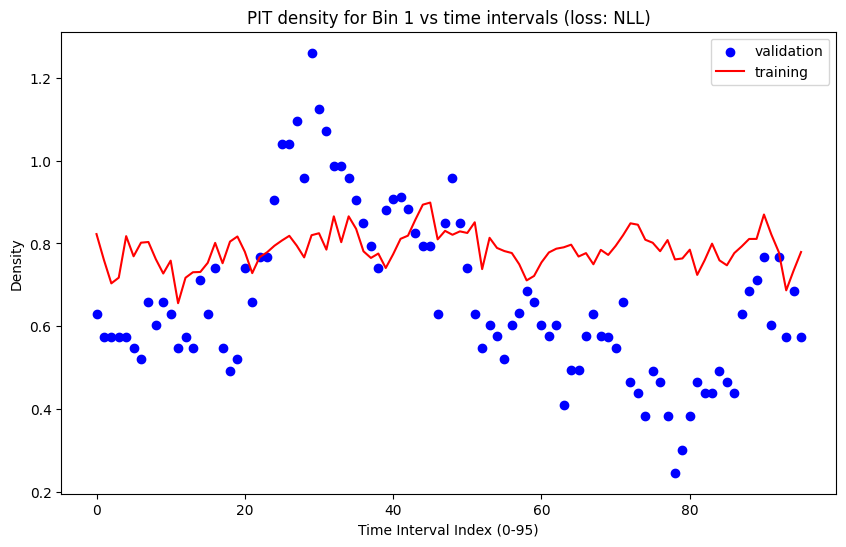

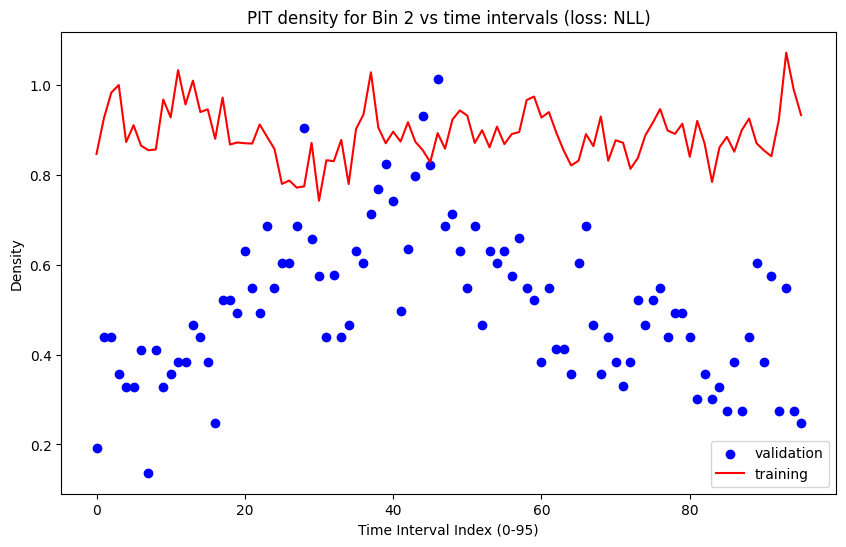

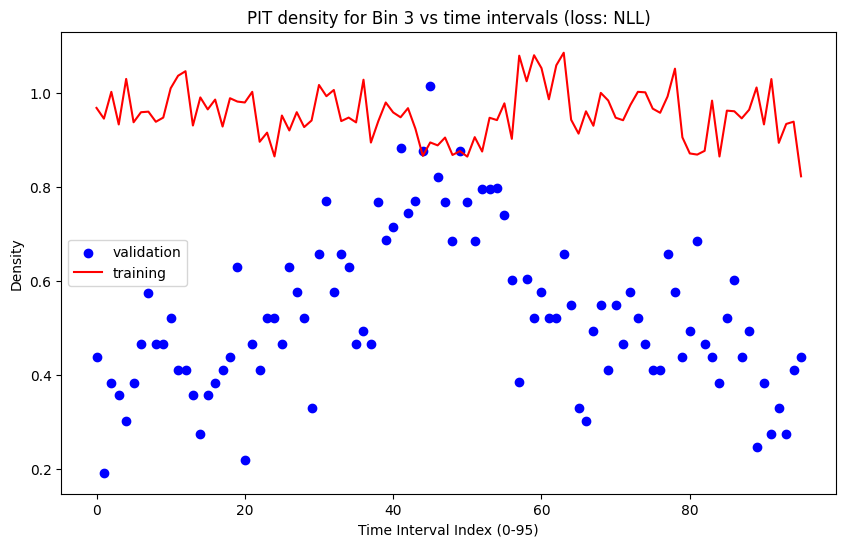

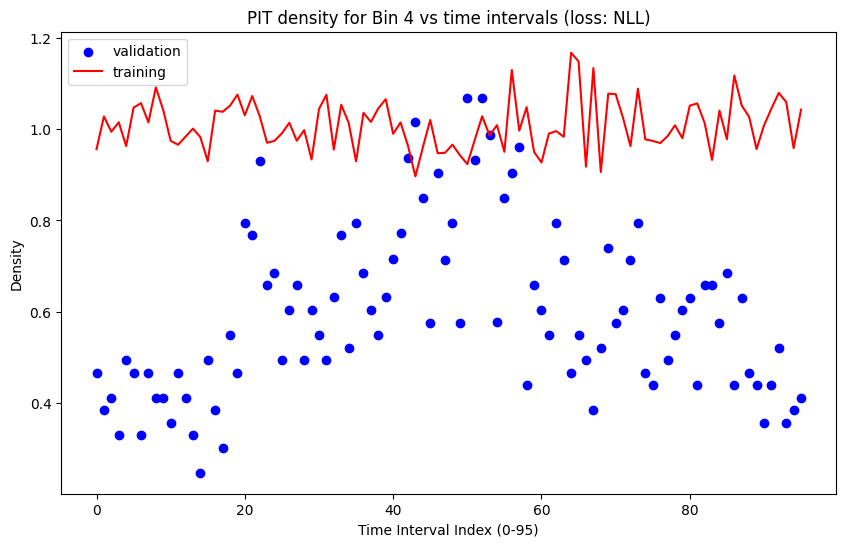

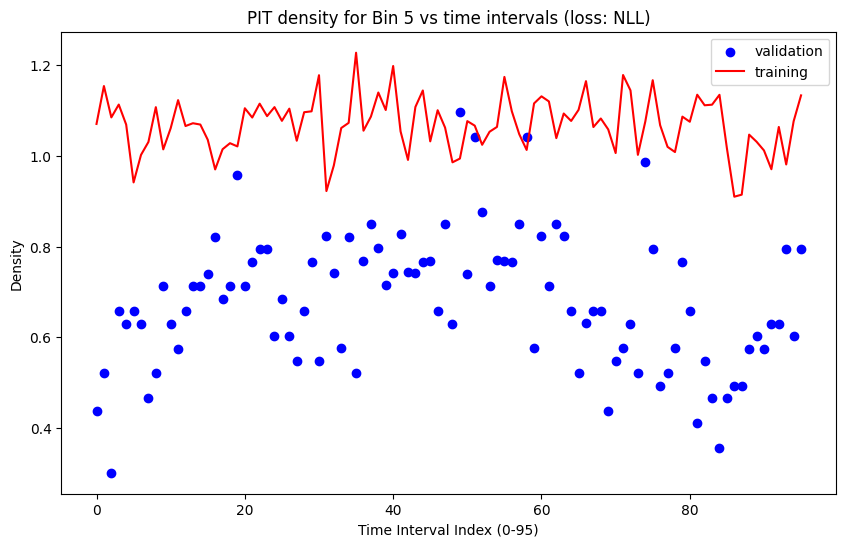

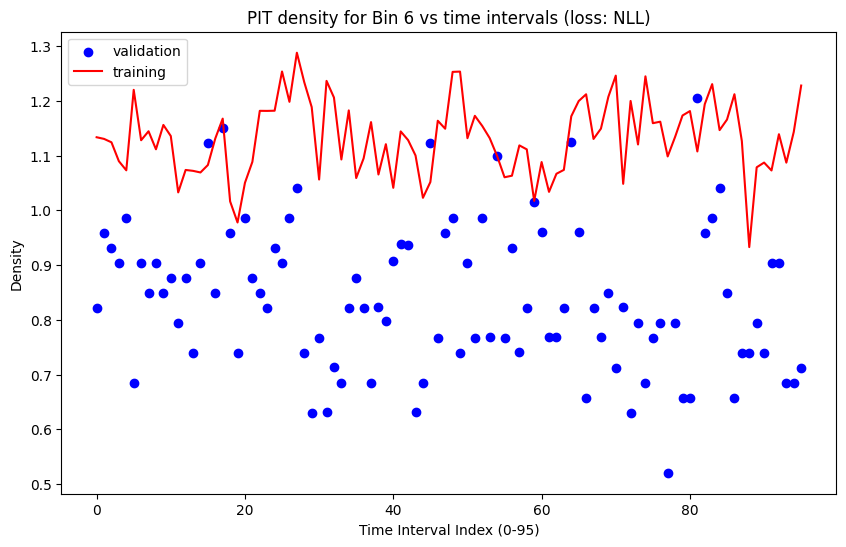

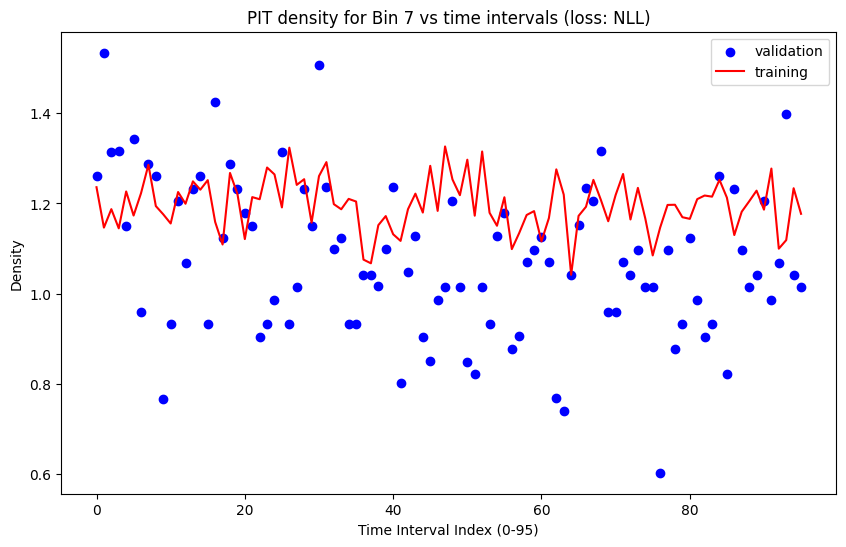

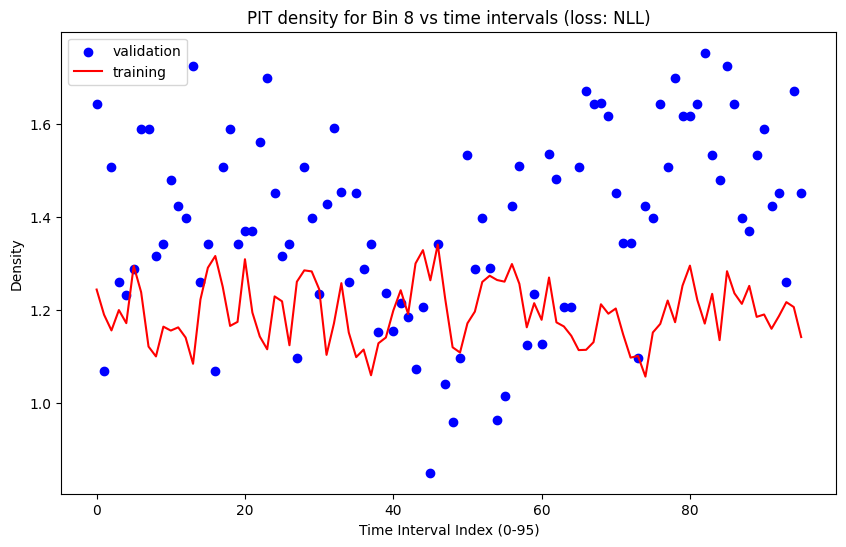

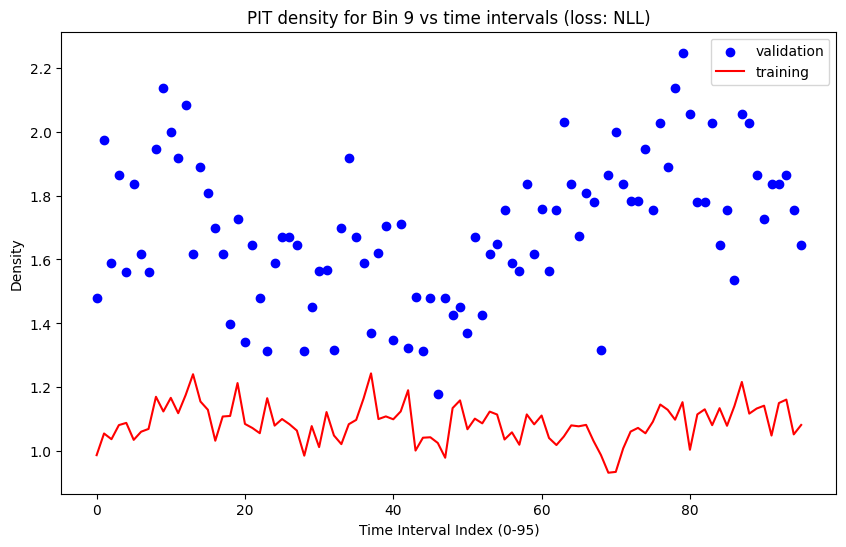

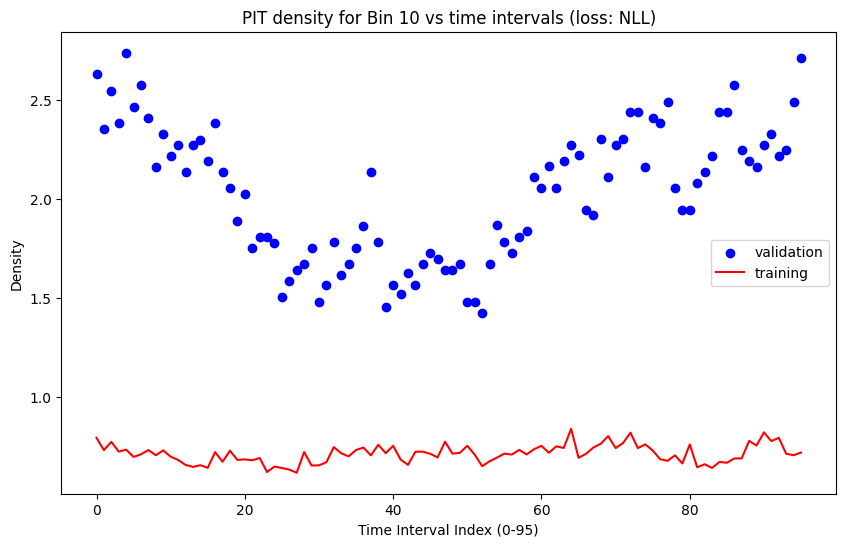

In [7]:
time_intervals = get_all_intervals(daily)
selection = time_intervals

deciles_val = []


pit_scores_per_decile_ws_10_loc = []


# Go over each time interval and save the decile values for all 10 bins

for time in selection:
    deciles, bin_edges = np.histogram(all_interval_pit_values[time], bins=10, density=True)
    deciles_val.append(deciles)


deciles_tr = []

for time in selection:
    deciles, bin_edges = np.histogram(all_interval_pit_values_tr[time], bins=10, density=True)
    deciles_tr.append(deciles)


# Convert list of arrays into a NumPy array of shape (96, 10)

deciles_array_val = np.array(deciles_val)

# Transpose to get shape (10, 96), so each row corresponds to a bin
bins_over_time_val = deciles_array_val.T  # Shape: (10, 96)


# Convert list of arrays into a NumPy array of shape (96, 10)
deciles_array_train = np.array(deciles_tr)

# Transpose to get shape (10, 96), so each row corresponds to a bin
bins_over_time_train = deciles_array_train.T  # Shape: (10, 96)


time_indices = np.arange(0, bins_over_time_val.shape[1])  # 0 to 95

plt.figure(figsize=(10, 6))

# Plot each bin separately
for bin_idx in range(bins_over_time_val.shape[0]):  # Iterate over bins (0 to 9)
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.scatter(time_indices, bins_over_time_val[bin_idx], label="validation", color='blue')
    ax.plot(time_indices, bins_over_time_train[bin_idx], label="training", color='red')

    ax.set_xlabel("Time Interval Index (0-95)")
    ax.set_ylabel("Density")
    ax.set_title(f"PIT density for Bin {bin_idx+1} vs time intervals (loss: NLL)")  # Updated title
    ax.legend()

    # Store the plot in the array
    pit_scores_per_decile_ws_10_loc.append(fig)

    # Optionally, you can display the plot immediately
    plt.show()


### CRPS-Scores

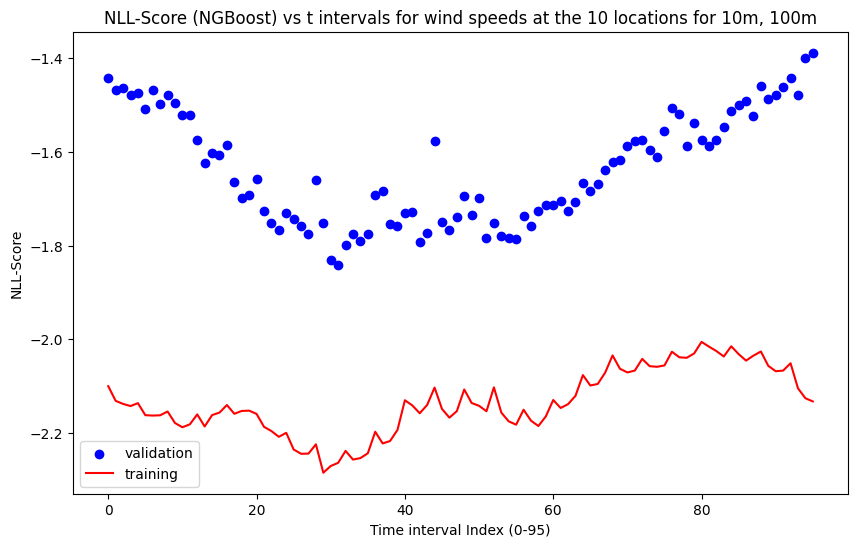

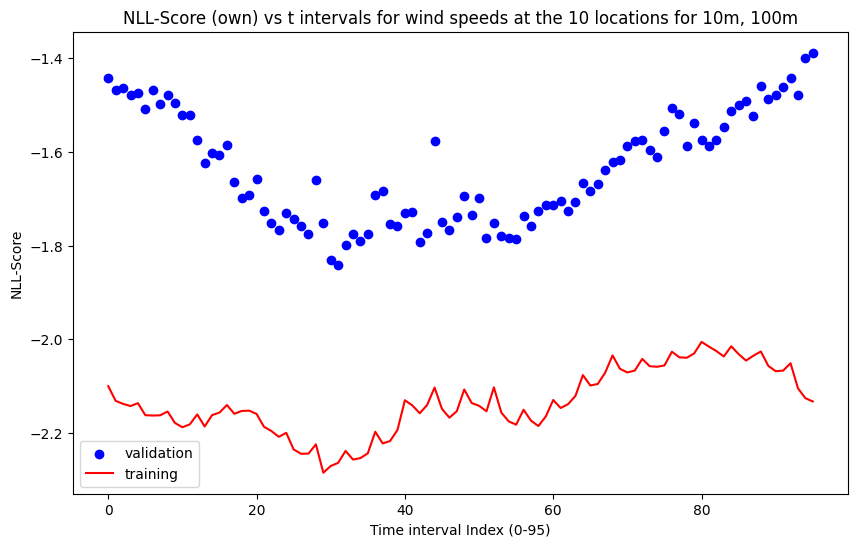

In [26]:
crps_nll_for_time_intervals_ws_10_loc = []

# Plot CRPS-Score vs time intervals
fig1, ax1 = plt.subplots(figsize=(10, 6))
ax1.scatter(np.arange(0, 96), model_scores, marker='o', color='b', label='validation')
ax1.plot(np.arange(0, 96), model_scores_tr, color='r', label='training')
ax1.legend()
ax1.set_title("NLL-Score (NGBoost) vs t intervals for wind speeds at the 10 locations for 10m, 100m")
ax1.set_xlabel("Time interval Index (0-95)")
ax1.set_ylabel("NLL-Score")


# Plot Log(NLL-Score + 2) vs time intervals
fig2, ax2 = plt.subplots(figsize=(10, 6))
ax2.scatter(np.arange(0, 96), [ all_interval_nll_scores[interval] for interval in all_interval_nll_scores ], marker='o', color='b', label='validation')# + 2 because of negative NLL values, log because some NLL values are large
ax2.plot(np.arange(0, 96), [ all_interval_nll_scores_tr[interval] for interval in all_interval_nll_scores_tr ], color='r', label='training') # + 2 because of negative NLL values, log because some NLL values are large
ax2.legend()
ax2.set_title("NLL-Score (own) vs t intervals for wind speeds at the 10 locations for 10m, 100m")
ax2.set_xlabel("Time interval Index (0-95)")
ax2.set_ylabel("NLL-Score")


crps_nll_for_time_intervals_ws_10_loc.append(fig1)
crps_nll_for_time_intervals_ws_10_loc.append(fig2)


### Results scaled power, input: p_t-1, ws at 10 locations for 10m, 100m (Loss NLL)
- Dataframe: "results_mean_wind_speeds" stores for each time interval:
    - 'deciles_train',
    - 'deciles_val',
    - 'model_score_train',
    - 'model_score_val',
    - 'nll_score_train',
    - 'nll_score_val'

- plots:
    - pit_plots_per_interval_val_ws_10_loc: PIT-Histograms per time interval of validation dataset. Accessed via [0] - [95]
    - pit_plots_per_interval_train_ws_10_loc: PIT-Histograms per time interval of training dataset. Accessed via [0] - [95]
    - pit_scores_per_decile_ws_10_loc: PIT-scores across time intervals per bin for validation, training. Each bin accessed via [0] - [9]
    - crps_nll_for_time_intervals_ws_10_loc: CRPS-Score and Negative log likelihood across time intervals. CRPS accessed via [0], NLL via [1]
    

#### Dataframe: "results_mean_wind_speeds" stores for each time interval

In [21]:
results = {
    'time_interval': [],
    'deciles_train': [],
    'deciles_val': [],
    'model_score_train': [],
    'model_score_val': [],
    'nll_score_train': [],
    'nll_score_val': [],
}


# Loop over intervals and save results to the dictionary
for i, time in enumerate(selection):
    results['time_interval'].append(time)
    
    # Append the specific row (deciles for the current time interval) instead of the entire array
    results['deciles_train'].append(deciles_array_train[i])  # Use 'i' to index the correct row
    results['deciles_val'].append(deciles_array_val[i])      # Same for validation deciles
    
    # Append model scores for the specific time interval
    results['model_score_train'].append(model_scores_tr[i])
    results['model_score_val'].append(model_scores[i])
    
    # Append NLL scores for the specific time interval
    results['nll_score_train'].append(all_interval_nll_scores_tr[time])
    results['nll_score_val'].append(all_interval_nll_scores[time])


# Convert the dictionary into a pandas DataFrame
results_mean_wind_speeds = pd.DataFrame(results)


# Display the DataFrame
results_mean_wind_speeds


,time_interval,deciles_train,deciles_val,model_score_train,model_score_val,nll_score_train,nll_score_val
0,00_00,"[0.8226907131224352, 0.8463086283316917, 0.968...","[0.6301686126498782, 0.1917904473282238, 0.438...",-2.099834,-1.441809,-2.099834,-1.441809
1,00_15,"[0.7603351687614563, 0.9257967080774211, 0.945...","[0.5753498015359809, 0.43836175355122353, 0.19...",-2.131165,-1.468091,-2.131165,-1.468091
2,00_30,"[0.7037407820080097, 0.9828781871620248, 1.002...","[0.5753592751384743, 0.4383689715340757, 0.383...",-2.137628,-1.463966,-2.137628,-1.463966
3,00_45,"[0.7174432763301737, 0.9997160407879466, 0.933...","[0.5754479653211553, 0.35622969281785805, 0.35...",-2.142160,-1.478365,-2.142160,-1.478365
4,01_00,"[0.8177011975860667, 0.872738778192821, 1.0299...","[0.5753717143845263, 0.32878383679115786, 0.30...",-2.136057,-1.473807,-2.136057,-1.473807
...,...,...,...,...,...,...,...
91,22_45,"[0.8214179182640854, 0.8410690646340394, 1.029...","[0.6027421961696201, 0.5753448236164554, 0.273...",-2.066575,-1.461417,-2.066575,-1.461417
92,23_00,"[0.7792540557905004, 0.9216558121786121, 0.893...","[0.7671286461784712, 0.2739745164923112, 0.328...",-2.050966,-1.443385,-2.050966,-1.443385
93,23_15,"[0.686894005645277, 1.0715546488066323, 0.9341...","[0.5753544039710538, 0.5479565752105273, 0.273...",-2.104341,-1.478414,-2.104341,-1.478414
94,23_30,"[0.7347411538110215, 0.9901324639592374, 0.939...","[0.6849550046279603, 0.27398200185118415, 0.41...",-2.125520,-1.399139,-2.125520,-1.399139


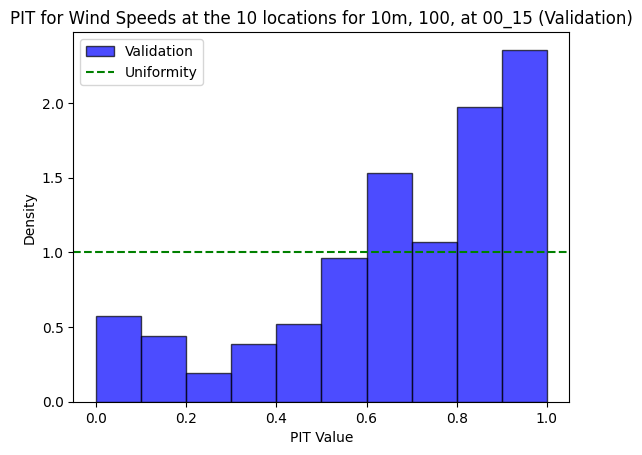

In [10]:
pit_plots_per_interval_val_ws_10_loc[1] #PIT-Histograms per time interval of validation dataset. Accessed via [0] - [95]

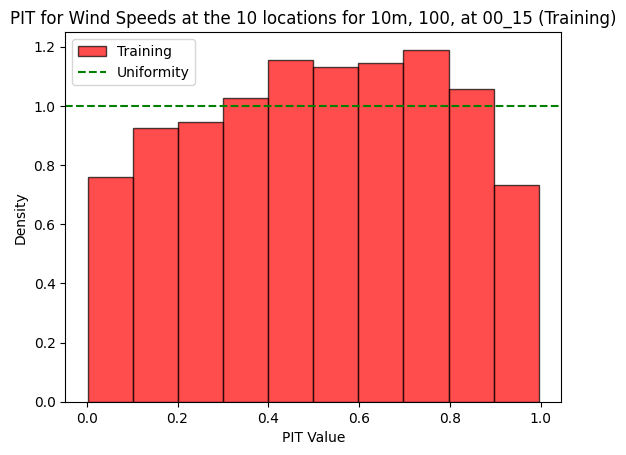

In [11]:
pit_plots_per_interval_train_ws_10_loc[1] #PIT-Histograms per time interval of training dataset. Accessed via [0] - [95]


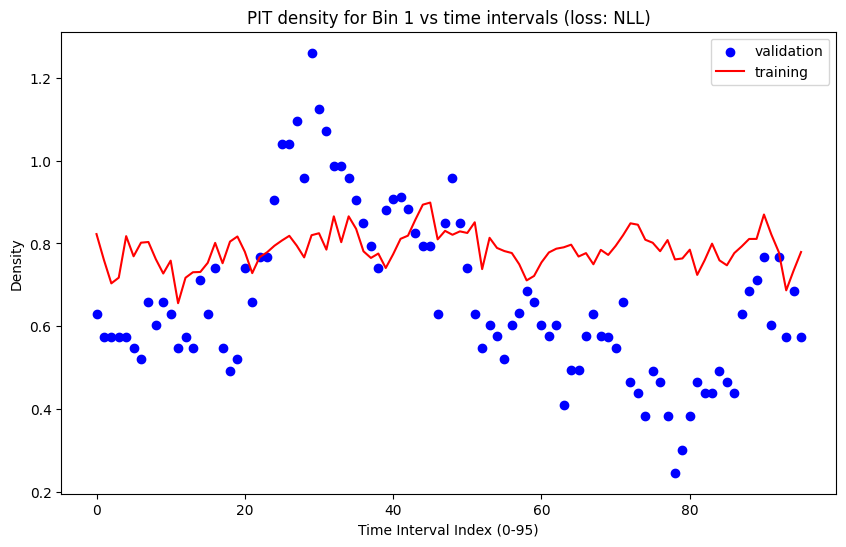

In [12]:
pit_scores_per_decile_ws_10_loc[0] #PIT-scores across time intervals per bin for validation, training. Each bin accessed via [0] - [9]


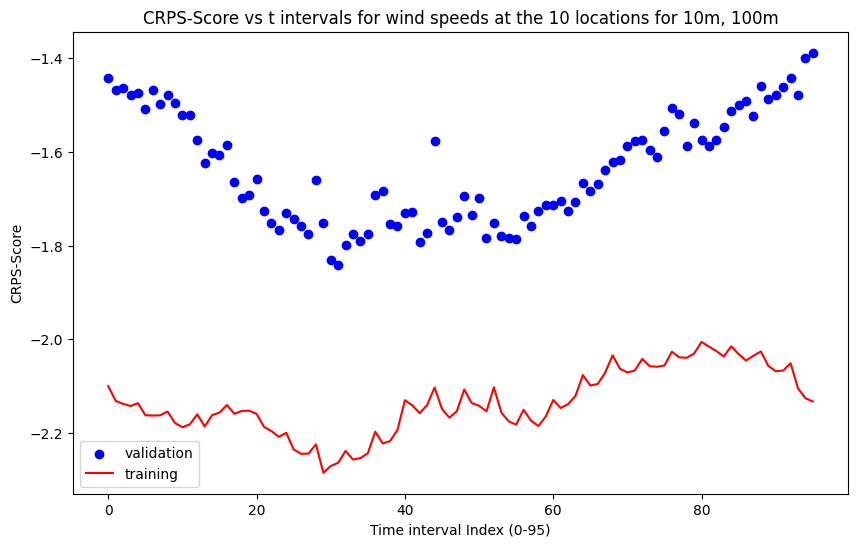

In [13]:
crps_nll_for_time_intervals_ws_10_loc[0] #CRPS-Score and Negative log likelihood across time intervals. CRPS accessed via [0], NLL via [1]

In [14]:
print("training ended for loss NLL")

training ended for loss NLL


In [46]:
max_key = max(all_interval_nll_scores, key=all_interval_nll_scores.get)  # 'B'
max_value = all_interval_nll_scores[max_key]  # 25

max_key, max_value

('08_15', -1.482071496963632)

In [100]:
def cdf_squared1(z, dist):
    return (dist.cdf(z))**2

def cdf_squared2(z, dist):
    return (1- dist.cdf(z))**2


results = []
errors = []

# Loop over each value in y_val and calculate the integral
for y_value, dist in zip(y_validation, y_val_dists):  # Assuming y_val is the list/array of data and y_val_dists contains distributions
    result1, error1 = quad(cdf_squared1, -np.inf, y_value, args=(dist.dist,))
    result2, error2 = quad(cdf_squared2, y_value, np.inf, args=(dist.dist,))
    result = result1 + result2
    error = error1 + error2
    
    results.append(result)
    errors.append(error)

In [109]:
results = []
errors = []

for y_value, dist in zip(y_train, y_train_dists):  # Assuming y_val is the list/array of data and y_val_dists contains distributions
    result1, error1 = quad(cdf_squared1, -np.inf, y_value, args=(dist.dist,))
    result2, error2 = quad(cdf_squared2, y_value, np.inf, args=(dist.dist,))
    result = result1 + result2
    error = error1 + error2
    
    results.append(result)
    errors.append(error)

In [110]:
np.mean(results)

0.02900680140070292

In [70]:
interval_pit_values[0:10] - interval_pit_values_1[0:10]

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

array([0.04409813, 0.5488989 , 0.89289878, 0.56156101, 0.84489265,
       0.48038113, 0.94271116, 0.85777239, 0.81006435, 0.7543785 ])

In [53]:
all_interval_nll_scores_tr

{'03_00': -1.669384319258614}

In [54]:
all_interval_nll_scores

{'03_00': -1.1771079363027928}

In [57]:
all_interval_nll_scores_tr

{'03_00': -1.6560829859213009}

In [58]:
all_interval_nll_scores

{'03_00': -1.1266026089128613}

In [51]:
- y_train_dists.logpdf(y_train).mean()

-1.669384319258614

In [63]:
crps_scores

[-1.178569850219964]

In [34]:
model.score(X_validation, y_validation)

0.2638071550758754

In [41]:
model.LogScore().total_score()

AttributeError: 'NGBRegressor' object has no attribute 'LogScore'

In [31]:
crps_scores

[0.2638071550758754]

In [109]:
np.exp(y_val_dists._params[1, 0])

0.3476804658054693

In [111]:
y_val_dists._params[:, 0]

array([-0.39547257, -1.05647142])

In [ ]:
from ngboost.distns.lognormal import LogNormal
LogNormal(y_val_dists._params[:, 0]) # == y_val_dists[0]

In [114]:
dir(y_val_dists[0])

['__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattr__',
 '__getattribute__',
 '__getitem__',
 '__getstate__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__len__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_params',
 'censored_scores',
 'dist',
 'eps',
 'fit',
 'implementation',
 'loc',
 'n_params',
 'params',
 'predict',
 'scale',
 'scores',
 'uncensor']

In [117]:
(y_val_dists[0:]).get("scale")

TypeError: 'NoneType' object is not callable

In [124]:
y_val_dists[0].dist.ppf(0.5)

0.6733617553472353

In [136]:
-y_val_dists.dist.logpdf(y_validation).mean()

-1.1630771976390608

In [51]:
y_val_dists[0:5].params

{'s': array([0.34768047, 0.26631921, 0.21385154, 0.25053376, 0.34486854]),
 'scale': array([0.67336176, 0.4968943 , 0.27074996, 0.44942671, 0.66124274])}

In [53]:
0.67336176*np.exp(0.5*0.34768047**2)

0.7153154064068591

In [54]:
0.4968943 *np.exp(0.5*0.26631921**2)

0.5148318220621311

In [64]:
all_interval_nll_scores_tr

{'03_00': nan}

In [75]:
y_train_pred[0:5]

array([0.09568807, 0.38966506, 0.41084806, 0.21746715, 0.11953235])

In [79]:
y_train_dists[0:5].params

{'s': array([0.4072561 , 0.2434533 , 0.22927188, 0.33079868, 0.43623323]),
 'scale': array([0.0880729 , 0.37828685, 0.40019049, 0.20588832, 0.10868321])}

In [99]:
y_train_dists.params['scale'] * np.exp(0.5*y_train_dists.params['s']**2) - y_train_pred

array([ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
        0.00000000e+00,  0.00000000e+00, -1.11022302e-16])

In [97]:
y_train_dists.params['scale']

array([0.0880729 , 0.37828685, 0.40019049, ..., 0.57741342, 0.49996553,
       0.556762  ])

In [22]:
y_val_pred[0:5] / np.exp(0.5*y_val_dists[0:5].scale**2) #is one way to calculate the scale argument e^mu of the log normal distribution = median

array([0.66876288, 0.50160089, 0.26912058, 0.45175471, 0.66128796])

In [23]:
np.exp(y_val_dists[0:5].loc) # is another way to calculate the scale argument e^mu of the log normal distribution = median

array([0.66876288, 0.50160089, 0.26912058, 0.45175471, 0.66128796])

In [28]:
y_val_dists[0]

<ngboost.distns.distn.Distn.uncensor.<locals>.DistWithUncensoredScore at 0x19352d8fb00>

In [127]:
y_val_dists[0:5].dist.median()

array([0.67336176, 0.4968943 , 0.27074996, 0.44942671, 0.66124274])

In [72]:
y_train_dists[0:5].scale

array([0.4072561 , 0.2434533 , 0.22927188, 0.33079868, 0.43623323])

In [77]:
y_train_dists[0:5]

In [15]:
def compute_nll(y_true, pred_dists):
    """Calculate the negative log-likelihood for true values given predicted distributions."""
    return -np.mean(pred_dists.logpdf(y_true))
    #return pred_dists.logpdf(y_true)

In [17]:
nll_validation = compute_nll(y_validation, y_val_dists)
nll_validation

3456.6845404666815

# Analysis of the max, min power values of all time intervals
- different min power values leads to problems when using log normal distribution
- lead to the idea of scaling the power values

In [ ]:
pd.set_option('display.max_columns', None)
daily.filter(like='power').describe()


,power_00_00,power_00_15,power_00_30,power_00_45,power_01_00,power_01_15,power_01_30,power_01_45,power_02_00,power_02_15,power_02_30,power_02_45,power_03_00,power_03_15,power_03_30,power_03_45,power_04_00,power_04_15,power_04_30,power_04_45,power_05_00,power_05_15,power_05_30,power_05_45,power_06_00,power_06_15,power_06_30,power_06_45,power_07_00,power_07_15,power_07_30,power_07_45,power_08_00,power_08_15,power_08_30,power_08_45,power_09_00,power_09_15,power_09_30,power_09_45,power_10_00,power_10_15,power_10_30,power_10_45,power_11_00,power_11_15,power_11_30,power_11_45,power_12_00,power_12_15,power_12_30,power_12_45,power_13_00,power_13_15,power_13_30,power_13_45,power_14_00,power_14_15,power_14_30,power_14_45,power_15_00,power_15_15,power_15_30,power_15_45,power_16_00,power_16_15,power_16_30,power_16_45,power_17_00,power_17_15,power_17_30,power_17_45,power_18_00,power_18_15,power_18_30,power_18_45,power_19_00,power_19_15,power_19_30,power_19_45,power_20_00,power_20_15,power_20_30,power_20_45,power_21_00,power_21_15,power_21_30,power_21_45,power_22_00,power_22_15,power_22_30,power_22_45,power_23_00,power_23_15,power_23_30,power_23_45
count,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.00000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.00000,3288.000000,3288.000000,3288.000000,3288.000000,3288.00000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3288.000000,3287.000000,3287.000000,3287.000000
mean,3979.246959,3965.302007,3953.027372,3939.637165,3924.551703,3910.936740,3898.461071,3886.204684,3874.329988,3866.357056,3859.430961,3851.281326,3845.068431,3840.19708,3832.574818,3831.910584,3829.105535,3813.157847,3795.897202,3781.116484,3747.369830,3696.284672,3648.781326,3597.405718,3553.599148,3517.442822,3485.223540,3457.836679,3429.733273,3413.136861,3399.271898,3387.340328,3385.053832,3391.450122,3395.93826,3404.318127,3421.720195,3444.776156,3462.989051,3479.46320,3500.529805,3524.253650,3542.204075,3552.418491,3565.381691,3580.204075,3591.248175,3595.738443,3599.093978,3603.766423,3608.805353,3615.757299,3620.541058,3629.778285,3643.357056,3649.305961,3654.532543,3659.456813,3671.538625,3681.702555,3684.235097,3693.576338,3707.334854,3715.537105,3724.868309,3732.014294,3742.774939,3752.251217,3762.761861,3772.598844,3786.072080,3799.708333,3822.036800,3853.956509,3882.993917,3917.213808,3954.649939,3994.073601,4031.831509,4054.022810,4073.412409,4095.556265,4112.155109,4112.660888,4110.881691,4111.636861,4108.125608,4100.901460,4092.463504,4083.454380,4071.452859,4057.505779,4042.699513,4025.923030,4012.085488,3996.911774
std,3247.133533,3247.080270,3249.877871,3246.427083,3241.084494,3236.494768,3234.009186,3230.953308,3227.265080,3228.030969,3230.493773,3233.294712,3233.648318,3236.14730,3240.755048,3256.793683,3270.378859,3281.250007,3292.435784,3327.126486,3346.092365,3357.986295,3379.808989,3398.076399,3419.071693,3436.538246,3457.733957,3473.283122,3479.351255,3485.916776,3490.167216,3489.592073,3490.845012,3494.598371,3492.15767,3492.330657,3493.454259,3496.031383,3498.657556,3503.59857,3506.122492,3512.854249,3516.670996,3512.776019,3510.5976

# Old

In [7]:
#daily_filter = get_columns_by_time(daily, time_interval)

In [8]:
#daily_filter['ws_mean_avg'] = (daily_filter['ws_100m_loc_mean'] + daily_filter['ws_10m_loc_mean']) / 2
#daily_filter['ws_mean_diff'] = (daily_filter['ws_100m_loc_mean'] - daily_filter['ws_10m_loc_mean']) / 2

In [9]:
df_daily_time_delay = delay(daily_filter, delays=1, columns="power")
df_daily_time_delay.head(3)

,power_t-1,power,ws_10m_loc_1,ws_10m_loc_10,ws_10m_loc_2,ws_10m_loc_3,ws_10m_loc_4,ws_10m_loc_5,ws_10m_loc_6,ws_10m_loc_7,...,ws_100m_loc_10,ws_100m_loc_2,ws_100m_loc_3,ws_100m_loc_4,ws_100m_loc_5,ws_100m_loc_6,ws_100m_loc_7,ws_100m_loc_8,ws_100m_loc_9,ws_100m_loc_mean
date,,,,,,,,,,,,,,,,,,,,,
2016-01-02,0.084000,0.035000,2.72,1.68,2.64,3.14,3.11,3.21,3.11,2.63,...,2.42,3.86,5.39,5.20,5.87,5.65,4.87,4.52,5.32,5.19
2016-01-03,0.035000,0.388235,6.02,5.40,5.30,6.82,5.49,6.48,6.41,5.93,...,8.00,8.01,10.19,8.20,9.73,9.61,8.88,9.47,8.93,8.77
2016-01-04,0.388235,0.298176,5.39,4.54,4.85,6.18,5.32,5.66,5.32,5.22,...,8.98,9.37,10.38,8.35,9.89,10.07,8.79,9.93,8.92,8.92


In [10]:
#df_daily_time_delay_filter = df_daily_time_delay[['power_t-1', 'power', 'ws_10m_loc_1', 'ws_100m_loc_1']]

In [11]:
#df_daily_time_delay_filter = df_daily_time_delay[['power_t-1', 'power', 'ws_10m_loc_1', 'ws_10m_loc_2', 'ws_10m_loc_3', 'ws_100m_loc_1', 'ws_100m_loc_2', 'ws_100m_loc_3']]

In [12]:
#df_daily_time_delay_filter = df_daily_time_delay[['power_t-1', 'power', 'ws_100m_loc_mean', 'ws_10m_loc_mean']]

In [13]:
df_daily_time_delay_filter = df_daily_time_delay[[col for col in df_daily_time_delay.columns if not col.endswith('mean')]]
df_daily_time_delay_filter.head(3)

,power_t-1,power,ws_10m_loc_1,ws_10m_loc_10,ws_10m_loc_2,ws_10m_loc_3,ws_10m_loc_4,ws_10m_loc_5,ws_10m_loc_6,ws_10m_loc_7,...,ws_100m_loc_1,ws_100m_loc_10,ws_100m_loc_2,ws_100m_loc_3,ws_100m_loc_4,ws_100m_loc_5,ws_100m_loc_6,ws_100m_loc_7,ws_100m_loc_8,ws_100m_loc_9
date,,,,,,,,,,,,,,,,,,,,,
2016-01-02,0.084000,0.035000,2.72,1.68,2.64,3.14,3.11,3.21,3.11,2.63,...,4.37,2.42,3.86,5.39,5.20,5.87,5.65,4.87,4.52,5.32
2016-01-03,0.035000,0.388235,6.02,5.40,5.30,6.82,5.49,6.48,6.41,5.93,...,9.61,8.00,8.01,10.19,8.20,9.73,9.61,8.88,9.47,8.93
2016-01-04,0.388235,0.298176,5.39,4.54,4.85,6.18,5.32,5.66,5.32,5.22,...,9.98,8.98,9.37,10.38,8.35,9.89,10.07,8.79,9.93,8.92


In [14]:
train, validation, test = to_train_validation_test_data(df_daily_time_delay_filter, "2022-12-31", "2023-12-31")

# of training observations: 2556 | 77.76%
# of validation observations: 365 | 11.10%
# of test observations: 366 | 11.13%


In [15]:
X_train = train.drop('power', axis=1)
y_train = train['power']

In [16]:
X_validation = validation.drop('power', axis=1)
y_validation = validation['power']

In [17]:
model = NGBRegressor(Dist=LogNormal, Score=CRPScore, n_estimators=100, learning_rate=0.03, verbose_eval=True, natural_gradient=True, random_state=42)
model.fit(X_train, y_train, X_val=X_validation, Y_val=y_validation)

# Predict on training data
y_train_pred = model.predict(X_train)
y_train_dists = model.pred_dist(X_train)


y_val_pred = model.predict(X_validation)
y_val_dists = model.pred_dist(X_validation)

# Calculate Mean Squared Error (MSE) for training and validation
train_mse = mean_squared_error(y_train, y_train_pred)
val_mse = mean_squared_error(y_validation, y_val_pred)

# Print the results
print(f"Training features: {[c for c in X_train.columns]} -> {y_train.name}")
print(f"Train MSE:\t {train_mse}")
print(f"Validation MSE:\t {val_mse}")

[iter 0] loss=0.5552 val_loss=0.5761 scale=1.0000 norm=1.1868
[iter 1] loss=0.5374 val_loss=0.5591 scale=1.0000 norm=1.1585
[iter 2] loss=0.5208 val_loss=0.5431 scale=1.0000 norm=1.1345
[iter 3] loss=0.5050 val_loss=0.5277 scale=1.0000 norm=1.1139


[iter 4] loss=0.4899 val_loss=0.5128 scale=1.0000 norm=1.0960
[iter 5] loss=0.4758 val_loss=0.4986 scale=1.0000 norm=1.0813
[iter 6] loss=0.4623 val_loss=0.4853 scale=1.0000 norm=1.0689
[iter 7] loss=0.4495 val_loss=0.4730 scale=1.0000 norm=1.0589
[iter 8] loss=0.4371 val_loss=0.4612 scale=1.0000 norm=1.0505
[iter 9] loss=0.4253 val_loss=0.4498 scale=1.0000 norm=1.0439
[iter 10] loss=0.4140 val_loss=0.4388 scale=1.0000 norm=1.0392
[iter 11] loss=0.4032 val_loss=0.4283 scale=1.0000 norm=1.0361
[iter 12] loss=0.3926 val_loss=0.4180 scale=1.0000 norm=1.0346
[iter 13] loss=0.3825 val_loss=0.4082 scale=1.0000 norm=1.0346
[iter 14] loss=0.3728 val_loss=0.3987 scale=1.0000 norm=1.0358
[iter 15] loss=0.3633 val_loss=0.3898 scale=1.0000 norm=1.0386
[iter 16] loss=0.3543 val_loss=0.3812 scale=1.0000 norm=1.0426
[iter 17] loss=0.3454 val_loss=0.3723 scale=1.0000 norm=1.0480
[iter 18] loss=0.3367 val_loss=0.3640 scale=1.0000 norm=1.0548
[iter 19] loss=0.3285 val_loss=0.3558 scale=1.0000 norm=1.062

In [ ]:
pit_scores = lognorm.cdf(y_validation, s=[y.scale for y in y_val_dists], scale=y_val_pred)


In [18]:
results = pd.DataFrame({
    'y': y_validation,
    'median': y_val_pred, 
    "sigma": [y.scale for y in y_val_dists], 
    'mean': [y_val_pred[i] * np.exp(0.5 * (y.scale ** 2)) for i, y in enumerate(y_val_dists)]})

results

,y,median,sigma,mean
date,,,,
2023-01-01,0.582235,0.736277,0.244729,0.758659
2023-01-02,0.302706,0.202666,0.179439,0.205955
2023-01-03,0.436059,0.392095,0.112301,0.394576
2023-01-04,0.436529,0.346847,0.131569,0.349862
2023-01-05,0.745765,0.728218,0.244729,0.750355
...,...,...,...,...
2023-12-27,0.563588,0.516295,0.129655,0.520653
2023-12-28,0.650765,0.584365,0.142602,0.590337
2023-12-29,0.695353,0.698189,0.238693,0.718364


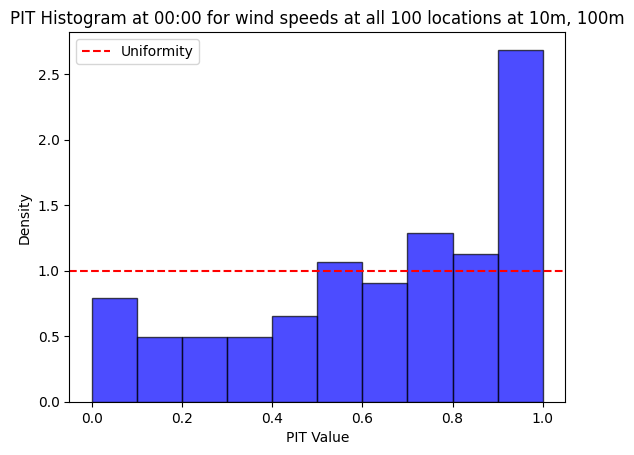

In [19]:
from scipy.stats import lognorm


pit_scores = lognorm.cdf(results['y'], s=results['sigma'], scale=results['median'])

plt.hist(pit_scores, bins=10, range=(0, 1), density=True, alpha=0.7, color='blue', edgecolor='black')
plt.axhline(1, color='red', linestyle='--', label='Uniformity')
plt.title('PIT Histogram at 00:00 for wind speeds at all 100 locations at 10m, 100m')
plt.xlabel('PIT Value')
plt.ylabel('Density')
plt.legend()
plt.show()

In [229]:
y_train_pred, y_train_dists, y_val_pred, y_val_dists, X_train, y_train, X_validation, y_validation = model_NGBoost("07:00", "only_mean_wind", 100, 0.03, LogNormal)

Data loaded and transformed successfully. Shape of DataFrame: (78912, 22)
# of training observations: 2556 | 77.76%
# of validation observations: 365 | 11.10%
# of test observations: 366 | 11.13%


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:124: RuntimeWarning: divide by zero encountered in log
  m, s = sp.stats.norm.fit(np.log(Y))


ValueError: The data contains non-finite values.

In [ ]:
pd.DataFrame({'y': y_validation,'mu': y_val_pred, "sigma": [y.scale for y in y_val_dists]})

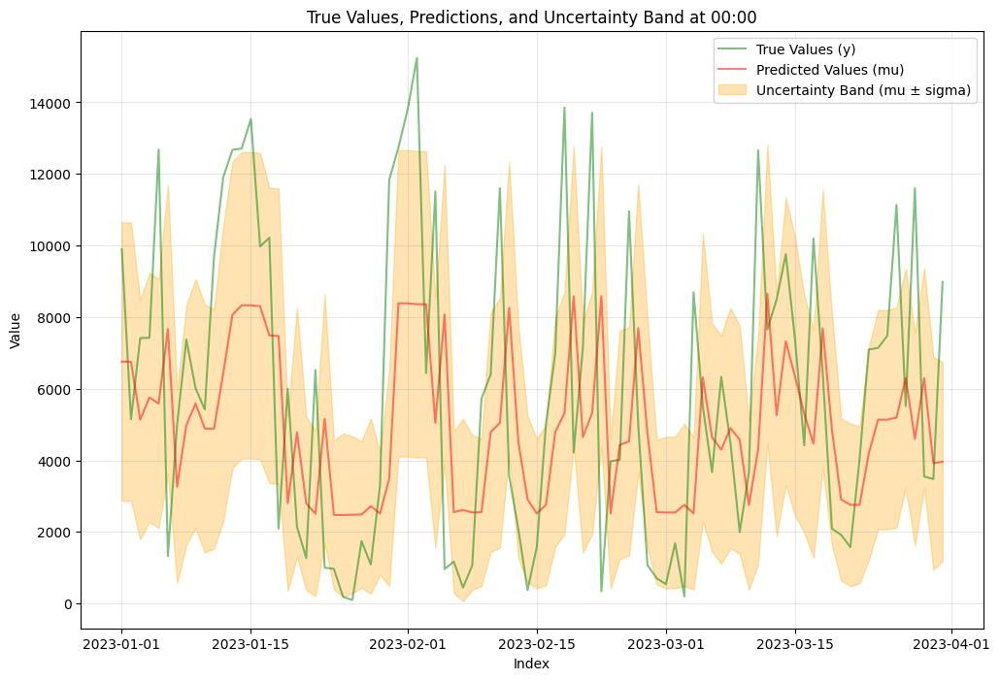

In [ ]:
loc = [y.loc for y in y_val_dists]
scale = [y.scale for y in y_val_dists]


start = 0
end = 90
x = y_validation.index[start:end]
y = y_validation[start:end]
mu = y_val_pred[start:end]
sigma = [y.scale for y in y_val_dists][start:end]

# Plot
plt.figure(figsize=(12, 8))
plt.plot(x, y, label="True Values (y)", color="green", alpha=0.5)
plt.plot(x, mu, label="Predicted Values (mu)", color="red", alpha=0.5)
plt.fill_between(x, mu - sigma, mu + sigma, color="orange", alpha=0.3, label="Uncertainty Band (mu ± sigma)")

# Customize the plot
plt.xlabel("Index")
plt.ylabel("Value")
plt.title("True Values, Predictions, and Uncertainty Band at 00:00")
plt.legend()
plt.grid(alpha=0.3)

In [ ]:
y_train_pred, y_train_dists, y_val_pred, y_val_dists, X_train, y_train, X_validation, y_validation = model_NGBoost("09:00", "only_sin_cos", 500, 0.03)

Data loaded and transformed successfully. Shape of DataFrame: (78912, 22)
# of training observations: 2556 | 77.76%
# of validation observations: 365 | 11.10%
# of test observations: 366 | 11.13%
[iter 0] loss=1863.8893 val_loss=2205.7729 scale=512.0000 norm=451.8419
[iter 1] loss=1861.0479 val_loss=2202.6366 scale=512.0000 norm=451.4320
[iter 2] loss=1858.2150 val_loss=2199.5267 scale=512.0000 norm=451.0259
[iter 3] loss=1855.4044 val_loss=2196.4162 scale=512.0000 norm=450.6224
[iter 4] loss=1852.6169 val_loss=2193.3318 scale=512.0000 norm=450.2223
[iter 5] loss=1849.8511 val_loss=2190.2732 scale=512.0000 norm=449.8251
[iter 6] loss=1847.1068 val_loss=2187.2402 scale=512.0000 norm=449.4310
[iter 7] loss=1844.3839 val_loss=2184.2190 scale=512.0000 norm=449.0397
[iter 8] loss=1841.6663 val_loss=2181.2231 scale=512.0000 norm=448.6424
[iter 9] loss=1838.9699 val_loss=2178.2359 scale=512.0000 norm=448.2503
[iter 10] loss=1836.2947 val_loss=2175.2791 scale=512.0000 norm=447.8620
[iter 11] l

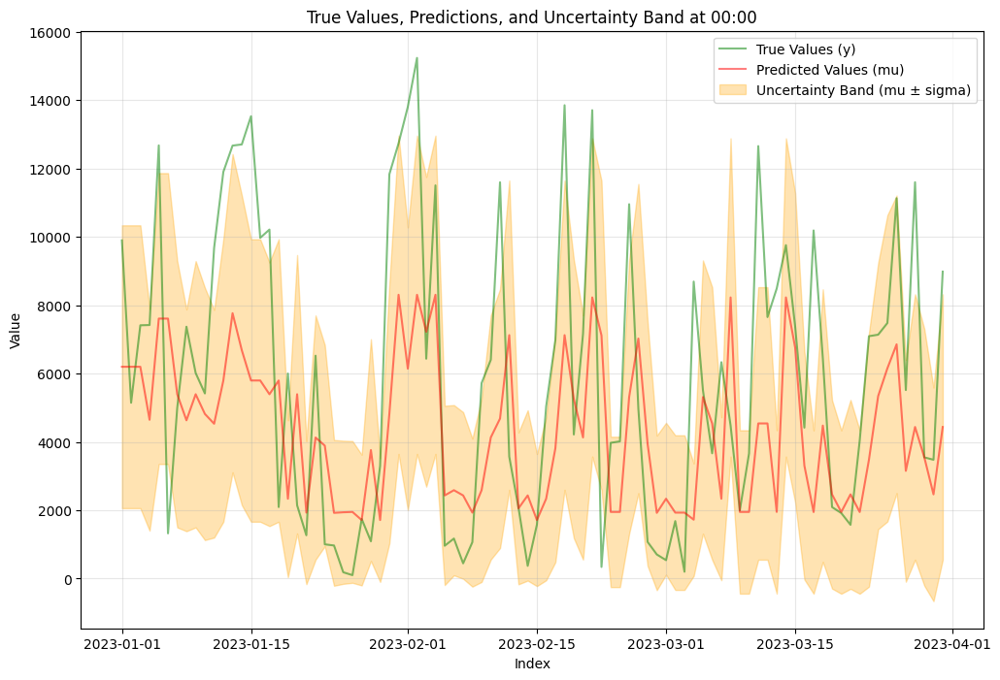

In [ ]:
loc = [y.loc for y in y_val_dists]
scale = [y.scale for y in y_val_dists]


start = 0
end = 90
x = y_validation.index[start:end]
y = y_validation[start:end]
mu = y_val_pred[start:end]
sigma = [y.scale for y in y_val_dists][start:end]

# Plot
plt.figure(figsize=(12, 8))
plt.plot(x, y, label="True Values (y)", color="green", alpha=0.5)
plt.plot(x, mu, label="Predicted Values (mu)", color="red", alpha=0.5)
plt.fill_between(x, mu - sigma, mu + sigma, color="orange", alpha=0.3, label="Uncertainty Band (mu ± sigma)")

# Customize the plot
plt.xlabel("Index")
plt.ylabel("Value")
plt.title("True Values, Predictions, and Uncertainty Band at 00:00")
plt.legend()
plt.grid(alpha=0.3)

In [ ]:
y_train_pred, y_train_dists, y_val_pred, y_val_dists, X_train, y_train, X_validation, y_validation = model_NGBoost("00:00", "only_power", 500, 0.03, Normal)

Data loaded and transformed successfully. Shape of DataFrame: (78912, 22)
# of training observations: 2556 | 77.76%
# of validation observations: 365 | 11.10%
# of test observations: 366 | 11.13%
[iter 0] loss=1735.1167 val_loss=2031.2852 scale=512.0000 norm=449.1209
[iter 1] loss=1732.4641 val_loss=2028.5461 scale=512.0000 norm=448.7341
[iter 2] loss=1729.8357 val_loss=2025.8349 scale=512.0000 norm=448.3507
[iter 3] loss=1727.2315 val_loss=2023.1516 scale=512.0000 norm=447.9707
[iter 4] loss=1724.6512 val_loss=2020.4957 scale=512.0000 norm=447.5936
[iter 5] loss=1722.0945 val_loss=2017.8670 scale=512.0000 norm=447.2200
[iter 6] loss=1719.5612 val_loss=2015.2652 scale=512.0000 norm=446.8515
[iter 7] loss=1717.0512 val_loss=2012.6901 scale=512.0000 norm=446.4864
[iter 8] loss=1714.5641 val_loss=2010.1330 scale=512.0000 norm=446.1250
[iter 9] loss=1712.1012 val_loss=2007.6101 scale=512.0000 norm=445.7736
[iter 10] loss=1709.6593 val_loss=2005.1130 scale=512.0000 norm=445.4234
[iter 11] l

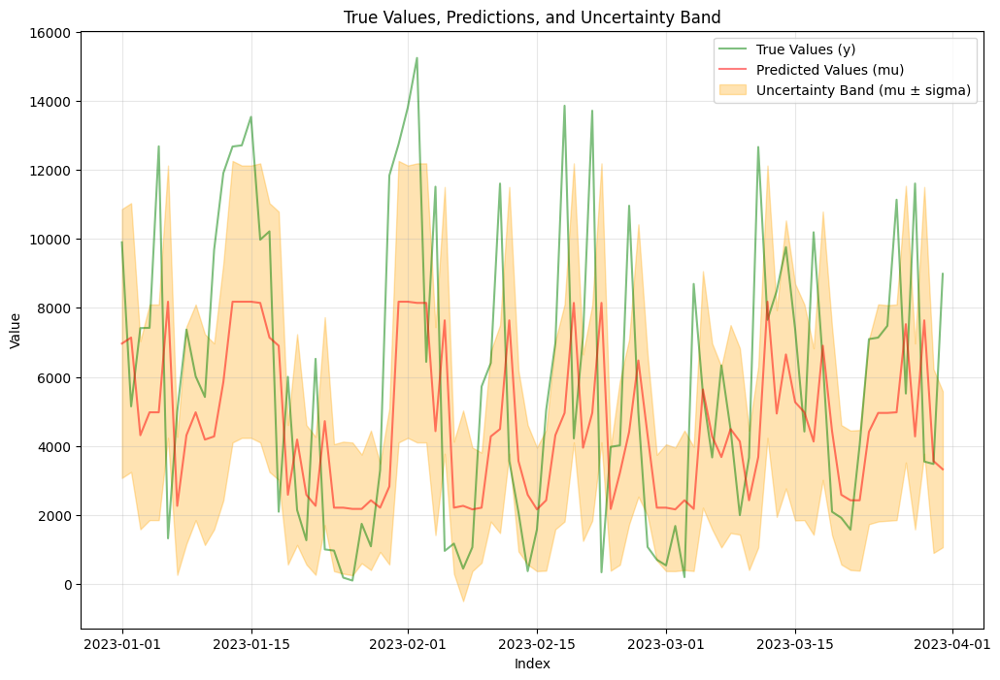

In [ ]:
visualize_predictions_with_uncertainty(y_validation, y_val_pred, y_val_dists, Normal)

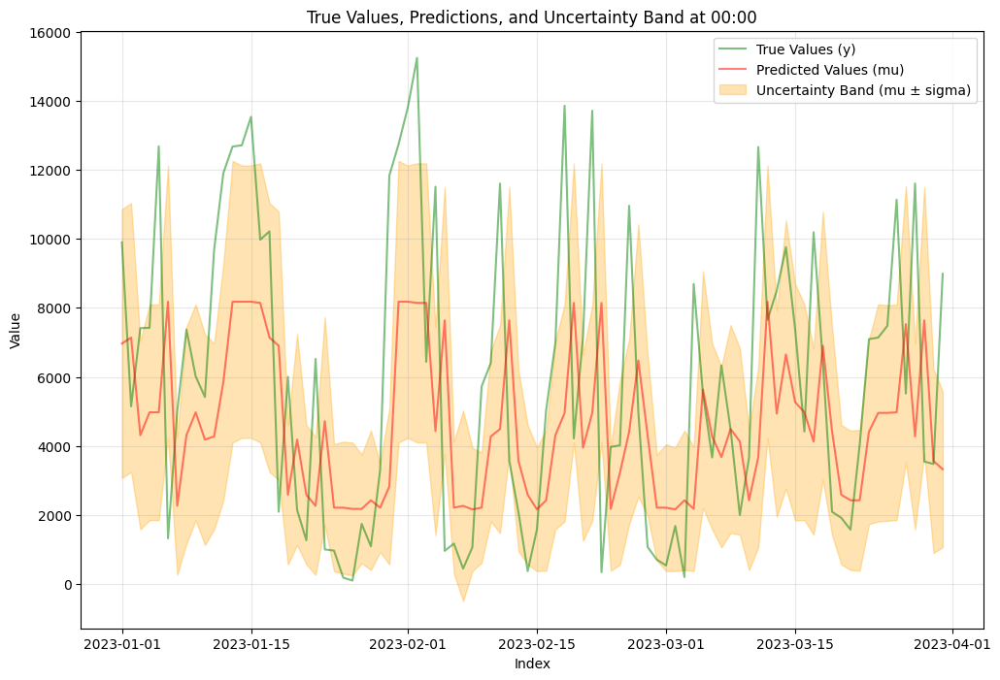

In [ ]:
loc = [y.loc for y in y_val_dists]
scale = [y.scale for y in y_val_dists]


start = 0
end = 90
x = y_validation.index[start:end]
y = y_validation[start:end]
mu = y_val_pred[start:end]
sigma = [y.scale for y in y_val_dists][start:end]

# Plot
plt.figure(figsize=(12, 8))
plt.plot(x, y, label="True Values (y)", color="green", alpha=0.5)
plt.plot(x, mu, label="Predicted Values (mu)", color="red", alpha=0.5)
plt.fill_between(x, mu - sigma, mu + sigma, color="orange", alpha=0.3, label="Uncertainty Band (mu ± sigma)")

# Customize the plot
plt.xlabel("Index")
plt.ylabel("Value")
plt.title("True Values, Predictions, and Uncertainty Band at 00:00")
plt.legend()
plt.grid(alpha=0.3)

In [ ]:
y_train_pred, y_train_dists, y_val_pred, y_val_dists, X_train, y_train, X_validation, y_validation = model_NGBoost("00:00", "all_wind_speeds", 500, 0.03)

Data loaded and transformed successfully. Shape of DataFrame: (78912, 22)
# of training observations: 2556 | 77.76%
# of validation observations: 365 | 11.10%
# of test observations: 366 | 11.13%
[iter 0] loss=1735.1167 val_loss=2023.8149 scale=512.0000 norm=449.1209
[iter 1] loss=1725.9458 val_loss=2013.6660 scale=512.0000 norm=447.7238
[iter 2] loss=1716.8540 val_loss=2003.6300 scale=512.0000 norm=446.3334
[iter 3] loss=1707.7791 val_loss=1993.4909 scale=512.0000 norm=444.9226
[iter 4] loss=1698.8111 val_loss=1983.5033 scale=512.0000 norm=443.5255
[iter 5] loss=1689.8595 val_loss=1973.5589 scale=512.0000 norm=442.1124
[iter 6] loss=1681.0070 val_loss=1963.6665 scale=512.0000 norm=440.7159
[iter 7] loss=1672.2221 val_loss=1953.7931 scale=512.0000 norm=439.3017
[iter 8] loss=1663.5443 val_loss=1944.0916 scale=512.0000 norm=437.9313
[iter 9] loss=1654.8987 val_loss=1934.4053 scale=512.0000 norm=436.5189
[iter 10] loss=1646.3024 val_loss=1924.7534 scale=512.0000 norm=435.1336
[iter 11] l

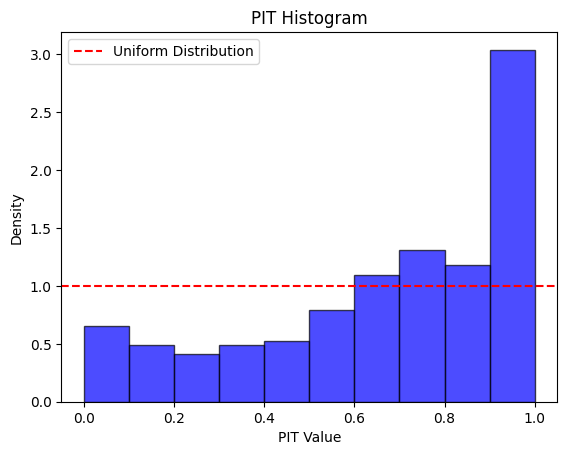

In [ ]:
pit_values = norm.cdf(y_validation, loc=y_val_pred, scale=[y.scale for y in y_val_dists])
plt.hist(pit_values, bins=10, range=(0, 1), density=True, alpha=0.7, color='blue', edgecolor='black')
plt.axhline(1, color='red', linestyle='--', label='Uniform Distribution')
plt.title('PIT Histogram')
plt.xlabel('PIT Value')
plt.ylabel('Density')
plt.legend()
plt.show()

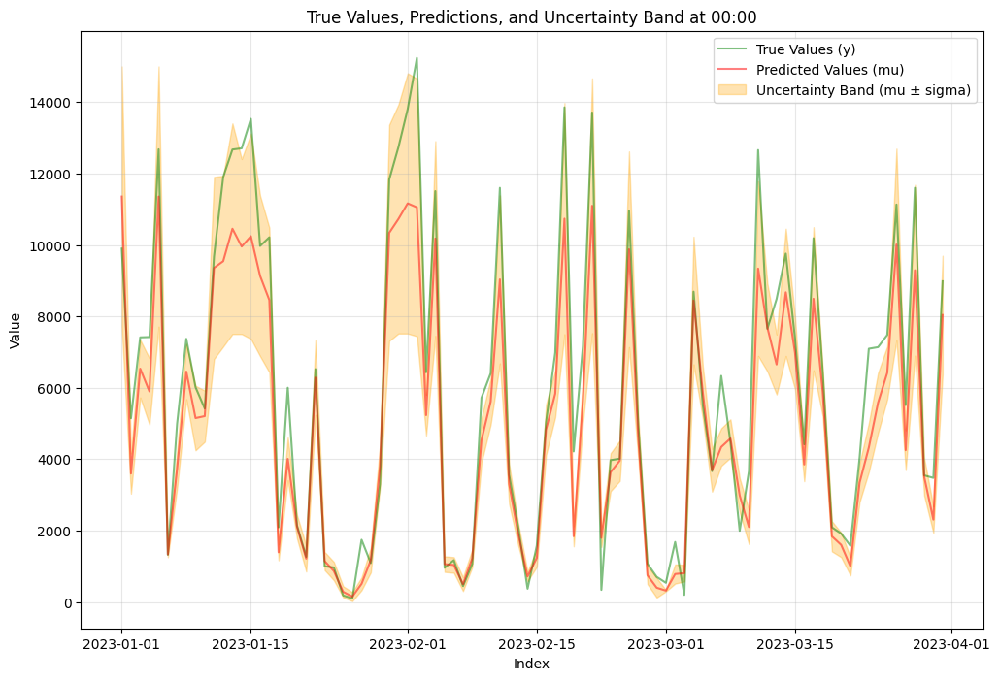

In [ ]:
loc = [y.loc for y in y_val_dists]
scale = [y.scale for y in y_val_dists]


start = 0
end = 90
x = y_validation.index[start:end]
y = y_validation[start:end]
mu = y_val_pred[start:end]
sigma = [y.scale for y in y_val_dists][start:end]

# Plot
plt.figure(figsize=(12, 8))
plt.plot(x, y, label="True Values (y)", color="green", alpha=0.5)
plt.plot(x, mu, label="Predicted Values (mu)", color="red", alpha=0.5)
plt.fill_between(x, mu - sigma, mu + sigma, color="orange", alpha=0.3, label="Uncertainty Band (mu ± sigma)")

# Customize the plot
plt.xlabel("Index")
plt.ylabel("Value")
plt.title("True Values, Predictions, and Uncertainty Band at 00:00")
plt.legend()
plt.grid(alpha=0.3)

In [ ]:
y_train_pred, y_train_dists, y_val_pred, y_val_dists, X_train, y_train, X_validation, y_validation = model_NGBoost("00:00", "max", 500, 0.03)

Data loaded and transformed successfully. Shape of DataFrame: (78912, 22)
# of training observations: 2556 | 77.76%
# of validation observations: 365 | 11.10%
# of test observations: 366 | 11.13%
[iter 0] loss=1735.1167 val_loss=2023.8149 scale=512.0000 norm=449.1209
[iter 1] loss=1725.9458 val_loss=2013.6660 scale=512.0000 norm=447.7238
[iter 2] loss=1716.8540 val_loss=2003.6300 scale=512.0000 norm=446.3334
[iter 3] loss=1707.7791 val_loss=1993.4909 scale=512.0000 norm=444.9226
[iter 4] loss=1698.8111 val_loss=1983.5033 scale=512.0000 norm=443.5255
[iter 5] loss=1689.8595 val_loss=1973.5589 scale=512.0000 norm=442.1124
[iter 6] loss=1681.0070 val_loss=1963.6665 scale=512.0000 norm=440.7159
[iter 7] loss=1672.2221 val_loss=1953.7931 scale=512.0000 norm=439.3017
[iter 8] loss=1663.5443 val_loss=1944.0916 scale=512.0000 norm=437.9313
[iter 9] loss=1654.8987 val_loss=1934.4053 scale=512.0000 norm=436.5189
[iter 10] loss=1646.3024 val_loss=1924.7534 scale=512.0000 norm=435.1336
[iter 11] l

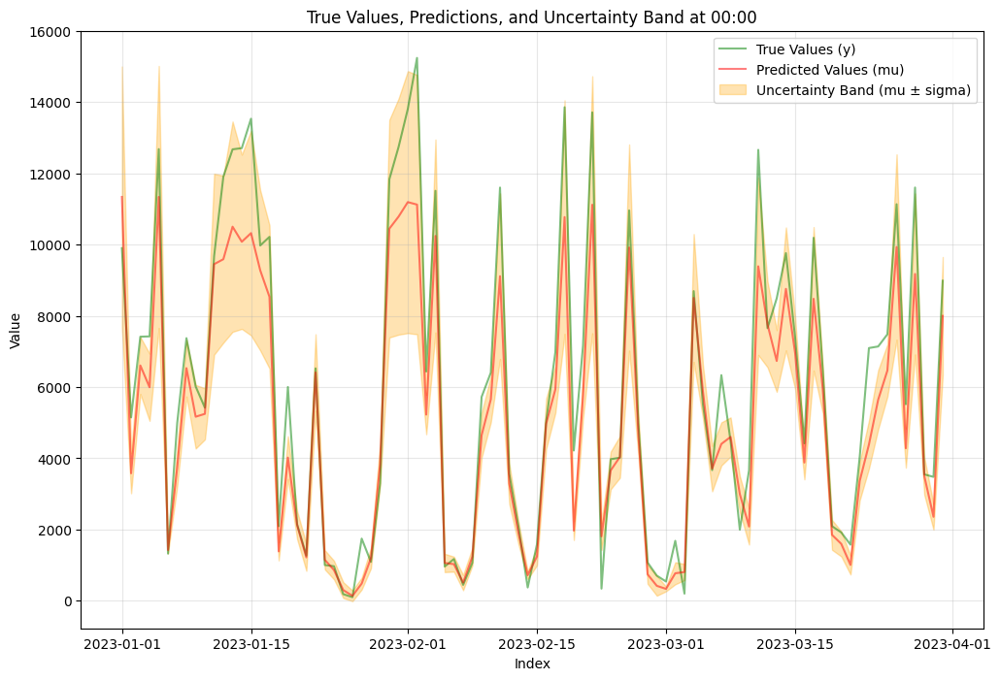

In [ ]:
loc = [y.loc for y in y_val_dists]
scale = [y.scale for y in y_val_dists]


start = 0
end = 90
x = y_validation.index[start:end]
y = y_validation[start:end]
mu = y_val_pred[start:end]
sigma = [y.scale for y in y_val_dists][start:end]

# Plot
plt.figure(figsize=(12, 8))
plt.plot(x, y, label="True Values (y)", color="green", alpha=0.5)
plt.plot(x, mu, label="Predicted Values (mu)", color="red", alpha=0.5)
plt.fill_between(x, mu - sigma, mu + sigma, color="orange", alpha=0.3, label="Uncertainty Band (mu ± sigma)")

# Customize the plot
plt.xlabel("Index")
plt.ylabel("Value")
plt.title("True Values, Predictions, and Uncertainty Band at 00:00")
plt.legend()
plt.grid(alpha=0.3)

In [ ]:
y_train_pred, y_train_dists, y_val_pred, y_val_dists, X_train, y_train, X_validation, y_validation = model_NGBoost("00:00", "only_mean_wind", 500, 0.03, natural_gradient=False)

Data loaded and transformed successfully. Shape of DataFrame: (78912, 22)
# of training observations: 2556 | 77.76%
# of validation observations: 365 | 11.10%
# of test observations: 366 | 11.13%
[iter 0] loss=1735.1167 val_loss=2022.7272 scale=0.0010 norm=0.5046
[iter 1] loss=1726.3170 val_loss=2011.2040 scale=0.0010 norm=0.5007
[iter 2] loss=1717.5837 val_loss=1999.9680 scale=0.0010 norm=0.4968
[iter 3] loss=1708.8879 val_loss=1988.4276 scale=0.0010 norm=0.4928
[iter 4] loss=1700.2221 val_loss=1976.8923 scale=0.0010 norm=0.4885
[iter 5] loss=1691.6488 val_loss=1965.5147 scale=0.0010 norm=0.4839


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered i

[iter 6] loss=1683.2317 val_loss=1954.2901 scale=0.0010 norm=0.4791
[iter 7] loss=1674.9894 val_loss=1948.8907 scale=0.0005 norm=0.2369


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scal

[iter 8] loss=1670.9857 val_loss=1943.5627 scale=0.0005 norm=0.2355
[iter 9] loss=1667.0528 val_loss=1938.3187 scale=0.0005 norm=0.2341
[iter 10] loss=1663.1990 val_loss=1933.1865 scale=0.0005 norm=0.2326
[iter 11] loss=1659.4307 val_loss=1927.9891 scale=0.0005 norm=0.2311
[iter 12] loss=1655.7113 val_loss=1923.0166 scale=0.0005 norm=0.2294
[iter 13] loss=1652.0942 val_loss=1918.0914 scale=0.0005 norm=0.2277


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scal

[iter 14] loss=1648.5860 val_loss=1913.5142 scale=0.0005 norm=0.2260
[iter 15] loss=1645.1830 val_loss=1909.0982 scale=0.0005 norm=0.2242
[iter 16] loss=1641.8977 val_loss=1904.8086 scale=0.0005 norm=0.2224
[iter 17] loss=1638.7338 val_loss=1900.3286 scale=0.0005 norm=0.2205
[iter 18] loss=1635.6966 val_loss=1896.3913 scale=0.0005 norm=0.2186
[iter 19] loss=1632.7731 val_loss=1892.2879 scale=0.0005 norm=0.2167


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scal

[iter 20] loss=1629.9786 val_loss=1888.3923 scale=0.0005 norm=0.2147
[iter 21] loss=1627.3105 val_loss=1884.6077 scale=0.0005 norm=0.2127
[iter 22] loss=1624.7377 val_loss=1881.0292 scale=0.0005 norm=0.2107
[iter 23] loss=1622.2892 val_loss=1877.5630 scale=0.0005 norm=0.2087
[iter 24] loss=1619.9602 val_loss=1874.2770 scale=0.0005 norm=0.2067


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scal

[iter 25] loss=1617.6941 val_loss=1871.1363 scale=0.0005 norm=0.2047
[iter 26] loss=1615.5087 val_loss=1868.1507 scale=0.0005 norm=0.2028
[iter 27] loss=1613.4256 val_loss=1865.3169 scale=0.0005 norm=0.2008
[iter 28] loss=1611.4509 val_loss=1862.5083 scale=0.0005 norm=0.1989
[iter 29] loss=1609.5794 val_loss=1859.8855 scale=0.0005 norm=0.1970
[iter 30] loss=1607.8042 val_loss=1857.4596 scale=0.0005 norm=0.1951
[iter 31] loss=1606.1158 val_loss=1855.0355 scale=0.0005 norm=0.1933


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scal

[iter 32] loss=1604.4985 val_loss=1852.7322 scale=0.0005 norm=0.1915
[iter 33] loss=1602.9646 val_loss=1850.6263 scale=0.0005 norm=0.1898
[iter 34] loss=1601.5112 val_loss=1848.5648 scale=0.0005 norm=0.1882
[iter 35] loss=1600.1324 val_loss=1846.6158 scale=0.0005 norm=0.1867
[iter 36] loss=1598.8241 val_loss=1844.7193 scale=0.0005 norm=0.1852


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scal

[iter 37] loss=1597.5701 val_loss=1841.0838 scale=0.0010 norm=0.3675
[iter 38] loss=1595.2093 val_loss=1838.0131 scale=0.0010 norm=0.3621
[iter 39] loss=1593.0795 val_loss=1835.1418 scale=0.0010 norm=0.3571
[iter 40] loss=1591.1569 val_loss=1832.5347 scale=0.0010 norm=0.3526
[iter 41] loss=1589.4062 val_loss=1830.1759 scale=0.0010 norm=0.3485


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])


[iter 42] loss=1587.8023 val_loss=1828.0326 scale=0.0010 norm=0.3449
[iter 43] loss=1586.3323 val_loss=1825.9850 scale=0.0010 norm=0.3415
[iter 44] loss=1584.9845 val_loss=1824.2106 scale=0.0010 norm=0.3384
[iter 45] loss=1583.7293 val_loss=1822.5421 scale=0.0010 norm=0.3355
[iter 46] loss=1582.5548 val_loss=1821.0252 scale=0.0010 norm=0.3328
[iter 47] loss=1581.4610 val_loss=1819.7841 scale=0.0010 norm=0.3303


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1]

[iter 48] loss=1580.4399 val_loss=1818.5877 scale=0.0010 norm=0.3282
[iter 49] loss=1579.4935 val_loss=1817.6671 scale=0.0010 norm=0.3263
[iter 50] loss=1578.5725 val_loss=1816.4393 scale=0.0010 norm=0.3243
[iter 51] loss=1577.6885 val_loss=1815.3353 scale=0.0010 norm=0.3225
[iter 52] loss=1576.8597 val_loss=1814.2522 scale=0.0010 norm=0.3208
[iter 53] loss=1576.0780 val_loss=1812.5725 scale=0.0020 norm=0.6387
[iter 54] loss=1574.6254 val_loss=1810.7536 scale=0.0020 norm=0.6329


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**

[iter 55] loss=1573.2976 val_loss=1809.4923 scale=0.0020 norm=0.6282
[iter 56] loss=1572.0999 val_loss=1808.0818 scale=0.0020 norm=0.6240
[iter 57] loss=1570.9934 val_loss=1807.1061 scale=0.0020 norm=0.6199
[iter 58] loss=1569.9771 val_loss=1806.2097 scale=0.0020 norm=0.6160
[iter 59] loss=1569.0411 val_loss=1805.2334 scale=0.0020 norm=0.6127
[iter 60] loss=1568.1035 val_loss=1804.3477 scale=0.0020 norm=0.6092


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:30: RuntimeWarning: invalid value encountered in multiply
  return self.scale * (
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow

[iter 61] loss=1567.2479 val_loss=1803.4767 scale=0.0020 norm=0.6060
[iter 62] loss=1566.4688 val_loss=1802.8325 scale=0.0020 norm=0.6032
[iter 63] loss=1565.7505 val_loss=1802.1934 scale=0.0020 norm=0.6007
[iter 64] loss=1565.0763 val_loss=1801.5482 scale=0.0020 norm=0.5983
[iter 65] loss=1564.4667 val_loss=1801.0278 scale=0.0020 norm=0.5962
[iter 66] loss=1563.8877 val_loss=1800.5344 scale=0.0020 norm=0.5942
[iter 67] loss=1563.3432 val_loss=1800.2188 scale=0.0020 norm=0.5923
[iter 68] loss=1562.8476 val_loss=1799.7558 scale=0.0020 norm=0.5904
[iter 69] loss=1562.3610 val_loss=1799.3306 scale=0.0020 norm=0.5887
[iter 70] loss=1561.9120 val_loss=1798.9247 scale=0.0020 norm=0.5870
[iter 71] loss=1561.4785 val_loss=1798.5283 scale=0.0020 norm=0.5855
[iter 72] loss=1561.0642 val_loss=1798.1363 scale=0.0020 norm=0.5841
[iter 73] loss=1560.6624 val_loss=1797.7379 scale=0.0020 norm=0.5828
[iter 74] loss=1560.2819 val_loss=1797.4312 scale=0.0020 norm=0.5815
[iter 75] loss=1559.9303 val_loss=

c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C


[iter 80] loss=1558.3856 val_loss=1796.0163 scale=0.0020 norm=0.5750
[iter 81] loss=1558.1234 val_loss=1795.8029 scale=0.0020 norm=0.5742
[iter 82] loss=1557.8723 val_loss=1795.6654 scale=0.0020 norm=0.5735
[iter 83] loss=1557.6554 val_loss=1795.6062 scale=0.0010 norm=0.2863
[iter 84] loss=1557.4731 val_loss=1795.5058 scale=0.0010 norm=0.2859
[iter 85] loss=1557.2987 val_loss=1795.4522 scale=0.0010 norm=0.2855
[iter 86] loss=1557.1339 val_loss=1795.4178 scale=0.0010 norm=0.2852


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: Run

[iter 87] loss=1556.9790 val_loss=1795.3082 scale=0.0010 norm=0.2849
[iter 88] loss=1556.8276 val_loss=1795.2818 scale=0.0010 norm=0.2846
[iter 89] loss=1556.6832 val_loss=1795.1584 scale=0.0020 norm=0.5687
[iter 90] loss=1556.5109 val_loss=1795.1368 scale=0.0020 norm=0.5681
[iter 91] loss=1556.3413 val_loss=1794.9583 scale=0.0020 norm=0.5674


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: overflow encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWar

[iter 92] loss=1556.1532 val_loss=1794.7245 scale=0.0020 norm=0.5668
[iter 93] loss=1555.9898 val_loss=1794.6180 scale=0.0020 norm=0.5663
[iter 94] loss=1555.8122 val_loss=1794.5014 scale=0.0020 norm=0.5657
[iter 95] loss=1555.6563 val_loss=1794.4286 scale=0.0020 norm=0.5652
[iter 96] loss=1555.5023 val_loss=1794.2959 scale=0.0020 norm=0.5647


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2


[iter 97] loss=1555.3471 val_loss=1794.2778 scale=0.0020 norm=0.5642
[iter 98] loss=1555.2038 val_loss=1794.2681 scale=0.0020 norm=0.5637
[iter 99] loss=1555.0775 val_loss=1794.0496 scale=0.0039 norm=1.1265
[iter 100] loss=1554.8411 val_loss=1794.0656 scale=0.0010 norm=0.2812
[iter 101] loss=1554.7220 val_loss=1794.0689 scale=0.0010 norm=0.2810
[iter 102] loss=1554.6111 val_loss=1793.9988 scale=0.0010 norm=0.2807


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow

[iter 103] loss=1554.5012 val_loss=1793.9219 scale=0.0010 norm=0.2805
[iter 104] loss=1554.3855 val_loss=1793.8824 scale=0.0010 norm=0.2803
[iter 105] loss=1554.3069 val_loss=1793.8398 scale=0.0010 norm=0.2801
[iter 106] loss=1554.2347 val_loss=1793.7835 scale=0.0020 norm=0.5599
[iter 107] loss=1554.0880 val_loss=1793.7092 scale=0.0010 norm=0.2797
[iter 108] loss=1553.9881 val_loss=1793.6069 scale=0.0020 norm=0.5590


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
 

[iter 109] loss=1553.8112 val_loss=1793.5259 scale=0.0010 norm=0.2792
[iter 110] loss=1553.7154 val_loss=1793.4860 scale=0.0020 norm=0.5579
[iter 111] loss=1553.6174 val_loss=1793.4424 scale=0.0020 norm=0.5575
[iter 112] loss=1553.5294 val_loss=1793.3151 scale=0.0020 norm=0.5571
[iter 113] loss=1553.4356 val_loss=1793.2662 scale=0.0020 norm=0.5568
[iter 114] loss=1553.3349 val_loss=1793.2739 scale=0.0020 norm=0.5564
[iter 115] loss=1553.2404 val_loss=1793.2100 scale=0.0020 norm=0.5561


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in s

[iter 116] loss=1553.1434 val_loss=1793.2096 scale=0.0020 norm=0.5558
[iter 117] loss=1553.0609 val_loss=1793.2006 scale=0.0020 norm=0.5555
[iter 118] loss=1552.9899 val_loss=1793.2107 scale=0.0002 norm=0.0694
[iter 119] loss=1552.9809 val_loss=1793.1970 scale=0.0020 norm=0.5551
[iter 120] loss=1552.8961 val_loss=1793.2106 scale=0.0005 norm=0.1387
[iter 121] loss=1552.8752 val_loss=1793.2577 scale=0.0010 norm=0.2773
[iter 122] loss=1552.8128 val_loss=1793.1177 scale=0.0010 norm=0.2772


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:30: RuntimeWarning: invalid value encountered in multiply
  return self.scale * (
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarnin

[iter 123] loss=1552.7152 val_loss=1793.0976 scale=0.0010 norm=0.2770
[iter 124] loss=1552.6618 val_loss=1792.8885 scale=0.0010 norm=0.2769
[iter 125] loss=1552.5611 val_loss=1792.8274 scale=0.0020 norm=0.5533
[iter 126] loss=1552.4378 val_loss=1792.7576 scale=0.0010 norm=0.2764
[iter 127] loss=1552.3953 val_loss=1792.7449 scale=0.0005 norm=0.1382


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:30: RuntimeWarning

[iter 128] loss=1552.3653 val_loss=1792.6701 scale=0.0020 norm=0.5523
[iter 129] loss=1552.2842 val_loss=1792.6951 scale=0.0020 norm=0.5520
[iter 130] loss=1552.2271 val_loss=1792.7268 scale=0.0020 norm=0.5517
[iter 131] loss=1552.1370 val_loss=1792.7434 scale=0.0020 norm=0.5513
[iter 132] loss=1552.0520 val_loss=1792.6768 scale=0.0020 norm=0.5510
[iter 133] loss=1551.9806 val_loss=1792.6983 scale=0.0020 norm=0.5507
[iter 134] loss=1551.8910 val_loss=1792.6335 scale=0.0010 norm=0.2753


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:30: RuntimeWarning: invalid value encountered in multiply
  return self.scale * (
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow en

[iter 135] loss=1551.8514 val_loss=1792.6053 scale=0.0020 norm=0.5503
[iter 136] loss=1551.7671 val_loss=1792.5532 scale=0.0010 norm=0.2750
[iter 137] loss=1551.7262 val_loss=1792.5335 scale=0.0020 norm=0.5498
[iter 138] loss=1551.6487 val_loss=1792.5391 scale=0.0002 norm=0.0687
[iter 139] loss=1551.6412 val_loss=1792.5784 scale=0.0020 norm=0.5495
[iter 140] loss=1551.5648 val_loss=1792.5828 scale=0.0005 norm=0.1373


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:30: RuntimeWarning

[iter 141] loss=1551.5510 val_loss=1792.5404 scale=0.0010 norm=0.2746
[iter 142] loss=1551.5198 val_loss=1792.5534 scale=0.0020 norm=0.5490
[iter 143] loss=1551.4536 val_loss=1792.5361 scale=0.0020 norm=0.5488
[iter 144] loss=1551.3841 val_loss=1792.5706 scale=0.0020 norm=0.5485


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: overflow encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: over

[iter 145] loss=1551.3184 val_loss=1792.5191 scale=0.0010 norm=0.2741
[iter 146] loss=1551.2836 val_loss=1792.5311 scale=0.0020 norm=0.5481
[iter 147] loss=1551.2148 val_loss=1792.6384 scale=0.0020 norm=0.5479
[iter 148] loss=1551.1753 val_loss=1792.6251 scale=0.0005 norm=0.1369
[iter 149] loss=1551.1510 val_loss=1792.6314 scale=0.0005 norm=0.1368
[iter 150] loss=1551.1319 val_loss=1792.6710 scale=0.0010 norm=0.2736
[iter 151] loss=1551.0974 val_loss=1792.5525 scale=0.0010 norm=0.2736
[iter 152] loss=1551.0096 val_loss=1792.5440 scale=0.0010 norm=0.2734
[iter 153] loss=1550.9835 val_loss=1792.5403 scale=0.0010 norm=0.2734
[iter 154] loss=1550.9434 val_loss=1792.5285 scale=0.0005 norm=0.1366


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: overflow encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: over

[iter 155] loss=1550.9215 val_loss=1792.4876 scale=0.0020 norm=0.5463
[iter 156] loss=1550.8623 val_loss=1792.5013 scale=0.0020 norm=0.5460
[iter 157] loss=1550.8066 val_loss=1792.5524 scale=0.0010 norm=0.2729
[iter 158] loss=1550.7603 val_loss=1792.5715 scale=0.0010 norm=0.2728
[iter 159] loss=1550.7416 val_loss=1792.5857 scale=0.0020 norm=0.5455


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: overflow encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2


[iter 160] loss=1550.6890 val_loss=1792.6356 scale=0.0010 norm=0.2727
[iter 161] loss=1550.6637 val_loss=1792.5621 scale=0.0010 norm=0.2726
[iter 162] loss=1550.5987 val_loss=1792.4990 scale=0.0010 norm=0.2724
[iter 163] loss=1550.5378 val_loss=1792.5471 scale=0.0010 norm=0.2724
[iter 164] loss=1550.4970 val_loss=1792.4921 scale=0.0010 norm=0.2723


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:30: RuntimeWarning: invalid value encountered in multiply
  return self.scale * (
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
 

[iter 165] loss=1550.4546 val_loss=1792.4811 scale=0.0005 norm=0.1361
[iter 166] loss=1550.4352 val_loss=1792.4413 scale=0.0020 norm=0.5442
[iter 167] loss=1550.3809 val_loss=1792.4184 scale=0.0020 norm=0.5440
[iter 168] loss=1550.3303 val_loss=1792.4146 scale=0.0005 norm=0.1359
[iter 169] loss=1550.3052 val_loss=1792.4498 scale=0.0020 norm=0.5436
[iter 170] loss=1550.2565 val_loss=1792.4673 scale=0.0010 norm=0.2717


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:30: RuntimeWarning: invalid value encountered in multiply
  return self.scale * (
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow en

[iter 171] loss=1550.2395 val_loss=1792.3907 scale=0.0020 norm=0.5433
[iter 172] loss=1550.1777 val_loss=1792.4354 scale=0.0005 norm=0.1358
[iter 173] loss=1550.1460 val_loss=1792.4403 scale=0.0010 norm=0.2715
[iter 174] loss=1550.1292 val_loss=1792.3662 scale=0.0020 norm=0.5428
[iter 175] loss=1550.0699 val_loss=1792.4243 scale=0.0005 norm=0.1356


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered i

[iter 176] loss=1550.0405 val_loss=1792.4735 scale=0.0010 norm=0.2712
[iter 177] loss=1549.9984 val_loss=1792.4688 scale=0.0002 norm=0.0678
[iter 178] loss=1549.9900 val_loss=1792.5128 scale=0.0005 norm=0.1355
[iter 179] loss=1549.9638 val_loss=1792.4792 scale=0.0010 norm=0.2710
[iter 180] loss=1549.9238 val_loss=1792.4746 scale=0.0002 norm=0.0677
[iter 181] loss=1549.9158 val_loss=1792.5064 scale=0.0010 norm=0.2709


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:30: RuntimeWarning: invalid value encountered in multiply
  return self.scale * (
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encoun

[iter 182] loss=1549.8975 val_loss=1792.4770 scale=0.0010 norm=0.2708
[iter 183] loss=1549.8228 val_loss=1792.4727 scale=0.0002 norm=0.0677
[iter 184] loss=1549.8153 val_loss=1792.4432 scale=0.0010 norm=0.2707
[iter 185] loss=1549.7449 val_loss=1792.4287 scale=0.0020 norm=0.5411
[iter 186] loss=1549.7129 val_loss=1792.3821 scale=0.0010 norm=0.2705


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:30: RuntimeWarning: invalid value encountered in multiply
  return self.scale * (
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow

[iter 187] loss=1549.6675 val_loss=1792.4046 scale=0.0010 norm=0.2704
[iter 188] loss=1549.6366 val_loss=1792.4006 scale=0.0002 norm=0.0676
[iter 189] loss=1549.6295 val_loss=1792.3752 scale=0.0010 norm=0.2702
[iter 190] loss=1549.5872 val_loss=1792.3944 scale=0.0010 norm=0.2702
[iter 191] loss=1549.5592 val_loss=1792.3906 scale=0.0002 norm=0.0675
[iter 192] loss=1549.5524 val_loss=1792.3322 scale=0.0010 norm=0.2700


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: overflow encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: overflo

[iter 193] loss=1549.5005 val_loss=1792.2723 scale=0.0020 norm=0.5397
[iter 194] loss=1549.4430 val_loss=1792.2531 scale=0.0010 norm=0.2698
[iter 195] loss=1549.4040 val_loss=1792.2478 scale=0.0005 norm=0.1349
[iter 196] loss=1549.3833 val_loss=1792.1857 scale=0.0020 norm=0.5393
[iter 197] loss=1549.3290 val_loss=1792.2337 scale=0.0005 norm=0.1348
[iter 198] loss=1549.2926 val_loss=1792.1921 scale=0.0010 norm=0.2694
[iter 199] loss=1549.2560 val_loss=1792.1906 scale=0.0005 norm=0.1347


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: overflow encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in squar

[iter 200] loss=1549.2433 val_loss=1792.2438 scale=0.0010 norm=0.2693
[iter 201] loss=1549.2082 val_loss=1792.1678 scale=0.0010 norm=0.2692
[iter 202] loss=1549.1625 val_loss=1792.1341 scale=0.0010 norm=0.2691
[iter 203] loss=1549.1285 val_loss=1792.1296 scale=0.0005 norm=0.1345
[iter 204] loss=1549.1087 val_loss=1792.0463 scale=0.0010 norm=0.2689
[iter 205] loss=1549.0667 val_loss=1792.0212 scale=0.0020 norm=0.5377


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
 

[iter 206] loss=1549.0231 val_loss=1791.9631 scale=0.0010 norm=0.2688
[iter 207] loss=1548.9843 val_loss=1791.9575 scale=0.0010 norm=0.2687
[iter 208] loss=1548.9528 val_loss=1791.9667 scale=0.0005 norm=0.1343
[iter 209] loss=1548.9349 val_loss=1791.9167 scale=0.0010 norm=0.2685
[iter 210] loss=1548.9003 val_loss=1791.9144 scale=0.0005 norm=0.1342


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
 

[iter 211] loss=1548.8815 val_loss=1791.9057 scale=0.0020 norm=0.5368
[iter 212] loss=1548.8217 val_loss=1791.9163 scale=0.0010 norm=0.2683
[iter 213] loss=1548.7893 val_loss=1791.9159 scale=0.0005 norm=0.1341
[iter 214] loss=1548.7713 val_loss=1791.9089 scale=0.0005 norm=0.1341
[iter 215] loss=1548.7587 val_loss=1791.9220 scale=0.0010 norm=0.2681


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: Run

[iter 216] loss=1548.7432 val_loss=1791.8410 scale=0.0010 norm=0.2680
[iter 217] loss=1548.7131 val_loss=1791.7913 scale=0.0020 norm=0.5359
[iter 218] loss=1548.6588 val_loss=1791.7867 scale=0.0010 norm=0.2678
[iter 219] loss=1548.6292 val_loss=1791.7816 scale=0.0010 norm=0.2677
[iter 220] loss=1548.6010 val_loss=1791.8358 scale=0.0010 norm=0.2677
[iter 221] loss=1548.5674 val_loss=1791.8300 scale=0.0002 norm=0.0669


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow en

[iter 222] loss=1548.5611 val_loss=1791.8557 scale=0.0005 norm=0.1338
[iter 223] loss=1548.5294 val_loss=1791.8819 scale=0.0010 norm=0.2675
[iter 224] loss=1548.4971 val_loss=1791.8827 scale=0.0010 norm=0.2674
[iter 225] loss=1548.4534 val_loss=1791.8791 scale=0.0002 norm=0.0668
[iter 226] loss=1548.4475 val_loss=1791.8034 scale=0.0010 norm=0.2673
[iter 227] loss=1548.4209 val_loss=1791.7811 scale=0.0020 norm=0.5344


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: o

[iter 228] loss=1548.3816 val_loss=1791.7813 scale=0.0010 norm=0.2671
[iter 229] loss=1548.3673 val_loss=1791.7826 scale=0.0010 norm=0.2671
[iter 230] loss=1548.3273 val_loss=1791.7669 scale=0.0010 norm=0.2670
[iter 231] loss=1548.3138 val_loss=1791.7686 scale=0.0002 norm=0.0667
[iter 232] loss=1548.3083 val_loss=1791.7790 scale=0.0020 norm=0.5338
[iter 233] loss=1548.2658 val_loss=1791.7914 scale=0.0010 norm=0.2668


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: overflow encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: over

[iter 234] loss=1548.2538 val_loss=1791.7935 scale=0.0010 norm=0.2668
[iter 235] loss=1548.2233 val_loss=1791.7655 scale=0.0020 norm=0.5334
[iter 236] loss=1548.1752 val_loss=1791.7676 scale=0.0002 norm=0.0667
[iter 237] loss=1548.1699 val_loss=1791.7937 scale=0.0010 norm=0.2666
[iter 238] loss=1548.1281 val_loss=1791.7635 scale=0.0010 norm=0.2665
[iter 239] loss=1548.0971 val_loss=1791.7454 scale=0.0020 norm=0.5328
[iter 240] loss=1548.0536 val_loss=1791.7424 scale=0.0002 norm=0.0666
[iter 241] loss=1548.0481 val_loss=1791.7430 scale=0.0002 norm=0.0666
[iter 242] loss=1548.0432 val_loss=1791.7284 scale=0.0010 norm=0.2662
[iter 243] loss=1548.0144 val_loss=1791.7750 scale=0.0005 norm=0.1331
[iter 244] loss=1547.9947 val_loss=1791.8212 scale=0.0005 norm=0.1330
[iter 245] loss=1547.9766 val_loss=1791.8119 scale=0.0005 norm=0.1330


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encou

[iter 246] loss=1547.9660 val_loss=1791.8395 scale=0.0010 norm=0.2659
[iter 247] loss=1547.9509 val_loss=1791.8527 scale=0.0020 norm=0.5316
[iter 248] loss=1547.9162 val_loss=1791.8640 scale=0.0010 norm=0.2658
[iter 249] loss=1547.9029 val_loss=1791.8577 scale=0.0010 norm=0.2657
[iter 250] loss=1547.8789 val_loss=1791.9198 scale=0.0020 norm=0.5312
[iter 251] loss=1547.8201 val_loss=1791.9946 scale=0.0010 norm=0.2655


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\dis

[iter 252] loss=1547.7546 val_loss=1792.0280 scale=0.0005 norm=0.1327
[iter 253] loss=1547.7246 val_loss=1792.0919 scale=0.0010 norm=0.2653
[iter 254] loss=1547.6995 val_loss=1792.1251 scale=0.0005 norm=0.1326
[iter 255] loss=1547.6712 val_loss=1792.1447 scale=0.0020 norm=0.5304
[iter 256] loss=1547.6404 val_loss=1792.1597 scale=0.0010 norm=0.2651
[iter 257] loss=1547.6124 val_loss=1792.1818 scale=0.0010 norm=0.2651
[iter 258] loss=1547.5488 val_loss=1792.1808 scale=0.0002 norm=0.0662


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow en

[iter 259] loss=1547.5437 val_loss=1792.1544 scale=0.0005 norm=0.1324
[iter 260] loss=1547.5235 val_loss=1792.1821 scale=0.0010 norm=0.2648
[iter 261] loss=1547.5008 val_loss=1792.1854 scale=0.0010 norm=0.2648
[iter 262] loss=1547.4883 val_loss=1792.1863 scale=0.0020 norm=0.5295
[iter 263] loss=1547.4648 val_loss=1792.2607 scale=0.0010 norm=0.2647
[iter 264] loss=1547.3858 val_loss=1792.2344 scale=0.0005 norm=0.1322
[iter 265] loss=1547.3667 val_loss=1792.2711 scale=0.0005 norm=0.1322
[iter 266] loss=1547.3481 val_loss=1792.2735 scale=0.0005 norm=0.1322
[iter 267] loss=1547.3289 val_loss=1792.3017 scale=0.0005 norm=0.1322
[iter 268] loss=1547.3032 val_loss=1792.3044 scale=0.0005 norm=0.1321
[iter 269] loss=1547.2854 val_loss=1792.3223 scale=0.0020 norm=0.5283


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow en

[iter 270] loss=1547.2577 val_loss=1792.3232 scale=0.0020 norm=0.5282
[iter 271] loss=1547.2217 val_loss=1792.3243 scale=0.0010 norm=0.2640
[iter 272] loss=1547.1857 val_loss=1792.3387 scale=0.0010 norm=0.2640
[iter 273] loss=1547.1222 val_loss=1792.3652 scale=0.0005 norm=0.1319
[iter 274] loss=1547.0986 val_loss=1792.3710 scale=0.0020 norm=0.5276


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow

[iter 275] loss=1547.0712 val_loss=1792.3560 scale=0.0010 norm=0.2637
[iter 276] loss=1547.0121 val_loss=1792.3588 scale=0.0005 norm=0.1318
[iter 277] loss=1546.9956 val_loss=1792.3759 scale=0.0020 norm=0.5271
[iter 278] loss=1546.9704 val_loss=1792.3789 scale=0.0005 norm=0.1318
[iter 279] loss=1546.9550 val_loss=1792.3566 scale=0.0005 norm=0.1317
[iter 280] loss=1546.9315 val_loss=1792.3061 scale=0.0010 norm=0.2633
[iter 281] loss=1546.8981 val_loss=1792.3166 scale=0.0005 norm=0.1316
[iter 282] loss=1546.8836 val_loss=1792.2722 scale=0.0020 norm=0.5264
[iter 283] loss=1546.8449 val_loss=1792.2689 scale=0.0002 norm=0.0658


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: over

[iter 284] loss=1546.8402 val_loss=1792.2691 scale=0.0002 norm=0.0658
[iter 285] loss=1546.8361 val_loss=1792.3278 scale=0.0020 norm=0.5260
[iter 286] loss=1546.8126 val_loss=1792.3257 scale=0.0010 norm=0.2630
[iter 287] loss=1546.7795 val_loss=1792.3383 scale=0.0010 norm=0.2628
[iter 288] loss=1546.7275 val_loss=1792.3014 scale=0.0010 norm=0.2627
[iter 289] loss=1546.6977 val_loss=1792.3045 scale=0.0005 norm=0.1313


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: overflow encountered i

[iter 290] loss=1546.6843 val_loss=1792.2621 scale=0.0020 norm=0.5250
[iter 291] loss=1546.6337 val_loss=1792.3239 scale=0.0005 norm=0.1312
[iter 292] loss=1546.6047 val_loss=1792.3845 scale=0.0005 norm=0.1311
[iter 293] loss=1546.5779 val_loss=1792.3661 scale=0.0005 norm=0.1311
[iter 294] loss=1546.5577 val_loss=1792.3697 scale=0.0005 norm=0.1310
[iter 295] loss=1546.5453 val_loss=1792.3464 scale=0.0020 norm=0.5240
[iter 296] loss=1546.5104 val_loss=1792.2967 scale=0.0010 norm=0.2620
[iter 297] loss=1546.4806 val_loss=1792.3566 scale=0.0005 norm=0.1309
[iter 298] loss=1546.4559 val_loss=1792.3433 scale=0.0005 norm=0.1309
[iter 299] loss=1546.4377 val_loss=1792.3479 scale=0.0005 norm=0.1308
[iter 300] loss=1546.4260 val_loss=1792.3203 scale=0.0020 norm=0.5232


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow enc

[iter 301] loss=1546.3931 val_loss=1792.3675 scale=0.0010 norm=0.2615
[iter 302] loss=1546.3726 val_loss=1792.3574 scale=0.0010 norm=0.2615
[iter 303] loss=1546.3485 val_loss=1792.4160 scale=0.0005 norm=0.1307
[iter 304] loss=1546.3259 val_loss=1792.4289 scale=0.0005 norm=0.1307
[iter 305] loss=1546.3150 val_loss=1792.4703 scale=0.0020 norm=0.5226
[iter 306] loss=1546.2820 val_loss=1792.4666 scale=0.0002 norm=0.0653


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: over

[iter 307] loss=1546.2776 val_loss=1792.4632 scale=0.0002 norm=0.0653
[iter 308] loss=1546.2735 val_loss=1792.4687 scale=0.0005 norm=0.1306
[iter 309] loss=1546.2633 val_loss=1792.4654 scale=0.0002 norm=0.0653
[iter 310] loss=1546.2594 val_loss=1792.4623 scale=0.0005 norm=0.1306


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:3

[iter 311] loss=1546.2532 val_loss=1792.4846 scale=0.0020 norm=0.5221
[iter 312] loss=1546.2354 val_loss=1792.4844 scale=0.0020 norm=0.5221
[iter 313] loss=1546.2149 val_loss=1792.4152 scale=0.0010 norm=0.2610
[iter 314] loss=1546.1924 val_loss=1792.4742 scale=0.0020 norm=0.5218
[iter 315] loss=1546.1423 val_loss=1792.4864 scale=0.0005 norm=0.1304
[iter 316] loss=1546.1328 val_loss=1792.4879 scale=0.0010 norm=0.2608
[iter 317] loss=1546.1062 val_loss=1792.4673 scale=0.0020 norm=0.5214
[iter 318] loss=1546.0754 val_loss=1792.4506 scale=0.0005 norm=0.1303
[iter 319] loss=1546.0645 val_loss=1792.4478 scale=0.0010 norm=0.2606
[iter 320] loss=1546.0532 val_loss=1792.4341 scale=0.0005 norm=0.1303
[iter 321] loss=1546.0365 val_loss=1792.4506 scale=0.0020 norm=0.5209


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in s

[iter 322] loss=1546.0139 val_loss=1792.4745 scale=0.0010 norm=0.2604
[iter 323] loss=1545.9947 val_loss=1792.4765 scale=0.0010 norm=0.2604
[iter 324] loss=1545.9650 val_loss=1792.4676 scale=0.0010 norm=0.2603
[iter 325] loss=1545.9438 val_loss=1792.4525 scale=0.0010 norm=0.2602
[iter 326] loss=1545.9335 val_loss=1792.5120 scale=0.0020 norm=0.5204
[iter 327] loss=1545.8876 val_loss=1792.5089 scale=0.0002 norm=0.0650
[iter 328] loss=1545.8839 val_loss=1792.5112 scale=0.0010 norm=0.2601
[iter 329] loss=1545.8745 val_loss=1792.5281 scale=0.0010 norm=0.2600
[iter 330] loss=1545.8527 val_loss=1792.5252 scale=0.0002 norm=0.0650
[iter 331] loss=1545.8492 val_loss=1792.5331 scale=0.0020 norm=0.5199


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.p

[iter 332] loss=1545.8287 val_loss=1792.6056 scale=0.0010 norm=0.2599
[iter 333] loss=1545.7624 val_loss=1792.6144 scale=0.0020 norm=0.5195
[iter 334] loss=1545.7286 val_loss=1792.6273 scale=0.0005 norm=0.1298
[iter 335] loss=1545.7201 val_loss=1792.6282 scale=0.0010 norm=0.2597
[iter 336] loss=1545.6956 val_loss=1792.6182 scale=0.0005 norm=0.1298
[iter 337] loss=1545.6802 val_loss=1792.6425 scale=0.0010 norm=0.2595
[iter 338] loss=1545.6679 val_loss=1792.5758 scale=0.0010 norm=0.2594


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: Runtim

[iter 339] loss=1545.6409 val_loss=1792.5661 scale=0.0005 norm=0.1297
[iter 340] loss=1545.6267 val_loss=1792.6235 scale=0.0020 norm=0.5186
[iter 341] loss=1545.5838 val_loss=1792.6282 scale=0.0010 norm=0.2592
[iter 342] loss=1545.5753 val_loss=1792.5414 scale=0.0010 norm=0.2592
[iter 343] loss=1545.5541 val_loss=1792.5354 scale=0.0005 norm=0.1296


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in squa

[iter 344] loss=1545.5410 val_loss=1792.5639 scale=0.0020 norm=0.5181
[iter 345] loss=1545.5124 val_loss=1792.5660 scale=0.0010 norm=0.2590
[iter 346] loss=1545.4848 val_loss=1792.5362 scale=0.0010 norm=0.2589
[iter 347] loss=1545.4664 val_loss=1792.5240 scale=0.0005 norm=0.1294
[iter 348] loss=1545.4567 val_loss=1792.5777 scale=0.0010 norm=0.2588
[iter 349] loss=1545.4406 val_loss=1792.5861 scale=0.0005 norm=0.1294
[iter 350] loss=1545.4330 val_loss=1792.5949 scale=0.0010 norm=0.2587
[iter 351] loss=1545.4161 val_loss=1792.5942 scale=0.0020 norm=0.5173
[iter 352] loss=1545.3987 val_loss=1792.5969 scale=0.0010 norm=0.2586
[iter 353] loss=1545.3905 val_loss=1792.5922 scale=0.0010 norm=0.2586
[iter 354] loss=1545.3653 val_loss=1792.5977 scale=0.0010 norm=0.2585
[iter 355] loss=1545.3575 val_loss=1792.5967 scale=0.0010 norm=0.2585


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: Run

[iter 356] loss=1545.3490 val_loss=1792.5895 scale=0.0005 norm=0.1292
[iter 357] loss=1545.3361 val_loss=1792.5970 scale=0.0020 norm=0.5167
[iter 358] loss=1545.3173 val_loss=1792.6199 scale=0.0010 norm=0.2583
[iter 359] loss=1545.3011 val_loss=1792.6220 scale=0.0010 norm=0.2583
[iter 360] loss=1545.2774 val_loss=1792.5976 scale=0.0020 norm=0.5164


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: Run

[iter 361] loss=1545.2504 val_loss=1792.5888 scale=0.0005 norm=0.1291
[iter 362] loss=1545.2416 val_loss=1792.5173 scale=0.0020 norm=0.5161
[iter 363] loss=1545.1958 val_loss=1792.5182 scale=0.0005 norm=0.1290
[iter 364] loss=1545.1803 val_loss=1792.5139 scale=0.0005 norm=0.1289
[iter 365] loss=1545.1672 val_loss=1792.5427 scale=0.0010 norm=0.2578
[iter 366] loss=1545.1533 val_loss=1792.5502 scale=0.0010 norm=0.2577


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow enc

[iter 367] loss=1545.1005 val_loss=1792.5843 scale=0.0020 norm=0.5151
[iter 368] loss=1545.0750 val_loss=1792.5734 scale=0.0020 norm=0.5150
[iter 369] loss=1545.0443 val_loss=1792.5891 scale=0.0010 norm=0.2575
[iter 370] loss=1545.0365 val_loss=1792.5980 scale=0.0010 norm=0.2574
[iter 371] loss=1545.0019 val_loss=1792.6001 scale=0.0010 norm=0.2574
[iter 372] loss=1544.9862 val_loss=1792.6197 scale=0.0010 norm=0.2574
[iter 373] loss=1544.9788 val_loss=1792.6225 scale=0.0010 norm=0.2573
[iter 374] loss=1544.9541 val_loss=1792.4904 scale=0.0020 norm=0.5145
[iter 375] loss=1544.9010 val_loss=1792.5290 scale=0.0020 norm=0.5143
[iter 376] loss=1544.8611 val_loss=1792.6162 scale=0.0020 norm=0.5142


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2


[iter 377] loss=1544.8315 val_loss=1792.6271 scale=0.0010 norm=0.2570
[iter 378] loss=1544.8165 val_loss=1792.6243 scale=0.0005 norm=0.1285
[iter 379] loss=1544.8093 val_loss=1792.6594 scale=0.0010 norm=0.2569
[iter 380] loss=1544.8001 val_loss=1792.6902 scale=0.0020 norm=0.5136
[iter 381] loss=1544.7712 val_loss=1792.6853 scale=0.0010 norm=0.2568
[iter 382] loss=1544.7630 val_loss=1792.6929 scale=0.0020 norm=0.5135


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.

[iter 383] loss=1544.7460 val_loss=1792.6866 scale=0.0010 norm=0.2567
[iter 384] loss=1544.7240 val_loss=1792.7163 scale=0.0010 norm=0.2566
[iter 385] loss=1544.7016 val_loss=1792.7514 scale=0.0020 norm=0.5132
[iter 386] loss=1544.6674 val_loss=1792.7655 scale=0.0010 norm=0.2565
[iter 387] loss=1544.6608 val_loss=1792.7600 scale=0.0005 norm=0.1282
[iter 388] loss=1544.6547 val_loss=1792.7944 scale=0.0010 norm=0.2564
[iter 389] loss=1544.6415 val_loss=1792.8070 scale=0.0020 norm=0.5127
[iter 390] loss=1544.6259 val_loss=1792.7699 scale=0.0010 norm=0.2563
[iter 391] loss=1544.6082 val_loss=1792.8231 scale=0.0020 norm=0.5125
[iter 392] loss=1544.5684 val_loss=1792.8160 scale=0.0010 norm=0.2562
[iter 393] loss=1544.5144 val_loss=1792.8308 scale=0.0020 norm=0.5122


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in s

[iter 394] loss=1544.4889 val_loss=1792.8249 scale=0.0005 norm=0.1280
[iter 395] loss=1544.4837 val_loss=1792.8121 scale=0.0005 norm=0.1280
[iter 396] loss=1544.4711 val_loss=1792.7914 scale=0.0020 norm=0.5119
[iter 397] loss=1544.4435 val_loss=1792.8183 scale=0.0010 norm=0.2559
[iter 398] loss=1544.4356 val_loss=1792.7525 scale=0.0010 norm=0.2559
[iter 399] loss=1544.3980 val_loss=1792.7527 scale=0.0005 norm=0.1279
[iter 400] loss=1544.3843 val_loss=1792.7556 scale=0.0020 norm=0.5114
[iter 401] loss=1544.3422 val_loss=1792.8074 scale=0.0010 norm=0.2556
[iter 402] loss=1544.3219 val_loss=1792.8025 scale=0.0005 norm=0.1278
[iter 403] loss=1544.3164 val_loss=1792.7905 scale=0.0005 norm=0.1278
[iter 404] loss=1544.3046 val_loss=1792.7775 scale=0.0005 norm=0.1277
[iter 405] loss=1544.2965 val_loss=1792.7640 scale=0.0010 norm=0.2554
[iter 406] loss=1544.2752 val_loss=1792.7599 scale=0.0010 norm=0.2554


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:3

[iter 407] loss=1544.2252 val_loss=1792.7713 scale=0.0010 norm=0.2553
[iter 408] loss=1544.2188 val_loss=1792.7693 scale=0.0020 norm=0.5105
[iter 409] loss=1544.2047 val_loss=1792.8266 scale=0.0020 norm=0.5104
[iter 410] loss=1544.1829 val_loss=1792.8283 scale=0.0010 norm=0.2551
[iter 411] loss=1544.1698 val_loss=1792.8401 scale=0.0020 norm=0.5102


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: overflow encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C


[iter 412] loss=1544.1555 val_loss=1792.7916 scale=0.0010 norm=0.2551
[iter 413] loss=1544.1347 val_loss=1792.8213 scale=0.0020 norm=0.5100
[iter 414] loss=1544.0974 val_loss=1792.8305 scale=0.0010 norm=0.2549
[iter 415] loss=1544.0811 val_loss=1792.8376 scale=0.0020 norm=0.5098
[iter 416] loss=1544.0575 val_loss=1792.8592 scale=0.0020 norm=0.5097
[iter 417] loss=1544.0210 val_loss=1792.8557 scale=0.0010 norm=0.2548
[iter 418] loss=1543.9748 val_loss=1792.8901 scale=0.0010 norm=0.2547


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: Run

[iter 419] loss=1543.9168 val_loss=1792.8874 scale=0.0005 norm=0.1273
[iter 420] loss=1543.9070 val_loss=1792.8902 scale=0.0020 norm=0.5089
[iter 421] loss=1543.8677 val_loss=1792.9616 scale=0.0010 norm=0.2544
[iter 422] loss=1543.8153 val_loss=1792.9621 scale=0.0010 norm=0.2542
[iter 423] loss=1543.8017 val_loss=1792.9993 scale=0.0010 norm=0.2542
[iter 424] loss=1543.7598 val_loss=1792.8606 scale=0.0020 norm=0.5082
[iter 425] loss=1543.6966 val_loss=1792.8546 scale=0.0010 norm=0.2540


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in s

[iter 426] loss=1543.6579 val_loss=1792.8461 scale=0.0002 norm=0.0635
[iter 427] loss=1543.6547 val_loss=1792.8431 scale=0.0002 norm=0.0635
[iter 428] loss=1543.6521 val_loss=1792.8590 scale=0.0010 norm=0.2538
[iter 429] loss=1543.6054 val_loss=1792.8626 scale=0.0010 norm=0.2537
[iter 430] loss=1543.5939 val_loss=1792.8896 scale=0.0020 norm=0.5073


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow en

[iter 431] loss=1543.5720 val_loss=1792.9188 scale=0.0020 norm=0.5072
[iter 432] loss=1543.5475 val_loss=1792.9329 scale=0.0005 norm=0.1268
[iter 433] loss=1543.5408 val_loss=1792.9093 scale=0.0005 norm=0.1268
[iter 434] loss=1543.5234 val_loss=1792.9189 scale=0.0010 norm=0.2535
[iter 435] loss=1543.5082 val_loss=1792.9423 scale=0.0020 norm=0.5068
[iter 436] loss=1543.4858 val_loss=1792.9455 scale=0.0010 norm=0.2534


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: over

[iter 437] loss=1543.4663 val_loss=1793.0026 scale=0.0010 norm=0.2534
[iter 438] loss=1543.4242 val_loss=1792.9887 scale=0.0005 norm=0.1266
[iter 439] loss=1543.4145 val_loss=1792.9790 scale=0.0005 norm=0.1266
[iter 440] loss=1543.4030 val_loss=1793.0481 scale=0.0020 norm=0.5062
[iter 441] loss=1543.3709 val_loss=1792.9890 scale=0.0010 norm=0.2530
[iter 442] loss=1543.3421 val_loss=1792.9695 scale=0.0005 norm=0.1265


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: Runtim

[iter 443] loss=1543.3332 val_loss=1792.9870 scale=0.0005 norm=0.1264
[iter 444] loss=1543.3204 val_loss=1792.9904 scale=0.0010 norm=0.2528
[iter 445] loss=1543.3087 val_loss=1793.0020 scale=0.0010 norm=0.2528
[iter 446] loss=1543.2938 val_loss=1792.9574 scale=0.0010 norm=0.2527
[iter 447] loss=1543.2757 val_loss=1793.0152 scale=0.0005 norm=0.1263
[iter 448] loss=1543.2558 val_loss=1793.0718 scale=0.0005 norm=0.1263
[iter 449] loss=1543.2372 val_loss=1793.0861 scale=0.0005 norm=0.1263
[iter 450] loss=1543.2312 val_loss=1793.1164 scale=0.0020 norm=0.5050
[iter 451] loss=1543.1965 val_loss=1793.1026 scale=0.0005 norm=0.1262
[iter 452] loss=1543.1910 val_loss=1793.0967 scale=0.0005 norm=0.1262
[iter 453] loss=1543.1882 val_loss=1793.1042 scale=0.0010 norm=0.2523


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:30: RuntimeWarning: invalid value encountered in multiply
  return self.scale * (
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encounter

[iter 454] loss=1543.1817 val_loss=1793.1518 scale=0.0020 norm=0.5046
[iter 455] loss=1543.1608 val_loss=1793.0880 scale=0.0010 norm=0.2523
[iter 456] loss=1543.1342 val_loss=1793.0400 scale=0.0010 norm=0.2522
[iter 457] loss=1543.1097 val_loss=1793.0954 scale=0.0005 norm=0.1260
[iter 458] loss=1543.0924 val_loss=1793.1495 scale=0.0005 norm=0.1260
[iter 459] loss=1543.0763 val_loss=1793.1102 scale=0.0010 norm=0.2520


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:30: RuntimeWarning: invalid value encountered in multiply
  return self.scale * (
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encoun

[iter 460] loss=1543.0560 val_loss=1793.1637 scale=0.0005 norm=0.1259
[iter 461] loss=1543.0408 val_loss=1793.2074 scale=0.0005 norm=0.1259
[iter 462] loss=1543.0266 val_loss=1793.1782 scale=0.0005 norm=0.1259
[iter 463] loss=1542.9982 val_loss=1793.1832 scale=0.0010 norm=0.2517
[iter 464] loss=1542.9927 val_loss=1793.1803 scale=0.0002 norm=0.0629


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:30: RuntimeWarning: invalid value encountered in multiply
  return self.scale * (
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow

[iter 465] loss=1542.9903 val_loss=1793.2309 scale=0.0005 norm=0.1258
[iter 466] loss=1542.9770 val_loss=1793.2340 scale=0.0010 norm=0.2516
[iter 467] loss=1542.9651 val_loss=1793.2312 scale=0.0002 norm=0.0629
[iter 468] loss=1542.9628 val_loss=1793.1070 scale=0.0020 norm=0.5032
[iter 469] loss=1542.9083 val_loss=1793.1134 scale=0.0010 norm=0.2515
[iter 470] loss=1542.8812 val_loss=1793.1006 scale=0.0005 norm=0.1257


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: Runtim

[iter 471] loss=1542.8763 val_loss=1793.1729 scale=0.0010 norm=0.2514
[iter 472] loss=1542.8512 val_loss=1793.1872 scale=0.0020 norm=0.5027
[iter 473] loss=1542.8316 val_loss=1793.1978 scale=0.0020 norm=0.5026
[iter 474] loss=1542.8184 val_loss=1793.1908 scale=0.0020 norm=0.5025
[iter 475] loss=1542.7974 val_loss=1793.2150 scale=0.0010 norm=0.2512
[iter 476] loss=1542.7844 val_loss=1793.1797 scale=0.0010 norm=0.2511
[iter 477] loss=1542.7676 val_loss=1793.1436 scale=0.0010 norm=0.2511


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: Runtim

[iter 478] loss=1542.7498 val_loss=1793.1355 scale=0.0005 norm=0.1255
[iter 479] loss=1542.7392 val_loss=1793.1288 scale=0.0005 norm=0.1255
[iter 480] loss=1542.7126 val_loss=1793.1348 scale=0.0020 norm=0.5019
[iter 481] loss=1542.6761 val_loss=1793.1484 scale=0.0020 norm=0.5017
[iter 482] loss=1542.6474 val_loss=1793.1261 scale=0.0005 norm=0.1254


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow en

[iter 483] loss=1542.6315 val_loss=1793.0624 scale=0.0010 norm=0.2507
[iter 484] loss=1542.5837 val_loss=1793.0591 scale=0.0005 norm=0.1253
[iter 485] loss=1542.5799 val_loss=1793.0346 scale=0.0005 norm=0.1253
[iter 486] loss=1542.5549 val_loss=1793.1042 scale=0.0010 norm=0.2505
[iter 487] loss=1542.5170 val_loss=1793.1759 scale=0.0010 norm=0.2504
[iter 488] loss=1542.4741 val_loss=1793.1811 scale=0.0010 norm=0.2503


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by z

[iter 489] loss=1542.4434 val_loss=1793.1867 scale=0.0010 norm=0.2502
[iter 490] loss=1542.4150 val_loss=1793.1927 scale=0.0010 norm=0.2502
[iter 491] loss=1542.3888 val_loss=1793.1901 scale=0.0010 norm=0.2501
[iter 492] loss=1542.3540 val_loss=1793.2189 scale=0.0020 norm=0.5001
[iter 493] loss=1542.3215 val_loss=1793.2122 scale=0.0010 norm=0.2500
[iter 494] loss=1542.2715 val_loss=1793.2066 scale=0.0010 norm=0.2500


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
 

[iter 495] loss=1542.2239 val_loss=1793.2206 scale=0.0010 norm=0.2499
[iter 496] loss=1542.2186 val_loss=1793.2213 scale=0.0002 norm=0.0625
[iter 497] loss=1542.2167 val_loss=1793.2559 scale=0.0010 norm=0.2498
[iter 498] loss=1542.1835 val_loss=1793.2634 scale=0.0020 norm=0.4995


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2


[iter 499] loss=1542.1494 val_loss=1793.2576 scale=0.0010 norm=0.2497
Training features: ['power_t-1', 'ws_100m_loc_mean', 'ws_10m_loc_mean'] -> power
Train MSE:	 9811270.707881378
Validation MSE:	 13526192.493299136


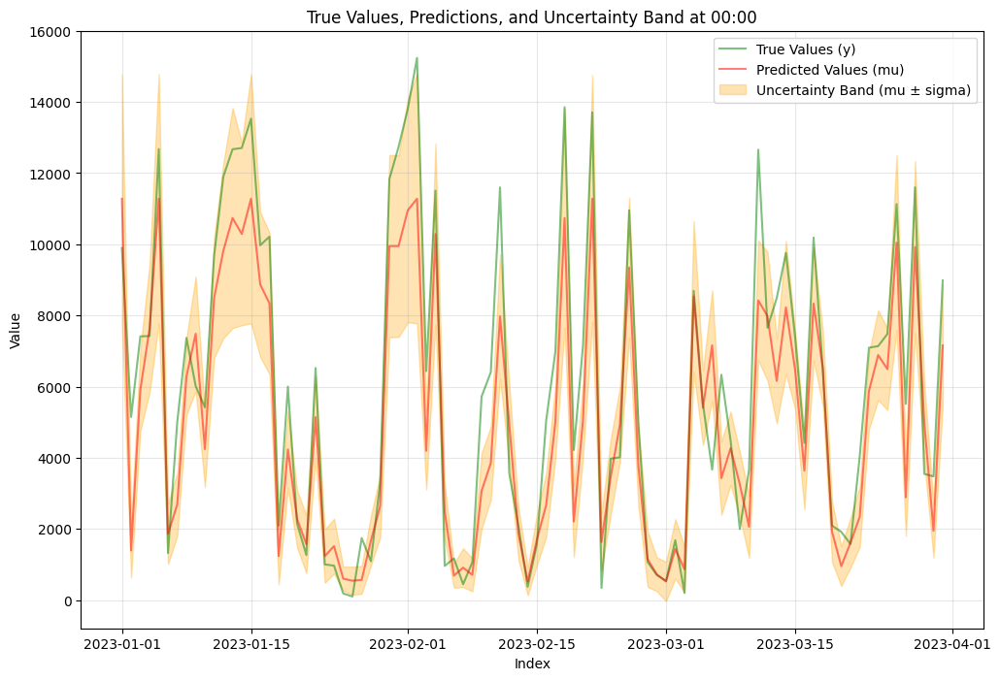

In [ ]:
loc = [y.loc for y in y_val_dists]
scale = [y.scale for y in y_val_dists]


start = 0
end = 90
x = y_validation.index[start:end]
y = y_validation[start:end]
mu = y_val_pred[start:end]
sigma = [y.scale for y in y_val_dists][start:end]

# Plot
plt.figure(figsize=(12, 8))
plt.plot(x, y, label="True Values (y)", color="green", alpha=0.5)
plt.plot(x, mu, label="Predicted Values (mu)", color="red", alpha=0.5)
plt.fill_between(x, mu - sigma, mu + sigma, color="orange", alpha=0.3, label="Uncertainty Band (mu ± sigma)")

# Customize the plot
plt.xlabel("Index")
plt.ylabel("Value")
plt.title("True Values, Predictions, and Uncertainty Band at 00:00")
plt.legend()
plt.grid(alpha=0.3)

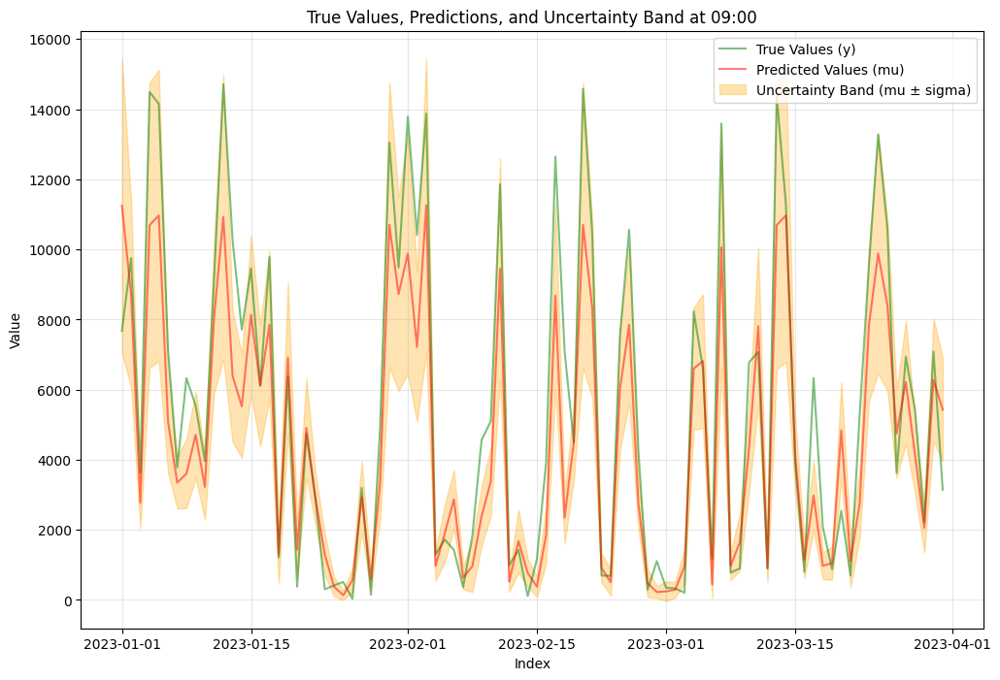

In [ ]:
loc = [y.loc for y in y_val_dists]
scale = [y.scale for y in y_val_dists]


start = 0
end = 90
x = y_validation.index[start:end]
y = y_validation[start:end]
mu = y_val_pred[start:end]
sigma = [y.scale for y in y_val_dists][start:end]

# Plot
plt.figure(figsize=(12, 8))
plt.plot(x, y, label="True Values (y)", color="green", alpha=0.5)
plt.plot(x, mu, label="Predicted Values (mu)", color="red", alpha=0.5)
plt.fill_between(x, mu - sigma, mu + sigma, color="orange", alpha=0.3, label="Uncertainty Band (mu ± sigma)")

# Customize the plot
plt.xlabel("Index")
plt.ylabel("Value")
plt.title("True Values, Predictions, and Uncertainty Band at 09:00")
plt.legend()
plt.grid(alpha=0.3)

In [ ]:
y_train_pred, y_train_dists, y_val_pred, y_val_dists, X_train, y_train, X_validation, y_validation = model_NGBoost("00:00", "only_mean_wind", 500, 0.03)

Data loaded and transformed successfully. Shape of DataFrame: (78912, 22)
# of training observations: 2556 | 77.76%
# of validation observations: 365 | 11.10%
# of test observations: 366 | 11.13%
[iter 0] loss=1735.1167 val_loss=2024.0642 scale=512.0000 norm=449.1209
[iter 1] loss=1726.2357 val_loss=2014.1590 scale=512.0000 norm=447.7525
[iter 2] loss=1717.4336 val_loss=2004.3367 scale=512.0000 norm=446.3911
[iter 3] loss=1708.7099 val_loss=1994.6216 scale=512.0000 norm=445.0350
[iter 4] loss=1700.0636 val_loss=1984.9876 scale=512.0000 norm=443.6878
[iter 5] loss=1691.4936 val_loss=1975.4310 scale=512.0000 norm=442.3483
[iter 6] loss=1682.9951 val_loss=1965.9548 scale=512.0000 norm=441.0148
[iter 7] loss=1674.5718 val_loss=1956.5474 scale=512.0000 norm=439.6935
[iter 8] loss=1666.2326 val_loss=1947.2308 scale=512.0000 norm=438.3813
[iter 9] loss=1657.9570 val_loss=1937.9928 scale=512.0000 norm=437.0803
[iter 10] loss=1649.7545 val_loss=1928.8387 scale=512.0000 norm=435.7857
[iter 11] l

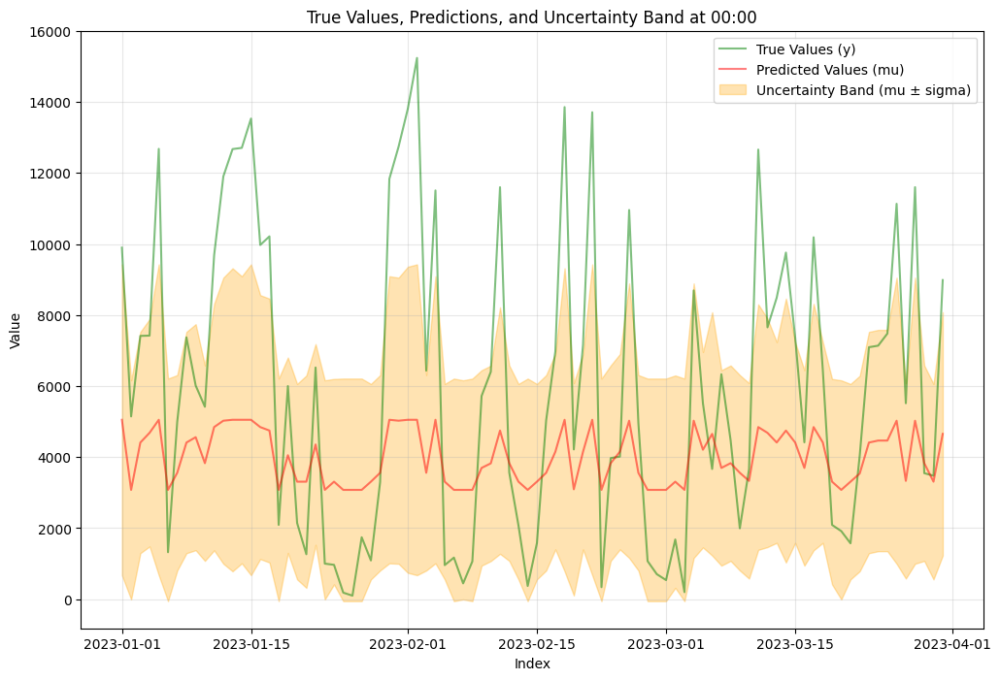

In [ ]:
loc = [y.loc for y in y_val_dists]
scale = [y.scale for y in y_val_dists]


start = 0
end = 90
x = y_validation.index[start:end]
y = y_validation[start:end]
mu = y_val_pred[start:end]
sigma = [y.scale for y in y_val_dists][start:end]

# Plot
plt.figure(figsize=(12, 8))
plt.plot(x, y, label="True Values (y)", color="green", alpha=0.5)
plt.plot(x, mu, label="Predicted Values (mu)", color="red", alpha=0.5)
plt.fill_between(x, mu - sigma, mu + sigma, color="orange", alpha=0.3, label="Uncertainty Band (mu ± sigma)")

# Customize the plot
plt.xlabel("Index")
plt.ylabel("Value")
plt.title("True Values, Predictions, and Uncertainty Band at 00:00")
plt.legend()
plt.grid(alpha=0.3)

In [ ]:
y_train_pred, y_train_dists, y_val_pred, y_val_dists, X_train, y_train, X_validation, y_validation = model_NGBoost("00:00", "only_sin_cos", 500, 0.03)

Data loaded and transformed successfully. Shape of DataFrame: (78912, 22)
# of training observations: 2556 | 77.76%
# of validation observations: 365 | 11.10%
# of test observations: 366 | 11.13%
[iter 0] loss=1735.1167 val_loss=2031.2286 scale=512.0000 norm=449.1209
[iter 1] loss=1732.2106 val_loss=2028.4321 scale=512.0000 norm=448.6991
[iter 2] loss=1729.3304 val_loss=2025.6629 scale=512.0000 norm=448.2816
[iter 3] loss=1726.4760 val_loss=2022.7962 scale=512.0000 norm=447.8673
[iter 4] loss=1723.6472 val_loss=2019.8208 scale=512.0000 norm=447.4532
[iter 5] loss=1720.8391 val_loss=2017.1335 scale=512.0000 norm=447.0406
[iter 6] loss=1718.0600 val_loss=2014.4677 scale=512.0000 norm=446.6392
[iter 7] loss=1715.3050 val_loss=2011.6174 scale=512.0000 norm=446.2480
[iter 8] loss=1712.5692 val_loss=2008.9814 scale=512.0000 norm=445.8547
[iter 9] loss=1709.8618 val_loss=2006.1849 scale=512.0000 norm=445.4731
[iter 10] loss=1707.1729 val_loss=2003.5990 scale=512.0000 norm=445.0981
[iter 11] l

In [ ]:
pd.DataFrame({'y': y_validation,'mu': y_val_pred, "sigma": [y.scale for y in y_val_dists]})

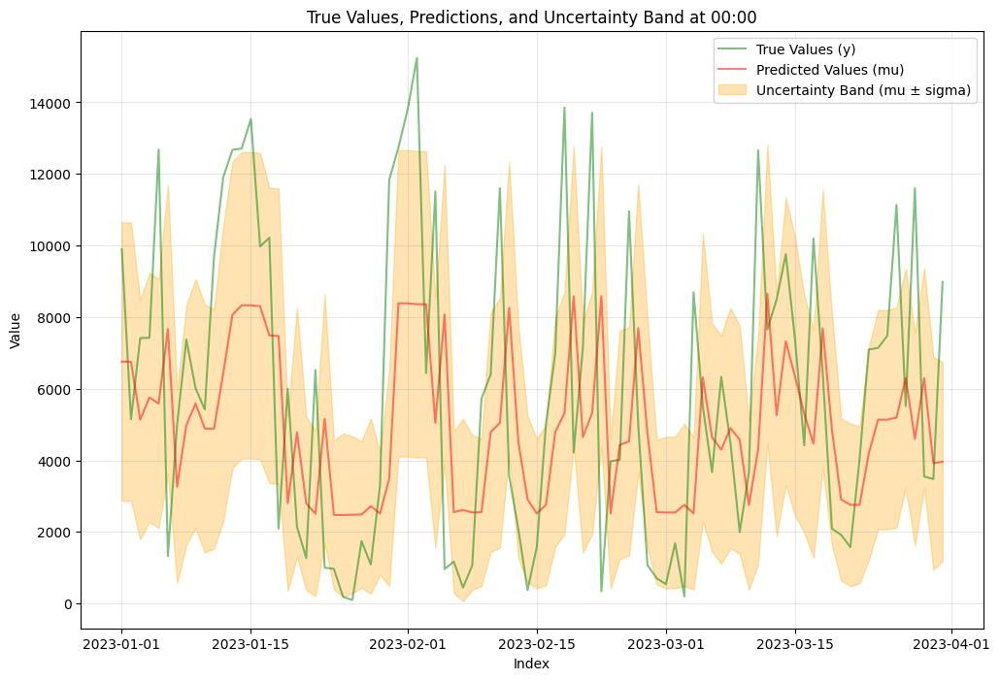

In [ ]:
loc = [y.loc for y in y_val_dists]
scale = [y.scale for y in y_val_dists]


start = 0
end = 90
x = y_validation.index[start:end]
y = y_validation[start:end]
mu = y_val_pred[start:end]
sigma = [y.scale for y in y_val_dists][start:end]

# Plot
plt.figure(figsize=(12, 8))
plt.plot(x, y, label="True Values (y)", color="green", alpha=0.5)
plt.plot(x, mu, label="Predicted Values (mu)", color="red", alpha=0.5)
plt.fill_between(x, mu - sigma, mu + sigma, color="orange", alpha=0.3, label="Uncertainty Band (mu ± sigma)")

# Customize the plot
plt.xlabel("Index")
plt.ylabel("Value")
plt.title("True Values, Predictions, and Uncertainty Band at 00:00")
plt.legend()
plt.grid(alpha=0.3)

In [ ]:
y_train_pred, y_train_dists, y_val_pred, y_val_dists, X_train, y_train, X_validation, y_validation = model_NGBoost("09:00", "only_sin_cos", 500, 0.03)

Data loaded and transformed successfully. Shape of DataFrame: (78912, 22)
# of training observations: 2556 | 77.76%
# of validation observations: 365 | 11.10%
# of test observations: 366 | 11.13%
[iter 0] loss=1863.8893 val_loss=2205.7729 scale=512.0000 norm=451.8419
[iter 1] loss=1861.0479 val_loss=2202.6366 scale=512.0000 norm=451.4320
[iter 2] loss=1858.2150 val_loss=2199.5267 scale=512.0000 norm=451.0259
[iter 3] loss=1855.4044 val_loss=2196.4162 scale=512.0000 norm=450.6224
[iter 4] loss=1852.6169 val_loss=2193.3318 scale=512.0000 norm=450.2223
[iter 5] loss=1849.8511 val_loss=2190.2732 scale=512.0000 norm=449.8251
[iter 6] loss=1847.1068 val_loss=2187.2402 scale=512.0000 norm=449.4310
[iter 7] loss=1844.3839 val_loss=2184.2190 scale=512.0000 norm=449.0397
[iter 8] loss=1841.6663 val_loss=2181.2231 scale=512.0000 norm=448.6424
[iter 9] loss=1838.9699 val_loss=2178.2359 scale=512.0000 norm=448.2503
[iter 10] loss=1836.2947 val_loss=2175.2791 scale=512.0000 norm=447.8620
[iter 11] l

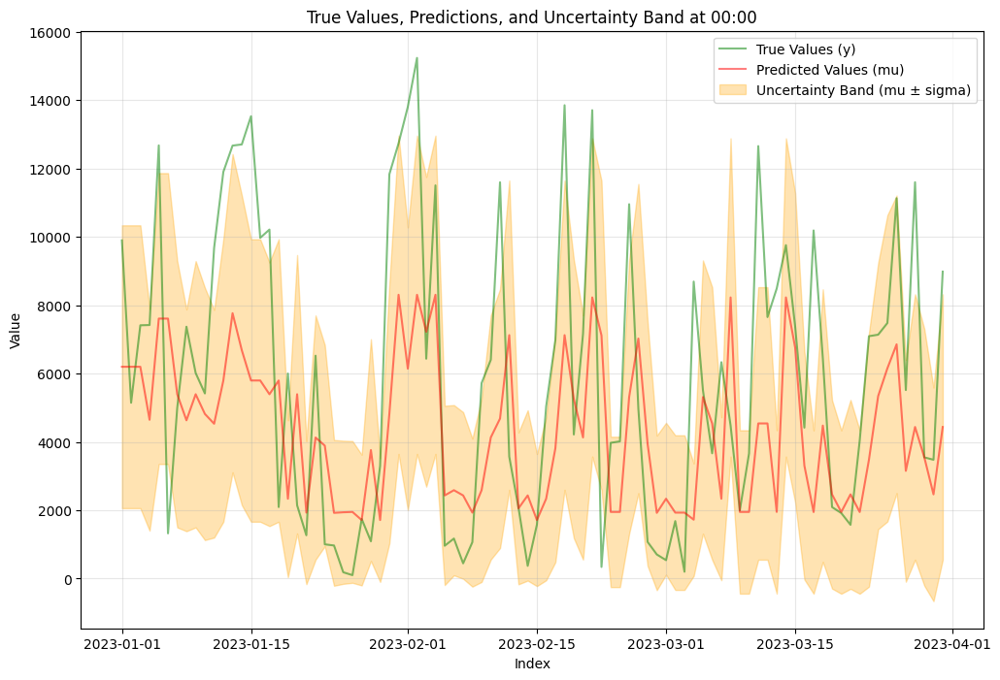

In [ ]:
loc = [y.loc for y in y_val_dists]
scale = [y.scale for y in y_val_dists]


start = 0
end = 90
x = y_validation.index[start:end]
y = y_validation[start:end]
mu = y_val_pred[start:end]
sigma = [y.scale for y in y_val_dists][start:end]

# Plot
plt.figure(figsize=(12, 8))
plt.plot(x, y, label="True Values (y)", color="green", alpha=0.5)
plt.plot(x, mu, label="Predicted Values (mu)", color="red", alpha=0.5)
plt.fill_between(x, mu - sigma, mu + sigma, color="orange", alpha=0.3, label="Uncertainty Band (mu ± sigma)")

# Customize the plot
plt.xlabel("Index")
plt.ylabel("Value")
plt.title("True Values, Predictions, and Uncertainty Band at 00:00")
plt.legend()
plt.grid(alpha=0.3)

In [ ]:
y_train_pred, y_train_dists, y_val_pred, y_val_dists, X_train, y_train, X_validation, y_validation = model_NGBoost("00:00", "only_power", 500, 0.03, Normal)

Data loaded and transformed successfully. Shape of DataFrame: (78912, 22)
# of training observations: 2556 | 77.76%
# of validation observations: 365 | 11.10%
# of test observations: 366 | 11.13%
[iter 0] loss=1735.1167 val_loss=2031.2852 scale=512.0000 norm=449.1209
[iter 1] loss=1732.4641 val_loss=2028.5461 scale=512.0000 norm=448.7341
[iter 2] loss=1729.8357 val_loss=2025.8349 scale=512.0000 norm=448.3507
[iter 3] loss=1727.2315 val_loss=2023.1516 scale=512.0000 norm=447.9707
[iter 4] loss=1724.6512 val_loss=2020.4957 scale=512.0000 norm=447.5936
[iter 5] loss=1722.0945 val_loss=2017.8670 scale=512.0000 norm=447.2200
[iter 6] loss=1719.5612 val_loss=2015.2652 scale=512.0000 norm=446.8515
[iter 7] loss=1717.0512 val_loss=2012.6901 scale=512.0000 norm=446.4864
[iter 8] loss=1714.5641 val_loss=2010.1330 scale=512.0000 norm=446.1250
[iter 9] loss=1712.1012 val_loss=2007.6101 scale=512.0000 norm=445.7736
[iter 10] loss=1709.6593 val_loss=2005.1130 scale=512.0000 norm=445.4234
[iter 11] l

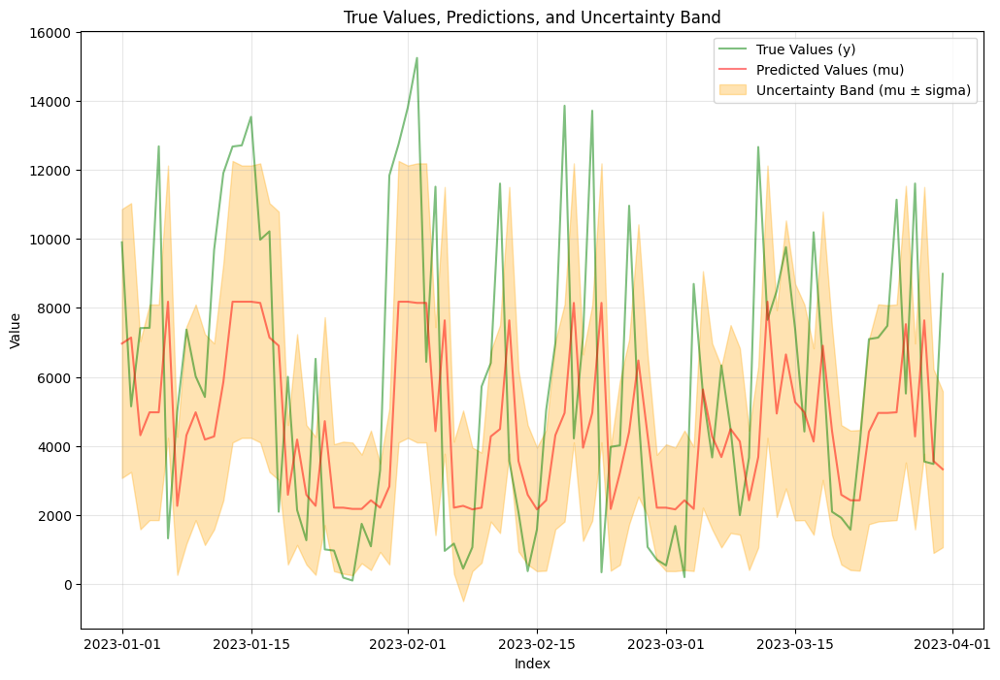

In [ ]:
visualize_predictions_with_uncertainty(y_validation, y_val_pred, y_val_dists, Normal)

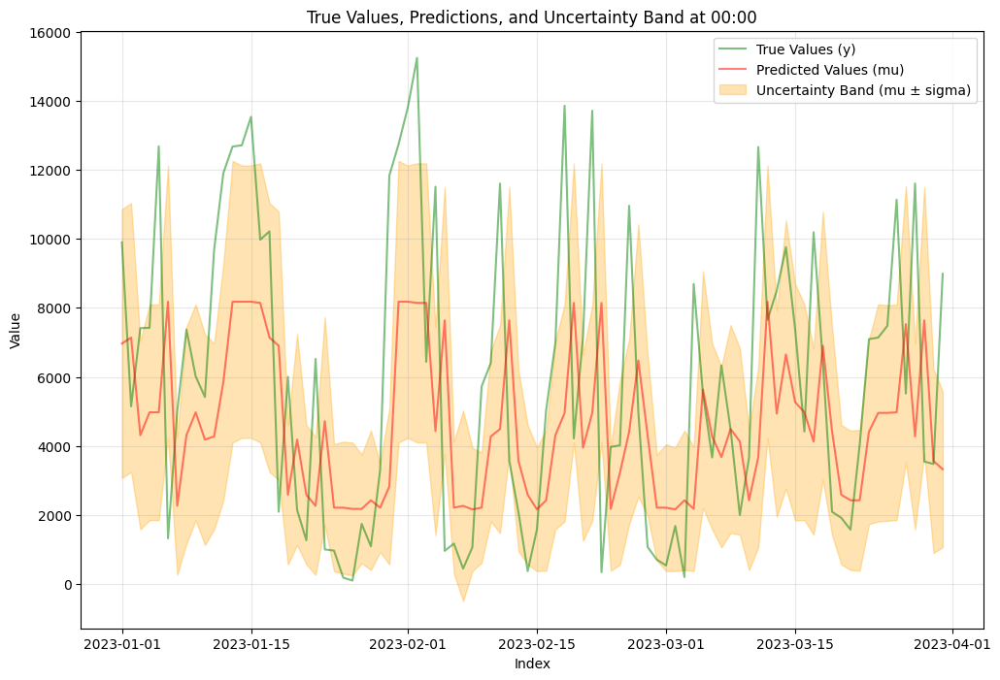

In [ ]:
loc = [y.loc for y in y_val_dists]
scale = [y.scale for y in y_val_dists]


start = 0
end = 90
x = y_validation.index[start:end]
y = y_validation[start:end]
mu = y_val_pred[start:end]
sigma = [y.scale for y in y_val_dists][start:end]

# Plot
plt.figure(figsize=(12, 8))
plt.plot(x, y, label="True Values (y)", color="green", alpha=0.5)
plt.plot(x, mu, label="Predicted Values (mu)", color="red", alpha=0.5)
plt.fill_between(x, mu - sigma, mu + sigma, color="orange", alpha=0.3, label="Uncertainty Band (mu ± sigma)")

# Customize the plot
plt.xlabel("Index")
plt.ylabel("Value")
plt.title("True Values, Predictions, and Uncertainty Band at 00:00")
plt.legend()
plt.grid(alpha=0.3)

In [ ]:
y_train_pred, y_train_dists, y_val_pred, y_val_dists, X_train, y_train, X_validation, y_validation = model_NGBoost("00:00", "all_wind_speeds", 500, 0.03)

Data loaded and transformed successfully. Shape of DataFrame: (78912, 22)
# of training observations: 2556 | 77.76%
# of validation observations: 365 | 11.10%
# of test observations: 366 | 11.13%
[iter 0] loss=1735.1167 val_loss=2023.8149 scale=512.0000 norm=449.1209
[iter 1] loss=1725.9458 val_loss=2013.6660 scale=512.0000 norm=447.7238
[iter 2] loss=1716.8540 val_loss=2003.6300 scale=512.0000 norm=446.3334
[iter 3] loss=1707.7791 val_loss=1993.4909 scale=512.0000 norm=444.9226
[iter 4] loss=1698.8111 val_loss=1983.5033 scale=512.0000 norm=443.5255
[iter 5] loss=1689.8595 val_loss=1973.5589 scale=512.0000 norm=442.1124
[iter 6] loss=1681.0070 val_loss=1963.6665 scale=512.0000 norm=440.7159
[iter 7] loss=1672.2221 val_loss=1953.7931 scale=512.0000 norm=439.3017
[iter 8] loss=1663.5443 val_loss=1944.0916 scale=512.0000 norm=437.9313
[iter 9] loss=1654.8987 val_loss=1934.4053 scale=512.0000 norm=436.5189
[iter 10] loss=1646.3024 val_loss=1924.7534 scale=512.0000 norm=435.1336
[iter 11] l

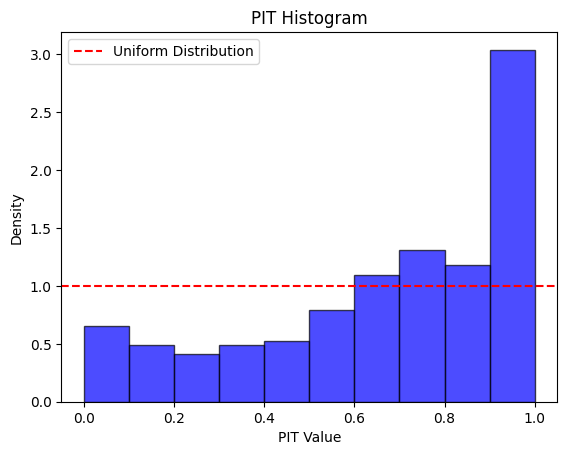

In [ ]:
pit_values = norm.cdf(y_validation, loc=y_val_pred, scale=[y.scale for y in y_val_dists])
plt.hist(pit_values, bins=10, range=(0, 1), density=True, alpha=0.7, color='blue', edgecolor='black')
plt.axhline(1, color='red', linestyle='--', label='Uniform Distribution')
plt.title('PIT Histogram')
plt.xlabel('PIT Value')
plt.ylabel('Density')
plt.legend()
plt.show()

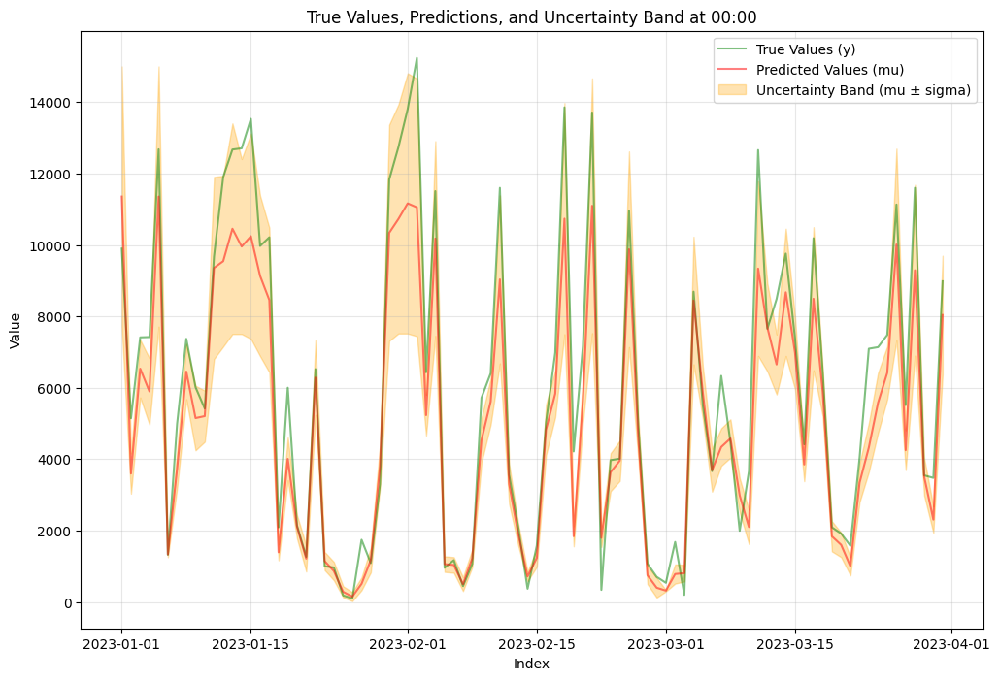

In [ ]:
loc = [y.loc for y in y_val_dists]
scale = [y.scale for y in y_val_dists]


start = 0
end = 90
x = y_validation.index[start:end]
y = y_validation[start:end]
mu = y_val_pred[start:end]
sigma = [y.scale for y in y_val_dists][start:end]

# Plot
plt.figure(figsize=(12, 8))
plt.plot(x, y, label="True Values (y)", color="green", alpha=0.5)
plt.plot(x, mu, label="Predicted Values (mu)", color="red", alpha=0.5)
plt.fill_between(x, mu - sigma, mu + sigma, color="orange", alpha=0.3, label="Uncertainty Band (mu ± sigma)")

# Customize the plot
plt.xlabel("Index")
plt.ylabel("Value")
plt.title("True Values, Predictions, and Uncertainty Band at 00:00")
plt.legend()
plt.grid(alpha=0.3)

In [ ]:
y_train_pred, y_train_dists, y_val_pred, y_val_dists, X_train, y_train, X_validation, y_validation = model_NGBoost("00:00", "max", 500, 0.03)

Data loaded and transformed successfully. Shape of DataFrame: (78912, 22)
# of training observations: 2556 | 77.76%
# of validation observations: 365 | 11.10%
# of test observations: 366 | 11.13%
[iter 0] loss=1735.1167 val_loss=2023.8149 scale=512.0000 norm=449.1209
[iter 1] loss=1725.9458 val_loss=2013.6660 scale=512.0000 norm=447.7238
[iter 2] loss=1716.8540 val_loss=2003.6300 scale=512.0000 norm=446.3334
[iter 3] loss=1707.7791 val_loss=1993.4909 scale=512.0000 norm=444.9226
[iter 4] loss=1698.8111 val_loss=1983.5033 scale=512.0000 norm=443.5255
[iter 5] loss=1689.8595 val_loss=1973.5589 scale=512.0000 norm=442.1124
[iter 6] loss=1681.0070 val_loss=1963.6665 scale=512.0000 norm=440.7159
[iter 7] loss=1672.2221 val_loss=1953.7931 scale=512.0000 norm=439.3017
[iter 8] loss=1663.5443 val_loss=1944.0916 scale=512.0000 norm=437.9313
[iter 9] loss=1654.8987 val_loss=1934.4053 scale=512.0000 norm=436.5189
[iter 10] loss=1646.3024 val_loss=1924.7534 scale=512.0000 norm=435.1336
[iter 11] l

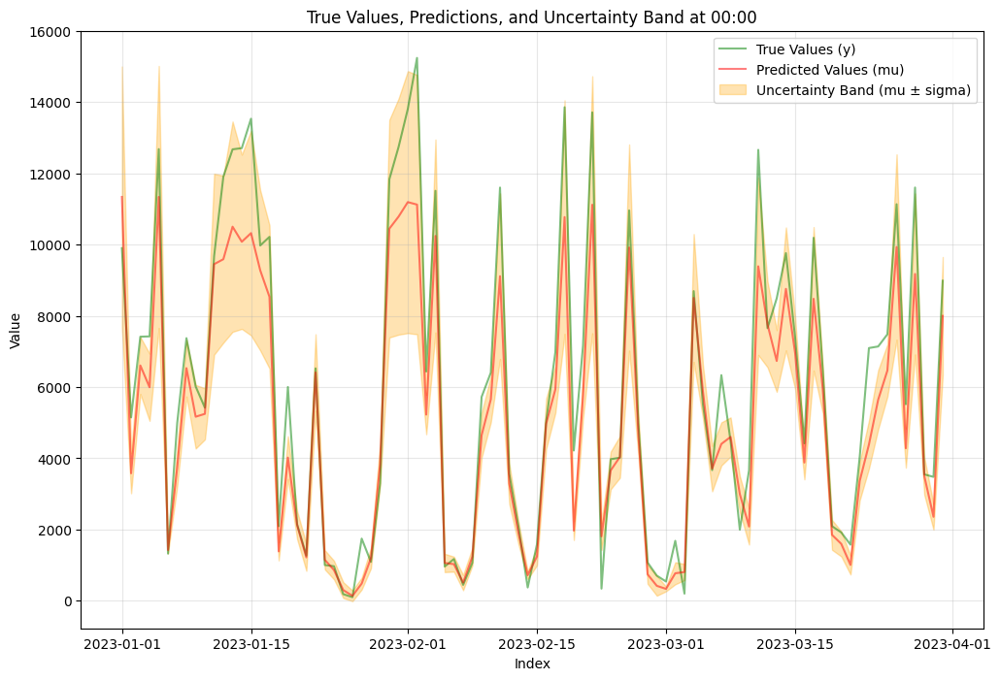

In [ ]:
loc = [y.loc for y in y_val_dists]
scale = [y.scale for y in y_val_dists]


start = 0
end = 90
x = y_validation.index[start:end]
y = y_validation[start:end]
mu = y_val_pred[start:end]
sigma = [y.scale for y in y_val_dists][start:end]

# Plot
plt.figure(figsize=(12, 8))
plt.plot(x, y, label="True Values (y)", color="green", alpha=0.5)
plt.plot(x, mu, label="Predicted Values (mu)", color="red", alpha=0.5)
plt.fill_between(x, mu - sigma, mu + sigma, color="orange", alpha=0.3, label="Uncertainty Band (mu ± sigma)")

# Customize the plot
plt.xlabel("Index")
plt.ylabel("Value")
plt.title("True Values, Predictions, and Uncertainty Band at 00:00")
plt.legend()
plt.grid(alpha=0.3)

### only mean wind speeds

##### Training

In [64]:
y_train_pred, y_train_dists, y_val_pred, y_val_dists, X_train, y_train, X_validation, y_validation = model_NGBoost("09:00", "only_mean_wind", 100, 0.03, LogNormal)

Data loaded and transformed successfully. Shape of DataFrame: (78912, 22)
# of training observations: 2556 | 77.76%
# of validation observations: 365 | 11.10%
# of test observations: 366 | 11.13%
[iter 0] loss=0.7556 val_loss=0.7719 scale=2.0000 norm=2.1638
[iter 1] loss=0.7206 val_loss=0.7381 scale=2.0000 norm=2.0924
[iter 2] loss=0.6889 val_loss=0.7075 scale=2.0000 norm=2.0337
[iter 3] loss=0.6601 val_loss=0.6798 scale=2.0000 norm=1.9852
[iter 4] loss=0.6337 val_loss=0.6543 scale=2.0000 norm=1.9453
[iter 5] loss=0.6095 val_loss=0.6310 scale=2.0000 norm=1.9128
[iter 6] loss=0.5871 val_loss=0.6094 scale=2.0000 norm=1.8869
[iter 7] loss=0.5664 val_loss=0.5894 scale=2.0000 norm=1.8667
[iter 8] loss=0.5471 val_loss=0.5707 scale=2.0000 norm=1.8518
[iter 9] loss=0.5291 val_loss=0.5533 scale=2.0000 norm=1.8416
[iter 10] loss=0.5123 val_loss=0.5370 scale=2.0000 norm=1.8358
[iter 11] loss=0.4965 val_loss=0.5216 scale=2.0000 norm=1.8342
[iter 12] loss=0.4817 val_loss=0.5075 scale=2.0000 norm=1.

In [65]:
results = pd.DataFrame({
    'y': y_validation,
    'median': y_val_pred, 
    "sigma": [y.scale for y in y_val_dists], 
    'mean': [y_val_pred[i] * np.exp(0.5 * (y.scale ** 2)) for i, y in enumerate(y_val_dists)]})

results


,y,median,sigma,mean
date,,,,
2023-01-01,7680.0,12643.256712,0.187979,12868.624316
2023-01-02,9751.0,9034.637746,0.162006,9153.979959
2023-01-03,3640.0,2845.690831,0.300194,2976.845588
2023-01-04,14492.0,11756.056831,0.213239,12026.398465
2023-01-05,14153.0,12606.941125,0.196593,12852.931705
...,...,...,...,...
2023-12-27,1994.0,3090.991377,0.378060,3319.972343
2023-12-28,11945.0,8627.137394,0.170705,8753.755675
2023-12-29,13606.0,12840.770423,0.203753,13110.100026


##### Plot true values and uncertainty band of prediction

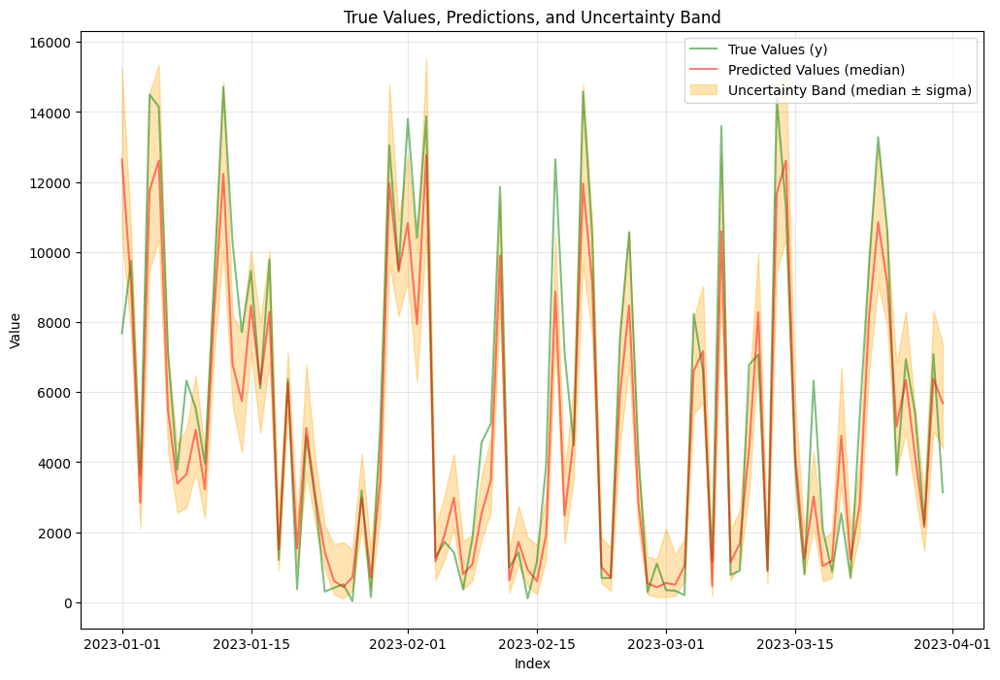

In [66]:
start = 0
end = 90
x = y_validation.index[start:end]
y = y_validation[start:end]
median = y_val_pred[start:end]
sigma_all = np.array([y.scale for y in y_val_dists])
sigma = sigma_all[start:end]

lower_bound = median * np.exp(-sigma)
upper_bound = median * np.exp(sigma)

# Plot
plt.figure(figsize=(12, 8))
plt.plot(x, y, label="True Values (y)", color="green", alpha=0.5)
plt.plot(x, median, label="Predicted Values (median)", color="red", alpha=0.5)
plt.fill_between(x, lower_bound, upper_bound, color="orange", alpha=0.3, label="Uncertainty Band (median ± sigma)")

# Customize the plot
plt.xlabel("Index")
plt.ylabel("Value")
plt.title(f"True Values, Predictions, and Uncertainty Band")
plt.legend()
plt.grid(alpha=0.3)

# Show the plot
plt.show()

##### Probability Integram Transform (PIT)

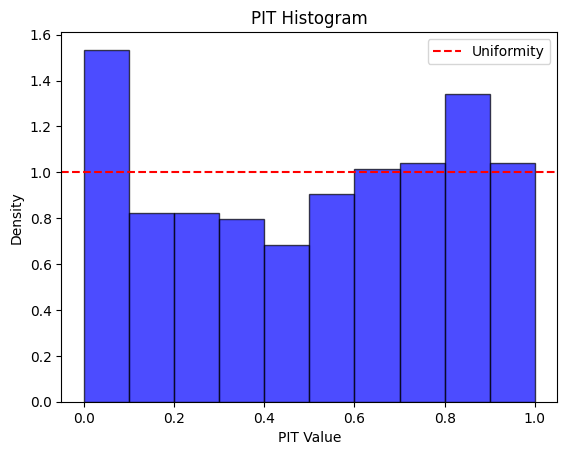

In [67]:
from scipy.stats import lognorm


pit_scores = lognorm.cdf(results['y'], s=results['sigma'], scale=results['median'])

plt.hist(pit_scores, bins=10, range=(0, 1), density=True, alpha=0.7, color='blue', edgecolor='black')
plt.axhline(1, color='red', linestyle='--', label='Uniformity')
plt.title('PIT Histogram')
plt.xlabel('PIT Value')
plt.ylabel('Density')
plt.legend()
plt.show()

### All wind speeds

#### Log Normal Distribution

##### Training

In [85]:
y_train_pred, y_train_dists, y_val_pred, y_val_dists, X_train, y_train, X_validation, y_validation = model_NGBoost("00:00", "all_wind_speeds", 100, 0.03, LogNormal)

Data loaded and transformed successfully. Shape of DataFrame: (78912, 22)
# of training observations: 2556 | 77.76%
# of validation observations: 365 | 11.10%
# of test observations: 366 | 11.13%
[iter 0] loss=0.5552 val_loss=0.5756 scale=1.0000 norm=1.1868
[iter 1] loss=0.5374 val_loss=0.5582 scale=1.0000 norm=1.1583
[iter 2] loss=0.5206 val_loss=0.5422 scale=1.0000 norm=1.1341
[iter 3] loss=0.5048 val_loss=0.5272 scale=1.0000 norm=1.1136
[iter 4] loss=0.4898 val_loss=0.5128 scale=1.0000 norm=1.0959
[iter 5] loss=0.4756 val_loss=0.4991 scale=1.0000 norm=1.0810
[iter 6] loss=0.4622 val_loss=0.4860 scale=1.0000 norm=1.0688
[iter 7] loss=0.4493 val_loss=0.4737 scale=1.0000 norm=1.0587
[iter 8] loss=0.4370 val_loss=0.4620 scale=1.0000 norm=1.0506
[iter 9] loss=0.4252 val_loss=0.4505 scale=1.0000 norm=1.0441
[iter 10] loss=0.4139 val_loss=0.4397 scale=1.0000 norm=1.0395
[iter 11] loss=0.4030 val_loss=0.4292 scale=1.0000 norm=1.0364
[iter 12] loss=0.3927 val_loss=0.4190 scale=1.0000 norm=1.

In [86]:
results = pd.DataFrame({
    'y': y_validation,
    'median': y_val_pred, 
    "sigma": [y.scale for y in y_val_dists], 
    'mean': [y_val_pred[i] * np.exp(0.5 * (y.scale ** 2)) for i, y in enumerate(y_val_dists)]})

results


,y,median,sigma,mean
date,,,,
2023-01-01,9898.0,12489.857639,0.269465,12951.643186
2023-01-02,5146.0,3493.924796,0.211982,3573.315225
2023-01-03,7413.0,6633.840148,0.104550,6670.195407
2023-01-04,7421.0,6078.841236,0.161695,6158.829272
2023-01-05,12678.0,12375.262161,0.269465,12832.810787
...,...,...,...,...
2023-12-27,9581.0,8889.171361,0.119997,8953.401222
2023-12-28,11063.0,10097.378756,0.192842,10286.886358
2023-12-29,11821.0,11780.635761,0.266176,12205.442251


##### Plot true values and uncertainty band of prediction

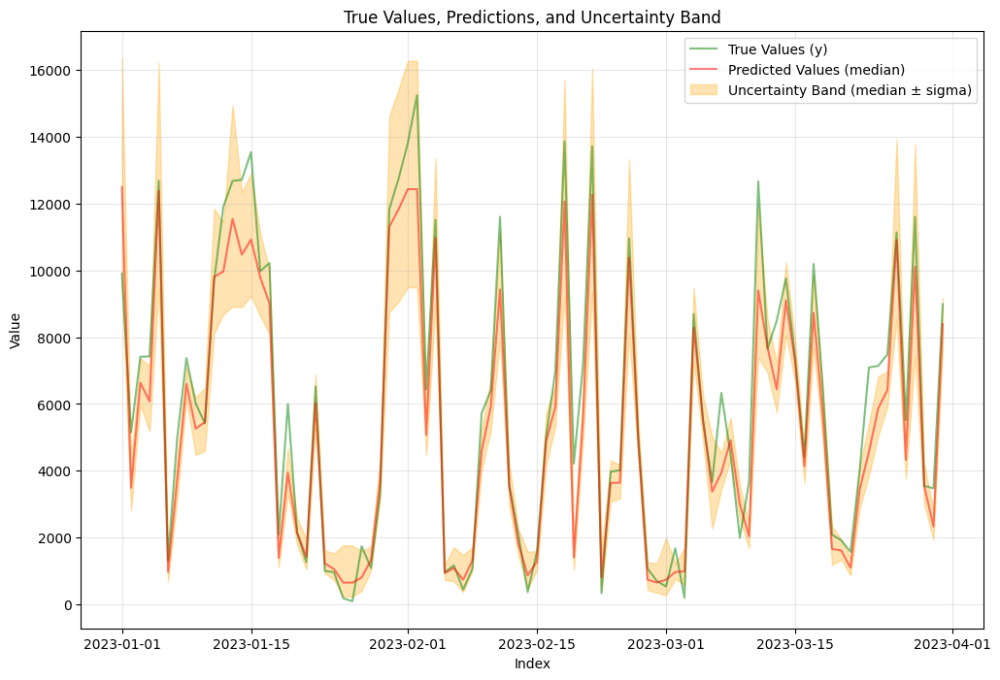

In [87]:
start = 0
end = 90
x = y_validation.index[start:end]
y = y_validation[start:end]
median = y_val_pred[start:end]
sigma_all = np.array([y.scale for y in y_val_dists])
sigma = sigma_all[start:end]

lower_bound = median * np.exp(-sigma)
upper_bound = median * np.exp(sigma)

# Plot
plt.figure(figsize=(12, 8))
plt.plot(x, y, label="True Values (y)", color="green", alpha=0.5)
plt.plot(x, median, label="Predicted Values (median)", color="red", alpha=0.5)
plt.fill_between(x, lower_bound, upper_bound, color="orange", alpha=0.3, label="Uncertainty Band (median ± sigma)")

# Customize the plot
plt.xlabel("Index")
plt.ylabel("Value")
plt.title(f"True Values, Predictions, and Uncertainty Band")
plt.legend()
plt.grid(alpha=0.3)

# Show the plot
plt.show()

##### Probability Integram Transform (PIT)

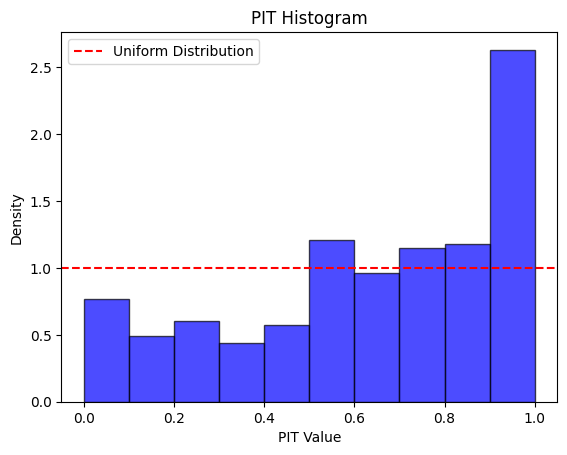

In [88]:
from scipy.stats import lognorm


pit_scores = lognorm.cdf(results['y'], s=results['sigma'], scale=results['median'])

plt.hist(pit_scores, bins=10, range=(0, 1), density=True, alpha=0.7, color='blue', edgecolor='black')
plt.axhline(1, color='red', linestyle='--', label='Uniform Distribution')
plt.title('PIT Histogram')
plt.xlabel('PIT Value')
plt.ylabel('Density')
plt.legend()
plt.show()

#### Log Normal Distribution

##### Training

In [ ]:
y_train_pred, y_train_dists, y_val_pred, y_val_dists, X_train, y_train, X_validation, y_validation = model_NGBoost("00:00", "only_power", 100, 0.03, LogNormal)

Data loaded and transformed successfully. Shape of DataFrame: (78912, 22)
# of training observations: 2556 | 77.76%
# of validation observations: 365 | 11.10%
# of test observations: 366 | 11.13%
[iter 0] loss=0.5552 val_loss=0.5894 scale=1.0000 norm=1.1868
[iter 1] loss=0.5511 val_loss=0.5850 scale=1.0000 norm=1.1808
[iter 2] loss=0.5472 val_loss=0.5810 scale=1.0000 norm=1.1757
[iter 3] loss=0.5437 val_loss=0.5772 scale=1.0000 norm=1.1713
[iter 4] loss=0.5403 val_loss=0.5738 scale=1.0000 norm=1.1675
[iter 5] loss=0.5371 val_loss=0.5706 scale=1.0000 norm=1.1643
[iter 6] loss=0.5341 val_loss=0.5677 scale=1.0000 norm=1.1615
[iter 7] loss=0.5313 val_loss=0.5648 scale=1.0000 norm=1.1592
[iter 8] loss=0.5287 val_loss=0.5622 scale=1.0000 norm=1.1573
[iter 9] loss=0.5262 val_loss=0.5597 scale=1.0000 norm=1.1557
[iter 10] loss=0.5238 val_loss=0.5573 scale=1.0000 norm=1.1544
[iter 11] loss=0.5216 val_loss=0.5551 scale=1.0000 norm=1.1534
[iter 12] loss=0.5194 val_loss=0.5530 scale=1.0000 norm=1.

In [ ]:
results = pd.DataFrame({
    'y': y_validation,
    'median': y_val_pred, 
    "sigma": [y.scale for y in y_val_dists], 
    'mean': [y_val_pred[i] * np.exp(0.5 * (y.scale ** 2)) for i, y in enumerate(y_val_dists)]})

results


,y,median,sigma,mean
date,,,,
2023-01-01,9898.0,8402.681135,0.707724,10793.969600
2023-01-02,5146.0,8353.704217,0.614278,10088.272231
2023-01-03,7413.0,4987.642762,0.710444,6419.426888
2023-01-04,7421.0,5719.961196,0.725113,7439.893522
2023-01-05,12678.0,5719.961196,0.725113,7439.893522
...,...,...,...,...
2023-12-27,9581.0,6528.634122,0.753167,8669.645814
2023-12-28,11063.0,6464.201628,0.647803,7973.340916
2023-12-29,11821.0,8270.588324,0.736558,10847.822036


##### Plot true values and uncertainty band of prediction

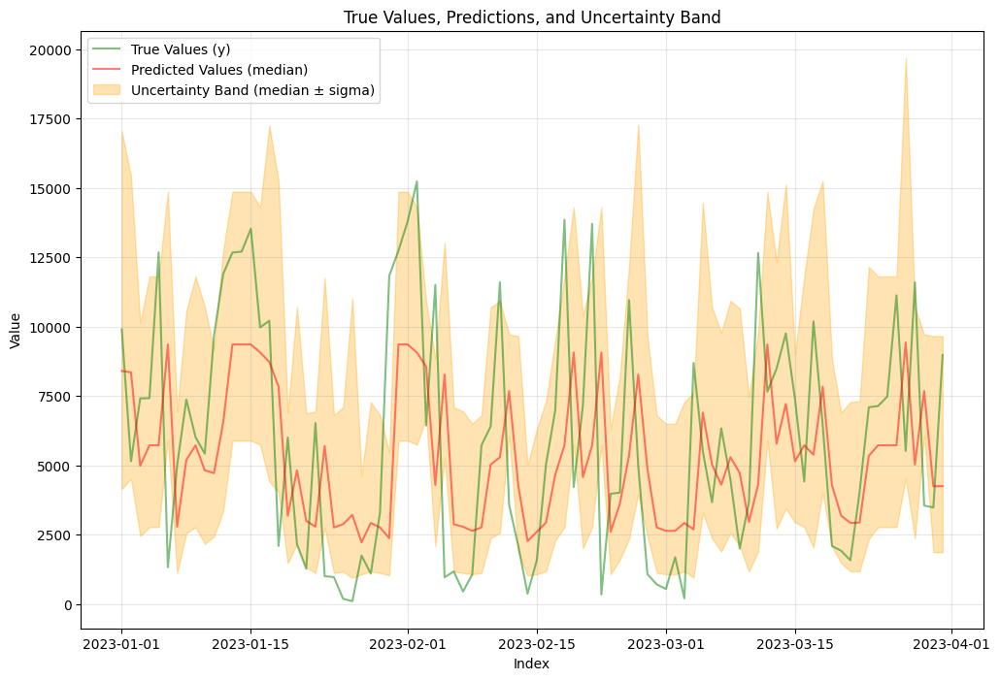

In [ ]:
start = 0
end = 90
x = y_validation.index[start:end]
y = y_validation[start:end]
median = y_val_pred[start:end]
sigma_all = np.array([y.scale for y in y_val_dists])
sigma = sigma_all[start:end]

lower_bound = median * np.exp(-sigma)
upper_bound = median * np.exp(sigma)

# Plot
plt.figure(figsize=(12, 8))
plt.plot(x, y, label="True Values (y)", color="green", alpha=0.5)
plt.plot(x, median, label="Predicted Values (median)", color="red", alpha=0.5)
plt.fill_between(x, lower_bound, upper_bound, color="orange", alpha=0.3, label="Uncertainty Band (median ± sigma)")

# Customize the plot
plt.xlabel("Index")
plt.ylabel("Value")
plt.title(f"True Values, Predictions, and Uncertainty Band")
plt.legend()
plt.grid(alpha=0.3)

# Show the plot
plt.show()

##### Probability Integram Transform (PIT)

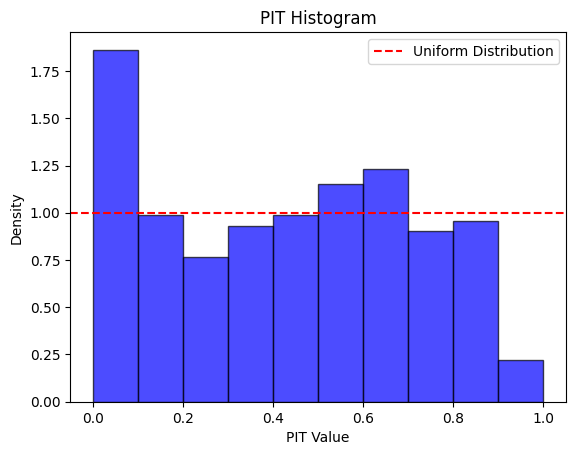

In [ ]:
from scipy.stats import lognorm


pit_scores = lognorm.cdf(results['y'], s=results['sigma'], scale=results['median'])

plt.hist(pit_scores, bins=10, range=(0, 1), density=True, alpha=0.7, color='blue', edgecolor='black')
plt.axhline(1, color='red', linestyle='--', label='Uniform Distribution')
plt.title('PIT Histogram')
plt.xlabel('PIT Value')
plt.ylabel('Density')
plt.legend()
plt.show()

### all_wind_speeds

#### Log Normal Distribution

##### Training

In [68]:
y_train_pred, y_train_dists, y_val_pred, y_val_dists, X_train, y_train, X_validation, y_validation = model_NGBoost("09:00", "all_wind_speeds", 100, 0.03, LogNormal)

Data loaded and transformed successfully. Shape of DataFrame: (78912, 22)
# of training observations: 2556 | 77.76%
# of validation observations: 365 | 11.10%
# of test observations: 366 | 11.13%
[iter 0] loss=0.7556 val_loss=0.7696 scale=2.0000 norm=2.1638
[iter 1] loss=0.7193 val_loss=0.7342 scale=2.0000 norm=2.0897
[iter 2] loss=0.6863 val_loss=0.7016 scale=2.0000 norm=2.0283
[iter 3] loss=0.6555 val_loss=0.6717 scale=2.0000 norm=1.9753
[iter 4] loss=0.6274 val_loss=0.6445 scale=2.0000 norm=1.9324
[iter 5] loss=0.6011 val_loss=0.6191 scale=2.0000 norm=1.8965
[iter 6] loss=0.5769 val_loss=0.5953 scale=2.0000 norm=1.8679
[iter 7] loss=0.5540 val_loss=0.5729 scale=2.0000 norm=1.8451
[iter 8] loss=0.5324 val_loss=0.5509 scale=2.0000 norm=1.8277
[iter 9] loss=0.5119 val_loss=0.5309 scale=2.0000 norm=1.8153
[iter 10] loss=0.4926 val_loss=0.5210 scale=1.0000 norm=0.9041
[iter 11] loss=0.4833 val_loss=0.5017 scale=2.0000 norm=1.8069
[iter 12] loss=0.4653 val_loss=0.4928 scale=1.0000 norm=0.

In [72]:
results = pd.DataFrame({
    'y': y_validation,
    'median': y_val_pred, 
    "sigma": [y.scale for y in y_val_dists], 
    'mean': [y_val_pred[i] * np.exp(0.5 * (y.scale ** 2)) for i, y in enumerate(y_val_dists)]})

results


,y,median,sigma,mean
date,,,,
2023-01-01,7680.0,12189.076599,0.227834,12509.574215
2023-01-02,9751.0,9132.012048,0.146965,9231.166276
2023-01-03,3640.0,3175.060859,0.207245,3243.983580
2023-01-04,14492.0,12000.475821,0.227834,12316.014399
2023-01-05,14153.0,12432.139377,0.232393,12772.421579
...,...,...,...,...
2023-12-27,1994.0,2251.827205,0.223203,2308.624065
2023-12-28,11945.0,10605.873843,0.204297,10829.528972
2023-12-29,13606.0,12807.252499,0.227834,13144.004333


##### Plot true values and uncertainty band of prediction

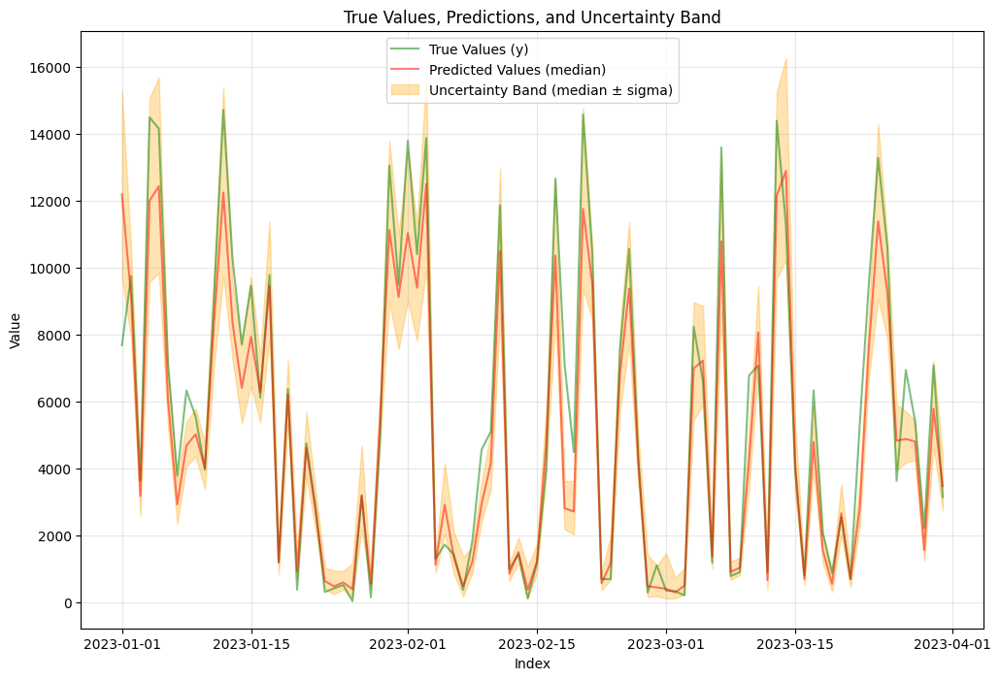

In [73]:
start = 0
end = 90
x = y_validation.index[start:end]
y = y_validation[start:end]
median = y_val_pred[start:end]
sigma_all = np.array([y.scale for y in y_val_dists])
sigma = sigma_all[start:end]

lower_bound = median * np.exp(-sigma)
upper_bound = median * np.exp(sigma)

# Plot
plt.figure(figsize=(12, 8))
plt.plot(x, y, label="True Values (y)", color="green", alpha=0.5)
plt.plot(x, median, label="Predicted Values (median)", color="red", alpha=0.5)
plt.fill_between(x, lower_bound, upper_bound, color="orange", alpha=0.3, label="Uncertainty Band (median ± sigma)")

# Customize the plot
plt.xlabel("Index")
plt.ylabel("Value")
plt.title(f"True Values, Predictions, and Uncertainty Band")
plt.legend()
plt.grid(alpha=0.3)

# Show the plot
plt.show()

##### Probability Integram Transform (PIT)

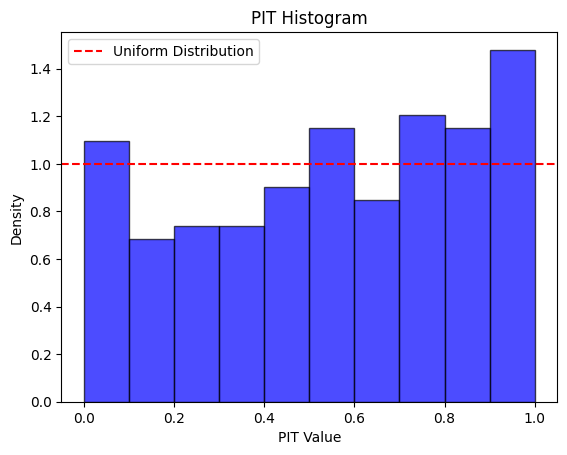

In [74]:
from scipy.stats import lognorm


pit_scores = lognorm.cdf(results['y'], s=results['sigma'], scale=results['median'])

plt.hist(pit_scores, bins=10, range=(0, 1), density=True, alpha=0.7, color='blue', edgecolor='black')
plt.axhline(1, color='red', linestyle='--', label='Uniform Distribution')
plt.title('PIT Histogram')
plt.xlabel('PIT Value')
plt.ylabel('Density')
plt.legend()
plt.show()

### 00:00 max

#### Log Normal Distribution

##### Training

In [75]:
y_train_pred, y_train_dists, y_val_pred, y_val_dists, X_train, y_train, X_validation, y_validation = model_NGBoost("09:00", "max", 100, 0.03, LogNormal)

Data loaded and transformed successfully. Shape of DataFrame: (78912, 22)
# of training observations: 2556 | 77.76%
# of validation observations: 365 | 11.10%
# of test observations: 366 | 11.13%
[iter 0] loss=0.7556 val_loss=0.7696 scale=2.0000 norm=2.1638
[iter 1] loss=0.7193 val_loss=0.7342 scale=2.0000 norm=2.0897
[iter 2] loss=0.6863 val_loss=0.7016 scale=2.0000 norm=2.0283
[iter 3] loss=0.6555 val_loss=0.6717 scale=2.0000 norm=1.9753
[iter 4] loss=0.6274 val_loss=0.6445 scale=2.0000 norm=1.9324
[iter 5] loss=0.6011 val_loss=0.6191 scale=2.0000 norm=1.8965
[iter 6] loss=0.5769 val_loss=0.5953 scale=2.0000 norm=1.8679
[iter 7] loss=0.5540 val_loss=0.5729 scale=2.0000 norm=1.8451
[iter 8] loss=0.5324 val_loss=0.5509 scale=2.0000 norm=1.8277
[iter 9] loss=0.5119 val_loss=0.5309 scale=2.0000 norm=1.8153
[iter 10] loss=0.4926 val_loss=0.5210 scale=1.0000 norm=0.9041
[iter 11] loss=0.4833 val_loss=0.5017 scale=2.0000 norm=1.8069
[iter 12] loss=0.4653 val_loss=0.4928 scale=1.0000 norm=0.

c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:64: RuntimeWarning: invalid value encountered in multiply
  return (1 - E) * crps_cens + E * crps_uncens
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.py:108: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\lognormal.p

[iter 99] loss=0.1806 val_loss=0.2202 scale=0.0020 norm=0.0071
Training features: ['power_t-1', 'ws_10m_loc_1', 'ws_10m_loc_10', 'ws_10m_loc_2', 'ws_10m_loc_3', 'ws_10m_loc_4', 'ws_10m_loc_5', 'ws_10m_loc_6', 'ws_10m_loc_7', 'ws_10m_loc_8', 'ws_10m_loc_9', 'ws_10m_loc_mean', 'ws_100m_loc_1', 'ws_100m_loc_10', 'ws_100m_loc_2', 'ws_100m_loc_3', 'ws_100m_loc_4', 'ws_100m_loc_5', 'ws_100m_loc_6', 'ws_100m_loc_7', 'ws_100m_loc_8', 'ws_100m_loc_9', 'ws_100m_loc_mean', 'sin_day', 'cos_day'] -> power
Train MSE:	 498687.64605185814
Validation MSE:	 1026165.1732588552


In [76]:
results = pd.DataFrame({
    'y': y_validation,
    'median': y_val_pred, 
    "sigma": [y.scale for y in y_val_dists], 
    'mean': [y_val_pred[i] * np.exp(0.5 * (y.scale ** 2)) for i, y in enumerate(y_val_dists)]})

results


,y,median,sigma,mean
date,,,,
2023-01-01,7680.0,11991.804224,0.244650,12356.103276
2023-01-02,9751.0,9150.460830,0.150522,9254.709990
2023-01-03,3640.0,3146.674520,0.206056,3214.191315
2023-01-04,14492.0,12073.711156,0.244681,12440.594418
2023-01-05,14153.0,12520.208432,0.244650,12900.562345
...,...,...,...,...
2023-12-27,1994.0,2361.967227,0.264285,2445.912028
2023-12-28,11945.0,10853.226055,0.195567,11062.772626
2023-12-29,13606.0,12677.929425,0.244650,13063.072276


##### Plot true values and uncertainty band of prediction

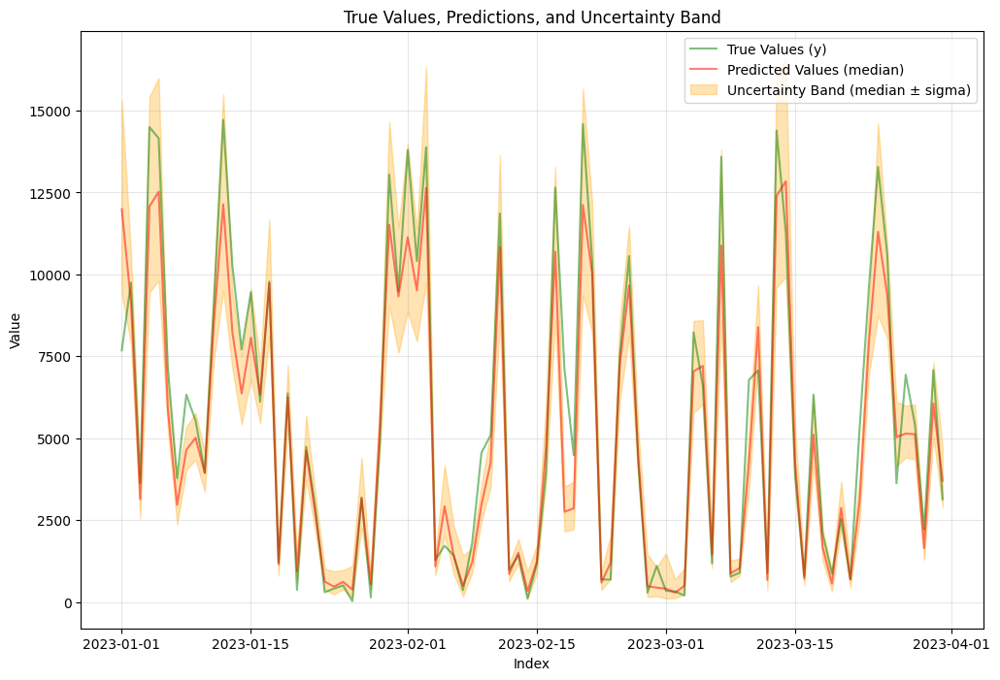

In [77]:
start = 0
end = 90
x = y_validation.index[start:end]
y = y_validation[start:end]
median = y_val_pred[start:end]
sigma_all = np.array([y.scale for y in y_val_dists])
sigma = sigma_all[start:end]

lower_bound = median * np.exp(-sigma)
upper_bound = median * np.exp(sigma)

# Plot
plt.figure(figsize=(12, 8))
plt.plot(x, y, label="True Values (y)", color="green", alpha=0.5)
plt.plot(x, median, label="Predicted Values (median)", color="red", alpha=0.5)
plt.fill_between(x, lower_bound, upper_bound, color="orange", alpha=0.3, label="Uncertainty Band (median ± sigma)")

# Customize the plot
plt.xlabel("Index")
plt.ylabel("Value")
plt.title(f"True Values, Predictions, and Uncertainty Band")
plt.legend()
plt.grid(alpha=0.3)

# Show the plot
plt.show()

##### Probability Integram Transform (PIT)

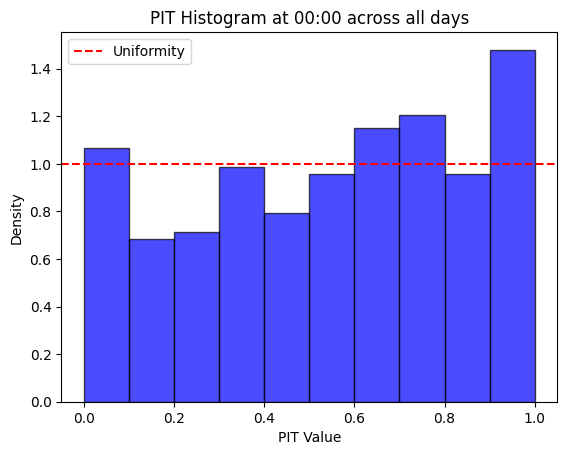

In [79]:
from scipy.stats import lognorm


pit_scores = lognorm.cdf(results['y'], s=results['sigma'], scale=results['median'])

plt.hist(pit_scores, bins=10, range=(0, 1), density=True, alpha=0.7, color='blue', edgecolor='black')
plt.axhline(1, color='red', linestyle='--', label='Uniformity')
plt.title('PIT Histogram at 00:00 across all days')
plt.xlabel('PIT Value')
plt.ylabel('Density')
plt.legend()
plt.show()

#### Normal Distribution

##### Training

In [ ]:
y_train_pred, y_train_dists, y_val_pred, y_val_dists, X_train, y_train, X_validation, y_validation = model_NGBoost("00:00", "only_mean_wind", 500, 0.03, Normal)

Data loaded and transformed successfully. Shape of DataFrame: (78912, 22)
# of training observations: 2556 | 77.76%
# of validation observations: 365 | 11.10%
# of test observations: 366 | 11.13%
[iter 0] loss=1735.1167 val_loss=2024.0642 scale=512.0000 norm=449.1209
[iter 1] loss=1726.2357 val_loss=2014.1590 scale=512.0000 norm=447.7525
[iter 2] loss=1717.4336 val_loss=2004.3367 scale=512.0000 norm=446.3911
[iter 3] loss=1708.7099 val_loss=1994.6216 scale=512.0000 norm=445.0350
[iter 4] loss=1700.0636 val_loss=1984.9876 scale=512.0000 norm=443.6878
[iter 5] loss=1691.4936 val_loss=1975.4310 scale=512.0000 norm=442.3483
[iter 6] loss=1682.9951 val_loss=1965.9548 scale=512.0000 norm=441.0148
[iter 7] loss=1674.5718 val_loss=1956.5474 scale=512.0000 norm=439.6935
[iter 8] loss=1666.2326 val_loss=1947.2308 scale=512.0000 norm=438.3813
[iter 9] loss=1657.9570 val_loss=1937.9928 scale=512.0000 norm=437.0803
[iter 10] loss=1649.7545 val_loss=1928.8387 scale=512.0000 norm=435.7857
[iter 11] l

In [ ]:
results = pd.DataFrame({'y': y_validation,'mu': y_val_pred, "sigma": [y.scale for y in y_val_dists]})

##### Plot true values and uncertainty band of prediction

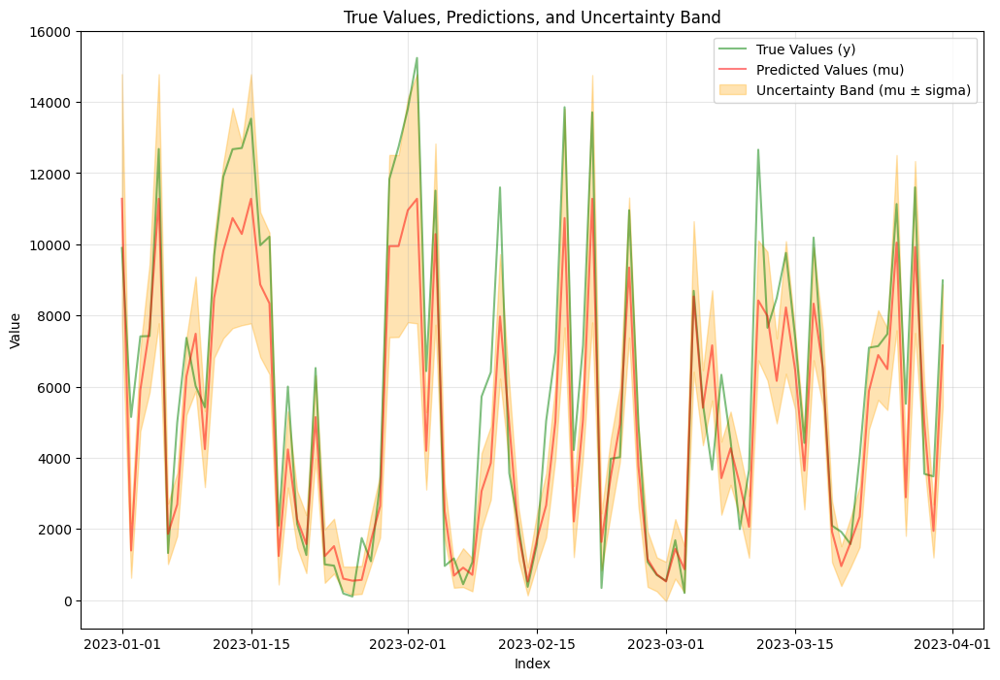

In [ ]:
start = 0
end = 90
x = y_validation.index[start:end]
y = y_validation[start:end]
mu = y_val_pred[start:end]

sigma = [y.scale for y in y_val_dists][start:end]  # Normal sigma
lower_bound = mu - sigma  # Normal uncertainty band
upper_bound = mu + sigma  # Normal uncertainty band

# Plot
plt.figure(figsize=(12, 8))
plt.plot(x, y, label="True Values (y)", color="green", alpha=0.5)
plt.plot(x, mu, label="Predicted Values (mu)", color="red", alpha=0.5)
plt.fill_between(x, lower_bound, upper_bound, color="orange", alpha=0.3, label="Uncertainty Band (mu ± sigma)")

# Customize the plot
plt.xlabel("Index")
plt.ylabel("Value")
plt.title(f"True Values, Predictions, and Uncertainty Band")
plt.legend()
plt.grid(alpha=0.3)

# Show the plot
plt.show()

##### Probability Integram Transform (PIT)

In [ ]:
from scipy.stats import norm

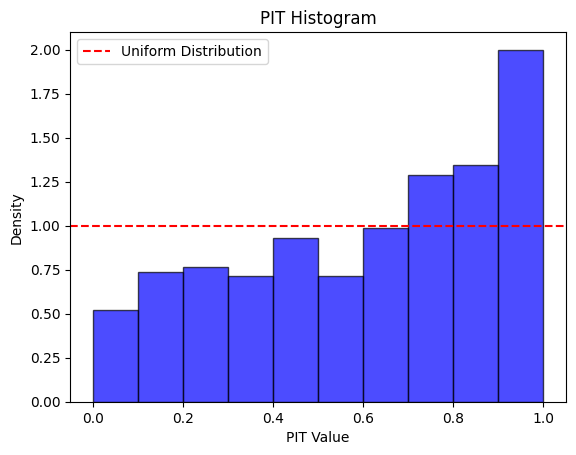

In [ ]:
q = norm.cdf(y_validation, loc=y_val_pred, scale=[y.scale for y in y_val_dists])
plt.hist(q, bins=10, range=(0, 1), density=True, alpha=0.7, color='blue', edgecolor='black')
plt.axhline(1, color='red', linestyle='--', label='Uniform Distribution')
plt.title('PIT Histogram')
plt.xlabel('PIT Value')
plt.ylabel('Density')
plt.legend()
plt.show()


In [ ]:
y_train_pred, y_train_dists, y_val_pred, y_val_dists, X_train, y_train, X_validation, y_validation = model_NGBoost("09:00", "only_power", 500, 0.03, seed=42)

Data loaded and transformed successfully. Shape of DataFrame: (78912, 22)
# of training observations: 2556 | 77.76%
# of validation observations: 365 | 11.10%
# of test observations: 366 | 11.13%
[iter 0] loss=1863.8893 val_loss=2206.0406 scale=512.0000 norm=451.8419
[iter 1] loss=1861.2794 val_loss=2203.1369 scale=512.0000 norm=451.4672
[iter 2] loss=1858.6903 val_loss=2200.1985 scale=512.0000 norm=451.0951
[iter 3] loss=1856.1044 val_loss=2197.2853 scale=512.0000 norm=450.7209
[iter 4] loss=1853.5391 val_loss=2194.4224 scale=512.0000 norm=450.3488
[iter 5] loss=1851.0072 val_loss=2191.5577 scale=512.0000 norm=449.9827
[iter 6] loss=1848.4825 val_loss=2188.7177 scale=512.0000 norm=449.6161
[iter 7] loss=1845.9777 val_loss=2185.9021 scale=512.0000 norm=449.2535
[iter 8] loss=1843.4928 val_loss=2183.1108 scale=512.0000 norm=448.8954
[iter 9] loss=1841.0276 val_loss=2180.3677 scale=512.0000 norm=448.5399
[iter 10] loss=1838.5942 val_loss=2177.6242 scale=512.0000 norm=448.1930
[iter 11] l

In [16]:
y_train_pred, y_train_dists, y_val_pred, y_val_dists, X_train, y_train, X_validation, y_validation = model_NGBoost("09:00", "only_sin_cos", 500, 0.03, seed=42)

Data loaded and transformed successfully. Shape of DataFrame: (78912, 22)
# of training observations: 2556 | 77.76%
# of validation observations: 365 | 11.10%
# of test observations: 366 | 11.13%
[iter 0] loss=1863.8893 val_loss=2205.7729 scale=512.0000 norm=451.8419
[iter 1] loss=1861.0479 val_loss=2202.6366 scale=512.0000 norm=451.4320
[iter 2] loss=1858.2150 val_loss=2199.5267 scale=512.0000 norm=451.0259
[iter 3] loss=1855.4044 val_loss=2196.4162 scale=512.0000 norm=450.6224
[iter 4] loss=1852.6169 val_loss=2193.3318 scale=512.0000 norm=450.2223
[iter 5] loss=1849.8511 val_loss=2190.2732 scale=512.0000 norm=449.8251
[iter 6] loss=1847.1068 val_loss=2187.2402 scale=512.0000 norm=449.4310
[iter 7] loss=1844.3839 val_loss=2184.2190 scale=512.0000 norm=449.0397
[iter 8] loss=1841.6663 val_loss=2181.2231 scale=512.0000 norm=448.6424
[iter 9] loss=1838.9699 val_loss=2178.2359 scale=512.0000 norm=448.2503
[iter 10] loss=1836.2947 val_loss=2175.2791 scale=512.0000 norm=447.8620
[iter 11] l

In [ ]:
y_train_pred, y_train_dists, y_val_pred, y_val_dists, X_train, y_train, X_validation, y_validation = model_NGBoost("09:00", "only_mean_wind", 500, 0.03)

Data loaded and transformed successfully. Shape of DataFrame: (78912, 22)
# of training observations: 2556 | 77.76%
# of validation observations: 365 | 11.10%
# of test observations: 366 | 11.13%
[iter 0] loss=1863.8893 val_loss=2198.5383 scale=512.0000 norm=451.8419
[iter 1] loss=1854.6935 val_loss=2188.1884 scale=512.0000 norm=450.4454
[iter 2] loss=1845.5706 val_loss=2177.9160 scale=512.0000 norm=449.0536
[iter 3] loss=1836.5199 val_loss=2167.7237 scale=512.0000 norm=447.6690
[iter 4] loss=1827.5409 val_loss=2157.6075 scale=512.0000 norm=446.2891
[iter 5] loss=1818.6330 val_loss=2147.5732 scale=512.0000 norm=444.9145
[iter 6] loss=1809.7954 val_loss=2137.6138 scale=512.0000 norm=443.5444
[iter 7] loss=1801.0274 val_loss=2127.7508 scale=512.0000 norm=442.1794
[iter 8] loss=1792.3283 val_loss=2117.9700 scale=512.0000 norm=440.8252
[iter 9] loss=1783.6976 val_loss=2108.2690 scale=512.0000 norm=439.4795
[iter 10] loss=1775.1348 val_loss=2098.6382 scale=512.0000 norm=438.1406
[iter 11] l

In [24]:
y_train_pred, y_train_dists, y_val_pred, y_val_dists, X_train, y_train, X_validation, y_validation = model_NGBoost("09:00", "all_wind_speeds", 500, 0.03)

Data loaded and transformed successfully. Shape of DataFrame: (78912, 22)
# of training observations: 2556 | 77.76%
# of validation observations: 365 | 11.10%
# of test observations: 366 | 11.13%
[iter 0] loss=1863.8893 val_loss=2198.2288 scale=512.0000 norm=451.8419
[iter 1] loss=1854.5974 val_loss=2187.5781 scale=512.0000 norm=450.4168
[iter 2] loss=1845.3773 val_loss=2176.9783 scale=512.0000 norm=448.9956
[iter 3] loss=1836.2285 val_loss=2166.5086 scale=512.0000 norm=447.5820
[iter 4] loss=1827.1501 val_loss=2156.0910 scale=512.0000 norm=446.1713
[iter 5] loss=1818.1417 val_loss=2145.7680 scale=512.0000 norm=444.7665
[iter 6] loss=1809.1827 val_loss=2135.5004 scale=512.0000 norm=443.3719
[iter 7] loss=1800.3105 val_loss=2125.3349 scale=512.0000 norm=441.9757
[iter 8] loss=1791.4868 val_loss=2115.2101 scale=512.0000 norm=440.5847
[iter 9] loss=1782.7488 val_loss=2105.2193 scale=512.0000 norm=439.2018
[iter 10] loss=1774.0588 val_loss=2095.3850 scale=512.0000 norm=437.8301
[iter 11] l

c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2


[iter 496] loss=390.5155 val_loss=578.0206 scale=0.0156 norm=0.0154
[iter 497] loss=390.5155 val_loss=578.0206 scale=0.0156 norm=0.0152
[iter 498] loss=390.5155 val_loss=578.0206 scale=0.0312 norm=0.0301
[iter 499] loss=390.5154 val_loss=578.0205 scale=0.0312 norm=0.0295
Training features: ['power_t-1', 'ws_10m_loc_1', 'ws_10m_loc_10', 'ws_10m_loc_2', 'ws_10m_loc_3', 'ws_10m_loc_4', 'ws_10m_loc_5', 'ws_10m_loc_6', 'ws_10m_loc_7', 'ws_10m_loc_8', 'ws_10m_loc_9', 'ws_10m_loc_mean', 'ws_100m_loc_1', 'ws_100m_loc_10', 'ws_100m_loc_2', 'ws_100m_loc_3', 'ws_100m_loc_4', 'ws_100m_loc_5', 'ws_100m_loc_6', 'ws_100m_loc_7', 'ws_100m_loc_8', 'ws_100m_loc_9', 'ws_100m_loc_mean'] -> power
Train MSE:	 768743.077810872
Validation MSE:	 1675938.9762903443


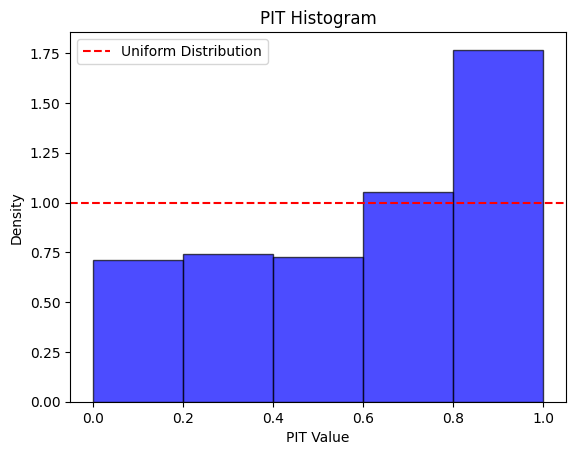

In [ ]:
pit_values = norm.cdf(y_validation, loc=y_val_pred, scale=[y.scale for y in y_val_dists])
plt.hist(pit_values, bins=5, range=(0, 1), density=True, alpha=0.7, color='blue', edgecolor='black')
plt.axhline(1, color='red', linestyle='--', label='Uniform Distribution')
plt.title('PIT Histogram')
plt.xlabel('PIT Value')
plt.ylabel('Density')
plt.legend()
plt.show()

In [21]:
y_train_pred, y_train_dists, y_val_pred, y_val_dists, X_train, y_train, X_validation, y_validation = model_NGBoost("09:00", "max", 500, 0.03, seed=42)

Data loaded and transformed successfully. Shape of DataFrame: (78912, 22)
# of training observations: 2556 | 77.76%
# of validation observations: 365 | 11.10%
# of test observations: 366 | 11.13%
[iter 0] loss=1863.8893 val_loss=2198.2288 scale=512.0000 norm=451.8419
[iter 1] loss=1854.5974 val_loss=2187.5781 scale=512.0000 norm=450.4168
[iter 2] loss=1845.3773 val_loss=2176.9783 scale=512.0000 norm=448.9956
[iter 3] loss=1836.2285 val_loss=2166.5086 scale=512.0000 norm=447.5820
[iter 4] loss=1827.1501 val_loss=2156.0910 scale=512.0000 norm=446.1713
[iter 5] loss=1818.1417 val_loss=2145.7680 scale=512.0000 norm=444.7665
[iter 6] loss=1809.1827 val_loss=2135.5004 scale=512.0000 norm=443.3719
[iter 7] loss=1800.3105 val_loss=2125.3349 scale=512.0000 norm=441.9757
[iter 8] loss=1791.4868 val_loss=2115.2101 scale=512.0000 norm=440.5847
[iter 9] loss=1782.7488 val_loss=2105.2193 scale=512.0000 norm=439.2018
[iter 10] loss=1774.0588 val_loss=2095.3850 scale=512.0000 norm=437.8301
[iter 11] l

In [22]:
y_train_pred, y_train_dists, y_val_pred, y_val_dists, X_train, y_train, X_validation, y_validation = model_NGBoost("09:00", "only_mean_wind", 500, 0.03, seed=42, natural_gradient=False)

Data loaded and transformed successfully. Shape of DataFrame: (78912, 22)
# of training observations: 2556 | 77.76%
# of validation observations: 365 | 11.10%
# of test observations: 366 | 11.13%
[iter 0] loss=1863.8893 val_loss=2196.4493 scale=0.0010 norm=0.5033
[iter 1] loss=1853.4880 val_loss=2183.7663 scale=0.0010 norm=0.4986
[iter 2] loss=1843.1047 val_loss=2170.9662 scale=0.0010 norm=0.4938
[iter 3] loss=1832.7628 val_loss=2158.2632 scale=0.0010 norm=0.4888
[iter 4] loss=1822.4953 val_loss=2145.4220 scale=0.0010 norm=0.4834
[iter 5] loss=1812.3585 val_loss=2139.1259 scale=0.0005 norm=0.2388
[iter 6] loss=1807.3709 val_loss=2132.8651 scale=0.0005 norm=0.2374
[iter 7] loss=1802.4501 val_loss=2126.6310 scale=0.0005 norm=0.2358
[iter 8] loss=1797.5204 val_loss=2120.4824 scale=0.0005 norm=0.2342


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow

[iter 9] loss=1792.6749 val_loss=2114.3998 scale=0.0005 norm=0.2324
[iter 10] loss=1787.9250 val_loss=2108.4052 scale=0.0005 norm=0.2306
[iter 11] loss=1783.2792 val_loss=2102.5066 scale=0.0005 norm=0.2287
[iter 12] loss=1778.8112 val_loss=2096.7465 scale=0.0005 norm=0.2267
[iter 13] loss=1774.3995 val_loss=2091.1402 scale=0.0005 norm=0.2247
[iter 14] loss=1770.1249 val_loss=2085.7176 scale=0.0005 norm=0.2226
[iter 15] loss=1765.9867 val_loss=2080.4440 scale=0.0005 norm=0.2204
[iter 16] loss=1761.9954 val_loss=2075.4143 scale=0.0005 norm=0.2182
[iter 17] loss=1758.1501 val_loss=2070.4568 scale=0.0005 norm=0.2160
[iter 18] loss=1754.4609 val_loss=2065.6762 scale=0.0005 norm=0.2137
[iter 19] loss=1750.9316 val_loss=2061.1944 scale=0.0005 norm=0.2114


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered i

[iter 20] loss=1747.5404 val_loss=2056.8189 scale=0.0005 norm=0.2091
[iter 21] loss=1744.3104 val_loss=2052.7386 scale=0.0005 norm=0.2067
[iter 22] loss=1741.2399 val_loss=2048.6640 scale=0.0005 norm=0.2044
[iter 23] loss=1738.3250 val_loss=2044.8786 scale=0.0005 norm=0.2021
[iter 24] loss=1735.5503 val_loss=2041.3732 scale=0.0005 norm=0.1998
[iter 25] loss=1732.9275 val_loss=2038.0184 scale=0.0005 norm=0.1976
[iter 26] loss=1730.4366 val_loss=2034.7944 scale=0.0005 norm=0.1953
[iter 27] loss=1728.0853 val_loss=2031.7150 scale=0.0005 norm=0.1932
[iter 28] loss=1725.8217 val_loss=2028.8002 scale=0.0005 norm=0.1910
[iter 29] loss=1723.6857 val_loss=2026.0558 scale=0.0005 norm=0.1889
[iter 30] loss=1721.6702 val_loss=2023.2815 scale=0.0005 norm=0.1870
[iter 31] loss=1719.7669 val_loss=2020.8375 scale=0.0005 norm=0.1851


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered i

[iter 32] loss=1717.9684 val_loss=2018.3252 scale=0.0005 norm=0.1833
[iter 33] loss=1716.2703 val_loss=2016.0858 scale=0.0005 norm=0.1816
[iter 34] loss=1714.6522 val_loss=2013.9359 scale=0.0005 norm=0.1799
[iter 35] loss=1713.1231 val_loss=2011.8854 scale=0.0005 norm=0.1783
[iter 36] loss=1711.6675 val_loss=2009.9553 scale=0.0005 norm=0.1768
[iter 37] loss=1710.2917 val_loss=2008.2014 scale=0.0005 norm=0.1754
[iter 38] loss=1708.9878 val_loss=2006.4667 scale=0.0005 norm=0.1740
[iter 39] loss=1707.7524 val_loss=2004.9250 scale=0.0005 norm=0.1727


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered i

[iter 40] loss=1706.5805 val_loss=2001.6414 scale=0.0010 norm=0.3428
[iter 41] loss=1704.3201 val_loss=1998.7108 scale=0.0010 norm=0.3380
[iter 42] loss=1702.2815 val_loss=1995.8727 scale=0.0010 norm=0.3336
[iter 43] loss=1700.4001 val_loss=1993.2729 scale=0.0010 norm=0.3294
[iter 44] loss=1698.6822 val_loss=1991.0699 scale=0.0010 norm=0.3255


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:30: RuntimeWarning: invalid value encountered in multiply
  return self.scale * (
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarnin

[iter 45] loss=1697.1221 val_loss=1989.2841 scale=0.0010 norm=0.3219
[iter 46] loss=1695.6842 val_loss=1987.5509 scale=0.0010 norm=0.3187
[iter 47] loss=1694.3592 val_loss=1985.8065 scale=0.0010 norm=0.3158
[iter 48] loss=1693.1141 val_loss=1984.3358 scale=0.0010 norm=0.3131
[iter 49] loss=1691.9561 val_loss=1982.9757 scale=0.0010 norm=0.3107
[iter 50] loss=1690.8793 val_loss=1981.7035 scale=0.0010 norm=0.3086
[iter 51] loss=1689.8442 val_loss=1980.5704 scale=0.0010 norm=0.3065
[iter 52] loss=1688.8700 val_loss=1979.5252 scale=0.0010 norm=0.3047
[iter 53] loss=1688.0001 val_loss=1978.4928 scale=0.0010 norm=0.3029
[iter 54] loss=1687.1416 val_loss=1976.8133 scale=0.0020 norm=0.6025
[iter 55] loss=1685.5324 val_loss=1976.0885 scale=0.0010 norm=0.2984
[iter 56] loss=1684.8066 val_loss=1975.4151 scale=0.0010 norm=0.2971


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: Runt

[iter 57] loss=1684.0889 val_loss=1973.9552 scale=0.0020 norm=0.5917
[iter 58] loss=1682.7815 val_loss=1972.9530 scale=0.0020 norm=0.5869
[iter 59] loss=1681.6113 val_loss=1972.4431 scale=0.0010 norm=0.2915
[iter 60] loss=1681.0134 val_loss=1971.4945 scale=0.0020 norm=0.5811
[iter 61] loss=1679.9603 val_loss=1971.0394 scale=0.0010 norm=0.2890


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:30: RuntimeWarning: invalid value encountered in multiply
  return self.scale * (
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_conti

[iter 62] loss=1679.4311 val_loss=1970.3262 scale=0.0020 norm=0.5763
[iter 63] loss=1678.4844 val_loss=1969.5108 scale=0.0020 norm=0.5734
[iter 64] loss=1677.5687 val_loss=1968.8442 scale=0.0020 norm=0.5703
[iter 65] loss=1676.7437 val_loss=1968.3181 scale=0.0020 norm=0.5679
[iter 66] loss=1675.9571 val_loss=1968.0603 scale=0.0010 norm=0.2826
[iter 67] loss=1675.5940 val_loss=1967.6105 scale=0.0020 norm=0.5641
[iter 68] loss=1674.8698 val_loss=1967.3012 scale=0.0020 norm=0.5618
[iter 69] loss=1674.2008 val_loss=1967.0414 scale=0.0020 norm=0.5596
[iter 70] loss=1673.5918 val_loss=1966.8453 scale=0.0020 norm=0.5576
[iter 71] loss=1673.0323 val_loss=1966.6692 scale=0.0020 norm=0.5557
[iter 72] loss=1672.5138 val_loss=1966.4410 scale=0.0020 norm=0.5540
[iter 73] loss=1672.0276 val_loss=1966.2607 scale=0.0020 norm=0.5524
[iter 74] loss=1671.5734 val_loss=1966.0916 scale=0.0020 norm=0.5509
[iter 75] loss=1671.1499 val_loss=1965.8568 scale=0.0020 norm=0.5494


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:30: RuntimeWarning: invalid value encountered in multiply
  return self.scale * (
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow en

[iter 76] loss=1670.7309 val_loss=1965.6888 scale=0.0020 norm=0.5481
[iter 77] loss=1670.3431 val_loss=1965.6062 scale=0.0020 norm=0.5469
[iter 78] loss=1669.9926 val_loss=1965.3856 scale=0.0020 norm=0.5457
[iter 79] loss=1669.6423 val_loss=1965.2388 scale=0.0020 norm=0.5446
[iter 80] loss=1669.3140 val_loss=1965.1164 scale=0.0039 norm=1.0873
[iter 81] loss=1668.7079 val_loss=1965.1361 scale=0.0020 norm=0.5418
[iter 82] loss=1668.4463 val_loss=1965.0789 scale=0.0020 norm=0.5409
[iter 83] loss=1668.1922 val_loss=1964.9802 scale=0.0020 norm=0.5399
[iter 84] loss=1667.9522 val_loss=1964.6930 scale=0.0039 norm=1.0784


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:30: RuntimeWarning: i

[iter 85] loss=1667.5091 val_loss=1964.7780 scale=0.0020 norm=0.5379
[iter 86] loss=1667.3061 val_loss=1964.5280 scale=0.0010 norm=0.2686
[iter 87] loss=1667.1447 val_loss=1964.5546 scale=0.0020 norm=0.5365
[iter 88] loss=1666.9645 val_loss=1964.3538 scale=0.0010 norm=0.2679
[iter 89] loss=1666.8210 val_loss=1964.1260 scale=0.0010 norm=0.2676


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:30: RuntimeWarning: invalid value encountered in multiply
  return self.scale * (
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encounter

[iter 90] loss=1666.6869 val_loss=1963.9416 scale=0.0010 norm=0.2674
[iter 91] loss=1666.5535 val_loss=1963.9301 scale=0.0020 norm=0.5342
[iter 92] loss=1666.3846 val_loss=1963.8791 scale=0.0010 norm=0.2668
[iter 93] loss=1666.2798 val_loss=1963.6740 scale=0.0010 norm=0.2666
[iter 94] loss=1666.1609 val_loss=1963.5543 scale=0.0005 norm=0.1332


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divid

[iter 95] loss=1666.1003 val_loss=1963.5126 scale=0.0020 norm=0.5322
[iter 96] loss=1665.9610 val_loss=1963.4078 scale=0.0020 norm=0.5316
[iter 97] loss=1665.7908 val_loss=1963.3767 scale=0.0020 norm=0.5311
[iter 98] loss=1665.6258 val_loss=1963.3985 scale=0.0039 norm=1.0614
[iter 99] loss=1665.3177 val_loss=1963.3471 scale=0.0020 norm=0.5297
[iter 100] loss=1665.1792 val_loss=1963.3000 scale=0.0020 norm=0.5293
[iter 101] loss=1665.0529 val_loss=1963.3333 scale=0.0005 norm=0.1322
[iter 102] loss=1665.0061 val_loss=1963.2185 scale=0.0005 norm=0.1321
[iter 103] loss=1664.9547 val_loss=1963.1177 scale=0.0010 norm=0.2641
[iter 104] loss=1664.8961 val_loss=1963.1856 scale=0.0005 norm=0.1320
[iter 105] loss=1664.8140 val_loss=1963.2029 scale=0.0020 norm=0.5277
[iter 106] loss=1664.6816 val_loss=1963.1125 scale=0.0039 norm=1.0544
[iter 107] loss=1664.4438 val_loss=1963.1452 scale=0.0005 norm=0.1316
[iter 108] loss=1664.4022 val_loss=1963.0427 scale=0.0005 norm=0.1315
[iter 109] loss=1664.3576

c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:30: RuntimeWarning: invalid value encountered in multiply
  return self.scale * (
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow

[iter 110] loss=1664.2576 val_loss=1962.8438 scale=0.0020 norm=0.5254
[iter 111] loss=1664.1285 val_loss=1962.8444 scale=0.0020 norm=0.5249
[iter 112] loss=1664.0193 val_loss=1962.8529 scale=0.0005 norm=0.1311
[iter 113] loss=1663.9825 val_loss=1962.9256 scale=0.0005 norm=0.1311
[iter 114] loss=1663.9070 val_loss=1962.8860 scale=0.0020 norm=0.5239
[iter 115] loss=1663.7886 val_loss=1962.8875 scale=0.0020 norm=0.5234
[iter 116] loss=1663.6943 val_loss=1962.7937 scale=0.0005 norm=0.1308


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in di

[iter 117] loss=1663.6559 val_loss=1962.8876 scale=0.0005 norm=0.1307
[iter 118] loss=1663.5854 val_loss=1962.8728 scale=0.0020 norm=0.5226
[iter 119] loss=1663.4742 val_loss=1962.8620 scale=0.0020 norm=0.5221
[iter 120] loss=1663.3714 val_loss=1962.8262 scale=0.0020 norm=0.5217
[iter 121] loss=1663.2621 val_loss=1962.8335 scale=0.0005 norm=0.1303
[iter 122] loss=1663.2294 val_loss=1962.8269 scale=0.0020 norm=0.5209
[iter 123] loss=1663.1265 val_loss=1962.9059 scale=0.0005 norm=0.1301


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in di

[iter 124] loss=1663.0600 val_loss=1962.8670 scale=0.0002 norm=0.0650
[iter 125] loss=1663.0427 val_loss=1962.8832 scale=0.0005 norm=0.1300
[iter 126] loss=1662.9949 val_loss=1962.9520 scale=0.0010 norm=0.2599
[iter 127] loss=1662.8720 val_loss=1962.9686 scale=0.0005 norm=0.1298
[iter 128] loss=1662.8277 val_loss=1962.9846 scale=0.0005 norm=0.1297
[iter 129] loss=1662.7863 val_loss=1963.0001 scale=0.0005 norm=0.1296
[iter 130] loss=1662.7476 val_loss=1963.0916 scale=0.0005 norm=0.1296


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scal

[iter 131] loss=1662.6917 val_loss=1963.1007 scale=0.0005 norm=0.1295
[iter 132] loss=1662.6601 val_loss=1963.1161 scale=0.0005 norm=0.1295
[iter 133] loss=1662.6241 val_loss=1963.0408 scale=0.0010 norm=0.2588
[iter 134] loss=1662.4972 val_loss=1963.0679 scale=0.0005 norm=0.1293
[iter 135] loss=1662.4682 val_loss=1963.1322 scale=0.0010 norm=0.2585
[iter 136] loss=1662.3570 val_loss=1963.1202 scale=0.0010 norm=0.2582
[iter 137] loss=1662.3023 val_loss=1963.1370 scale=0.0005 norm=0.1291


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: over

[iter 138] loss=1662.2690 val_loss=1963.1818 scale=0.0005 norm=0.1290
[iter 139] loss=1662.2250 val_loss=1963.0757 scale=0.0010 norm=0.2578
[iter 140] loss=1662.1492 val_loss=1963.1783 scale=0.0020 norm=0.5155
[iter 141] loss=1662.0542 val_loss=1963.2320 scale=0.0010 norm=0.2575
[iter 142] loss=1661.9791 val_loss=1963.2472 scale=0.0005 norm=0.1287
[iter 143] loss=1661.9481 val_loss=1963.2698 scale=0.0005 norm=0.1286


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  se

[iter 144] loss=1661.9223 val_loss=1963.2102 scale=0.0010 norm=0.2572
[iter 145] loss=1661.8415 val_loss=1963.1172 scale=0.0005 norm=0.1286
[iter 146] loss=1661.7966 val_loss=1963.0545 scale=0.0005 norm=0.1285
[iter 147] loss=1661.7588 val_loss=1963.0672 scale=0.0010 norm=0.2568
[iter 148] loss=1661.6928 val_loss=1963.0305 scale=0.0010 norm=0.2566
[iter 149] loss=1661.6228 val_loss=1963.0244 scale=0.0010 norm=0.2565
[iter 150] loss=1661.5868 val_loss=1963.0030 scale=0.0020 norm=0.5129


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:30: RuntimeWarning: invalid value encountered in multiply
  return self.scale * (
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encounter

[iter 151] loss=1661.4866 val_loss=1962.9783 scale=0.0020 norm=0.5125
[iter 152] loss=1661.4147 val_loss=1962.9686 scale=0.0039 norm=1.0243
[iter 153] loss=1661.2304 val_loss=1962.9590 scale=0.0020 norm=0.5113
[iter 154] loss=1661.1493 val_loss=1963.0121 scale=0.0010 norm=0.2555
[iter 155] loss=1661.1275 val_loss=1963.0503 scale=0.0010 norm=0.2554
[iter 156] loss=1661.0921 val_loss=1963.0413 scale=0.0020 norm=0.5108
[iter 157] loss=1661.0616 val_loss=1963.0256 scale=0.0020 norm=0.5107


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: o

[iter 158] loss=1660.9869 val_loss=1963.0083 scale=0.0005 norm=0.1276
[iter 159] loss=1660.9618 val_loss=1962.9734 scale=0.0005 norm=0.1276
[iter 160] loss=1660.9382 val_loss=1962.8927 scale=0.0010 norm=0.2550
[iter 161] loss=1660.8774 val_loss=1962.9794 scale=0.0039 norm=1.0198
[iter 162] loss=1660.7208 val_loss=1962.9640 scale=0.0020 norm=0.5092
[iter 163] loss=1660.6410 val_loss=1962.9470 scale=0.0005 norm=0.1272
[iter 164] loss=1660.6190 val_loss=1962.9438 scale=0.0005 norm=0.1272


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:30: RuntimeWarning: invalid value encountered in multiply
  return self.scale * (
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero enc

[iter 165] loss=1660.5855 val_loss=1962.9262 scale=0.0010 norm=0.2543
[iter 166] loss=1660.5659 val_loss=1962.9109 scale=0.0020 norm=0.5084
[iter 167] loss=1660.5402 val_loss=1963.0037 scale=0.0039 norm=1.0165
[iter 168] loss=1660.3968 val_loss=1962.9468 scale=0.0005 norm=0.1269
[iter 169] loss=1660.3429 val_loss=1963.0319 scale=0.0039 norm=1.0142
[iter 170] loss=1660.2228 val_loss=1962.9590 scale=0.0005 norm=0.1266


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: overflow encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWar

[iter 171] loss=1660.1732 val_loss=1962.9468 scale=0.0005 norm=0.1266
[iter 172] loss=1660.1497 val_loss=1962.9791 scale=0.0010 norm=0.2531
[iter 173] loss=1660.1200 val_loss=1963.0752 scale=0.0020 norm=0.5061
[iter 174] loss=1660.0606 val_loss=1963.0237 scale=0.0010 norm=0.2529
[iter 175] loss=1660.0428 val_loss=1963.0076 scale=0.0010 norm=0.2528
[iter 176] loss=1660.0268 val_loss=1963.0282 scale=0.0005 norm=0.1264
[iter 177] loss=1660.0183 val_loss=1963.0577 scale=0.0010 norm=0.2528


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: Run

[iter 178] loss=1659.9909 val_loss=1963.1085 scale=0.0020 norm=0.5055
[iter 179] loss=1659.9376 val_loss=1963.1290 scale=0.0005 norm=0.1263
[iter 180] loss=1659.9205 val_loss=1963.1212 scale=0.0010 norm=0.2525
[iter 181] loss=1659.9039 val_loss=1963.2341 scale=0.0039 norm=1.0098
[iter 182] loss=1659.8374 val_loss=1963.2368 scale=0.0005 norm=0.1261
[iter 183] loss=1659.8086 val_loss=1963.2797 scale=0.0010 norm=0.2522
[iter 184] loss=1659.7876 val_loss=1963.2776 scale=0.0005 norm=0.1260


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:30: RuntimeWarning: invalid value encountered in multiply
  return self.scale * (
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflo

[iter 185] loss=1659.7686 val_loss=1963.3283 scale=0.0005 norm=0.1260
[iter 186] loss=1659.7278 val_loss=1963.2938 scale=0.0010 norm=0.2518
[iter 187] loss=1659.7141 val_loss=1963.2519 scale=0.0010 norm=0.2518
[iter 188] loss=1659.6097 val_loss=1963.3259 scale=0.0005 norm=0.1258
[iter 189] loss=1659.5780 val_loss=1963.2782 scale=0.0020 norm=0.5029


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  se

[iter 190] loss=1659.5382 val_loss=1963.3194 scale=0.0020 norm=0.5026
[iter 191] loss=1659.4877 val_loss=1963.3040 scale=0.0020 norm=0.5023
[iter 192] loss=1659.4218 val_loss=1963.3132 scale=0.0005 norm=0.1255
[iter 193] loss=1659.4165 val_loss=1963.2741 scale=0.0010 norm=0.2510
[iter 194] loss=1659.3239 val_loss=1963.2840 scale=0.0005 norm=0.1254
[iter 195] loss=1659.3194 val_loss=1963.3027 scale=0.0005 norm=0.1254
[iter 196] loss=1659.3063 val_loss=1963.2532 scale=0.0010 norm=0.2508


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encou

[iter 197] loss=1659.2772 val_loss=1963.2778 scale=0.0005 norm=0.1254
[iter 198] loss=1659.2731 val_loss=1963.2886 scale=0.0005 norm=0.1253
[iter 199] loss=1659.2692 val_loss=1963.3000 scale=0.0005 norm=0.1253
[iter 200] loss=1659.2656 val_loss=1963.3314 scale=0.0020 norm=0.5013
[iter 201] loss=1659.2514 val_loss=1963.2999 scale=0.0002 norm=0.0627
[iter 202] loss=1659.2384 val_loss=1963.3115 scale=0.0005 norm=0.1253
[iter 203] loss=1659.2351 val_loss=1963.2787 scale=0.0020 norm=0.5011
[iter 204] loss=1659.1789 val_loss=1963.2485 scale=0.0010 norm=0.2504
[iter 205] loss=1659.1128 val_loss=1963.2323 scale=0.0010 norm=0.2504
[iter 206] loss=1659.0281 val_loss=1963.2270 scale=0.0010 norm=0.2502
[iter 207] loss=1658.9535 val_loss=1963.2757 scale=0.0005 norm=0.1251


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide b

[iter 208] loss=1658.9191 val_loss=1963.2695 scale=0.0005 norm=0.1250
[iter 209] loss=1658.8737 val_loss=1963.2639 scale=0.0005 norm=0.1249
[iter 210] loss=1658.8562 val_loss=1963.2584 scale=0.0010 norm=0.2498
[iter 211] loss=1658.7766 val_loss=1963.2017 scale=0.0005 norm=0.1248
[iter 212] loss=1658.7378 val_loss=1963.1595 scale=0.0002 norm=0.0624
[iter 213] loss=1658.7247 val_loss=1963.1508 scale=0.0005 norm=0.1247


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:30: RuntimeWarning: invalid value encountered in multiply
  return self.scale * (
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: overflow encounter

[iter 214] loss=1658.7217 val_loss=1963.1749 scale=0.0005 norm=0.1247
[iter 215] loss=1658.7189 val_loss=1963.1567 scale=0.0005 norm=0.1247
[iter 216] loss=1658.7065 val_loss=1963.1763 scale=0.0005 norm=0.1247
[iter 217] loss=1658.6615 val_loss=1963.1186 scale=0.0020 norm=0.4984
[iter 218] loss=1658.6137 val_loss=1963.1024 scale=0.0005 norm=0.1245
[iter 219] loss=1658.5712 val_loss=1963.0779 scale=0.0020 norm=0.4978
[iter 220] loss=1658.5129 val_loss=1963.0553 scale=0.0010 norm=0.2488
[iter 221] loss=1658.5003 val_loss=1963.0638 scale=0.0005 norm=0.1244


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: Run

[iter 222] loss=1658.4752 val_loss=1963.0723 scale=0.0010 norm=0.2486
[iter 223] loss=1658.4699 val_loss=1963.0722 scale=0.0020 norm=0.4972
[iter 224] loss=1658.4286 val_loss=1963.0279 scale=0.0005 norm=0.1243
[iter 225] loss=1658.4128 val_loss=1963.0472 scale=0.0020 norm=0.4970
[iter 226] loss=1658.3964 val_loss=1963.0684 scale=0.0005 norm=0.1242
[iter 227] loss=1658.3544 val_loss=1963.0314 scale=0.0005 norm=0.1242


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:30: RuntimeWarning: invalid value encountered in multiply
  return self.scale * (
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: Run

[iter 228] loss=1658.3333 val_loss=1963.0615 scale=0.0020 norm=0.4965
[iter 229] loss=1658.2807 val_loss=1963.0647 scale=0.0010 norm=0.2481
[iter 230] loss=1658.2759 val_loss=1963.0671 scale=0.0020 norm=0.4961
[iter 231] loss=1658.2271 val_loss=1963.0650 scale=0.0010 norm=0.2480
[iter 232] loss=1658.1552 val_loss=1963.0605 scale=0.0005 norm=0.1239
[iter 233] loss=1658.1139 val_loss=1962.9885 scale=0.0005 norm=0.1239


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow enc

[iter 234] loss=1658.0824 val_loss=1963.0095 scale=0.0005 norm=0.1238
[iter 235] loss=1658.0430 val_loss=1963.0595 scale=0.0020 norm=0.4948
[iter 236] loss=1657.9947 val_loss=1963.0607 scale=0.0010 norm=0.2473
[iter 237] loss=1657.9332 val_loss=1963.0703 scale=0.0010 norm=0.2472
[iter 238] loss=1657.9287 val_loss=1963.0645 scale=0.0010 norm=0.2472
[iter 239] loss=1657.9054 val_loss=1963.0380 scale=0.0005 norm=0.1236
[iter 240] loss=1657.8667 val_loss=1963.0597 scale=0.0020 norm=0.4940
[iter 241] loss=1657.8261 val_loss=1963.0551 scale=0.0005 norm=0.1234


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C


[iter 242] loss=1657.7897 val_loss=1963.0235 scale=0.0005 norm=0.1234
[iter 243] loss=1657.7623 val_loss=1963.0284 scale=0.0020 norm=0.4932
[iter 244] loss=1657.7245 val_loss=1963.0000 scale=0.0005 norm=0.1232
[iter 245] loss=1657.6989 val_loss=1963.0534 scale=0.0020 norm=0.4927
[iter 246] loss=1657.6548 val_loss=1963.0852 scale=0.0010 norm=0.2462
[iter 247] loss=1657.6505 val_loss=1963.0726 scale=0.0010 norm=0.2462
[iter 248] loss=1657.6456 val_loss=1963.1185 scale=0.0005 norm=0.1231
[iter 249] loss=1657.6218 val_loss=1963.1132 scale=0.0020 norm=0.4922
[iter 250] loss=1657.5770 val_loss=1963.0768 scale=0.0002 norm=0.0615
[iter 251] loss=1657.5654 val_loss=1963.0352 scale=0.0005 norm=0.1230
[iter 252] loss=1657.5419 val_loss=1963.1360 scale=0.0020 norm=0.4918
[iter 253] loss=1657.5340 val_loss=1963.1091 scale=0.0005 norm=0.1229


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: overflow encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encounter

[iter 254] loss=1657.5080 val_loss=1963.0795 scale=0.0005 norm=0.1229
[iter 255] loss=1657.4981 val_loss=1963.0602 scale=0.0005 norm=0.1229
[iter 256] loss=1657.4706 val_loss=1963.0435 scale=0.0010 norm=0.2456
[iter 257] loss=1657.4645 val_loss=1963.1112 scale=0.0020 norm=0.4911
[iter 258] loss=1657.4210 val_loss=1963.1284 scale=0.0010 norm=0.2454
[iter 259] loss=1657.4172 val_loss=1963.1281 scale=0.0010 norm=0.2454


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
 

[iter 260] loss=1657.4073 val_loss=1963.1100 scale=0.0020 norm=0.4908
[iter 261] loss=1657.3694 val_loss=1963.1884 scale=0.0005 norm=0.1227
[iter 262] loss=1657.3428 val_loss=1963.1864 scale=0.0010 norm=0.2452
[iter 263] loss=1657.3242 val_loss=1963.1546 scale=0.0010 norm=0.2452
[iter 264] loss=1657.3061 val_loss=1963.1984 scale=0.0020 norm=0.4903
[iter 265] loss=1657.2673 val_loss=1963.2558 scale=0.0010 norm=0.2450
[iter 266] loss=1657.2006 val_loss=1963.2198 scale=0.0010 norm=0.2449
[iter 267] loss=1657.1269 val_loss=1963.2363 scale=0.0020 norm=0.4896
[iter 268] loss=1657.1201 val_loss=1963.2301 scale=0.0005 norm=0.1224


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: Run

[iter 269] loss=1657.0968 val_loss=1963.2769 scale=0.0020 norm=0.4895
[iter 270] loss=1657.0583 val_loss=1963.2080 scale=0.0010 norm=0.2447
[iter 271] loss=1657.0416 val_loss=1963.1923 scale=0.0005 norm=0.1223
[iter 272] loss=1657.0184 val_loss=1963.1610 scale=0.0020 norm=0.4891
[iter 273] loss=1656.9803 val_loss=1963.1010 scale=0.0010 norm=0.2444
[iter 274] loss=1656.9042 val_loss=1962.9513 scale=0.0010 norm=0.2442
[iter 275] loss=1656.8294 val_loss=1963.0290 scale=0.0020 norm=0.4882


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  se

[iter 276] loss=1656.7907 val_loss=1962.9980 scale=0.0005 norm=0.1220
[iter 277] loss=1656.7688 val_loss=1962.9976 scale=0.0002 norm=0.0610
[iter 278] loss=1656.7625 val_loss=1963.0260 scale=0.0005 norm=0.1219
[iter 279] loss=1656.7531 val_loss=1963.0227 scale=0.0002 norm=0.0609
[iter 280] loss=1656.7456 val_loss=1963.0488 scale=0.0020 norm=0.4874
[iter 281] loss=1656.7035 val_loss=1963.0601 scale=0.0005 norm=0.1218
[iter 282] loss=1656.6733 val_loss=1963.0432 scale=0.0005 norm=0.1217


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
 

[iter 283] loss=1656.6507 val_loss=1963.0274 scale=0.0002 norm=0.0608
[iter 284] loss=1656.6409 val_loss=1963.0152 scale=0.0002 norm=0.0608
[iter 285] loss=1656.6339 val_loss=1963.0612 scale=0.0005 norm=0.1216
[iter 286] loss=1656.6131 val_loss=1962.9193 scale=0.0010 norm=0.2431
[iter 287] loss=1656.5443 val_loss=1962.9273 scale=0.0010 norm=0.2430
[iter 288] loss=1656.5213 val_loss=1962.9643 scale=0.0005 norm=0.1215


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C


[iter 289] loss=1656.4870 val_loss=1962.9981 scale=0.0010 norm=0.2429
[iter 290] loss=1656.4665 val_loss=1962.9972 scale=0.0010 norm=0.2428
[iter 291] loss=1656.4578 val_loss=1963.0261 scale=0.0020 norm=0.4856
[iter 292] loss=1656.4183 val_loss=1963.1248 scale=0.0010 norm=0.2427
[iter 293] loss=1656.3580 val_loss=1963.0402 scale=0.0005 norm=0.1213
[iter 294] loss=1656.3127 val_loss=1962.9950 scale=0.0005 norm=0.1213


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:30: RuntimeWarning: invalid value encountered in multiply
  return self.scale * (
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero enc

[iter 295] loss=1656.2746 val_loss=1962.9784 scale=0.0005 norm=0.1212
[iter 296] loss=1656.2524 val_loss=1962.9967 scale=0.0005 norm=0.1212
[iter 297] loss=1656.2509 val_loss=1962.9956 scale=0.0010 norm=0.2423
[iter 298] loss=1656.2428 val_loss=1962.9840 scale=0.0020 norm=0.4846
[iter 299] loss=1656.1890 val_loss=1962.9427 scale=0.0020 norm=0.4843
[iter 300] loss=1656.1451 val_loss=1962.9088 scale=0.0005 norm=0.1210
[iter 301] loss=1656.1269 val_loss=1962.8616 scale=0.0010 norm=0.2420
[iter 302] loss=1656.0673 val_loss=1962.8324 scale=0.0010 norm=0.2418


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: overflow encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: over

[iter 303] loss=1656.0124 val_loss=1962.8769 scale=0.0005 norm=0.1209
[iter 304] loss=1655.9935 val_loss=1962.7533 scale=0.0010 norm=0.2416
[iter 305] loss=1655.9360 val_loss=1962.8698 scale=0.0020 norm=0.4831
[iter 306] loss=1655.9302 val_loss=1962.9102 scale=0.0020 norm=0.4830
[iter 307] loss=1655.8867 val_loss=1962.8349 scale=0.0005 norm=0.1207
[iter 308] loss=1655.8476 val_loss=1962.8187 scale=0.0005 norm=0.1206


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:30: RuntimeWarning: invalid value encountered in multiply
  return self.scale * (
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encounter

[iter 309] loss=1655.8351 val_loss=1962.7934 scale=0.0005 norm=0.1206
[iter 310] loss=1655.8129 val_loss=1962.8123 scale=0.0005 norm=0.1205
[iter 311] loss=1655.8115 val_loss=1962.8925 scale=0.0020 norm=0.4821
[iter 312] loss=1655.8064 val_loss=1962.8789 scale=0.0005 norm=0.1205
[iter 313] loss=1655.7977 val_loss=1962.8088 scale=0.0005 norm=0.1205
[iter 314] loss=1655.7612 val_loss=1962.7862 scale=0.0005 norm=0.1204


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: overflow encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:30: RuntimeWarning: invalid value e

[iter 315] loss=1655.7415 val_loss=1962.7835 scale=0.0005 norm=0.1204
[iter 316] loss=1655.7216 val_loss=1962.7824 scale=0.0010 norm=0.2407
[iter 317] loss=1655.7101 val_loss=1962.7642 scale=0.0020 norm=0.4813
[iter 318] loss=1655.6613 val_loss=1962.6473 scale=0.0010 norm=0.2405
[iter 319] loss=1655.6061 val_loss=1962.6111 scale=0.0010 norm=0.2404
[iter 320] loss=1655.5586 val_loss=1962.6698 scale=0.0020 norm=0.4806
[iter 321] loss=1655.5431 val_loss=1962.6323 scale=0.0005 norm=0.1201


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow

[iter 322] loss=1655.5252 val_loss=1962.6756 scale=0.0020 norm=0.4803
[iter 323] loss=1655.4976 val_loss=1962.6093 scale=0.0005 norm=0.1200
[iter 324] loss=1655.4636 val_loss=1962.5958 scale=0.0005 norm=0.1200
[iter 325] loss=1655.4531 val_loss=1962.6037 scale=0.0005 norm=0.1199
[iter 326] loss=1655.4417 val_loss=1962.5641 scale=0.0005 norm=0.1199
[iter 327] loss=1655.4070 val_loss=1962.5610 scale=0.0005 norm=0.1199


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:30: RuntimeWarning: invalid value encountered in multiply
  return self.scale * (
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow

[iter 328] loss=1655.3945 val_loss=1962.5434 scale=0.0002 norm=0.0599
[iter 329] loss=1655.3878 val_loss=1962.5638 scale=0.0020 norm=0.4792
[iter 330] loss=1655.3688 val_loss=1962.5472 scale=0.0002 norm=0.0599
[iter 331] loss=1655.3625 val_loss=1962.5038 scale=0.0010 norm=0.2395
[iter 332] loss=1655.3298 val_loss=1962.4976 scale=0.0005 norm=0.1197
[iter 333] loss=1655.3204 val_loss=1962.4818 scale=0.0002 norm=0.0598


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow

[iter 334] loss=1655.3144 val_loss=1962.5115 scale=0.0005 norm=0.1197
[iter 335] loss=1655.3131 val_loss=1962.4954 scale=0.0005 norm=0.1197
[iter 336] loss=1655.2980 val_loss=1962.4929 scale=0.0005 norm=0.1196
[iter 337] loss=1655.2796 val_loss=1962.4762 scale=0.0005 norm=0.1196
[iter 338] loss=1655.2748 val_loss=1962.4828 scale=0.0010 norm=0.2391
[iter 339] loss=1655.2652 val_loss=1962.4881 scale=0.0010 norm=0.2391
[iter 340] loss=1655.2605 val_loss=1962.5196 scale=0.0020 norm=0.4781


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by z

[iter 341] loss=1655.2276 val_loss=1962.6003 scale=0.0010 norm=0.2390
[iter 342] loss=1655.1709 val_loss=1962.6942 scale=0.0010 norm=0.2388
[iter 343] loss=1655.1012 val_loss=1962.7252 scale=0.0010 norm=0.2386
[iter 344] loss=1655.0483 val_loss=1962.7451 scale=0.0005 norm=0.1193
[iter 345] loss=1655.0430 val_loss=1962.7469 scale=0.0005 norm=0.1192


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: overflow encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:30: RuntimeWarning: invalid value encountered in multiply
  return self.scale * (
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: over

[iter 346] loss=1655.0173 val_loss=1962.6304 scale=0.0010 norm=0.2384
[iter 347] loss=1654.9668 val_loss=1962.7159 scale=0.0020 norm=0.4766
[iter 348] loss=1654.9623 val_loss=1962.7256 scale=0.0010 norm=0.2383
[iter 349] loss=1654.9593 val_loss=1962.6892 scale=0.0005 norm=0.1191
[iter 350] loss=1654.9288 val_loss=1962.6714 scale=0.0005 norm=0.1191
[iter 351] loss=1654.9049 val_loss=1962.6509 scale=0.0005 norm=0.1191
[iter 352] loss=1654.8861 val_loss=1962.6135 scale=0.0020 norm=0.4760


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow en

[iter 353] loss=1654.8392 val_loss=1962.5894 scale=0.0010 norm=0.2379
[iter 354] loss=1654.7938 val_loss=1962.5452 scale=0.0005 norm=0.1189
[iter 355] loss=1654.7787 val_loss=1962.5378 scale=0.0010 norm=0.2378
[iter 356] loss=1654.7362 val_loss=1962.5602 scale=0.0005 norm=0.1188
[iter 357] loss=1654.7259 val_loss=1962.5643 scale=0.0010 norm=0.2376
[iter 358] loss=1654.7207 val_loss=1962.5259 scale=0.0010 norm=0.2376


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow enc

[iter 359] loss=1654.6939 val_loss=1962.4709 scale=0.0010 norm=0.2375
[iter 360] loss=1654.6410 val_loss=1962.4455 scale=0.0020 norm=0.4747
[iter 361] loss=1654.6023 val_loss=1962.4089 scale=0.0010 norm=0.2373
[iter 362] loss=1654.5591 val_loss=1962.3827 scale=0.0010 norm=0.2372
[iter 363] loss=1654.5122 val_loss=1962.3825 scale=0.0010 norm=0.2371
[iter 364] loss=1654.4728 val_loss=1962.3870 scale=0.0005 norm=0.1185


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C


[iter 365] loss=1654.4554 val_loss=1962.3348 scale=0.0010 norm=0.2369
[iter 366] loss=1654.4127 val_loss=1962.3099 scale=0.0020 norm=0.4735
[iter 367] loss=1654.3604 val_loss=1962.2731 scale=0.0010 norm=0.2367
[iter 368] loss=1654.3320 val_loss=1962.2607 scale=0.0020 norm=0.4733
[iter 369] loss=1654.2895 val_loss=1962.2364 scale=0.0010 norm=0.2366


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow

[iter 370] loss=1654.2383 val_loss=1962.2097 scale=0.0010 norm=0.2364
[iter 371] loss=1654.1920 val_loss=1962.2659 scale=0.0010 norm=0.2363
[iter 372] loss=1654.1370 val_loss=1962.2840 scale=0.0005 norm=0.1181
[iter 373] loss=1654.1211 val_loss=1962.2438 scale=0.0005 norm=0.1181
[iter 374] loss=1654.0961 val_loss=1962.2409 scale=0.0010 norm=0.2360
[iter 375] loss=1654.0859 val_loss=1962.1978 scale=0.0010 norm=0.2360


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C


[iter 376] loss=1654.0485 val_loss=1962.0842 scale=0.0010 norm=0.2359
[iter 377] loss=1654.0023 val_loss=1962.0339 scale=0.0039 norm=0.9431
[iter 378] loss=1653.9326 val_loss=1962.0469 scale=0.0010 norm=0.2356
[iter 379] loss=1653.8944 val_loss=1961.9331 scale=0.0010 norm=0.2356
[iter 380] loss=1653.8527 val_loss=1961.9899 scale=0.0010 norm=0.2355
[iter 381] loss=1653.8027 val_loss=1961.9497 scale=0.0010 norm=0.2354


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x

[iter 382] loss=1653.7808 val_loss=1961.9569 scale=0.0010 norm=0.2352
[iter 383] loss=1653.7720 val_loss=1961.9896 scale=0.0005 norm=0.1176
[iter 384] loss=1653.7634 val_loss=1962.0445 scale=0.0010 norm=0.2352
[iter 385] loss=1653.7183 val_loss=1962.0620 scale=0.0005 norm=0.1175
[iter 386] loss=1653.7138 val_loss=1962.0443 scale=0.0005 norm=0.1175
[iter 387] loss=1653.6974 val_loss=1962.0428 scale=0.0020 norm=0.4699
[iter 388] loss=1653.6718 val_loss=1962.0491 scale=0.0010 norm=0.2349
[iter 389] loss=1653.6639 val_loss=1962.0692 scale=0.0005 norm=0.1174
[iter 390] loss=1653.6597 val_loss=1962.0983 scale=0.0010 norm=0.2348
[iter 391] loss=1653.6577 val_loss=1962.0813 scale=0.0010 norm=0.2348
[iter 392] loss=1653.6234 val_loss=1962.0876 scale=0.0010 norm=0.2347
[iter 393] loss=1653.6150 val_loss=1962.0120 scale=0.0020 norm=0.4693
[iter 394] loss=1653.5416 val_loss=1962.0028 scale=0.0005 norm=0.1173
[iter 395] loss=1653.5210 val_loss=1961.9694 scale=0.0020 norm=0.4688


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: overflow encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C


[iter 396] loss=1653.4889 val_loss=1961.9690 scale=0.0010 norm=0.2343
[iter 397] loss=1653.4311 val_loss=1961.9621 scale=0.0010 norm=0.2342
[iter 398] loss=1653.3882 val_loss=1961.9555 scale=0.0010 norm=0.2340
[iter 399] loss=1653.3485 val_loss=1962.0101 scale=0.0010 norm=0.2339
[iter 400] loss=1653.3076 val_loss=1962.0474 scale=0.0010 norm=0.2338


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered i

[iter 401] loss=1653.2767 val_loss=1962.0237 scale=0.0005 norm=0.1169
[iter 402] loss=1653.2573 val_loss=1962.0188 scale=0.0005 norm=0.1168
[iter 403] loss=1653.2416 val_loss=1962.0353 scale=0.0020 norm=0.4672
[iter 404] loss=1653.2244 val_loss=1962.0006 scale=0.0005 norm=0.1168
[iter 405] loss=1653.2034 val_loss=1962.0245 scale=0.0020 norm=0.4668
[iter 406] loss=1653.1820 val_loss=1962.0044 scale=0.0005 norm=0.1167
[iter 407] loss=1653.1647 val_loss=1961.9931 scale=0.0005 norm=0.1166
[iter 408] loss=1653.1529 val_loss=1962.0245 scale=0.0005 norm=0.1166


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  se

[iter 409] loss=1653.1449 val_loss=1962.0299 scale=0.0010 norm=0.2332
[iter 410] loss=1653.1370 val_loss=1962.0170 scale=0.0005 norm=0.1166
[iter 411] loss=1653.1209 val_loss=1962.0478 scale=0.0005 norm=0.1165
[iter 412] loss=1653.1134 val_loss=1962.0445 scale=0.0010 norm=0.2331
[iter 413] loss=1653.1075 val_loss=1962.0494 scale=0.0010 norm=0.2330
[iter 414] loss=1653.1001 val_loss=1962.0543 scale=0.0005 norm=0.1165
[iter 415] loss=1653.0846 val_loss=1962.0657 scale=0.0005 norm=0.1165


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in squa

[iter 416] loss=1653.0717 val_loss=1962.0597 scale=0.0005 norm=0.1165
[iter 417] loss=1653.0601 val_loss=1962.0535 scale=0.0005 norm=0.1164
[iter 418] loss=1653.0493 val_loss=1962.0180 scale=0.0005 norm=0.1164
[iter 419] loss=1653.0312 val_loss=1962.0249 scale=0.0005 norm=0.1164
[iter 420] loss=1653.0184 val_loss=1962.0549 scale=0.0005 norm=0.1163


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered i

[iter 421] loss=1653.0114 val_loss=1962.0792 scale=0.0005 norm=0.1163
[iter 422] loss=1652.9923 val_loss=1962.0843 scale=0.0005 norm=0.1163
[iter 423] loss=1652.9741 val_loss=1962.0923 scale=0.0010 norm=0.2325
[iter 424] loss=1652.9474 val_loss=1962.1420 scale=0.0005 norm=0.1162
[iter 425] loss=1652.9276 val_loss=1962.1639 scale=0.0005 norm=0.1162
[iter 426] loss=1652.9108 val_loss=1962.1842 scale=0.0005 norm=0.1162
[iter 427] loss=1652.8946 val_loss=1962.1911 scale=0.0010 norm=0.2323


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:30: RuntimeWarning: invalid value encountered in multiply
  return self.scale * (
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow en

[iter 428] loss=1652.8701 val_loss=1962.2220 scale=0.0005 norm=0.1161
[iter 429] loss=1652.8525 val_loss=1962.2253 scale=0.0005 norm=0.1161
[iter 430] loss=1652.8375 val_loss=1962.2286 scale=0.0005 norm=0.1161
[iter 431] loss=1652.8231 val_loss=1962.2340 scale=0.0010 norm=0.2321
[iter 432] loss=1652.8018 val_loss=1962.2354 scale=0.0005 norm=0.1160
[iter 433] loss=1652.7897 val_loss=1962.2580 scale=0.0005 norm=0.1160
[iter 434] loss=1652.7739 val_loss=1962.2983 scale=0.0005 norm=0.1160
[iter 435] loss=1652.7559 val_loss=1962.3378 scale=0.0005 norm=0.1159


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow

[iter 436] loss=1652.7386 val_loss=1962.3682 scale=0.0005 norm=0.1159
[iter 437] loss=1652.7221 val_loss=1962.3780 scale=0.0005 norm=0.1159
[iter 438] loss=1652.7061 val_loss=1962.3696 scale=0.0005 norm=0.1159
[iter 439] loss=1652.6907 val_loss=1962.3789 scale=0.0005 norm=0.1159
[iter 440] loss=1652.6759 val_loss=1962.3730 scale=0.0005 norm=0.1159
[iter 441] loss=1652.6614 val_loss=1962.4067 scale=0.0005 norm=0.1159
[iter 442] loss=1652.6474 val_loss=1962.4366 scale=0.0010 norm=0.2317


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered i

[iter 443] loss=1652.5976 val_loss=1962.5142 scale=0.0020 norm=0.4632
[iter 444] loss=1652.5684 val_loss=1962.4753 scale=0.0010 norm=0.2315
[iter 445] loss=1652.5225 val_loss=1962.5245 scale=0.0005 norm=0.1157
[iter 446] loss=1652.5061 val_loss=1962.5038 scale=0.0005 norm=0.1157
[iter 447] loss=1652.4917 val_loss=1962.5148 scale=0.0005 norm=0.1156
[iter 448] loss=1652.4789 val_loss=1962.5661 scale=0.0005 norm=0.1156


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: overflow encountered in divide
  Z 

[iter 449] loss=1652.4677 val_loss=1962.5659 scale=0.0005 norm=0.1156
[iter 450] loss=1652.4544 val_loss=1962.5630 scale=0.0010 norm=0.2312
[iter 451] loss=1652.4381 val_loss=1962.5446 scale=0.0020 norm=0.4622
[iter 452] loss=1652.3840 val_loss=1962.5698 scale=0.0005 norm=0.1155
[iter 453] loss=1652.3753 val_loss=1962.7031 scale=0.0010 norm=0.2310
[iter 454] loss=1652.3309 val_loss=1962.6902 scale=0.0005 norm=0.1155
[iter 455] loss=1652.3173 val_loss=1962.7161 scale=0.0005 norm=0.1154


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:30: RuntimeWarning: invalid value encountered in multiply
  return self.scale * (
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarnin

[iter 456] loss=1652.3126 val_loss=1962.7125 scale=0.0005 norm=0.1154
[iter 457] loss=1652.2990 val_loss=1962.7376 scale=0.0005 norm=0.1154
[iter 458] loss=1652.2908 val_loss=1962.7661 scale=0.0010 norm=0.2307
[iter 459] loss=1652.2891 val_loss=1962.8314 scale=0.0020 norm=0.4614
[iter 460] loss=1652.2625 val_loss=1962.7775 scale=0.0005 norm=0.1153
[iter 461] loss=1652.2367 val_loss=1962.7277 scale=0.0005 norm=0.1153


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:30: RuntimeWarning: invalid value encountered in multiply
  return self.scale * (
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: overflow encounter

[iter 462] loss=1652.2129 val_loss=1962.7137 scale=0.0005 norm=0.1152
[iter 463] loss=1652.2053 val_loss=1962.7122 scale=0.0010 norm=0.2304
[iter 464] loss=1652.1893 val_loss=1962.7010 scale=0.0005 norm=0.1152
[iter 465] loss=1652.1855 val_loss=1962.6880 scale=0.0005 norm=0.1152
[iter 466] loss=1652.1787 val_loss=1962.6876 scale=0.0010 norm=0.2302
[iter 467] loss=1652.1747 val_loss=1962.6912 scale=0.0010 norm=0.2302
[iter 468] loss=1652.1703 val_loss=1962.7153 scale=0.0010 norm=0.2302
[iter 469] loss=1652.1688 val_loss=1962.7195 scale=0.0020 norm=0.4604
[iter 470] loss=1652.1365 val_loss=1962.8020 scale=0.0039 norm=0.9203
[iter 471] loss=1652.0713 val_loss=1962.8003 scale=0.0010 norm=0.2300
[iter 472] loss=1652.0564 val_loss=1962.8364 scale=0.0020 norm=0.4598


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
 

[iter 473] loss=1652.0535 val_loss=1962.7979 scale=0.0010 norm=0.2299
[iter 474] loss=1651.9847 val_loss=1962.7635 scale=0.0010 norm=0.2298
[iter 475] loss=1651.9162 val_loss=1962.7499 scale=0.0005 norm=0.1149
[iter 476] loss=1651.8822 val_loss=1962.7368 scale=0.0005 norm=0.1149
[iter 477] loss=1651.8485 val_loss=1962.7225 scale=0.0005 norm=0.1148
[iter 478] loss=1651.8150 val_loss=1962.7108 scale=0.0005 norm=0.1148
[iter 479] loss=1651.7819 val_loss=1962.6778 scale=0.0010 norm=0.2296
[iter 480] loss=1651.7451 val_loss=1962.6697 scale=0.0005 norm=0.1148


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scal

[iter 481] loss=1651.7124 val_loss=1962.6637 scale=0.0005 norm=0.1148
[iter 482] loss=1651.6801 val_loss=1962.6532 scale=0.0005 norm=0.1148
[iter 483] loss=1651.6486 val_loss=1962.6463 scale=0.0005 norm=0.1147
[iter 484] loss=1651.6176 val_loss=1962.6423 scale=0.0005 norm=0.1147
[iter 485] loss=1651.5875 val_loss=1962.6277 scale=0.0005 norm=0.1147
[iter 486] loss=1651.5582 val_loss=1962.6229 scale=0.0005 norm=0.1147
[iter 487] loss=1651.5298 val_loss=1962.6092 scale=0.0005 norm=0.1147


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params

[iter 488] loss=1651.5024 val_loss=1962.5414 scale=0.0010 norm=0.2293
[iter 489] loss=1651.4652 val_loss=1962.5330 scale=0.0005 norm=0.1146
[iter 490] loss=1651.4530 val_loss=1962.5317 scale=0.0005 norm=0.1146
[iter 491] loss=1651.4265 val_loss=1962.5245 scale=0.0005 norm=0.1146
[iter 492] loss=1651.4011 val_loss=1962.5188 scale=0.0005 norm=0.1145
[iter 493] loss=1651.3767 val_loss=1962.5320 scale=0.0005 norm=0.1145


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scal

[iter 494] loss=1651.3515 val_loss=1962.5367 scale=0.0010 norm=0.2290
[iter 495] loss=1651.3450 val_loss=1962.5422 scale=0.0005 norm=0.1145
[iter 496] loss=1651.3233 val_loss=1962.5416 scale=0.0010 norm=0.2289
[iter 497] loss=1651.3100 val_loss=1962.5459 scale=0.0010 norm=0.2289
[iter 498] loss=1651.3040 val_loss=1962.5128 scale=0.0020 norm=0.4577
[iter 499] loss=1651.2876 val_loss=1962.5264 scale=0.0005 norm=0.1144


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: overflow encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C


Training features: ['power_t-1', 'ws_100m_loc_mean', 'ws_10m_loc_mean'] -> power
Train MSE:	 11436271.950190645
Validation MSE:	 16096804.67339123


### 18:00

In [23]:
y_train_pred, y_train_dists, y_val_pred, y_val_dists, X_train, y_train, X_validation, y_validation = model_NGBoost("18:00", "only_power", 500, 0.03, seed=42)

Data loaded and transformed successfully. Shape of DataFrame: (78912, 22)
# of training observations: 2556 | 77.76%
# of validation observations: 365 | 11.10%
# of test observations: 366 | 11.13%
[iter 0] loss=1808.5540 val_loss=2142.6231 scale=512.0000 norm=449.7559
[iter 1] loss=1806.0871 val_loss=2140.1440 scale=512.0000 norm=449.3855
[iter 2] loss=1803.6405 val_loss=2137.6876 scale=512.0000 norm=449.0169
[iter 3] loss=1801.2141 val_loss=2135.2536 scale=512.0000 norm=448.6538
[iter 4] loss=1798.8076 val_loss=2132.8413 scale=512.0000 norm=448.2954
[iter 5] loss=1796.4210 val_loss=2130.4510 scale=512.0000 norm=447.9436
[iter 6] loss=1794.0539 val_loss=2128.0825 scale=512.0000 norm=447.5973
[iter 7] loss=1791.7063 val_loss=2125.8227 scale=512.0000 norm=447.2556
[iter 8] loss=1789.3787 val_loss=2123.4969 scale=512.0000 norm=446.9168
[iter 9] loss=1787.0693 val_loss=2121.2788 scale=512.0000 norm=446.5827
[iter 10] loss=1784.7795 val_loss=2118.9980 scale=512.0000 norm=446.2525
[iter 11] l

In [24]:
y_train_pred, y_train_dists, y_val_pred, y_val_dists, X_train, y_train, X_validation, y_validation = model_NGBoost("18:00", "only_sin_cos", 500, 0.03, seed=42)

Data loaded and transformed successfully. Shape of DataFrame: (78912, 22)
# of training observations: 2556 | 77.76%
# of validation observations: 365 | 11.10%
# of test observations: 366 | 11.13%
[iter 0] loss=1808.5540 val_loss=2142.2399 scale=512.0000 norm=449.7559
[iter 1] loss=1805.6463 val_loss=2139.3805 scale=512.0000 norm=449.3201
[iter 2] loss=1802.7624 val_loss=2136.5463 scale=512.0000 norm=448.8880
[iter 3] loss=1799.9020 val_loss=2133.7372 scale=512.0000 norm=448.4631
[iter 4] loss=1797.0650 val_loss=2130.9530 scale=512.0000 norm=448.0437
[iter 5] loss=1794.2512 val_loss=2128.1933 scale=512.0000 norm=447.6328
[iter 6] loss=1791.4602 val_loss=2125.4580 scale=512.0000 norm=447.2255
[iter 7] loss=1788.6921 val_loss=2122.7469 scale=512.0000 norm=446.8243
[iter 8] loss=1785.9464 val_loss=2120.0597 scale=512.0000 norm=446.4301
[iter 9] loss=1783.2231 val_loss=2117.3964 scale=512.0000 norm=446.0401
[iter 10] loss=1780.5219 val_loss=2114.7562 scale=512.0000 norm=445.6542
[iter 11] l

In [25]:
y_train_pred, y_train_dists, y_val_pred, y_val_dists, X_train, y_train, X_validation, y_validation = model_NGBoost("18:00", "only_mean_wind", 500, 0.03, seed=42)

Data loaded and transformed successfully. Shape of DataFrame: (78912, 22)
# of training observations: 2556 | 77.76%
# of validation observations: 365 | 11.10%
# of test observations: 366 | 11.13%
[iter 0] loss=1808.5540 val_loss=2135.0322 scale=512.0000 norm=449.7559
[iter 1] loss=1799.6900 val_loss=2125.0156 scale=512.0000 norm=448.4279
[iter 2] loss=1790.8985 val_loss=2115.0874 scale=512.0000 norm=447.1050
[iter 3] loss=1782.1784 val_loss=2105.2003 scale=512.0000 norm=445.7911
[iter 4] loss=1773.5235 val_loss=2095.3955 scale=512.0000 norm=444.4818
[iter 5] loss=1764.9472 val_loss=2085.6530 scale=512.0000 norm=443.1844
[iter 6] loss=1756.4323 val_loss=2075.9899 scale=512.0000 norm=441.8913
[iter 7] loss=1747.9874 val_loss=2066.4065 scale=512.0000 norm=440.6040
[iter 8] loss=1739.6115 val_loss=2056.8889 scale=512.0000 norm=439.3220
[iter 9] loss=1731.3041 val_loss=2047.5213 scale=512.0000 norm=438.0468
[iter 10] loss=1723.0655 val_loss=2038.2429 scale=512.0000 norm=436.7776
[iter 11] l

In [26]:
y_train_pred, y_train_dists, y_val_pred, y_val_dists, X_train, y_train, X_validation, y_validation = model_NGBoost("18:00", "all_wind_speeds", 500, 0.03, seed=42)

Data loaded and transformed successfully. Shape of DataFrame: (78912, 22)
# of training observations: 2556 | 77.76%
# of validation observations: 365 | 11.10%
# of test observations: 366 | 11.13%
[iter 0] loss=1808.5540 val_loss=2135.0289 scale=512.0000 norm=449.7559
[iter 1] loss=1799.3054 val_loss=2124.9934 scale=512.0000 norm=448.2876
[iter 2] loss=1790.1162 val_loss=2115.0476 scale=512.0000 norm=446.8235
[iter 3] loss=1781.0111 val_loss=2105.1907 scale=512.0000 norm=445.3691
[iter 4] loss=1771.9642 val_loss=2095.3907 scale=512.0000 norm=443.9126
[iter 5] loss=1762.9881 val_loss=2085.5443 scale=512.0000 norm=442.4662
[iter 6] loss=1754.0969 val_loss=2075.9319 scale=512.0000 norm=441.0341
[iter 7] loss=1745.2577 val_loss=2066.2672 scale=512.0000 norm=439.5986
[iter 8] loss=1736.5031 val_loss=2056.6740 scale=512.0000 norm=438.1778
[iter 9] loss=1727.8291 val_loss=2047.1891 scale=512.0000 norm=436.7736
[iter 10] loss=1719.2014 val_loss=2037.8017 scale=512.0000 norm=435.3557
[iter 11] l

In [27]:
y_train_pred, y_train_dists, y_val_pred, y_val_dists, X_train, y_train, X_validation, y_validation = model_NGBoost("18:00", "max", 500, 0.03, seed=42)

Data loaded and transformed successfully. Shape of DataFrame: (78912, 22)
# of training observations: 2556 | 77.76%
# of validation observations: 365 | 11.10%
# of test observations: 366 | 11.13%
[iter 0] loss=1808.5540 val_loss=2135.0845 scale=512.0000 norm=449.7559
[iter 1] loss=1799.3050 val_loss=2125.1042 scale=512.0000 norm=448.2872
[iter 2] loss=1790.1152 val_loss=2115.2130 scale=512.0000 norm=446.8227
[iter 3] loss=1781.0096 val_loss=2105.3546 scale=512.0000 norm=445.3679
[iter 4] loss=1771.9622 val_loss=2095.5531 scale=512.0000 norm=443.9114
[iter 5] loss=1762.9857 val_loss=2085.7588 scale=512.0000 norm=442.4650
[iter 6] loss=1754.0937 val_loss=2076.1446 scale=512.0000 norm=441.0325
[iter 7] loss=1745.2539 val_loss=2066.5332 scale=512.0000 norm=439.5970
[iter 8] loss=1736.4989 val_loss=2056.9991 scale=512.0000 norm=438.1757
[iter 9] loss=1727.8245 val_loss=2047.7216 scale=512.0000 norm=436.7698
[iter 10] loss=1719.1816 val_loss=2038.2098 scale=512.0000 norm=435.3497
[iter 11] l

In [28]:
y_train_pred, y_train_dists, y_val_pred, y_val_dists, X_train, y_train, X_validation, y_validation = model_NGBoost("18:00", "only_mean_wind", 500, 0.03, seed=42, natural_gradient=False)

Data loaded and transformed successfully. Shape of DataFrame: (78912, 22)
# of training observations: 2556 | 77.76%
# of validation observations: 365 | 11.10%
# of test observations: 366 | 11.13%
[iter 0] loss=1808.5540 val_loss=2134.1975 scale=0.0010 norm=0.5038
[iter 1] loss=1798.9001 val_loss=2123.1253 scale=0.0010 norm=0.5003
[iter 2] loss=1789.2340 val_loss=2112.3104 scale=0.0010 norm=0.4967
[iter 3] loss=1779.5910 val_loss=2101.0366 scale=0.0010 norm=0.4929
[iter 4] loss=1770.0010 val_loss=2089.6388 scale=0.0010 norm=0.4890
[iter 5] loss=1760.4857 val_loss=2083.9229 scale=0.0005 norm=0.2423
[iter 6] loss=1755.7833 val_loss=2078.2027 scale=0.0005 norm=0.2411
[iter 7] loss=1751.1251 val_loss=2072.4845 scale=0.0005 norm=0.2398


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow

[iter 8] loss=1746.5208 val_loss=2066.8142 scale=0.0005 norm=0.2385
[iter 9] loss=1741.9798 val_loss=2061.0781 scale=0.0005 norm=0.2371
[iter 10] loss=1737.5111 val_loss=2055.4155 scale=0.0005 norm=0.2357
[iter 11] loss=1733.1255 val_loss=2049.8805 scale=0.0005 norm=0.2342
[iter 12] loss=1728.8059 val_loss=2044.3491 scale=0.0005 norm=0.2325
[iter 13] loss=1724.5922 val_loss=2038.9139 scale=0.0005 norm=0.2309
[iter 14] loss=1720.5163 val_loss=2033.6191 scale=0.0005 norm=0.2291


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  se

[iter 15] loss=1716.5397 val_loss=2028.3803 scale=0.0005 norm=0.2273
[iter 16] loss=1712.6952 val_loss=2023.2074 scale=0.0005 norm=0.2254
[iter 17] loss=1708.9143 val_loss=2018.1575 scale=0.0005 norm=0.2234
[iter 18] loss=1705.2799 val_loss=2013.3867 scale=0.0005 norm=0.2214
[iter 19] loss=1701.7948 val_loss=2008.7195 scale=0.0005 norm=0.2193
[iter 20] loss=1698.4379 val_loss=2004.2065 scale=0.0005 norm=0.2172
[iter 21] loss=1695.2352 val_loss=1999.9184 scale=0.0005 norm=0.2150
[iter 22] loss=1692.1840 val_loss=1995.7428 scale=0.0005 norm=0.2129
[iter 23] loss=1689.2577 val_loss=1991.7877 scale=0.0005 norm=0.2107
[iter 24] loss=1686.4802 val_loss=1987.9748 scale=0.0005 norm=0.2086


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered i

[iter 25] loss=1683.8482 val_loss=1984.4054 scale=0.0005 norm=0.2064
[iter 26] loss=1681.3578 val_loss=1980.9539 scale=0.0005 norm=0.2043
[iter 27] loss=1679.0040 val_loss=1977.7538 scale=0.0005 norm=0.2022
[iter 28] loss=1676.7805 val_loss=1974.6198 scale=0.0005 norm=0.2002
[iter 29] loss=1674.6816 val_loss=1971.7659 scale=0.0005 norm=0.1982
[iter 30] loss=1672.7121 val_loss=1969.0472 scale=0.0005 norm=0.1963
[iter 31] loss=1670.8395 val_loss=1966.6106 scale=0.0005 norm=0.1944
[iter 32] loss=1669.0726 val_loss=1964.2449 scale=0.0005 norm=0.1925


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  se

[iter 33] loss=1667.4054 val_loss=1962.1109 scale=0.0005 norm=0.1908
[iter 34] loss=1665.7975 val_loss=1960.1045 scale=0.0005 norm=0.1891
[iter 35] loss=1664.2642 val_loss=1958.1405 scale=0.0005 norm=0.1874
[iter 36] loss=1662.8291 val_loss=1956.3162 scale=0.0005 norm=0.1858
[iter 37] loss=1661.4591 val_loss=1954.5128 scale=0.0005 norm=0.1843


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scal

[iter 38] loss=1660.1624 val_loss=1952.8687 scale=0.0005 norm=0.1828
[iter 39] loss=1658.9273 val_loss=1951.3184 scale=0.0005 norm=0.1813
[iter 40] loss=1657.7588 val_loss=1949.8403 scale=0.0005 norm=0.1799
[iter 41] loss=1656.6527 val_loss=1948.4557 scale=0.0005 norm=0.1786
[iter 42] loss=1655.6051 val_loss=1945.7233 scale=0.0010 norm=0.3548
[iter 43] loss=1653.6035 val_loss=1943.2676 scale=0.0010 norm=0.3501
[iter 44] loss=1651.7642 val_loss=1941.1411 scale=0.0010 norm=0.3459
[iter 45] loss=1650.0953 val_loss=1939.2083 scale=0.0010 norm=0.3419


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2


[iter 46] loss=1648.5686 val_loss=1937.3423 scale=0.0010 norm=0.3382
[iter 47] loss=1647.1720 val_loss=1935.6990 scale=0.0010 norm=0.3350
[iter 48] loss=1645.8897 val_loss=1934.2826 scale=0.0010 norm=0.3321
[iter 49] loss=1644.7069 val_loss=1932.9227 scale=0.0010 norm=0.3293
[iter 50] loss=1643.6137 val_loss=1931.6766 scale=0.0010 norm=0.3268
[iter 51] loss=1642.6010 val_loss=1930.6428 scale=0.0010 norm=0.3244
[iter 52] loss=1641.6588 val_loss=1929.6323 scale=0.0010 norm=0.3223


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scal

[iter 53] loss=1640.7822 val_loss=1928.8205 scale=0.0010 norm=0.3204
[iter 54] loss=1639.9414 val_loss=1928.0318 scale=0.0010 norm=0.3186
[iter 55] loss=1639.1640 val_loss=1927.3368 scale=0.0010 norm=0.3170
[iter 56] loss=1638.4198 val_loss=1926.1653 scale=0.0020 norm=0.6309
[iter 57] loss=1637.0304 val_loss=1924.9802 scale=0.0020 norm=0.6257
[iter 58] loss=1635.8124 val_loss=1924.1599 scale=0.0020 norm=0.6212
[iter 59] loss=1634.6906 val_loss=1923.3950 scale=0.0020 norm=0.6172
[iter 60] loss=1633.6856 val_loss=1922.7596 scale=0.0020 norm=0.6135
[iter 61] loss=1632.7488 val_loss=1922.3250 scale=0.0020 norm=0.6104
[iter 62] loss=1631.7468 val_loss=1921.9397 scale=0.0020 norm=0.6069
[iter 63] loss=1630.8978 val_loss=1921.6162 scale=0.0020 norm=0.6037
[iter 64] loss=1630.1292 val_loss=1921.3074 scale=0.0020 norm=0.6009
[iter 65] loss=1629.4257 val_loss=1921.0158 scale=0.0020 norm=0.5984


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C


[iter 66] loss=1628.7653 val_loss=1920.7731 scale=0.0020 norm=0.5961
[iter 67] loss=1628.1587 val_loss=1920.5434 scale=0.0020 norm=0.5940
[iter 68] loss=1627.6026 val_loss=1920.3042 scale=0.0020 norm=0.5921
[iter 69] loss=1627.0805 val_loss=1920.2635 scale=0.0020 norm=0.5903
[iter 70] loss=1626.5895 val_loss=1920.1986 scale=0.0020 norm=0.5887
[iter 71] loss=1626.1452 val_loss=1920.0693 scale=0.0020 norm=0.5873
[iter 72] loss=1625.6982 val_loss=1919.9244 scale=0.0020 norm=0.5859


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C


[iter 73] loss=1625.2593 val_loss=1919.9621 scale=0.0020 norm=0.5846
[iter 74] loss=1624.8943 val_loss=1919.7987 scale=0.0020 norm=0.5834
[iter 75] loss=1624.5059 val_loss=1919.7501 scale=0.0020 norm=0.5823
[iter 76] loss=1624.1795 val_loss=1919.6545 scale=0.0020 norm=0.5811
[iter 77] loss=1623.8368 val_loss=1919.4795 scale=0.0020 norm=0.5801


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:30: RuntimeWarning: invalid value encountered in multiply
  return self.scale * (
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C


[iter 78] loss=1623.4992 val_loss=1919.4182 scale=0.0020 norm=0.5791
[iter 79] loss=1623.2260 val_loss=1919.2628 scale=0.0020 norm=0.5783
[iter 80] loss=1622.9258 val_loss=1919.1188 scale=0.0020 norm=0.5773
[iter 81] loss=1622.6440 val_loss=1919.0869 scale=0.0020 norm=0.5764
[iter 82] loss=1622.3992 val_loss=1918.9968 scale=0.0020 norm=0.5755


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2


[iter 83] loss=1622.1371 val_loss=1918.8373 scale=0.0020 norm=0.5747
[iter 84] loss=1621.8961 val_loss=1918.7817 scale=0.0020 norm=0.5739
[iter 85] loss=1621.6603 val_loss=1918.7436 scale=0.0010 norm=0.2866
[iter 86] loss=1621.5037 val_loss=1918.7102 scale=0.0010 norm=0.2863


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
 

[iter 87] loss=1621.3579 val_loss=1918.7339 scale=0.0020 norm=0.5722
[iter 88] loss=1621.1724 val_loss=1918.6788 scale=0.0020 norm=0.5714
[iter 89] loss=1620.9717 val_loss=1918.6035 scale=0.0020 norm=0.5708
[iter 90] loss=1620.7781 val_loss=1918.5408 scale=0.0020 norm=0.5702
[iter 91] loss=1620.5634 val_loss=1918.5049 scale=0.0020 norm=0.5696


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**

[iter 92] loss=1620.3619 val_loss=1918.3874 scale=0.0010 norm=0.2845
[iter 93] loss=1620.1993 val_loss=1918.3630 scale=0.0010 norm=0.2842
[iter 94] loss=1620.0792 val_loss=1918.3519 scale=0.0010 norm=0.2840
[iter 95] loss=1619.9673 val_loss=1918.3378 scale=0.0010 norm=0.2838


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: overflow encountered in divide
  Z = (Y - self.lo

[iter 96] loss=1619.8521 val_loss=1918.2813 scale=0.0005 norm=0.1418
[iter 97] loss=1619.8123 val_loss=1918.3787 scale=0.0020 norm=0.5667
[iter 98] loss=1619.6674 val_loss=1918.3104 scale=0.0010 norm=0.2831
[iter 99] loss=1619.5333 val_loss=1918.3025 scale=0.0010 norm=0.2828
[iter 100] loss=1619.4308 val_loss=1918.2502 scale=0.0005 norm=0.1413
[iter 101] loss=1619.3961 val_loss=1918.2301 scale=0.0020 norm=0.5650
[iter 102] loss=1619.2417 val_loss=1918.2075 scale=0.0010 norm=0.2822
[iter 103] loss=1619.1363 val_loss=1918.1967 scale=0.0020 norm=0.5641


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:30: RuntimeWarning: invalid value encountered in multiply
  return self.scale * (
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered 

[iter 104] loss=1618.9745 val_loss=1918.2035 scale=0.0020 norm=0.5635
[iter 105] loss=1618.8212 val_loss=1918.1883 scale=0.0010 norm=0.2815
[iter 106] loss=1618.7260 val_loss=1918.2078 scale=0.0020 norm=0.5626
[iter 107] loss=1618.5841 val_loss=1918.2139 scale=0.0010 norm=0.2811
[iter 108] loss=1618.4992 val_loss=1918.2011 scale=0.0020 norm=0.5618


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**

[iter 109] loss=1618.3527 val_loss=1918.1729 scale=0.0020 norm=0.5614
[iter 110] loss=1618.2138 val_loss=1918.1193 scale=0.0005 norm=0.1402
[iter 111] loss=1618.1852 val_loss=1918.2030 scale=0.0010 norm=0.2803
[iter 112] loss=1618.1088 val_loss=1918.1846 scale=0.0020 norm=0.5603
[iter 113] loss=1617.9564 val_loss=1918.2834 scale=0.0010 norm=0.2800


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:30: RuntimeWarning: invalid value encountered in multiply
  return self.scale * (
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow en

[iter 114] loss=1617.8878 val_loss=1918.2333 scale=0.0005 norm=0.1399
[iter 115] loss=1617.8622 val_loss=1918.2591 scale=0.0020 norm=0.5594
[iter 116] loss=1617.7406 val_loss=1918.3418 scale=0.0010 norm=0.2795


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encou

[iter 117] loss=1617.6730 val_loss=1918.3819 scale=0.0020 norm=0.5588
[iter 118] loss=1617.5898 val_loss=1918.4824 scale=0.0010 norm=0.2793
[iter 119] loss=1617.5460 val_loss=1918.4892 scale=0.0005 norm=0.1396
[iter 120] loss=1617.5295 val_loss=1918.4902 scale=0.0020 norm=0.5582
[iter 121] loss=1617.4377 val_loss=1918.5304 scale=0.0020 norm=0.5580
[iter 122] loss=1617.3617 val_loss=1918.5285 scale=0.0010 norm=0.2789
[iter 123] loss=1617.3215 val_loss=1918.5396 scale=0.0020 norm=0.5577
[iter 124] loss=1617.2380 val_loss=1918.5706 scale=0.0020 norm=0.5576
[iter 125] loss=1617.1367 val_loss=1918.6617 scale=0.0010 norm=0.2786


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in squa

[iter 126] loss=1617.0982 val_loss=1918.7060 scale=0.0020 norm=0.5571
[iter 127] loss=1617.0329 val_loss=1918.7678 scale=0.0005 norm=0.1392
[iter 128] loss=1617.0129 val_loss=1918.8591 scale=0.0010 norm=0.2784
[iter 129] loss=1616.9775 val_loss=1918.8622 scale=0.0005 norm=0.1391
[iter 130] loss=1616.9643 val_loss=1918.8604 scale=0.0005 norm=0.1391


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: overflow encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encounter

[iter 131] loss=1616.9502 val_loss=1918.8970 scale=0.0020 norm=0.5564
[iter 132] loss=1616.8893 val_loss=1918.8500 scale=0.0020 norm=0.5562
[iter 133] loss=1616.8165 val_loss=1918.9566 scale=0.0020 norm=0.5561
[iter 134] loss=1616.7070 val_loss=1918.9303 scale=0.0005 norm=0.1390
[iter 135] loss=1616.6888 val_loss=1918.9617 scale=0.0020 norm=0.5556
[iter 136] loss=1616.6233 val_loss=1918.9678 scale=0.0020 norm=0.5554


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encou

[iter 137] loss=1616.5298 val_loss=1919.0224 scale=0.0005 norm=0.1388
[iter 138] loss=1616.5128 val_loss=1919.1023 scale=0.0010 norm=0.2775
[iter 139] loss=1616.4639 val_loss=1919.1369 scale=0.0020 norm=0.5548
[iter 140] loss=1616.4148 val_loss=1919.1195 scale=0.0020 norm=0.5546
[iter 141] loss=1616.3559 val_loss=1919.1769 scale=0.0005 norm=0.1386
[iter 142] loss=1616.3404 val_loss=1919.2351 scale=0.0010 norm=0.2772


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  se

[iter 143] loss=1616.2919 val_loss=1919.2260 scale=0.0005 norm=0.1385
[iter 144] loss=1616.2755 val_loss=1919.1829 scale=0.0010 norm=0.2770
[iter 145] loss=1616.1978 val_loss=1919.1789 scale=0.0010 norm=0.2769


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:30: RuntimeWarning: invalid value encountered in multiply
  return self.scale * (
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow en

[iter 146] loss=1616.1363 val_loss=1919.1601 scale=0.0020 norm=0.5534
[iter 147] loss=1616.0584 val_loss=1919.2872 scale=0.0020 norm=0.5531
[iter 148] loss=1615.9549 val_loss=1919.2938 scale=0.0005 norm=0.1382
[iter 149] loss=1615.9459 val_loss=1919.2906 scale=0.0005 norm=0.1382
[iter 150] loss=1615.9356 val_loss=1919.4278 scale=0.0020 norm=0.5527


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:30: RuntimeWarning: invalid value encountered in multiply
  return self.scale * (
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarnin

[iter 151] loss=1615.8735 val_loss=1919.3874 scale=0.0010 norm=0.2762
[iter 152] loss=1615.8165 val_loss=1919.3198 scale=0.0005 norm=0.1381
[iter 153] loss=1615.7664 val_loss=1919.2612 scale=0.0010 norm=0.2760
[iter 154] loss=1615.7131 val_loss=1919.2930 scale=0.0020 norm=0.5517
[iter 155] loss=1615.6734 val_loss=1919.2806 scale=0.0020 norm=0.5515


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered i

[iter 156] loss=1615.5766 val_loss=1919.2777 scale=0.0020 norm=0.5513
[iter 157] loss=1615.5019 val_loss=1919.2435 scale=0.0005 norm=0.1378
[iter 158] loss=1615.4454 val_loss=1919.2964 scale=0.0010 norm=0.2754
[iter 159] loss=1615.4193 val_loss=1919.2634 scale=0.0005 norm=0.1377


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2


[iter 160] loss=1615.4058 val_loss=1919.3024 scale=0.0020 norm=0.5505
[iter 161] loss=1615.3453 val_loss=1919.4212 scale=0.0020 norm=0.5504
[iter 162] loss=1615.2552 val_loss=1919.4313 scale=0.0005 norm=0.1375
[iter 163] loss=1615.2238 val_loss=1919.4809 scale=0.0010 norm=0.2749
[iter 164] loss=1615.1960 val_loss=1919.4947 scale=0.0020 norm=0.5497
[iter 165] loss=1615.1638 val_loss=1919.5155 scale=0.0005 norm=0.1374
[iter 166] loss=1615.1516 val_loss=1919.6060 scale=0.0020 norm=0.5495
[iter 167] loss=1615.1047 val_loss=1919.5965 scale=0.0005 norm=0.1373


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  se

[iter 168] loss=1615.0909 val_loss=1919.5730 scale=0.0005 norm=0.1373
[iter 169] loss=1615.0796 val_loss=1919.5158 scale=0.0005 norm=0.1373
[iter 170] loss=1615.0335 val_loss=1919.4710 scale=0.0005 norm=0.1372
[iter 171] loss=1614.9932 val_loss=1919.4580 scale=0.0005 norm=0.1372
[iter 172] loss=1614.9810 val_loss=1919.4488 scale=0.0020 norm=0.5485
[iter 173] loss=1614.9135 val_loss=1919.4169 scale=0.0005 norm=0.1371
[iter 174] loss=1614.8606 val_loss=1919.5370 scale=0.0020 norm=0.5480
[iter 175] loss=1614.7771 val_loss=1919.5602 scale=0.0020 norm=0.5478
[iter 176] loss=1614.7238 val_loss=1919.6527 scale=0.0020 norm=0.5477
[iter 177] loss=1614.6670 val_loss=1919.8968 scale=0.0039 norm=1.0948


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  se

[iter 178] loss=1614.5569 val_loss=1919.8546 scale=0.0005 norm=0.1368
[iter 179] loss=1614.5193 val_loss=1919.8147 scale=0.0005 norm=0.1367
[iter 180] loss=1614.4840 val_loss=1919.8074 scale=0.0005 norm=0.1367
[iter 181] loss=1614.4542 val_loss=1919.7814 scale=0.0005 norm=0.1366
[iter 182] loss=1614.4140 val_loss=1919.7567 scale=0.0005 norm=0.1366


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:30: RuntimeWarning: invalid value encountered in multiply
  return self.scale * (
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encounter

[iter 183] loss=1614.3763 val_loss=1919.7441 scale=0.0010 norm=0.2731
[iter 184] loss=1614.3064 val_loss=1919.7265 scale=0.0010 norm=0.2729
[iter 185] loss=1614.2474 val_loss=1919.8147 scale=0.0020 norm=0.5456
[iter 186] loss=1614.1545 val_loss=1919.7793 scale=0.0010 norm=0.2727
[iter 187] loss=1614.1010 val_loss=1919.8770 scale=0.0020 norm=0.5451


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c

[iter 188] loss=1614.0153 val_loss=1919.9220 scale=0.0010 norm=0.2724
[iter 189] loss=1613.9914 val_loss=1919.9663 scale=0.0010 norm=0.2724
[iter 190] loss=1613.9691 val_loss=1919.9696 scale=0.0005 norm=0.1362
[iter 191] loss=1613.9591 val_loss=1920.0067 scale=0.0005 norm=0.1362
[iter 192] loss=1613.9320 val_loss=1920.0152 scale=0.0010 norm=0.2721


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
 

[iter 193] loss=1613.9138 val_loss=1919.9565 scale=0.0010 norm=0.2721
[iter 194] loss=1613.8483 val_loss=1919.9580 scale=0.0010 norm=0.2720
[iter 195] loss=1613.8299 val_loss=1919.9293 scale=0.0005 norm=0.1360
[iter 196] loss=1613.7841 val_loss=1919.9323 scale=0.0005 norm=0.1359
[iter 197] loss=1613.7748 val_loss=1919.9345 scale=0.0005 norm=0.1359
[iter 198] loss=1613.7641 val_loss=1919.9238 scale=0.0010 norm=0.2717


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: o

[iter 199] loss=1613.7113 val_loss=1920.0111 scale=0.0020 norm=0.5432
[iter 200] loss=1613.6511 val_loss=1920.0125 scale=0.0005 norm=0.1358
[iter 201] loss=1613.6456 val_loss=1920.0544 scale=0.0010 norm=0.2715
[iter 202] loss=1613.6254 val_loss=1920.0381 scale=0.0002 norm=0.0679
[iter 203] loss=1613.6190 val_loss=1920.0639 scale=0.0010 norm=0.2714


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encou

[iter 204] loss=1613.5822 val_loss=1920.0565 scale=0.0010 norm=0.2713
[iter 205] loss=1613.5623 val_loss=1920.0612 scale=0.0005 norm=0.1357
[iter 206] loss=1613.5542 val_loss=1920.0856 scale=0.0010 norm=0.2713


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C


[iter 207] loss=1613.5373 val_loss=1920.0587 scale=0.0005 norm=0.1356
[iter 208] loss=1613.4949 val_loss=1920.0943 scale=0.0005 norm=0.1355
[iter 209] loss=1613.4710 val_loss=1920.0833 scale=0.0010 norm=0.2709
[iter 210] loss=1613.4225 val_loss=1920.1166 scale=0.0020 norm=0.5417
[iter 211] loss=1613.3015 val_loss=1920.1795 scale=0.0020 norm=0.5413


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.

[iter 212] loss=1613.2699 val_loss=1920.1513 scale=0.0010 norm=0.2706
[iter 213] loss=1613.2284 val_loss=1920.2002 scale=0.0020 norm=0.5409
[iter 214] loss=1613.1192 val_loss=1920.2544 scale=0.0020 norm=0.5406
[iter 215] loss=1613.0192 val_loss=1920.2528 scale=0.0010 norm=0.2701
[iter 216] loss=1612.9766 val_loss=1920.2327 scale=0.0010 norm=0.2701


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c

[iter 217] loss=1612.9403 val_loss=1920.1902 scale=0.0005 norm=0.1350
[iter 218] loss=1612.8900 val_loss=1920.1954 scale=0.0005 norm=0.1349
[iter 219] loss=1612.8557 val_loss=1920.2597 scale=0.0020 norm=0.5392
[iter 220] loss=1612.7649 val_loss=1920.2410 scale=0.0005 norm=0.1347


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  se

[iter 221] loss=1612.7189 val_loss=1920.2704 scale=0.0010 norm=0.2693
[iter 222] loss=1612.6800 val_loss=1920.3287 scale=0.0005 norm=0.1346
[iter 223] loss=1612.6588 val_loss=1920.3130 scale=0.0010 norm=0.2692
[iter 224] loss=1612.6250 val_loss=1920.2855 scale=0.0005 norm=0.1346


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in s

[iter 225] loss=1612.5762 val_loss=1920.3417 scale=0.0020 norm=0.5378
[iter 226] loss=1612.5403 val_loss=1920.4580 scale=0.0020 norm=0.5377
[iter 227] loss=1612.4915 val_loss=1920.5007 scale=0.0020 norm=0.5374
[iter 228] loss=1612.4525 val_loss=1920.5586 scale=0.0005 norm=0.1343
[iter 229] loss=1612.4326 val_loss=1920.5900 scale=0.0005 norm=0.1343


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
 

[iter 230] loss=1612.4261 val_loss=1920.5468 scale=0.0010 norm=0.2685
[iter 231] loss=1612.3887 val_loss=1920.5812 scale=0.0005 norm=0.1342
[iter 232] loss=1612.3447 val_loss=1920.6276 scale=0.0020 norm=0.5367
[iter 233] loss=1612.3269 val_loss=1920.6477 scale=0.0010 norm=0.2683
[iter 234] loss=1612.3115 val_loss=1920.6748 scale=0.0005 norm=0.1341
[iter 235] loss=1612.3055 val_loss=1920.7562 scale=0.0010 norm=0.2682


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**

[iter 236] loss=1612.2704 val_loss=1920.7684 scale=0.0010 norm=0.2681
[iter 237] loss=1612.2418 val_loss=1920.6804 scale=0.0010 norm=0.2681
[iter 238] loss=1612.2077 val_loss=1920.7010 scale=0.0005 norm=0.1340
[iter 239] loss=1612.1772 val_loss=1920.7726 scale=0.0020 norm=0.5357


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: overflow encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in squa

[iter 240] loss=1612.1083 val_loss=1920.7883 scale=0.0005 norm=0.1339
[iter 241] loss=1612.1028 val_loss=1920.8253 scale=0.0010 norm=0.2677
[iter 242] loss=1612.0891 val_loss=1920.8669 scale=0.0020 norm=0.5352
[iter 243] loss=1612.0734 val_loss=1920.8715 scale=0.0005 norm=0.1338
[iter 244] loss=1612.0684 val_loss=1920.8711 scale=0.0002 norm=0.0669
[iter 245] loss=1612.0561 val_loss=1920.8503 scale=0.0005 norm=0.1337


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**

[iter 246] loss=1612.0115 val_loss=1920.8494 scale=0.0002 norm=0.0668
[iter 247] loss=1611.9999 val_loss=1920.8640 scale=0.0010 norm=0.2672
[iter 248] loss=1611.9857 val_loss=1920.9051 scale=0.0005 norm=0.1336
[iter 249] loss=1611.9465 val_loss=1920.8976 scale=0.0002 norm=0.0668
[iter 250] loss=1611.9418 val_loss=1920.8032 scale=0.0020 norm=0.5341
[iter 251] loss=1611.8493 val_loss=1920.7593 scale=0.0005 norm=0.1334


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divid

[iter 252] loss=1611.8075 val_loss=1920.7138 scale=0.0020 norm=0.5334
[iter 253] loss=1611.7230 val_loss=1920.7871 scale=0.0010 norm=0.2665
[iter 254] loss=1611.6623 val_loss=1920.8269 scale=0.0005 norm=0.1332
[iter 255] loss=1611.6549 val_loss=1920.8673 scale=0.0020 norm=0.5327
[iter 256] loss=1611.6407 val_loss=1920.8616 scale=0.0002 norm=0.0666


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:30: RuntimeWarning: i

[iter 257] loss=1611.6363 val_loss=1920.8205 scale=0.0005 norm=0.1332
[iter 258] loss=1611.5981 val_loss=1920.9011 scale=0.0020 norm=0.5323
[iter 259] loss=1611.5573 val_loss=1920.8656 scale=0.0005 norm=0.1330
[iter 260] loss=1611.5099 val_loss=1920.8283 scale=0.0005 norm=0.1330
[iter 261] loss=1611.4749 val_loss=1920.8229 scale=0.0002 norm=0.0664


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.

[iter 262] loss=1611.4707 val_loss=1920.8059 scale=0.0002 norm=0.0664
[iter 263] loss=1611.4655 val_loss=1920.7897 scale=0.0005 norm=0.1328
[iter 264] loss=1611.4218 val_loss=1920.8076 scale=0.0010 norm=0.2655
[iter 265] loss=1611.4079 val_loss=1920.7739 scale=0.0005 norm=0.1327
[iter 266] loss=1611.3758 val_loss=1920.7334 scale=0.0010 norm=0.2654
[iter 267] loss=1611.3313 val_loss=1920.7589 scale=0.0010 norm=0.2653


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:30: RuntimeWarning: invalid value encountered in multiply
  return self.scale * (
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow en

[iter 268] loss=1611.3011 val_loss=1920.7543 scale=0.0005 norm=0.1326
[iter 269] loss=1611.2754 val_loss=1920.7886 scale=0.0010 norm=0.2652
[iter 270] loss=1611.2625 val_loss=1920.7773 scale=0.0010 norm=0.2651
[iter 271] loss=1611.2043 val_loss=1920.8724 scale=0.0010 norm=0.2650


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow en

[iter 272] loss=1611.1385 val_loss=1920.8725 scale=0.0005 norm=0.1324
[iter 273] loss=1611.1303 val_loss=1920.8782 scale=0.0005 norm=0.1324
[iter 274] loss=1611.1026 val_loss=1920.8623 scale=0.0002 norm=0.0662


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2


[iter 275] loss=1611.0977 val_loss=1920.8650 scale=0.0010 norm=0.2646
[iter 276] loss=1611.0461 val_loss=1920.8667 scale=0.0010 norm=0.2645
[iter 277] loss=1611.0323 val_loss=1920.8998 scale=0.0020 norm=0.5289
[iter 278] loss=1610.9962 val_loss=1920.9077 scale=0.0010 norm=0.2644


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: overflow encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflo

[iter 279] loss=1610.9758 val_loss=1920.8830 scale=0.0010 norm=0.2643
[iter 280] loss=1610.9490 val_loss=1920.9389 scale=0.0005 norm=0.1321
[iter 281] loss=1610.9178 val_loss=1920.9423 scale=0.0002 norm=0.0660
[iter 282] loss=1610.9073 val_loss=1920.9443 scale=0.0002 norm=0.0660


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  se

[iter 283] loss=1610.8974 val_loss=1920.9649 scale=0.0005 norm=0.1320
[iter 284] loss=1610.8733 val_loss=1920.9681 scale=0.0002 norm=0.0660
[iter 285] loss=1610.8639 val_loss=1921.0226 scale=0.0005 norm=0.1319
[iter 286] loss=1610.8372 val_loss=1921.0268 scale=0.0002 norm=0.0659


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow en

[iter 287] loss=1610.8284 val_loss=1921.0287 scale=0.0002 norm=0.0659
[iter 288] loss=1610.8200 val_loss=1921.0697 scale=0.0005 norm=0.1318
[iter 289] loss=1610.7995 val_loss=1921.0741 scale=0.0002 norm=0.0659


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in s

[iter 290] loss=1610.7916 val_loss=1921.1024 scale=0.0020 norm=0.5270
[iter 291] loss=1610.7292 val_loss=1921.1907 scale=0.0005 norm=0.1317
[iter 292] loss=1610.7058 val_loss=1921.1933 scale=0.0002 norm=0.0658


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow enc

[iter 293] loss=1610.6983 val_loss=1921.1980 scale=0.0002 norm=0.0658
[iter 294] loss=1610.6912 val_loss=1921.2420 scale=0.0010 norm=0.2632
[iter 295] loss=1610.6787 val_loss=1921.2381 scale=0.0005 norm=0.1316
[iter 296] loss=1610.6542 val_loss=1921.2455 scale=0.0002 norm=0.0658


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2


[iter 297] loss=1610.6449 val_loss=1921.3267 scale=0.0020 norm=0.5260
[iter 298] loss=1610.5560 val_loss=1921.3293 scale=0.0002 norm=0.0657
[iter 299] loss=1610.5495 val_loss=1921.3651 scale=0.0020 norm=0.5256
[iter 300] loss=1610.5334 val_loss=1921.3859 scale=0.0010 norm=0.2628


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:30: RuntimeWarning: invalid value encountered in multiply
  return self.scale * (
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2


[iter 301] loss=1610.5062 val_loss=1921.4643 scale=0.0020 norm=0.5254
[iter 302] loss=1610.4232 val_loss=1921.4707 scale=0.0010 norm=0.2626


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:30: RuntimeWarning: invalid value encountered in multiply
  return self.scale * (
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning

[iter 303] loss=1610.4101 val_loss=1921.4903 scale=0.0010 norm=0.2625
[iter 304] loss=1610.3848 val_loss=1921.4707 scale=0.0005 norm=0.1312
[iter 305] loss=1610.3623 val_loss=1921.5066 scale=0.0020 norm=0.5248


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2


[iter 306] loss=1610.2829 val_loss=1921.5480 scale=0.0020 norm=0.5245
[iter 307] loss=1610.2255 val_loss=1921.5135 scale=0.0010 norm=0.2622
[iter 308] loss=1610.1985 val_loss=1921.5675 scale=0.0020 norm=0.5242


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C


[iter 309] loss=1610.1138 val_loss=1921.5996 scale=0.0010 norm=0.2619
[iter 310] loss=1610.1036 val_loss=1921.6050 scale=0.0010 norm=0.2619
[iter 311] loss=1610.0927 val_loss=1921.6158 scale=0.0010 norm=0.2618
[iter 312] loss=1610.0859 val_loss=1921.7440 scale=0.0020 norm=0.5236
[iter 313] loss=1610.0052 val_loss=1921.7839 scale=0.0020 norm=0.5234
[iter 314] loss=1609.9280 val_loss=1921.7354 scale=0.0020 norm=0.5230
[iter 315] loss=1609.8238 val_loss=1921.8126 scale=0.0010 norm=0.2613


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C


[iter 316] loss=1609.7752 val_loss=1921.7866 scale=0.0010 norm=0.2612
[iter 317] loss=1609.7343 val_loss=1921.8240 scale=0.0005 norm=0.1305
[iter 318] loss=1609.7286 val_loss=1921.8393 scale=0.0010 norm=0.2610
[iter 319] loss=1609.7056 val_loss=1921.8505 scale=0.0010 norm=0.2610


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:30: RuntimeWarning: invalid value encountered in multiply
  return self.scale * (
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarnin

[iter 320] loss=1609.6991 val_loss=1921.8567 scale=0.0010 norm=0.2610
[iter 321] loss=1609.6891 val_loss=1921.8643 scale=0.0005 norm=0.1305
[iter 322] loss=1609.6644 val_loss=1921.8860 scale=0.0005 norm=0.1304


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:30: RuntimeWarning: invalid value encountered in multiply
  return self.scale * (
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encoun

[iter 323] loss=1609.6467 val_loss=1921.8930 scale=0.0002 norm=0.0652
[iter 324] loss=1609.6382 val_loss=1921.8992 scale=0.0005 norm=0.1304
[iter 325] loss=1609.6164 val_loss=1921.8688 scale=0.0005 norm=0.1303
[iter 326] loss=1609.5896 val_loss=1921.9453 scale=0.0020 norm=0.5209


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:30: RuntimeWarning: invalid value encountered in multiply
  return self.scale * (
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encounter

[iter 327] loss=1609.5188 val_loss=1921.9553 scale=0.0005 norm=0.1302
[iter 328] loss=1609.5023 val_loss=1921.9623 scale=0.0005 norm=0.1301
[iter 329] loss=1609.4829 val_loss=1921.9702 scale=0.0010 norm=0.2602


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:30: RuntimeWarning: invalid value encountered in multiply
  return self.scale * (
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow

[iter 330] loss=1609.4780 val_loss=1921.9767 scale=0.0010 norm=0.2601
[iter 331] loss=1609.4527 val_loss=1921.9619 scale=0.0005 norm=0.1300
[iter 332] loss=1609.4330 val_loss=1921.9915 scale=0.0010 norm=0.2600
[iter 333] loss=1609.4247 val_loss=1921.9986 scale=0.0002 norm=0.0650
[iter 334] loss=1609.4232 val_loss=1921.9947 scale=0.0010 norm=0.2600
[iter 335] loss=1609.3854 val_loss=1922.0355 scale=0.0020 norm=0.5198
[iter 336] loss=1609.3154 val_loss=1921.9956 scale=0.0020 norm=0.5195


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C


[iter 337] loss=1609.2235 val_loss=1922.0733 scale=0.0010 norm=0.2595
[iter 338] loss=1609.1792 val_loss=1922.0603 scale=0.0010 norm=0.2594
[iter 339] loss=1609.1730 val_loss=1922.0803 scale=0.0010 norm=0.2594
[iter 340] loss=1609.1434 val_loss=1922.1585 scale=0.0010 norm=0.2593


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:30: RuntimeWarning: invalid value encountered in multiply
  return self.scale * (
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarnin

[iter 341] loss=1609.1021 val_loss=1922.1759 scale=0.0010 norm=0.2592
[iter 342] loss=1609.0917 val_loss=1922.1597 scale=0.0020 norm=0.5184
[iter 343] loss=1609.0277 val_loss=1922.1766 scale=0.0005 norm=0.1295


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: overflow encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:30: RuntimeWar

[iter 344] loss=1608.9918 val_loss=1922.1976 scale=0.0005 norm=0.1295
[iter 345] loss=1608.9584 val_loss=1922.2761 scale=0.0010 norm=0.2588
[iter 346] loss=1608.9200 val_loss=1922.2732 scale=0.0020 norm=0.5175
[iter 347] loss=1608.9049 val_loss=1922.2572 scale=0.0005 norm=0.1294


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:30: RuntimeWarning: invalid value encountered in multiply
  return self.scale * (
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: Run

[iter 348] loss=1608.8809 val_loss=1922.2717 scale=0.0010 norm=0.2586
[iter 349] loss=1608.8745 val_loss=1922.2762 scale=0.0002 norm=0.0647


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:30: RuntimeWarning: invalid value encountered in multiply
  return self.scale * (
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:30: RuntimeWarning: invalid 

[iter 350] loss=1608.8736 val_loss=1922.2522 scale=0.0005 norm=0.1293
[iter 351] loss=1608.8514 val_loss=1922.1173 scale=0.0020 norm=0.5170
[iter 352] loss=1608.7863 val_loss=1922.1810 scale=0.0020 norm=0.5168
[iter 353] loss=1608.7148 val_loss=1922.2662 scale=0.0020 norm=0.5165


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2


[iter 354] loss=1608.6512 val_loss=1922.3444 scale=0.0020 norm=0.5163
[iter 355] loss=1608.5971 val_loss=1922.3509 scale=0.0020 norm=0.5161
[iter 356] loss=1608.5314 val_loss=1922.3124 scale=0.0010 norm=0.2579
[iter 357] loss=1608.4606 val_loss=1922.2774 scale=0.0010 norm=0.2577


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: over

[iter 358] loss=1608.3961 val_loss=1922.2756 scale=0.0020 norm=0.5151
[iter 359] loss=1608.3377 val_loss=1922.2480 scale=0.0010 norm=0.2574
[iter 360] loss=1608.2788 val_loss=1922.1868 scale=0.0010 norm=0.2573
[iter 361] loss=1608.2247 val_loss=1922.2832 scale=0.0010 norm=0.2572


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow en

[iter 362] loss=1608.1775 val_loss=1922.3080 scale=0.0010 norm=0.2571
[iter 363] loss=1608.1567 val_loss=1922.3082 scale=0.0002 norm=0.0643
[iter 364] loss=1608.1531 val_loss=1922.3183 scale=0.0010 norm=0.2570
[iter 365] loss=1608.1349 val_loss=1922.3250 scale=0.0010 norm=0.2569


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2


[iter 366] loss=1608.1292 val_loss=1922.3657 scale=0.0020 norm=0.5138
[iter 367] loss=1608.0957 val_loss=1922.3762 scale=0.0010 norm=0.2568
[iter 368] loss=1608.0788 val_loss=1922.3769 scale=0.0010 norm=0.2567
[iter 369] loss=1608.0572 val_loss=1922.3725 scale=0.0002 norm=0.0642


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C


[iter 370] loss=1608.0539 val_loss=1922.3776 scale=0.0010 norm=0.2567
[iter 371] loss=1608.0450 val_loss=1922.3635 scale=0.0010 norm=0.2566
[iter 372] loss=1608.0248 val_loss=1922.3344 scale=0.0010 norm=0.2566
[iter 373] loss=1607.9879 val_loss=1922.3497 scale=0.0005 norm=0.1283


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:30: RuntimeWarning: invalid value encountered in multiply
  return

[iter 374] loss=1607.9604 val_loss=1922.3893 scale=0.0020 norm=0.5129
[iter 375] loss=1607.8993 val_loss=1922.4606 scale=0.0020 norm=0.5126
[iter 376] loss=1607.8491 val_loss=1922.4344 scale=0.0020 norm=0.5124
[iter 377] loss=1607.7812 val_loss=1922.4115 scale=0.0010 norm=0.2561
[iter 378] loss=1607.7317 val_loss=1922.4115 scale=0.0010 norm=0.2559
[iter 379] loss=1607.7261 val_loss=1922.4133 scale=0.0010 norm=0.2559
[iter 380] loss=1607.6902 val_loss=1922.4857 scale=0.0020 norm=0.5118


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2


[iter 381] loss=1607.6426 val_loss=1922.4878 scale=0.0002 norm=0.0639
[iter 382] loss=1607.6414 val_loss=1922.5006 scale=0.0020 norm=0.5115
[iter 383] loss=1607.6310 val_loss=1922.4777 scale=0.0010 norm=0.2558
[iter 384] loss=1607.6192 val_loss=1922.5275 scale=0.0010 norm=0.2557
[iter 385] loss=1607.6018 val_loss=1922.5321 scale=0.0010 norm=0.2557
[iter 386] loss=1607.5937 val_loss=1922.5239 scale=0.0005 norm=0.1278
[iter 387] loss=1607.5690 val_loss=1922.5604 scale=0.0005 norm=0.1278


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: Run

[iter 388] loss=1607.5432 val_loss=1922.5766 scale=0.0005 norm=0.1277
[iter 389] loss=1607.5191 val_loss=1922.5882 scale=0.0005 norm=0.1277
[iter 390] loss=1607.5038 val_loss=1922.5924 scale=0.0002 norm=0.0638
[iter 391] loss=1607.5024 val_loss=1922.5382 scale=0.0010 norm=0.2553
[iter 392] loss=1607.4567 val_loss=1922.5376 scale=0.0002 norm=0.0638
[iter 393] loss=1607.4555 val_loss=1922.6304 scale=0.0010 norm=0.2551
[iter 394] loss=1607.4124 val_loss=1922.5905 scale=0.0005 norm=0.1275


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:30: RuntimeWarning: invalid value encountered in multiply
  return self.scale * (
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encounter

[iter 395] loss=1607.3897 val_loss=1922.6272 scale=0.0005 norm=0.1275
[iter 396] loss=1607.3670 val_loss=1922.6379 scale=0.0005 norm=0.1274
[iter 397] loss=1607.3456 val_loss=1922.6410 scale=0.0002 norm=0.0637
[iter 398] loss=1607.3442 val_loss=1922.6399 scale=0.0002 norm=0.0637
[iter 399] loss=1607.3430 val_loss=1922.6692 scale=0.0010 norm=0.2547
[iter 400] loss=1607.3035 val_loss=1922.6962 scale=0.0010 norm=0.2546
[iter 401] loss=1607.2879 val_loss=1922.7082 scale=0.0020 norm=0.5093


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:30: RuntimeWarning: invalid value encountered in multiply
  return self.scale * (
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: Run

[iter 402] loss=1607.2422 val_loss=1922.6616 scale=0.0010 norm=0.2546
[iter 403] loss=1607.2002 val_loss=1922.6837 scale=0.0010 norm=0.2545
[iter 404] loss=1607.1813 val_loss=1922.7785 scale=0.0020 norm=0.5088
[iter 405] loss=1607.1519 val_loss=1922.7228 scale=0.0005 norm=0.1272
[iter 406] loss=1607.1294 val_loss=1922.7230 scale=0.0010 norm=0.2542
[iter 407] loss=1607.1098 val_loss=1922.6933 scale=0.0020 norm=0.5083


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2


[iter 408] loss=1607.0476 val_loss=1922.7224 scale=0.0010 norm=0.2541
[iter 409] loss=1607.0136 val_loss=1922.7985 scale=0.0020 norm=0.5079
[iter 410] loss=1606.9667 val_loss=1922.8069 scale=0.0005 norm=0.1269
[iter 411] loss=1606.9482 val_loss=1922.8329 scale=0.0020 norm=0.5076
[iter 412] loss=1606.9360 val_loss=1922.8507 scale=0.0010 norm=0.2538


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow en

[iter 413] loss=1606.9258 val_loss=1922.8335 scale=0.0005 norm=0.1269
[iter 414] loss=1606.9050 val_loss=1922.8381 scale=0.0002 norm=0.0634
[iter 415] loss=1606.9038 val_loss=1922.8095 scale=0.0020 norm=0.5074
[iter 416] loss=1606.8525 val_loss=1922.6867 scale=0.0020 norm=0.5072
[iter 417] loss=1606.7898 val_loss=1922.7254 scale=0.0010 norm=0.2535
[iter 418] loss=1606.7521 val_loss=1922.7311 scale=0.0020 norm=0.5068


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:3

[iter 419] loss=1606.6980 val_loss=1922.7079 scale=0.0010 norm=0.2533
[iter 420] loss=1606.6553 val_loss=1922.7878 scale=0.0005 norm=0.1266
[iter 421] loss=1606.6382 val_loss=1922.7934 scale=0.0005 norm=0.1265
[iter 422] loss=1606.6287 val_loss=1922.8025 scale=0.0020 norm=0.5061
[iter 423] loss=1606.5698 val_loss=1922.8079 scale=0.0005 norm=0.1265
[iter 424] loss=1606.5613 val_loss=1922.8849 scale=0.0020 norm=0.5057


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:30: RuntimeWarning: invalid value encountered in multiply
  return self.scale * (
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encoun

[iter 425] loss=1606.5116 val_loss=1922.8901 scale=0.0005 norm=0.1264
[iter 426] loss=1606.5040 val_loss=1922.8891 scale=0.0010 norm=0.2527
[iter 427] loss=1606.4947 val_loss=1922.9139 scale=0.0020 norm=0.5054
[iter 428] loss=1606.4834 val_loss=1922.9154 scale=0.0002 norm=0.0632
[iter 429] loss=1606.4823 val_loss=1922.9287 scale=0.0010 norm=0.2526
[iter 430] loss=1606.4770 val_loss=1922.9165 scale=0.0010 norm=0.2526
[iter 431] loss=1606.4588 val_loss=1922.8923 scale=0.0010 norm=0.2526
[iter 432] loss=1606.4247 val_loss=1922.9297 scale=0.0005 norm=0.1263
[iter 433] loss=1606.4046 val_loss=1922.9473 scale=0.0005 norm=0.1262


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in s

[iter 434] loss=1606.3857 val_loss=1922.9315 scale=0.0005 norm=0.1262
[iter 435] loss=1606.3729 val_loss=1923.0087 scale=0.0005 norm=0.1261
[iter 436] loss=1606.3571 val_loss=1923.0183 scale=0.0002 norm=0.0630
[iter 437] loss=1606.3520 val_loss=1923.0334 scale=0.0002 norm=0.0630


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C


[iter 438] loss=1606.3451 val_loss=1923.0374 scale=0.0010 norm=0.2521
[iter 439] loss=1606.3329 val_loss=1923.1070 scale=0.0020 norm=0.5041
[iter 440] loss=1606.2916 val_loss=1923.1998 scale=0.0020 norm=0.5039
[iter 441] loss=1606.2554 val_loss=1923.2103 scale=0.0002 norm=0.0630
[iter 442] loss=1606.2491 val_loss=1923.2599 scale=0.0020 norm=0.5038


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:30: RuntimeWarning: invalid value encountered in multiply
  return

[iter 443] loss=1606.2235 val_loss=1923.2531 scale=0.0010 norm=0.2519
[iter 444] loss=1606.1925 val_loss=1923.2630 scale=0.0005 norm=0.1259
[iter 445] loss=1606.1662 val_loss=1923.2953 scale=0.0010 norm=0.2517
[iter 446] loss=1606.1346 val_loss=1923.3112 scale=0.0005 norm=0.1258
[iter 447] loss=1606.1261 val_loss=1923.3461 scale=0.0020 norm=0.5031


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: overflow encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarnin

[iter 448] loss=1606.0982 val_loss=1923.3634 scale=0.0010 norm=0.2515
[iter 449] loss=1606.0823 val_loss=1923.3487 scale=0.0010 norm=0.2514
[iter 450] loss=1606.0717 val_loss=1923.3607 scale=0.0010 norm=0.2514
[iter 451] loss=1606.0622 val_loss=1923.4404 scale=0.0010 norm=0.2514
[iter 452] loss=1606.0307 val_loss=1923.4618 scale=0.0020 norm=0.5026


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C


[iter 453] loss=1605.9833 val_loss=1923.4710 scale=0.0020 norm=0.5024
[iter 454] loss=1605.9730 val_loss=1923.4876 scale=0.0010 norm=0.2512
[iter 455] loss=1605.9640 val_loss=1923.5930 scale=0.0020 norm=0.5023
[iter 456] loss=1605.9139 val_loss=1923.5407 scale=0.0020 norm=0.5021
[iter 457] loss=1605.8615 val_loss=1923.5287 scale=0.0002 norm=0.0627
[iter 458] loss=1605.8558 val_loss=1923.5097 scale=0.0005 norm=0.1255
[iter 459] loss=1605.8452 val_loss=1923.5184 scale=0.0010 norm=0.2508


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow en

[iter 460] loss=1605.8302 val_loss=1923.5223 scale=0.0010 norm=0.2508
[iter 461] loss=1605.7941 val_loss=1923.4855 scale=0.0010 norm=0.2507
[iter 462] loss=1605.7638 val_loss=1923.4487 scale=0.0010 norm=0.2506
[iter 463] loss=1605.7278 val_loss=1923.4741 scale=0.0010 norm=0.2506
[iter 464] loss=1605.6906 val_loss=1923.4577 scale=0.0005 norm=0.1252


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: o

[iter 465] loss=1605.6813 val_loss=1923.4804 scale=0.0005 norm=0.1252
[iter 466] loss=1605.6687 val_loss=1923.4985 scale=0.0020 norm=0.5006
[iter 467] loss=1605.6444 val_loss=1923.4990 scale=0.0010 norm=0.2503
[iter 468] loss=1605.6126 val_loss=1923.5058 scale=0.0010 norm=0.2502
[iter 469] loss=1605.5939 val_loss=1923.4990 scale=0.0010 norm=0.2501


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2


[iter 470] loss=1605.5609 val_loss=1923.4729 scale=0.0005 norm=0.1250
[iter 471] loss=1605.5526 val_loss=1923.5258 scale=0.0020 norm=0.4999
[iter 472] loss=1605.5185 val_loss=1923.4943 scale=0.0010 norm=0.2499
[iter 473] loss=1605.4893 val_loss=1923.5281 scale=0.0010 norm=0.2498
[iter 474] loss=1605.4595 val_loss=1923.5462 scale=0.0005 norm=0.1249


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:29: RuntimeWarning: divide by zero encountered in divide
  Z = (Y - self.loc) / self.scale
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:30: RuntimeWarning: i

[iter 475] loss=1605.4479 val_loss=1923.5302 scale=0.0005 norm=0.1249
[iter 476] loss=1605.4418 val_loss=1923.5527 scale=0.0010 norm=0.2497
[iter 477] loss=1605.4134 val_loss=1923.6141 scale=0.0020 norm=0.4992
[iter 478] loss=1605.3901 val_loss=1923.6366 scale=0.0005 norm=0.1248


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2


[iter 479] loss=1605.3783 val_loss=1923.6584 scale=0.0020 norm=0.4991
[iter 480] loss=1605.3687 val_loss=1923.7348 scale=0.0010 norm=0.2495
[iter 481] loss=1605.3405 val_loss=1923.6326 scale=0.0020 norm=0.4989
[iter 482] loss=1605.2844 val_loss=1923.6120 scale=0.0010 norm=0.2494


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2


[iter 483] loss=1605.2545 val_loss=1923.6462 scale=0.0010 norm=0.2493
[iter 484] loss=1605.2234 val_loss=1923.6774 scale=0.0010 norm=0.2493
[iter 485] loss=1605.1864 val_loss=1923.6954 scale=0.0020 norm=0.4984
[iter 486] loss=1605.1241 val_loss=1923.7212 scale=0.0010 norm=0.2491


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encou

[iter 487] loss=1605.0971 val_loss=1923.7443 scale=0.0005 norm=0.1245
[iter 488] loss=1605.0867 val_loss=1923.7262 scale=0.0020 norm=0.4979
[iter 489] loss=1605.0342 val_loss=1923.7018 scale=0.0010 norm=0.2489
[iter 490] loss=1605.0004 val_loss=1923.7740 scale=0.0020 norm=0.4976
[iter 491] loss=1604.9716 val_loss=1923.8001 scale=0.0010 norm=0.2487


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: o

[iter 492] loss=1604.9616 val_loss=1923.8505 scale=0.0010 norm=0.2487
[iter 493] loss=1604.9400 val_loss=1923.9628 scale=0.0020 norm=0.4972
[iter 494] loss=1604.9000 val_loss=1923.9405 scale=0.0005 norm=0.1243
[iter 495] loss=1604.8880 val_loss=1923.9532 scale=0.0005 norm=0.1242
[iter 496] loss=1604.8774 val_loss=1923.9756 scale=0.0020 norm=0.4968
[iter 497] loss=1604.8446 val_loss=1923.9753 scale=0.0010 norm=0.2483


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2


[iter 498] loss=1604.8362 val_loss=1924.0088 scale=0.0010 norm=0.2483
[iter 499] loss=1604.8163 val_loss=1924.0064 scale=0.0010 norm=0.2482
Training features: ['power_t-1', 'ws_100m_loc_mean', 'ws_10m_loc_mean'] -> power
Train MSE:	 10761411.66835783
Validation MSE:	 15241158.329691654


In [50]:
time_intervals = [
    "00:00", "00:15", "00:30", "00:45",
    "01:00", "01:15", "01:30", "01:45",
    "02:00", "02:15", "02:30", "02:45",
    "03:00", "03:15", "03:30", "03:45",
    "04:00", "04:15", "04:30", "04:45",
    "05:00", "05:15", "05:30", "05:45",
    "06:00", "06:15", "06:30", "06:45",
    "07:00", "07:15", "07:30", "07:45",
    "08:00", "08:15", "08:30", "08:45",
    "09:00", "09:15", "09:30", "09:45",
    "10:00", "10:15", "10:30", "10:45",
    "11:00", "11:15", "11:30", "11:45",
    "12:00", "12:15", "12:30", "12:45",
    "13:00", "13:15", "13:30", "13:45",
    "14:00", "14:15", "14:30", "14:45",
    "15:00", "15:15", "15:30", "15:45",
    "16:00", "16:15", "16:30", "16:45",
    "17:00", "17:15", "17:30", "17:45",
    "18:00", "18:15", "18:30", "18:45",
    "19:00", "19:15", "19:30", "19:45",
    "20:00", "20:15", "20:30", "20:45",
    "21:00", "21:15", "21:30", "21:45",
    "22:00", "22:15", "22:30", "22:45",
    "23:00", "23:15", "23:30", "23:45"
]

In [51]:
for time in time_intervals:
    print(time)  # Do something with each time interval


00:00
00:15
00:30
00:45
01:00
01:15
01:30
01:45
02:00
02:15
02:30
02:45
03:00
03:15
03:30
03:45
04:00
04:15
04:30
04:45
05:00
05:15
05:30
05:45
06:00
06:15
06:30
06:45
07:00
07:15
07:30
07:45
08:00
08:15
08:30
08:45
09:00
09:15
09:30
09:45
10:00
10:15
10:30
10:45
11:00
11:15
11:30
11:45
12:00
12:15
12:30
12:45
13:00
13:15
13:30
13:45
14:00
14:15
14:30
14:45
15:00
15:15
15:30
15:45
16:00
16:15
16:30
16:45
17:00
17:15
17:30
17:45
18:00
18:15
18:30
18:45
19:00
19:15
19:30
19:45
20:00
20:15
20:30
20:45
21:00
21:15
21:30
21:45
22:00
22:15
22:30
22:45
23:00
23:15
23:30
23:45


In [62]:
model_NGBoost(time, columns_to_include)

Data loaded and transformed successfully. Shape of DataFrame: (78912, 22)
[iter 0] loss=1803.4000 val_loss=1794.1229 scale=512.0000 norm=451.0799
[iter 1] loss=1794.1229 val_loss=1784.9226 scale=512.0000 norm=449.6460
[iter 2] loss=1784.9226 val_loss=1775.8406 scale=512.0000 norm=448.2238
[iter 3] loss=1775.8406 val_loss=1766.7896 scale=512.0000 norm=446.8298
[iter 4] loss=1766.7896 val_loss=1757.8135 scale=512.0000 norm=445.4251
[iter 5] loss=1757.8135 val_loss=1748.9692 scale=512.0000 norm=444.0274
[iter 6] loss=1748.9692 val_loss=1740.1358 scale=512.0000 norm=442.6749
[iter 7] loss=1740.1358 val_loss=1731.4329 scale=512.0000 norm=441.2898
[iter 8] loss=1731.4329 val_loss=1722.7397 scale=512.0000 norm=439.9580
[iter 9] loss=1722.7397 val_loss=1714.1374 scale=512.0000 norm=438.5855
[iter 10] loss=1714.1374 val_loss=1705.6244 scale=512.0000 norm=437.2321
[iter 11] loss=1705.6244 val_loss=1697.1587 scale=512.0000 norm=435.8993
[iter 12] loss=1697.1587 val_loss=1688.7497 scale=512.0000 n

In [63]:
time = "00:00"
#seed = 42
n_estimators = 500
lr = 0.03
columns_to_include = "all_wind_speeds"

In [64]:
model_NGBoost(time, columns_to_include)

Data loaded and transformed successfully. Shape of DataFrame: (78912, 22)
[iter 0] loss=1803.4000 val_loss=1794.1229 scale=512.0000 norm=451.0799
[iter 1] loss=1794.1229 val_loss=1784.9226 scale=512.0000 norm=449.6460
[iter 2] loss=1784.9226 val_loss=1775.8406 scale=512.0000 norm=448.2238
[iter 3] loss=1775.8406 val_loss=1766.7896 scale=512.0000 norm=446.8298
[iter 4] loss=1766.7896 val_loss=1757.8135 scale=512.0000 norm=445.4251
[iter 5] loss=1757.8135 val_loss=1748.9692 scale=512.0000 norm=444.0274
[iter 6] loss=1748.9692 val_loss=1740.1358 scale=512.0000 norm=442.6749
[iter 7] loss=1740.1358 val_loss=1731.4329 scale=512.0000 norm=441.2898
[iter 8] loss=1731.4329 val_loss=1722.7397 scale=512.0000 norm=439.9580
[iter 9] loss=1722.7397 val_loss=1714.1374 scale=512.0000 norm=438.5855
[iter 10] loss=1714.1374 val_loss=1705.6244 scale=512.0000 norm=437.2321
[iter 11] loss=1705.6244 val_loss=1697.1587 scale=512.0000 norm=435.8993
[iter 12] loss=1697.1587 val_loss=1688.7497 scale=512.0000 n

In [65]:
time = "00:00"
#seed = 42
n_estimators = 500
lr = 0.03
columns_to_include = "only_sin_cos"

In [66]:
model_NGBoost(time, columns_to_include)

Data loaded and transformed successfully. Shape of DataFrame: (78912, 22)
[iter 0] loss=1803.4000 val_loss=1794.1229 scale=512.0000 norm=451.0799
[iter 1] loss=1794.1229 val_loss=1784.9226 scale=512.0000 norm=449.6460
[iter 2] loss=1784.9226 val_loss=1775.8406 scale=512.0000 norm=448.2238
[iter 3] loss=1775.8406 val_loss=1766.7896 scale=512.0000 norm=446.8298
[iter 4] loss=1766.7896 val_loss=1757.8135 scale=512.0000 norm=445.4251
[iter 5] loss=1757.8135 val_loss=1748.9692 scale=512.0000 norm=444.0274
[iter 6] loss=1748.9692 val_loss=1740.1358 scale=512.0000 norm=442.6749
[iter 7] loss=1740.1358 val_loss=1731.4329 scale=512.0000 norm=441.2898
[iter 8] loss=1731.4329 val_loss=1722.7397 scale=512.0000 norm=439.9580
[iter 9] loss=1722.7397 val_loss=1714.1374 scale=512.0000 norm=438.5855
[iter 10] loss=1714.1374 val_loss=1705.6244 scale=512.0000 norm=437.2321
[iter 11] loss=1705.6244 val_loss=1697.1587 scale=512.0000 norm=435.8993
[iter 12] loss=1697.1587 val_loss=1688.7497 scale=512.0000 n

c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:361: RuntimeWarning: overflow encountered in square
  return np.exp(-x**2/2.0) / _norm_pdf_C
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  se

[iter 461] loss=379.8754 val_loss=379.5963 scale=512.0000 norm=436.8898
[iter 462] loss=379.5963 val_loss=379.5963 scale=0.0001 norm=0.0028
[iter 463] loss=379.5963 val_loss=379.5963 scale=0.0001 norm=0.0021
[iter 464] loss=379.5963 val_loss=379.5963 scale=0.0001 norm=0.0018
[iter 465] loss=379.5963 val_loss=379.5963 scale=0.0002 norm=0.0030
[iter 466] loss=379.5963 val_loss=379.5963 scale=0.0002 norm=0.0024


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scal

[iter 467] loss=379.5963 val_loss=379.5963 scale=0.0002 norm=0.0019
[iter 468] loss=379.5963 val_loss=379.5963 scale=0.0002 norm=0.0017
[iter 469] loss=379.5963 val_loss=379.5963 scale=0.0005 norm=0.0029


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scal

[iter 470] loss=379.5963 val_loss=379.5963 scale=0.0005 norm=0.0024
[iter 471] loss=379.5963 val_loss=379.5963 scale=0.0005 norm=0.0020
[iter 472] loss=379.5963 val_loss=379.5963 scale=0.0005 norm=0.0018


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scal

[iter 473] loss=379.5963 val_loss=379.5962 scale=0.0010 norm=0.0032
[iter 474] loss=379.5962 val_loss=379.5962 scale=0.0010 norm=0.0027
[iter 475] loss=379.5962 val_loss=379.5962 scale=0.0010 norm=0.0024


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scal

[iter 476] loss=379.5962 val_loss=379.5962 scale=0.0010 norm=0.0022
[iter 477] loss=379.5962 val_loss=379.5962 scale=0.0020 norm=0.0040
[iter 478] loss=379.5962 val_loss=379.5962 scale=0.0020 norm=0.0035


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scal

[iter 479] loss=379.5962 val_loss=379.5962 scale=0.0020 norm=0.0032
[iter 480] loss=379.5962 val_loss=379.5962 scale=0.0020 norm=0.0030
[iter 481] loss=379.5962 val_loss=379.5962 scale=0.0039 norm=0.0057


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scal

[iter 482] loss=379.5962 val_loss=379.5962 scale=0.0039 norm=0.0052
[iter 483] loss=379.5962 val_loss=379.5962 scale=0.0039 norm=0.0049
[iter 484] loss=379.5962 val_loss=379.5962 scale=0.0039 norm=0.0047


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scal

[iter 485] loss=379.5962 val_loss=379.5962 scale=0.0039 norm=0.0045
[iter 486] loss=379.5962 val_loss=379.5962 scale=0.0078 norm=0.0087
[iter 487] loss=379.5962 val_loss=379.5962 scale=0.0078 norm=0.0084


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:70: RuntimeWarning: overflow encountered in exp
  self.scale = np.exp(params[1])
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2


[iter 488] loss=379.5962 val_loss=379.5962 scale=0.0078 norm=0.0081
[iter 489] loss=379.5962 val_loss=379.5962 scale=0.0078 norm=0.0079
[iter 490] loss=379.5962 val_loss=379.5962 scale=0.0078 norm=0.0078


c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2
c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\ngboost\distns\normal.py:71: RuntimeWarning: overflow encountered in square
  self.var = self.scale**2


[iter 491] loss=379.5962 val_loss=379.5962 scale=0.0156 norm=0.0153
[iter 492] loss=379.5962 val_loss=379.5962 scale=0.0156 norm=0.0150
[iter 493] loss=379.5962 val_loss=379.5962 scale=0.0156 norm=0.0147
[iter 494] loss=379.5962 val_loss=379.5962 scale=0.0156 norm=0.0145
[iter 495] loss=379.5962 val_loss=379.5962 scale=0.0156 norm=0.0144
[iter 496] loss=379.5962 val_loss=379.5961 scale=0.0312 norm=0.0286
[iter 497] loss=379.5961 val_loss=379.5961 scale=0.0312 norm=0.0283
[iter 498] loss=379.5961 val_loss=379.5961 scale=0.0312 norm=0.0280
[iter 499] loss=379.5961 val_loss=379.5961 scale=0.0312 norm=0.0279
Training features: ['power_t-1', 'ws_10m_loc_1', 'ws_10m_loc_10', 'ws_10m_loc_2', 'ws_10m_loc_3', 'ws_10m_loc_4', 'ws_10m_loc_5', 'ws_10m_loc_6', 'ws_10m_loc_7', 'ws_10m_loc_8', 'ws_10m_loc_9', 'ws_10m_loc_mean', 'ws_100m_loc_1', 'ws_100m_loc_10', 'ws_100m_loc_2', 'ws_100m_loc_3', 'ws_100m_loc_4', 'ws_100m_loc_5', 'ws_100m_loc_6', 'ws_100m_loc_7', 'ws_100m_loc_8', 'ws_100m_loc_9', 'ws_

In [67]:
time = "00:00"
#seed = 42
n_estimators = 500
lr = 0.03
columns_to_include = ""

In [68]:
model_NGBoost(time, columns_to_include)

Data loaded and transformed successfully. Shape of DataFrame: (78912, 22)
[iter 0] loss=1803.4000 val_loss=1794.1229 scale=512.0000 norm=451.0799
[iter 1] loss=1794.1229 val_loss=1784.9226 scale=512.0000 norm=449.6460
[iter 2] loss=1784.9226 val_loss=1775.8406 scale=512.0000 norm=448.2238
[iter 3] loss=1775.8406 val_loss=1766.7896 scale=512.0000 norm=446.8298
[iter 4] loss=1766.7896 val_loss=1757.8135 scale=512.0000 norm=445.4251
[iter 5] loss=1757.8135 val_loss=1748.9692 scale=512.0000 norm=444.0274
[iter 6] loss=1748.9692 val_loss=1740.1358 scale=512.0000 norm=442.6749
[iter 7] loss=1740.1358 val_loss=1731.4329 scale=512.0000 norm=441.2898
[iter 8] loss=1731.4329 val_loss=1722.7397 scale=512.0000 norm=439.9580
[iter 9] loss=1722.7397 val_loss=1714.1374 scale=512.0000 norm=438.5855
[iter 10] loss=1714.1374 val_loss=1705.6244 scale=512.0000 norm=437.2321
[iter 11] loss=1705.6244 val_loss=1697.1587 scale=512.0000 norm=435.8993
[iter 12] loss=1697.1587 val_loss=1688.7497 scale=512.0000 n

In [37]:
model = NGBRegressor(Dist=Normal, Score=CRPScore, n_estimators=n_estimators, learning_rate=lr, verbose_eval=True)

model.fit(X_train, y_train, X_val=X_validation, Y_val=y_validation)

# Predict on training data
y_train_pred = model.predict(X_train)
y_train_dists = model.pred_dist(X_train)


y_val_pred = model.predict(X_validation)
y_val_dists = model.pred_dist(X_validation)

# Calculate Mean Squared Error (MSE) for training and validation
train_mse = mean_squared_error(y_train, y_train_pred)
val_mse = mean_squared_error(y_validation, y_val_pred)

# Print the results
print(f"Training features: {[c for c in X_train.columns]} -> {y_train.name}")
print(f"Train MSE:\t {train_mse}")
print(f"Validation MSE:\t {val_mse}")

[iter 0] loss=1735.1167 val_loss=2024.0642 scale=512.0000 norm=449.1209
[iter 1] loss=1726.2357 val_loss=2014.1590 scale=512.0000 norm=447.7525
[iter 2] loss=1717.4336 val_loss=2004.3367 scale=512.0000 norm=446.3911
[iter 3] loss=1708.7099 val_loss=1994.6216 scale=512.0000 norm=445.0350
[iter 4] loss=1700.0636 val_loss=1984.9876 scale=512.0000 norm=443.6878
[iter 5] loss=1691.4936 val_loss=1975.4310 scale=512.0000 norm=442.3483
[iter 6] loss=1682.9951 val_loss=1965.9548 scale=512.0000 norm=441.0148
[iter 7] loss=1674.5718 val_loss=1956.5474 scale=512.0000 norm=439.6935
[iter 8] loss=1666.2326 val_loss=1947.2308 scale=512.0000 norm=438.3813
[iter 9] loss=1657.9570 val_loss=1937.9928 scale=512.0000 norm=437.0803
[iter 10] loss=1649.7545 val_loss=1928.8387 scale=512.0000 norm=435.7857
[iter 11] loss=1641.6253 val_loss=1919.7475 scale=512.0000 norm=434.5042
[iter 12] loss=1633.5758 val_loss=1910.7634 scale=512.0000 norm=433.2306
[iter 13] loss=1625.5906 val_loss=1901.8492 scale=512.0000 no

In [38]:
pd.DataFrame({'y': y_validation,'mu': y_val_pred, "sigma": [y.scale for y in y_val_dists]})

,y,mu,sigma
date,,,
2023-01-01,9898.0,11279.981998,3501.177884
2023-01-02,5146.0,1394.525313,766.653961
2023-01-03,7413.0,5907.897622,1155.988969
2023-01-04,7421.0,7635.474579,1799.351074
2023-01-05,12678.0,11279.981998,3501.177884
...,...,...,...
2023-12-27,9581.0,8786.557709,2027.385847
2023-12-28,11063.0,10161.506040,2565.189889
2023-12-29,11821.0,10290.056626,2565.189889


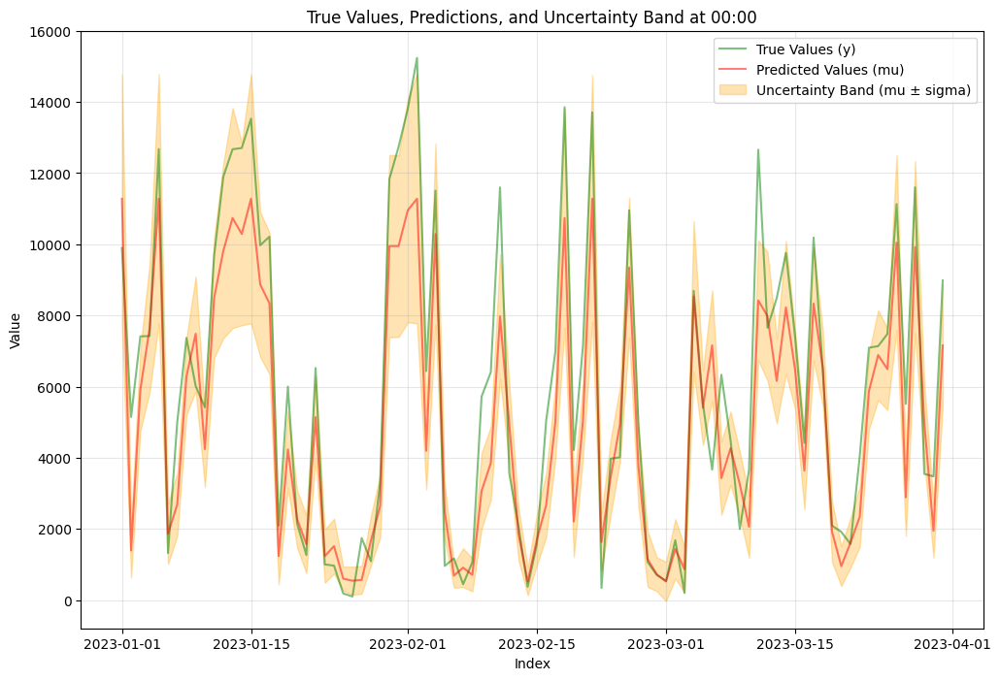

In [39]:
start = 0
end = 90
x = y_validation.index[start:end]
y = y_validation[start:end]
mu = y_val_pred[start:end]
sigma = [y.scale for y in y_val_dists][start:end]

# Plot
plt.figure(figsize=(12, 8))
plt.plot(x, y, label="True Values (y)", color="green", alpha=0.5)
plt.plot(x, mu, label="Predicted Values (mu)", color="red", alpha=0.5)
plt.fill_between(x, mu - sigma, mu + sigma, color="orange", alpha=0.3, label="Uncertainty Band (mu ± sigma)")

# Customize the plot
plt.xlabel("Index")
plt.ylabel("Value")
plt.title(f"True Values, Predictions, and Uncertainty Band at {time}")
plt.legend()
plt.grid(alpha=0.3)

In [42]:
loc = [y.loc for y in y_val_dists]
scale = [y.scale for y in y_val_dists]

In [43]:
_n = NormalCRPScore()
_n.loc = loc
_n.scale = scale
_n.total_score(y_validation)

761.8515615039604

In [3]:
df = load_entsoe()
df = df.rename(columns={"onshore": "power"})
df_daily = minute_to_daily(df)


df_daily_time = get_columns_by_time(df_daily, "00:00")
df_daily_time_delay = delay(df_daily_time, delays=1, columns="power") # delays "column"

# Step 1: Extract day of the year
df_daily_time_delay['day_of_year'] = df_daily_time_delay.index.dayofyear

# Step 2: Apply sine transformation for annual periodicity
df_daily_time_delay['sin_day'] = np.sin(2 * np.pi * df_daily_time_delay['day_of_year'] / 365)
df_daily_time_delay['cos_day'] = np.cos(2 * np.pi * df_daily_time_delay['day_of_year'] / 365)

df_daily_time_delay = df_daily_time_delay.drop(columns="day_of_year")


train, validation, test = to_train_validation_test_data(df_daily_time_delay, 
                                                        "2022-12-31", "2023-12-31")

X_train = train.drop(columns=['power'])
y_train = train['power']
X_validation = validation.drop(columns=['power'])
y_validation = validation['power']

Data loaded and transformed successfully. Shape of DataFrame: (78912, 22)
# of training observations: 2556 | 77.76%
# of validation observations: 365 | 11.10%
# of test observations: 366 | 11.13%


### Helper methods

### Hyperparameters

In [19]:
#seed = 42
n_estimators = 500
lr = 0.03
time = "09:00"

### Laden der entsoe daten (Aggregierte Powerdaten und Windgeschwindigkeitsdaten an den 10 größten Anlagenstandorten und am geographischen Zentrum gemessen an installierter Leistung)

In [20]:
df = load_entsoe()

df = df.drop(columns=["offshore"])
df = df.rename(columns={"onshore": "power"})
df_daily = minute_to_daily(df)
df_daily.head(5)

Data loaded and transformed successfully. Shape of DataFrame: (78912, 22)


,power_00_00,power_00_15,power_00_30,power_00_45,power_01_00,power_01_15,power_01_30,power_01_45,power_02_00,power_02_15,...,ws_100m_loc_mean_21_30,ws_100m_loc_mean_21_45,ws_100m_loc_mean_22_00,ws_100m_loc_mean_22_15,ws_100m_loc_mean_22_30,ws_100m_loc_mean_22_45,ws_100m_loc_mean_23_00,ws_100m_loc_mean_23_15,ws_100m_loc_mean_23_30,ws_100m_loc_mean_23_45
date,,,,,,,,,,,,,,,,,,,,,
2016-01-01,1428.0,1379.0,1399.0,1448.0,1517.0,1511.0,1539.0,1575.0,1628.0,1685.0,...,3.875,4.0325,4.19,4.3175,4.445,4.5725,4.70,4.8225,4.945,5.0675
2016-01-02,595.0,650.0,696.0,735.0,738.0,774.0,853.0,939.0,985.0,1030.0,...,9.155,8.9575,8.76,8.7625,8.765,8.7675,8.77,8.7700,8.770,8.7700
2016-01-03,6600.0,6634.0,6645.0,6644.0,6646.0,6764.0,6858.0,6846.0,6846.0,6847.0,...,9.085,8.6775,8.27,8.4350,8.600,8.7650,8.93,8.9275,8.925,8.9225
2016-01-04,5069.0,4983.0,4867.0,4754.0,4739.0,4644.0,4676.0,4629.0,4584.0,4394.0,...,6.785,6.5925,6.40,6.4000,6.400,6.4000,6.40,6.3750,6.350,6.3250
2016-01-05,2081.0,2115.0,2108.0,2082.0,2083.0,2045.0,2050.0,2116.0,2089.0,2010.0,...,5.470,5.4500,5.43,5.3975,5.365,5.3325,5.30,5.2725,5.245,5.2175


### Filtern auf ein bestimmtes Zeitintervall

In [21]:
df_daily_time = get_columns_by_time(df_daily, time)
df_daily_time.head(5)

,power,ws_10m_loc_1,ws_10m_loc_10,ws_10m_loc_2,ws_10m_loc_3,ws_10m_loc_4,ws_10m_loc_5,ws_10m_loc_6,ws_10m_loc_7,ws_10m_loc_8,...,ws_100m_loc_10,ws_100m_loc_2,ws_100m_loc_3,ws_100m_loc_4,ws_100m_loc_5,ws_100m_loc_6,ws_100m_loc_7,ws_100m_loc_8,ws_100m_loc_9,ws_100m_loc_mean
date,,,,,,,,,,,,,,,,,,,,,
2016-01-01,1080.0,2.53,3.14,2.92,2.52,2.42,2.19,2.25,2.56,2.46,...,5.41,5.29,5.44,4.92,5.10,5.09,5.09,4.49,5.10,5.06
2016-01-02,4600.0,6.17,5.20,4.80,5.81,5.83,5.32,5.36,5.33,6.04,...,7.90,7.22,9.05,8.82,8.49,8.47,8.19,8.93,8.00,7.91
2016-01-03,5673.0,6.50,5.45,5.46,6.65,5.82,6.17,6.10,5.85,6.26,...,8.20,8.26,9.99,8.77,9.60,9.46,8.93,9.35,9.04,8.71
2016-01-04,3262.0,5.97,4.41,4.51,6.05,4.28,5.62,5.51,5.10,5.60,...,7.08,7.20,9.34,6.60,8.80,8.66,8.04,8.62,7.85,7.83
2016-01-05,1863.0,4.20,4.06,4.04,4.82,4.26,4.71,4.60,4.51,3.91,...,5.94,6.03,7.14,6.41,7.13,6.92,6.70,5.64,6.92,6.70


### Add power of today, add annual periodicity

In [14]:
df_daily_time_delay = delay(df_daily_time, delays=1, columns="power") # delays "column"


# Step 1: Extract day of the year
df_daily_time_delay['day_of_year'] = df_daily_time_delay.index.dayofyear

# Step 2: Apply sine transformation for annual periodicity
df_daily_time_delay['sin_day'] = np.sin(2 * np.pi * df_daily_time_delay['day_of_year'] / 365)
df_daily_time_delay['cos_day'] = np.cos(2 * np.pi * df_daily_time_delay['day_of_year'] / 365)

#df_daily_time_delay = df_daily_time_delay.drop(columns="day_of_year")

df_daily_time_delay.head(60)


,power_t-1,offshore,power,ws_10m_loc_1,ws_10m_loc_10,ws_10m_loc_2,ws_10m_loc_3,ws_10m_loc_4,ws_10m_loc_5,ws_10m_loc_6,...,ws_100m_loc_4,ws_100m_loc_5,ws_100m_loc_6,ws_100m_loc_7,ws_100m_loc_8,ws_100m_loc_9,ws_100m_loc_mean,day_of_year,sin_day,cos_day
date,,,,,,,,,,,,,,,,,,,,,
2016-01-02,1428.0,208.0,595.0,2.72,1.68,2.64,3.14,3.11,3.21,3.11,...,5.20,5.87,5.65,4.87,4.52,5.32,5.19,2,0.034422,0.999407
2016-01-03,595.0,320.0,6600.0,6.02,5.40,5.30,6.82,5.49,6.48,6.41,...,8.20,9.73,9.61,8.88,9.47,8.93,8.77,3,0.051620,0.998667
2016-01-04,6600.0,319.0,5069.0,5.39,4.54,4.85,6.18,5.32,5.66,5.32,...,8.35,9.89,10.07,8.79,9.93,8.92,8.92,4,0.068802,0.997630
2016-01-05,5069.0,320.0,2081.0,4.30,3.40,3.52,4.62,3.77,4.31,4.30,...,5.73,7.17,6.94,6.40,7.40,6.56,6.30,5,0.085965,0.996298
2016-01-06,2081.0,170.0,1177.0,3.16,2.82,2.91,3.88,3.22,4.00,3.67,...,5.12,6.96,6.65,5.25,5.40,5.81,5.19,6,0.103102,0.994671
2016-01-07,1177.0,193.0,819.0,2.82,2.16,2.42,3.44,3.11,3.34,3.06,...,4.53,6.20,5.04,4.34,5.41,5.30,4.30,7,0.120208,0.992749
2016-01-08,819.0,332.0,7139.0,6.54,4.75,4.92,6.44,3.53,5.80,5.87,...,6.80,10.13,10.04,9.55,10.82,8.99,9.31,8,0.137279,0.990532
2016-01-09,7139.0,207.0,2151.0,4.10,2.73,2.33,2.11,1.77,1.94,2.25,...,4.83,5.24,5.76,5.99,8.40,5.64,5.73,9,0.154309,0.988023
2016-01-10,2151.0,219.0,3285.0,3.84,2.10,2.15,4.44,3.58,4.42,3.97,...,7.25,8.83,7.85,6.31,8.05,7.96,6.59,10,0.171293,0.985220


### Train, validation, test split, dropping power column in X_train, adding power column to y_train

In [23]:
train, validation, test = to_train_validation_test_data(df_daily_time_delay, 
                                                        "2022-12-31", "2023-12-31")

X_train = train.drop(columns=['power'])
y_train = train['power']
X_validation = validation.drop(columns=['power'])
y_validation = validation['power']

display(X_train.head(5))

display(y_train.head(5))

# of training observations: 2556 | 77.76%
# of validation observations: 365 | 11.10%
# of test observations: 366 | 11.13%


,power_t-1,ws_10m_loc_1,ws_10m_loc_10,ws_10m_loc_2,ws_10m_loc_3,ws_10m_loc_4,ws_10m_loc_5,ws_10m_loc_6,ws_10m_loc_7,ws_10m_loc_8,...,ws_100m_loc_3,ws_100m_loc_4,ws_100m_loc_5,ws_100m_loc_6,ws_100m_loc_7,ws_100m_loc_8,ws_100m_loc_9,ws_100m_loc_mean,sin_day,cos_day
date,,,,,,,,,,,,,,,,,,,,,
2016-01-02,1080.0,6.17,5.20,4.80,5.81,5.83,5.32,5.36,5.33,6.04,...,9.05,8.82,8.49,8.47,8.19,8.93,8.00,7.91,0.034422,0.999407
2016-01-03,4600.0,6.50,5.45,5.46,6.65,5.82,6.17,6.10,5.85,6.26,...,9.99,8.77,9.60,9.46,8.93,9.35,9.04,8.71,0.051620,0.998667
2016-01-04,5673.0,5.97,4.41,4.51,6.05,4.28,5.62,5.51,5.10,5.60,...,9.34,6.60,8.80,8.66,8.04,8.62,7.85,7.83,0.068802,0.997630
2016-01-05,3262.0,4.20,4.06,4.04,4.82,4.26,4.71,4.60,4.51,3.91,...,7.14,6.41,7.13,6.92,6.70,5.64,6.92,6.70,0.085965,0.996298
2016-01-06,1863.0,3.79,2.88,2.92,4.03,3.31,3.74,3.71,3.38,3.59,...,5.92,4.80,5.73,5.53,4.93,5.08,5.08,4.97,0.103102,0.994671


date
2016-01-02    4600.0
2016-01-03    5673.0
2016-01-04    3262.0
2016-01-05    1863.0
2016-01-06    1074.0
Name: power, dtype: float64

### Train model using NGBoost

In [24]:
model = NGBRegressor(Dist=Normal, Score=CRPScore, n_estimators=n_estimators, learning_rate=lr, verbose_eval=True)

model.fit(X_train, y_train, X_val=X_validation, Y_val=y_validation)

# Predict on training data
y_train_pred = model.predict(X_train)
y_train_dists = model.pred_dist(X_train)


y_val_pred = model.predict(X_validation)
y_val_dists = model.pred_dist(X_validation)

# Calculate Mean Squared Error (MSE) for training and validation
train_mse = mean_squared_error(y_train, y_train_pred)
val_mse = mean_squared_error(y_validation, y_val_pred)

# Print the results
print(f"Training features: {[c for c in X_train.columns]} -> {y_train.name}")
print(f"Train MSE:\t {train_mse}")
print(f"Validation MSE:\t {val_mse}")

[iter 0] loss=1863.8893 val_loss=2198.2288 scale=512.0000 norm=451.8419
[iter 1] loss=1854.5974 val_loss=2187.5781 scale=512.0000 norm=450.4168
[iter 2] loss=1845.3773 val_loss=2176.9783 scale=512.0000 norm=448.9956
[iter 3] loss=1836.2285 val_loss=2166.5086 scale=512.0000 norm=447.5820
[iter 4] loss=1827.1501 val_loss=2156.0910 scale=512.0000 norm=446.1713
[iter 5] loss=1818.1417 val_loss=2145.7680 scale=512.0000 norm=444.7665
[iter 6] loss=1809.1827 val_loss=2135.5004 scale=512.0000 norm=443.3719
[iter 7] loss=1800.3105 val_loss=2125.3349 scale=512.0000 norm=441.9757
[iter 8] loss=1791.4868 val_loss=2115.2101 scale=512.0000 norm=440.5847
[iter 9] loss=1782.7488 val_loss=2105.2193 scale=512.0000 norm=439.2018
[iter 10] loss=1774.0588 val_loss=2095.3850 scale=512.0000 norm=437.8301
[iter 11] loss=1765.3486 val_loss=2085.4911 scale=512.0000 norm=436.4260
[iter 12] loss=1756.8052 val_loss=2075.8005 scale=512.0000 norm=435.0588
[iter 13] loss=1748.2227 val_loss=2066.2006 scale=512.0000 no

In [25]:
pd.DataFrame({'y': y_validation,'mu': y_val_pred, "sigma": [y.scale for y in y_val_dists]})

,y,mu,sigma
date,,,
2023-01-01,7680.0,10377.876581,3946.543539
2023-01-02,9751.0,8565.976504,2392.114700
2023-01-03,3640.0,2740.656018,576.968916
2023-01-04,14492.0,10387.889335,3956.604124
2023-01-05,14153.0,10309.281254,3507.495491
...,...,...,...
2023-12-27,1994.0,2346.965636,472.457999
2023-12-28,11945.0,9464.895881,3072.714531
2023-12-29,13606.0,10607.184206,3966.478799


In [27]:
loc = [y.loc for y in y_val_dists]
scale = [y.scale for y in y_val_dists]

In [12]:
_n = NormalCRPScore()
_n.loc = loc
_n.scale = scale
_n.total_score(y_validation)

574.8347657209481

In [13]:
import numpy as np

In [14]:
loc = [y.loc for y in y_val_dists]
scale = [y.scale for y in y_val_dists]


In [15]:
_n = NormalCRPScore()
_n.loc = loc
_n.scale = scale
_n.total_score(y_validation)

574.8347657209481

### TBD

In [5]:
import properscoring as ps
np.mean(ps.crps_gaussian(y_validation, mu=loc, sig=scale))

1755.4278997069448

In [9]:
loss_df = pd.DataFrame(ps.crps_gaussian(y_validation, mu=loc, sig=scale), index=y_validation.index, columns=["crps_loss"])
loss_df.describe()

,crps_loss
count,365.000000
mean,1755.427900
std,1555.987619
min,367.829779
25%,730.453842
50%,1208.774684
75%,2114.916867
max,8392.319063


In [17]:
import numpy as np
from sktime.performance_metrics.forecasting.probabilistic import CRPS
from scipy.stats import norm
from sktime.forecasting.probabilistic import Normal


ModuleNotFoundError: No module named 'sktime.forecasting.probabilistic'

(365,)

In [119]:
samples.shape

(1000, 365)

In [123]:
pd.DataFrame(y_validation.to_numpy()).T

,0,1,2,3,4,5,6,7,8,9,...,355,356,357,358,359,360,361,362,363,364
0,9898.0,5146.0,7413.0,7421.0,12678.0,1323.0,4996.0,7371.0,6015.0,5418.0,...,14762.0,13977.0,5527.0,12419.0,7872.0,9581.0,11063.0,11821.0,11653.0,4106.0


In [ ]:
forecast_distributions = norm(loc=loc, scale=scale)

samples = forecast_distributions.rvs(size=(1000, 365))

crps_metric = CRPS()
crps_metric.evaluate(pd.DataFrame(y_validation.to_numpy()).T, pd.DataFrame(samples).T)


AttributeError: 'DataFrame' object has no attribute 'energy'

In [89]:
forecast_distributions = norm(loc=loc, scale=scale)

# Instantiate CRPS metric
crps_metric = CRPS()
crps_metric.evaluate(y_validation, forecast_distributions)


AttributeError: 'rv_continuous_frozen' object has no attribute 'columns'

In [ ]:
forecast_distributions = norm(loc=loc, scale=scale)

# Instantiate CRPS metric
crps_metric = CRPS()

# Compute CRPS for each forecast distribution against true values
crps_values = []
for i, true_value in enumerate(y_validation):
    forecast = forecast_distributions[i]
    # CRPS is computed between the true value and the forecast distribution
    crps_value = crps_metric(true_value, forecast)
    crps_values.append(crps_value)

# Print CRPS scores
print("CRPS scores:", crps_values)


In [ ]:
from sktime.performance_metrics.forecasting.probabilistic import CRPS
CRPS().evaluate(y_validation, y_val_pred)

c:\Users\Manuel\Documents\Masterarbeit\.venv\Lib\site-packages\dask\dataframe\__init__.py:49: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


AttributeError: 'numpy.ndarray' object has no attribute 'columns'

In [78]:
from sktime.performance_metrics.forecasting.probabilistic import PinballLoss

In [ ]:
pd.DataFrame({'y': y_validation,'mu': y_val_pred, "sigma": [y.scale for y in y_val_dists]})

,y,mu,sigma
date,,,
2023-01-01,9898.0,11355.741723,3643.693987
2023-01-02,5146.0,3598.534031,563.249819
2023-01-03,7413.0,6535.339356,806.604846
2023-01-04,7421.0,5896.972327,927.667911
2023-01-05,12678.0,11355.741723,3643.693987
...,...,...,...
2023-12-27,9581.0,8720.680208,1802.492838
2023-12-28,11063.0,9720.946554,2389.575028
2023-12-29,11821.0,10778.038468,3317.067313


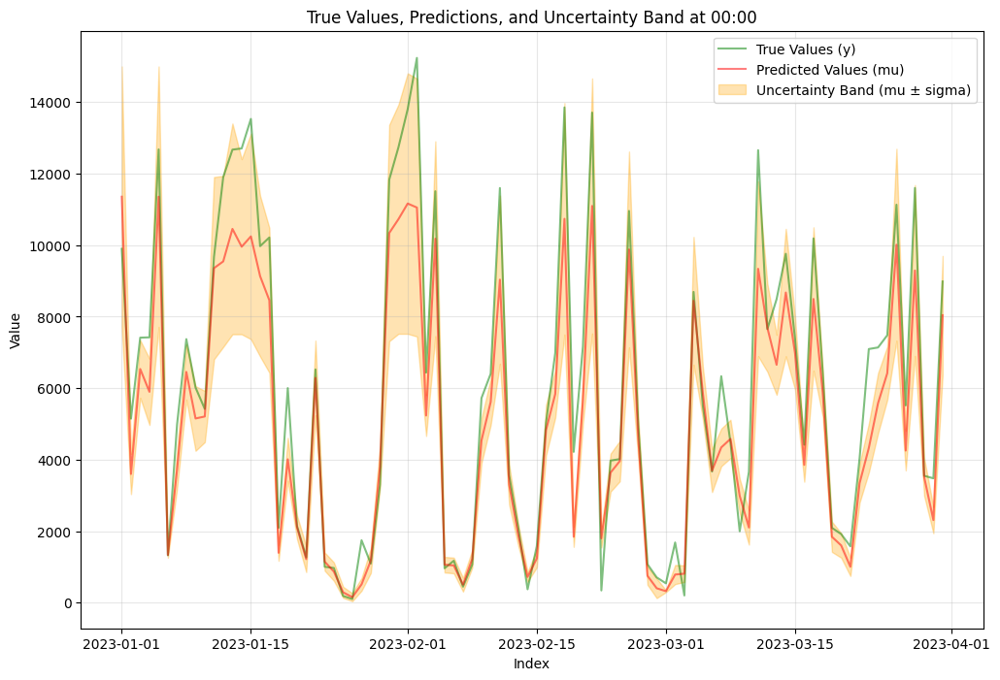

In [58]:
start = 0
end = 90
x = y_validation.index[start:end]
y = y_validation[start:end]
mu = y_val_pred[start:end]
sigma = [y.scale for y in y_val_dists][start:end]

# Plot
plt.figure(figsize=(12, 8))
plt.plot(x, y, label="True Values (y)", color="green", alpha=0.5)
plt.plot(x, mu, label="Predicted Values (mu)", color="red", alpha=0.5)
plt.fill_between(x, mu - sigma, mu + sigma, color="orange", alpha=0.3, label="Uncertainty Band (mu ± sigma)")

# Customize the plot
plt.xlabel("Index")
plt.ylabel("Value")
plt.title(f"True Values, Predictions, and Uncertainty Band at {time}")
plt.legend()
plt.grid(alpha=0.3)

In [ ]:
time = "00:00"
delays = 1
columns = "power"

df_daily_time = get_columns_by_time(df_daily, time) #filters for a specific time interval

display(df_daily_time)

df_daily_time_delay = delay(df_daily_time, delays=delays, columns=columns) # delays "column"

display(df_daily_time_delay)

# Move the second column (target variable) to the last position
target_col = df_daily_time_delay.columns[1]  # Get the name of the second column (target variable)
df_daily_time_delay = df_daily_time_delay[[col for col in df_daily_time_delay.columns if col != target_col] + [target_col]]

train, validation, test = to_train_validation_test_data(df_daily_time_delay, 
                                                        "2022-12-31", "2023-12-31")

model = NGBRegressor(Dist=Normal, Score=CRPScore)

#X_train, y_train = train.iloc[:, :-1], train.iloc[:, -1]
#X_val, y_val = validation.iloc[:, :-1], train.iloc[:, -1]





model.fit(X, y);
y_pred = model.predict(X)
y_dists = model.pred_dist(X)
train_mse = mean_squared_error(y, y_pred)
val_mse = mean_squared_error(validation.iloc[:, -1], model.predict(validation.iloc[:, :-1]))

print()
print(f"{[c for c in X.columns]} -> {y.name}")
print("Train MSE:\t", train_mse)
print("Validation MSE:\t", val_mse)

,power,ws_10m_loc_1,ws_10m_loc_10,ws_10m_loc_2,ws_10m_loc_3,ws_10m_loc_4,ws_10m_loc_5,ws_10m_loc_6,ws_10m_loc_7,ws_10m_loc_8,...,ws_100m_loc_10,ws_100m_loc_2,ws_100m_loc_3,ws_100m_loc_4,ws_100m_loc_5,ws_100m_loc_6,ws_100m_loc_7,ws_100m_loc_8,ws_100m_loc_9,ws_100m_loc_mean
date,,,,,,,,,,,,,,,,,,,,,
2016-01-01,1428.0,1.90,2.48,2.41,1.97,2.48,1.80,1.80,1.86,2.20,...,5.05,5.16,4.86,5.71,5.00,4.47,4.33,4.27,5.02,4.52
2016-01-02,595.0,2.72,1.68,2.64,3.14,3.11,3.21,3.11,2.63,2.65,...,2.42,3.86,5.39,5.20,5.87,5.65,4.87,4.52,5.32,5.19
2016-01-03,6600.0,6.02,5.40,5.30,6.82,5.49,6.48,6.41,5.93,5.66,...,8.00,8.01,10.19,8.20,9.73,9.61,8.88,9.47,8.93,8.77
2016-01-04,5069.0,5.39,4.54,4.85,6.18,5.32,5.66,5.32,5.22,5.50,...,8.98,9.37,10.38,8.35,9.89,10.07,8.79,9.93,8.92,8.92
2016-01-05,2081.0,4.30,3.40,3.52,4.62,3.77,4.31,4.30,4.10,4.14,...,5.31,5.41,7.47,5.73,7.17,6.94,6.40,7.40,6.56,6.30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-12-27,101.0,1.06,0.30,1.11,1.14,1.47,1.25,0.67,0.54,1.27,...,0.86,1.67,2.30,3.08,2.36,1.77,1.04,2.61,1.92,0.91
2024-12-28,57.0,1.63,1.48,1.64,1.70,0.55,1.55,1.38,0.75,1.91,...,2.95,3.13,2.11,0.25,2.00,2.16,1.76,3.49,1.49,2.19
2024-12-29,1527.0,2.53,2.55,2.64,2.40,2.28,2.15,1.92,1.85,2.59,...,6.54,5.82,5.78,6.35,5.49,5.16,4.70,5.35,5.66,4.05


,power_t-1,power,ws_10m_loc_1,ws_10m_loc_10,ws_10m_loc_2,ws_10m_loc_3,ws_10m_loc_4,ws_10m_loc_5,ws_10m_loc_6,ws_10m_loc_7,...,ws_100m_loc_10,ws_100m_loc_2,ws_100m_loc_3,ws_100m_loc_4,ws_100m_loc_5,ws_100m_loc_6,ws_100m_loc_7,ws_100m_loc_8,ws_100m_loc_9,ws_100m_loc_mean
date,,,,,,,,,,,,,,,,,,,,,
2016-01-02,1428.0,595.0,2.72,1.68,2.64,3.14,3.11,3.21,3.11,2.63,...,2.42,3.86,5.39,5.20,5.87,5.65,4.87,4.52,5.32,5.19
2016-01-03,595.0,6600.0,6.02,5.40,5.30,6.82,5.49,6.48,6.41,5.93,...,8.00,8.01,10.19,8.20,9.73,9.61,8.88,9.47,8.93,8.77
2016-01-04,6600.0,5069.0,5.39,4.54,4.85,6.18,5.32,5.66,5.32,5.22,...,8.98,9.37,10.38,8.35,9.89,10.07,8.79,9.93,8.92,8.92
2016-01-05,5069.0,2081.0,4.30,3.40,3.52,4.62,3.77,4.31,4.30,4.10,...,5.31,5.41,7.47,5.73,7.17,6.94,6.40,7.40,6.56,6.30
2016-01-06,2081.0,1177.0,3.16,2.82,2.91,3.88,3.22,4.00,3.67,3.32,...,4.11,4.35,6.76,5.12,6.96,6.65,5.25,5.40,5.81,5.19
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-12-27,784.0,101.0,1.06,0.30,1.11,1.14,1.47,1.25,0.67,0.54,...,0.86,1.67,2.30,3.08,2.36,1.77,1.04,2.61,1.92,0.91
2024-12-28,101.0,57.0,1.63,1.48,1.64,1.70,0.55,1.55,1.38,0.75,...,2.95,3.13,2.11,0.25,2.00,2.16,1.76,3.49,1.49,2.19
2024-12-29,57.0,1527.0,2.53,2.55,2.64,2.40,2.28,2.15,1.92,1.85,...,6.54,5.82,5.78,6.35,5.49,5.16,4.70,5.35,5.66,4.05


# of training observations: 2556 | 77.76%
# of validation observations: 365 | 11.10%
# of test observations: 366 | 11.13%
[iter 0] loss=1735.1167 val_loss=0.0000 scale=512.0000 norm=449.1209
[iter 100] loss=1464.4111 val_loss=0.0000 scale=512.0000 norm=404.7802
[iter 200] loss=1251.6164 val_loss=0.0000 scale=512.0000 norm=366.5694
[iter 300] loss=1077.7116 val_loss=0.0000 scale=512.0000 norm=334.6166
[iter 400] loss=931.5457 val_loss=0.0000 scale=512.0000 norm=309.9416

['power_t-1', 'ws_10m_loc_1', 'ws_10m_loc_10', 'ws_10m_loc_2', 'ws_10m_loc_3', 'ws_10m_loc_4', 'ws_10m_loc_5', 'ws_10m_loc_6', 'ws_10m_loc_7', 'ws_10m_loc_8', 'ws_10m_loc_9', 'ws_10m_loc_mean', 'ws_100m_loc_1', 'ws_100m_loc_10', 'ws_100m_loc_2', 'ws_100m_loc_3', 'ws_100m_loc_4', 'ws_100m_loc_5', 'ws_100m_loc_6', 'ws_100m_loc_7', 'ws_100m_loc_8', 'ws_100m_loc_9', 'ws_100m_loc_mean'] -> power
Train MSE:	 2535800.446696702
Validation MSE:	 4445597.381172124


In [ ]:
pd.DataFrame({'y': y,'mu': y_pred, "sigma": [y.scale for y in y_dists]})

,y,mu,sigma
date,,,
2016-01-02,595.0,1856.457628,1745.596623
2016-01-03,6600.0,5991.965861,2895.204422
2016-01-04,5069.0,6380.133049,3296.416554
2016-01-05,2081.0,3080.449931,1719.860772
2016-01-06,1177.0,2327.722807,1719.860772
...,...,...,...
2022-12-27,6675.0,5639.306261,3007.657099
2022-12-28,7484.0,6176.152023,2479.380237
2022-12-29,9979.0,6981.874313,4135.109246


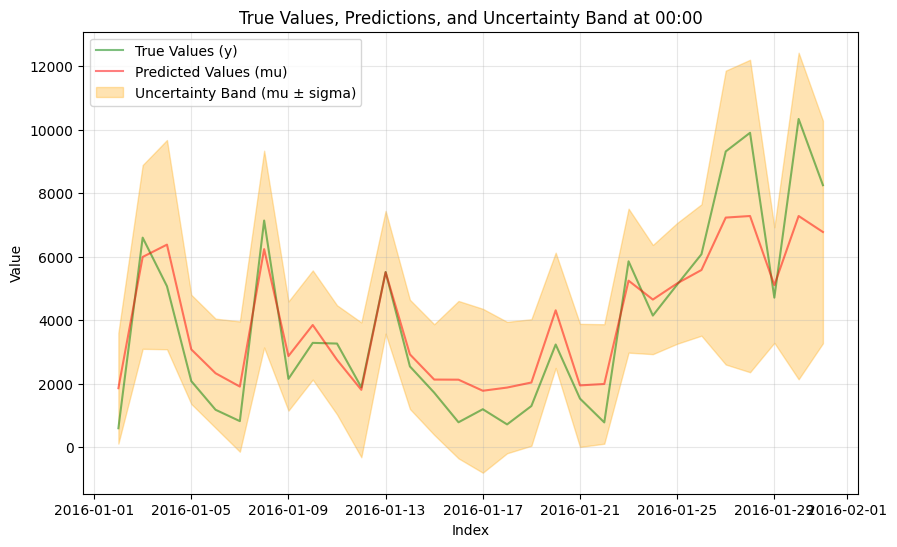

In [ ]:
start = 0
end = 30
x = y.index[start:end]
y = y[start:end]
mu = y_pred[start:end]
sigma = [y.scale for y in y_dists][start:end]
# Plot
plt.figure(figsize=(10, 6))
plt.plot(x, y, label="True Values (y)", color="green", alpha=0.5)
plt.plot(x, mu, label="Predicted Values (mu)", color="red", alpha=0.5)
plt.fill_between(x, mu - sigma, mu + sigma, color="orange", alpha=0.3, label="Uncertainty Band (mu ± sigma)")

# Customize the plot
plt.xlabel("Index")
plt.ylabel("Value")
plt.title(f"True Values, Predictions, and Uncertainty Band at {time}")
plt.legend()
plt.grid(alpha=0.3)

In [8]:
df_daily_time = get_columns_by_time(df_daily, "00:00")
df_daily_time

,power,ws_10m_loc_1,ws_10m_loc_10,ws_10m_loc_2,ws_10m_loc_3,ws_10m_loc_4,ws_10m_loc_5,ws_10m_loc_6,ws_10m_loc_7,ws_10m_loc_8,...,ws_100m_loc_10,ws_100m_loc_2,ws_100m_loc_3,ws_100m_loc_4,ws_100m_loc_5,ws_100m_loc_6,ws_100m_loc_7,ws_100m_loc_8,ws_100m_loc_9,ws_100m_loc_mean
date,,,,,,,,,,,,,,,,,,,,,
2016-01-01,1428.0,1.90,2.48,2.41,1.97,2.48,1.80,1.80,1.86,2.20,...,5.05,5.16,4.86,5.71,5.00,4.47,4.33,4.27,5.02,4.52
2016-01-02,595.0,2.72,1.68,2.64,3.14,3.11,3.21,3.11,2.63,2.65,...,2.42,3.86,5.39,5.20,5.87,5.65,4.87,4.52,5.32,5.19
2016-01-03,6600.0,6.02,5.40,5.30,6.82,5.49,6.48,6.41,5.93,5.66,...,8.00,8.01,10.19,8.20,9.73,9.61,8.88,9.47,8.93,8.77
2016-01-04,5069.0,5.39,4.54,4.85,6.18,5.32,5.66,5.32,5.22,5.50,...,8.98,9.37,10.38,8.35,9.89,10.07,8.79,9.93,8.92,8.92
2016-01-05,2081.0,4.30,3.40,3.52,4.62,3.77,4.31,4.30,4.10,4.14,...,5.31,5.41,7.47,5.73,7.17,6.94,6.40,7.40,6.56,6.30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-12-27,101.0,1.06,0.30,1.11,1.14,1.47,1.25,0.67,0.54,1.27,...,0.86,1.67,2.30,3.08,2.36,1.77,1.04,2.61,1.92,0.91
2024-12-28,57.0,1.63,1.48,1.64,1.70,0.55,1.55,1.38,0.75,1.91,...,2.95,3.13,2.11,0.25,2.00,2.16,1.76,3.49,1.49,2.19
2024-12-29,1527.0,2.53,2.55,2.64,2.40,2.28,2.15,1.92,1.85,2.59,...,6.54,5.82,5.78,6.35,5.49,5.16,4.70,5.35,5.66,4.05


In [9]:
df_daily_time_delay = delay(df_daily_time, 1, "power")
df_daily_time_delay

,power_t-1,power,ws_10m_loc_1,ws_10m_loc_10,ws_10m_loc_2,ws_10m_loc_3,ws_10m_loc_4,ws_10m_loc_5,ws_10m_loc_6,ws_10m_loc_7,...,ws_100m_loc_10,ws_100m_loc_2,ws_100m_loc_3,ws_100m_loc_4,ws_100m_loc_5,ws_100m_loc_6,ws_100m_loc_7,ws_100m_loc_8,ws_100m_loc_9,ws_100m_loc_mean
date,,,,,,,,,,,,,,,,,,,,,
2016-01-02,1428.0,595.0,2.72,1.68,2.64,3.14,3.11,3.21,3.11,2.63,...,2.42,3.86,5.39,5.20,5.87,5.65,4.87,4.52,5.32,5.19
2016-01-03,595.0,6600.0,6.02,5.40,5.30,6.82,5.49,6.48,6.41,5.93,...,8.00,8.01,10.19,8.20,9.73,9.61,8.88,9.47,8.93,8.77
2016-01-04,6600.0,5069.0,5.39,4.54,4.85,6.18,5.32,5.66,5.32,5.22,...,8.98,9.37,10.38,8.35,9.89,10.07,8.79,9.93,8.92,8.92
2016-01-05,5069.0,2081.0,4.30,3.40,3.52,4.62,3.77,4.31,4.30,4.10,...,5.31,5.41,7.47,5.73,7.17,6.94,6.40,7.40,6.56,6.30
2016-01-06,2081.0,1177.0,3.16,2.82,2.91,3.88,3.22,4.00,3.67,3.32,...,4.11,4.35,6.76,5.12,6.96,6.65,5.25,5.40,5.81,5.19
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-12-27,784.0,101.0,1.06,0.30,1.11,1.14,1.47,1.25,0.67,0.54,...,0.86,1.67,2.30,3.08,2.36,1.77,1.04,2.61,1.92,0.91
2024-12-28,101.0,57.0,1.63,1.48,1.64,1.70,0.55,1.55,1.38,0.75,...,2.95,3.13,2.11,0.25,2.00,2.16,1.76,3.49,1.49,2.19
2024-12-29,57.0,1527.0,2.53,2.55,2.64,2.40,2.28,2.15,1.92,1.85,...,6.54,5.82,5.78,6.35,5.49,5.16,4.70,5.35,5.66,4.05


In [ ]:
train, validation, test = to_train_validation_test_data(df_daily_time_delay, "2022-12-31", "2023-12-31")

In [7]:
load_wind_park_data().index.max()

Data loaded and transformed successfully. Shape of DataFrame: (78192, 22)


Timestamp('2024-12-01 23:00:00')

In [ ]:
# Example usage
wind_park_data = load_wind_park_data()
display(wind_park_data.head(3))
electricity_data = load_entsoe()
display(electricity_data.head(3))

merged_df = process_and_merge_dataframes(wind_park_data, electricity_data)
merged_df = merged_df.dropna()
display(merged_df.head(3))

time = "09:30"
df_time = get_columns_by_time(merged_df, time)
display(df_time.head(3))
df_time.columns = [c[:-6] for c in df_time.columns]
display(df_time.head(3))

train, validation, test = to_train_validation_test_data(df_time, "2023-01-01", "2024-01-01")

def transform(df):
    df = df.copy()
    df["onshore_m1"] = df["onshore"].shift(1)
    df = df.dropna()
    y = df["onshore"]
    X = df.drop(columns=["onshore"])
    return X, y

X_train, y_train = transform(train)
X_val, y_val = transform(validation)


from ngboost.scores import LogScore, CRPScore
from ngboost.distns import Normal

model = NGBRegressor(Dist=Normal, Score=CRPScore)

model.fit(X_train, y_train)

y_preds = model.predict(X_train)
y_dists = model.pred_dist(X_train)

# train Mean Squared Error
mse = mean_squared_error(y_preds, y_train)
print('train MSE', mse)

# train Negative Log Likelihood
nll = -y_dists.logpdf(y_train).mean()
print('train NLL', nll)

pd.DataFrame({"y": y_train, "mu": y_preds, "sigma": [y.scale for y in y_dists]})


start = 0
end = 30
x = y_train.index[start:end]
y = y_train[start:end]
mu = y_preds[start:end]
sigma = [y.scale for y in y_dists][start:end]
# Plot
plt.figure(figsize=(10, 6))
plt.plot(x, y, label="True Values (y)", color="green", alpha=0.5)
plt.plot(x, mu, label="Predicted Values (mu)", color="red", alpha=0.5)
plt.fill_between(x, mu - sigma, mu + sigma, color="orange", alpha=0.3, label="Uncertainty Band (mu ± sigma)")

# Customize the plot
plt.xlabel("Index")
plt.ylabel("Value")
plt.title(f"True Values, Predictions, and Uncertainty Band at {time}")
plt.legend()
plt.grid(alpha=0.3)


y_preds = model.predict(X_val)
y_dists = model.pred_dist(X_val)

# val Mean Squared Error
val_mse = mean_squared_error(y_preds, y_val)
print('Val MSE', val_mse)

# val Negative Log Likelihood
val_nll = -y_dists.logpdf(y_val).mean()
print('Val NLL', val_nll)


start = 0
end = 30
x = y_val.index[start:end]
y = y_val[start:end]
mu = y_preds[start:end]
sigma = [y.scale for y in y_dists][start:end]
# Plot
plt.figure(figsize=(10, 6))
plt.plot(x, y, label="True Values (y)", color="green", alpha=0.5)
plt.plot(x, mu, label="Predicted Values (mu)", color="red", alpha=0.5)
plt.fill_between(x, mu - sigma, mu + sigma, color="orange", alpha=0.3, label="Uncertainty Band (mu ± sigma)")

# Customize the plot
plt.xlabel("Index")
plt.ylabel("Value")
plt.title(f"True Values, Predictions, and Uncertainty Band at {time}")
plt.legend()
plt.grid(alpha=0.3)


In [2]:
# Example usage
wind_park_data = load_wind_park_data()
display(wind_park_data.head(3))
electricity_data = load_entsoe()
display(electricity_data.head(3))

merged_df = process_and_merge_dataframes(wind_park_data, electricity_data)
merged_df = merged_df.dropna()
display(merged_df.head(3))


Data loaded and transformed successfully. Shape of DataFrame: (78192, 22)


,wind_speed_10m_51.84534_13.656307,wind_speed_10m_51.98594_13.045872,wind_speed_10m_52.26713_11.312384,wind_speed_10m_mean,wind_speed_10m_52.618626_12.761193,wind_speed_10m_52.829525_11.6510315,wind_speed_10m_52.97012_12.372882,wind_speed_10m_53.110718_12.079395,wind_speed_10m_53.18102_11.761364,wind_speed_10m_53.321613_13.859315,...,wind_speed_100m_51.98594_13.045872,wind_speed_100m_52.26713_11.312384,wind_speed_100m_mean,wind_speed_100m_52.618626_12.761193,wind_speed_100m_52.829525_11.6510315,wind_speed_100m_52.97012_12.372882,wind_speed_100m_53.110718_12.079395,wind_speed_100m_53.18102_11.761364,wind_speed_100m_53.321613_13.859315,wind_speed_100m_53.46221_13.7404585
time,,,,,,,,,,,,,,,,,,,,,
2016-01-01 00:00:00,2.48,2.41,2.48,1.94,1.86,1.84,1.80,1.97,1.80,1.90,...,5.16,5.71,4.52,4.33,5.02,4.47,4.86,5.00,3.72,4.27
2016-01-01 01:00:00,2.77,2.55,2.62,2.00,2.00,2.05,1.78,1.94,1.72,2.02,...,5.50,5.97,4.69,4.47,5.24,4.48,4.72,4.83,3.86,4.38
2016-01-01 02:00:00,2.75,2.62,2.64,2.12,2.12,2.06,1.91,2.06,1.84,1.90,...,5.49,5.87,4.97,4.80,5.32,4.65,4.84,4.94,3.98,4.33


,offshore,onshore
time,,
2016-01-01 00:00:00,21.0,1428.0
2016-01-01 00:15:00,27.0,1379.0
2016-01-01 00:30:00,24.0,1399.0


,wind_speed_10m_mean_00_00,wind_speed_10m_mean_00_15,wind_speed_10m_mean_00_30,wind_speed_10m_mean_00_45,wind_speed_10m_mean_01_00,wind_speed_10m_mean_01_15,wind_speed_10m_mean_01_30,wind_speed_10m_mean_01_45,wind_speed_10m_mean_02_00,wind_speed_10m_mean_02_15,...,onshore_21_30,onshore_21_45,onshore_22_00,onshore_22_15,onshore_22_30,onshore_22_45,onshore_23_00,onshore_23_15,onshore_23_30,onshore_23_45
date,,,,,,,,,,,,,,,,,,,,,
2016-01-01,1.94,1.9550,1.970,1.9850,2.00,2.030,2.06,2.090,2.12,2.1225,...,316.0,350.0,359.0,385.0,425.0,432.0,467.0,503.0,509.0,528.0
2016-01-02,2.83,2.8250,2.820,2.8150,2.81,2.835,2.86,2.885,2.91,2.9975,...,6813.0,6809.0,6785.0,6760.0,6790.0,6771.0,6700.0,6682.0,6672.0,6721.0
2016-01-03,5.83,5.8325,5.835,5.8375,5.84,5.840,5.84,5.840,5.84,5.8425,...,5377.0,5335.0,5253.0,5296.0,5265.0,5255.0,5255.0,5239.0,5234.0,5220.0


In [3]:
time = "09:30"
df_time = get_columns_by_time(merged_df, time)
display(df_time.head(3))
df_time.columns = [c[:-6] for c in df_time.columns]
display(df_time.head(3))

,wind_speed_10m_mean_09_30,wind_speed_100m_mean_09_30,onshore_09_30
date,,,
2016-01-01,2.110,4.205,951.0
2016-01-02,5.175,7.930,4758.0
2016-01-03,5.515,8.310,5702.0


,wind_speed_10m_mean,wind_speed_100m_mean,onshore
date,,,
2016-01-01,2.110,4.205,951.0
2016-01-02,5.175,7.930,4758.0
2016-01-03,5.515,8.310,5702.0


In [4]:
df_time.index.min(), df_time.index.max(), df_time.count()

(Timestamp('2016-01-01 00:00:00'),
 Timestamp('2024-10-10 00:00:00'),
 wind_speed_10m_mean     3206
 wind_speed_100m_mean    3206
 onshore                 3206
 dtype: int64)

In [5]:
train, validation, test = to_train_validation_test_data(df_time, "2023-01-01", "2024-01-01")

# of training observations: 2557 | 79.76%
# of validation observations: 365 | 11.38%
# of test observations: 284 | 8.86%


In [6]:
print("train:", train.index.min(), train.index.max())
print("val:", validation.index.min(), validation.index.max())
print("test:", test.index.min(), test.index.max())

train: 2016-01-01 00:00:00 2022-12-31 00:00:00
val: 2023-01-01 00:00:00 2023-12-31 00:00:00
test: 2024-01-01 00:00:00 2024-10-10 00:00:00


In [7]:
def transform(df):
    df = df.copy()
    df["onshore_m1"] = df["onshore"].shift(1)
    df = df.dropna()
    y = df["onshore"]
    X = df.drop(columns=["onshore"])
    return X, y


In [8]:
X_train, y_train = transform(train)
X_val, y_val = transform(validation)

In [9]:
from ngboost.scores import LogScore, CRPScore
from ngboost.distns import Normal

In [10]:
model = NGBRegressor(Dist=Normal, Score=CRPScore)

In [11]:
model.fit(X_train, y_train)

[iter 0] loss=1870.1748 val_loss=0.0000 scale=512.0000 norm=452.6658
[iter 100] loss=1592.7554 val_loss=0.0000 scale=512.0000 norm=408.7787
[iter 200] loss=1377.0597 val_loss=0.0000 scale=512.0000 norm=371.7943
[iter 300] loss=1204.5239 val_loss=0.0000 scale=512.0000 norm=342.1967
[iter 400] loss=1062.7566 val_loss=0.0000 scale=512.0000 norm=320.2085


NGBRegressor(Score=<class 'ngboost.scores.CRPScore'>,
             random_state=RandomState(MT19937) at 0x1DBA1B07C40)

In [12]:
y_preds = model.predict(X_train)
y_dists = model.pred_dist(X_train)

# train Mean Squared Error
mse = mean_squared_error(y_preds, y_train)
print('train MSE', mse)

# train Negative Log Likelihood
nll = -y_dists.logpdf(y_train).mean()
print('train NLL', nll)

train MSE 3437941.611170776
train NLL 8.867858751943569


In [13]:
X_train

,wind_speed_10m_mean,wind_speed_100m_mean,onshore_m1
date,,,
2016-01-02,5.175,7.930,951.0
2016-01-03,5.515,8.310,4758.0
2016-01-04,4.930,7.640,5702.0
2016-01-05,4.450,6.600,3013.0
2016-01-06,3.515,5.110,1721.0
...,...,...,...
2022-12-27,6.345,10.280,7328.0
2022-12-28,6.250,10.715,11375.0
2022-12-29,6.585,11.150,10855.0


In [14]:
y_train

date
2016-01-02     4758.0
2016-01-03     5702.0
2016-01-04     3013.0
2016-01-05     1721.0
2016-01-06      938.0
               ...   
2022-12-27    11375.0
2022-12-28    10855.0
2022-12-29    10845.0
2022-12-30     5340.0
2022-12-31     9537.0
Name: onshore, Length: 2556, dtype: float64

In [15]:
pd.DataFrame({"y": y_train, "mu": y_preds, "sigma": [y.scale for y in y_dists]})

,y,mu,sigma
date,,,
2016-01-02,4758.0,5105.597505,2905.974637
2016-01-03,5702.0,5315.674441,2827.082496
2016-01-04,3013.0,4875.120328,2716.734554
2016-01-05,1721.0,3556.078437,2016.026979
2016-01-06,938.0,2272.014272,1984.849518
...,...,...,...
2022-12-27,11375.0,6670.793475,4719.812541
2022-12-28,10855.0,6888.354059,4884.320687
2022-12-29,10845.0,6888.354059,5363.197565


results for train

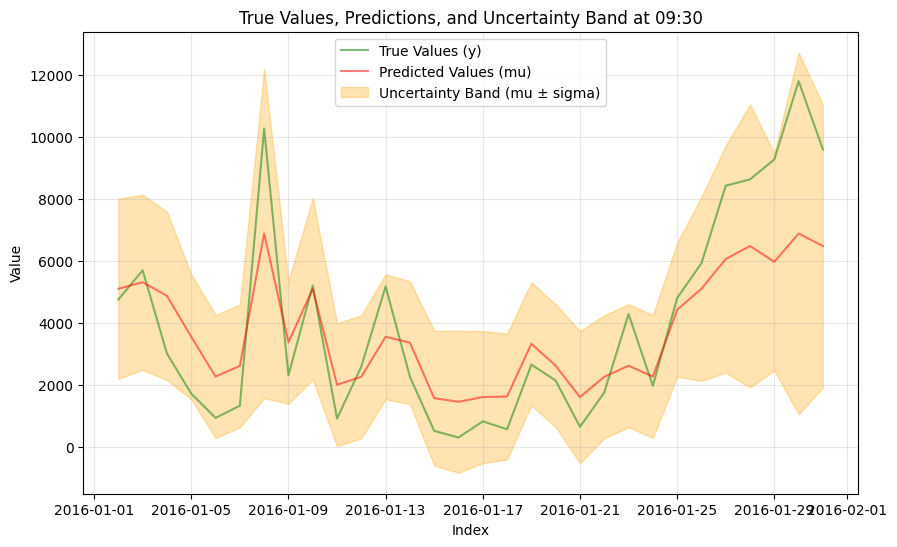

In [16]:
start = 0
end = 30
x = y_train.index[start:end]
y = y_train[start:end]
mu = y_preds[start:end]
sigma = [y.scale for y in y_dists][start:end]
# Plot
plt.figure(figsize=(10, 6))
plt.plot(x, y, label="True Values (y)", color="green", alpha=0.5)
plt.plot(x, mu, label="Predicted Values (mu)", color="red", alpha=0.5)
plt.fill_between(x, mu - sigma, mu + sigma, color="orange", alpha=0.3, label="Uncertainty Band (mu ± sigma)")

# Customize the plot
plt.xlabel("Index")
plt.ylabel("Value")
plt.title(f"True Values, Predictions, and Uncertainty Band at {time}")
plt.legend()
plt.grid(alpha=0.3)

Results for val

In [17]:
y_preds = model.predict(X_val)
y_dists = model.pred_dist(X_val)

# val Mean Squared Error
val_mse = mean_squared_error(y_preds, y_val)
print('Val MSE', val_mse)

# val Negative Log Likelihood
val_nll = -y_dists.logpdf(y_val).mean()
print('Val NLL', val_nll)

Val MSE 5880431.0927422475
Val NLL 8.986781121261618


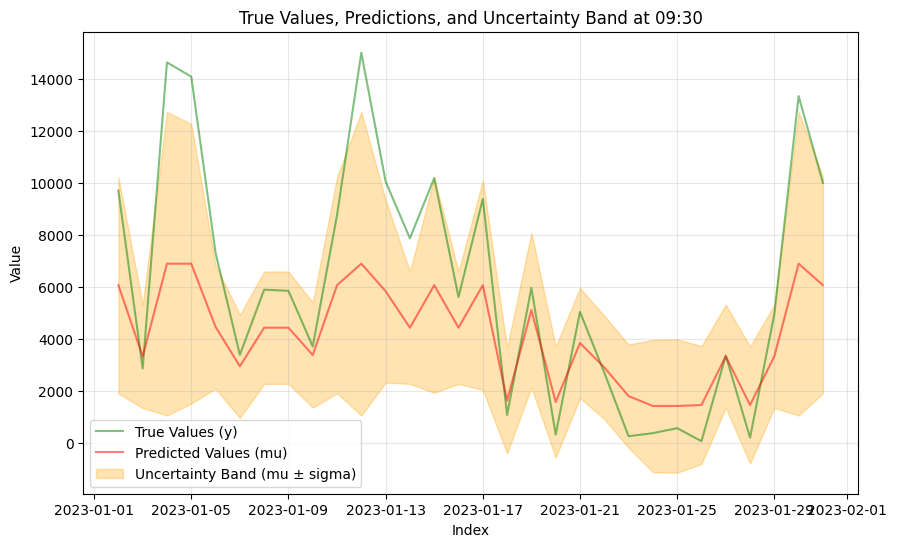

In [18]:
start = 0
end = 30
x = y_val.index[start:end]
y = y_val[start:end]
mu = y_preds[start:end]
sigma = [y.scale for y in y_dists][start:end]
# Plot
plt.figure(figsize=(10, 6))
plt.plot(x, y, label="True Values (y)", color="green", alpha=0.5)
plt.plot(x, mu, label="Predicted Values (mu)", color="red", alpha=0.5)
plt.fill_between(x, mu - sigma, mu + sigma, color="orange", alpha=0.3, label="Uncertainty Band (mu ± sigma)")

# Customize the plot
plt.xlabel("Index")
plt.ylabel("Value")
plt.title(f"True Values, Predictions, and Uncertainty Band at {time}")
plt.legend()
plt.grid(alpha=0.3)